# Preprocessing

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
data = pd.read_excel(r'/content/BA_AirlineReviews_CL_excel.xlsx',header=0)

data.head()

,id,Satisfaction,ReviewHeader,Name,Datetime,VerifiedReview,ReviewBody,TypeOfTraveller,SeatType,Route,DateFlown,SeatComfort,CabinStaffService,GroundService,ValueForMoney,Recommended,Aircraft,Food&Beverages,InflightEntertainment,Wifi&Connectivity
0,0,Very Dissatisfied,"""Service level far worse then Ryanair""",L Keele,19th November 2023,True,4 Hours before takeoff we received a Mail stat...,Couple Leisure,Economy Class,London to Stuttgart,2023-11-01,1.0,1.0,1.0,1.0,no,NaN,NaN,NaN,NaN
1,1,Neutral,"""do not upgrade members based on status""",Austin Jones,19th November 2023,True,I recently had a delay on British Airways from...,Business,Economy Class,Brussels to London,2023-11-01,2.0,3.0,1.0,2.0,no,A320,1.0,2.0,2.0
2,2,Enthusiastic,"""Flight was smooth and quick""",M A Collie,16th November 2023,False,"Boarded on time, but it took ages to get to th...",Couple Leisure,Business Class,London Heathrow to Dublin,2023-11-01,3.0,3.0,4.0,3.0,yes,A320,4.0,NaN,NaN
3,3,Very Dissatisfied,"""Absolutely hopeless airline""",Nigel Dean,16th November 2023,True,"5 days before the flight, we were advised by B...",Couple Leisure,Economy Class,London to Dublin,2022-12-01,3.0,3.0,1.0,1.0,no,NaN,NaN,NaN,NaN
4,4,Very Dissatisfied,"""Customer Service is non existent""",Gaylynne Simpson,14th November 2023,False,"We traveled to Lisbon for our dream vacation, ...",Couple Leisure,Economy Class,London to Lisbon,2023-11-01,1.0,1.0,1.0,1.0,no,NaN,1.0,1.0,1.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3701 entries, 0 to 3700
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     3701 non-null   int64         
 1   Satisfaction           3701 non-null   object        
 2   ReviewHeader           3701 non-null   object        
 3   Name                   3701 non-null   object        
 4   Datetime               3701 non-null   object        
 5   VerifiedReview         3701 non-null   bool          
 6   ReviewBody             3701 non-null   object        
 7   TypeOfTraveller        2930 non-null   object        
 8   SeatType               3699 non-null   object        
 9   Route                  2926 non-null   object        
 10  DateFlown              2923 non-null   datetime64[ns]
 11  SeatComfort            3585 non-null   float64       
 12  CabinStaffService      3574 non-null   float64       
 13  Gro

In [ ]:
from sklearn.impute import KNNImputer

numeric_missing_col = data.columns[(data.isnull().any()) & (data.dtypes != 'object')].to_list()

impNumeric = KNNImputer(n_neighbors=5)
for col in numeric_missing_col:
    numeric = data[[col]].values
    impNumeric = impNumeric.fit(numeric)
    numeric = impNumeric.transform(numeric)
    numeric = numeric.round()
    data[col] = numeric

data.isnull().sum()

id                          0
Satisfaction                0
ReviewHeader                0
Name                        0
Datetime                    0
VerifiedReview              0
ReviewBody                  0
TypeOfTraveller           771
SeatType                    2
Route                     775
DateFlown                   0
SeatComfort                 0
CabinStaffService           0
GroundService               0
ValueForMoney               0
Recommended                 0
Aircraft                 1779
Food&Beverages              0
InflightEntertainment       0
Wifi&Connectivity           0
dtype: int64

In [ ]:
nominal_missing_col = data.columns[(data.isnull().any()) & (data.dtypes == 'object')].to_list()
for col in nominal_missing_col:
    data[col].fillna("Unknown", inplace=True)

data.isnull().sum()

id                       0
Satisfaction             0
ReviewHeader             0
Name                     0
Datetime                 0
VerifiedReview           0
ReviewBody               0
TypeOfTraveller          0
SeatType                 0
Route                    0
DateFlown                0
SeatComfort              0
CabinStaffService        0
GroundService            0
ValueForMoney            0
Recommended              0
Aircraft                 0
Food&Beverages           0
InflightEntertainment    0
Wifi&Connectivity        0
dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, OneHotEncoder

encoder = OneHotEncoder(sparse_output=False)
categorical_col = ['TypeOfTraveller', 'SeatType']
for col in categorical_col:
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out([col]))
    data = pd.concat([data, encoded_df], axis=1)
    data = data.drop([col], axis=1)

lbenc = LabelEncoder()
for i in data.columns.values:
    if (data[i].dtypes == "object" or data[i].dtypes == "bool") and i != "Satisfaction":
        data[i] = lbenc.fit_transform(data[i].astype(str))

satisfaction_order = [
    "Very Dissatisfied",
    "Dissatisfied",
    "Neutral",
    "Satisfied",
    "Very Satisfied",
    "Enthusiastic",
    "Extremely Satisfied",
    "Delighted",
    "Evangelist",
    "Advocate"
]

ordinal_enc = OrdinalEncoder(categories=[satisfaction_order])
data["Satisfaction"] = ordinal_enc.fit_transform(data[["Satisfaction"]])

data.head()

,id,Satisfaction,ReviewHeader,Name,Datetime,VerifiedReview,ReviewBody,Route,DateFlown,SeatComfort,...,TypeOfTraveller_Business,TypeOfTraveller_Couple Leisure,TypeOfTraveller_Family Leisure,TypeOfTraveller_Solo Leisure,TypeOfTraveller_Unknown,SeatType_Business Class,SeatType_Economy Class,SeatType_First Class,SeatType_Premium Economy,SeatType_Unknown
0,0,0.0,483,1590,595,1,25,1044,1.698797e+18,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,2.0,1128,254,595,1,1649,143,1.698797e+18,2.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2,5.0,264,1660,406,0,372,824,1.698797e+18,3.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,3,0.0,37,2009,406,1,28,946,1.669853e+18,3.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,4,0.0,222,1013,295,0,3603,976,1.698797e+18,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
data.describe()

,id,Satisfaction,ReviewHeader,Name,Datetime,VerifiedReview,ReviewBody,Route,DateFlown,SeatComfort,...,TypeOfTraveller_Business,TypeOfTraveller_Couple Leisure,TypeOfTraveller_Family Leisure,TypeOfTraveller_Solo Leisure,TypeOfTraveller_Unknown,SeatType_Business Class,SeatType_Economy Class,SeatType_First Class,SeatType_Premium Economy,SeatType_Unknown
count,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3.701000e+03,3701.000000,...,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.000000,3701.00000,3701.000000,3701.000000,3701.000000
mean,1850.000000,3.627668,1665.487166,1396.319643,905.066739,0.311537,1845.307755,924.593083,-7.329317e+17,2.879222,...,0.173196,0.270197,0.107539,0.240746,0.208322,0.323696,0.52067,0.057552,0.097541,0.000540
std,1068.531001,3.094761,869.403991,838.782534,527.062164,0.463184,1065.214398,468.600891,4.381454e+18,1.340735,...,0.378468,0.444122,0.309839,0.427594,0.406163,0.467949,0.49964,0.232926,0.296733,0.023243
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.223372e+18,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,925.000000,1.000000,897.000000,655.000000,457.000000,0.000000,923.000000,563.000000,1.438387e+18,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,1850.000000,3.000000,1804.000000,1354.000000,888.000000,0.000000,1847.000000,962.000000,1.483229e+18,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.000000
75%,2775.000000,6.000000,2609.000000,2136.000000,1373.000000,1.000000,2767.000000,1454.000000,1.551398e+18,4.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.00000,0.000000,0.000000,0.000000
max,3700.000000,9.000000,2684.000000,2901.000000,1819.000000,1.000000,3691.000000,1542.000000,1.698797e+18,5.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000


In [ ]:
data.drop(['id', 'Name', 'ReviewHeader', 'ReviewBody', 'Route', 'Aircraft', 'DateFlown', 'Datetime'], inplace=True, axis = 1)
data.columns.to_list()

['Satisfaction',
 'VerifiedReview',
 'SeatComfort',
 'CabinStaffService',
 'GroundService',
 'ValueForMoney',
 'Recommended',
 'Food&Beverages',
 'InflightEntertainment',
 'Wifi&Connectivity',
 'TypeOfTraveller_Business',
 'TypeOfTraveller_Couple Leisure',
 'TypeOfTraveller_Family Leisure',
 'TypeOfTraveller_Solo Leisure',
 'TypeOfTraveller_Unknown',
 'SeatType_Business Class',
 'SeatType_Economy Class',
 'SeatType_First Class',
 'SeatType_Premium Economy',
 'SeatType_Unknown']

In [ ]:
from sklearn.model_selection import train_test_split

features = data.drop(['Satisfaction'], axis=1)
label = data['Satisfaction']

x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=0.1, random_state=42, stratify=label, shuffle=True)

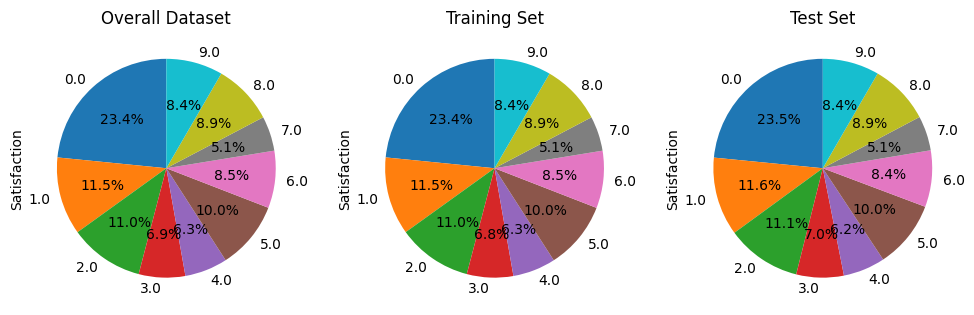

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

sorted_train = s_train['Satisfaction'].value_counts().sort_index()
sorted_test = s_test['Satisfaction'].value_counts().sort_index()
sorted_data = data['Satisfaction'].value_counts().sort_index()

# Create a pie chart for the overall dataset
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 2)
plt.title('Training Set')
sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

plt.subplot(1, 3, 3)
plt.title('Test Set')
sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

plt.subplot(1, 3, 1)
plt.title('Overall Dataset')
sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,1.000000,-0.053196,-0.042544,-0.055706,-0.094923,-0.072955,0.000019,0.060171,0.065903,0.078334,0.040597,0.076577,0.157712,-0.341139,0.023674,0.016246,-0.039935,-0.032269,-0.016451
1,-0.053196,1.000000,0.594581,0.476571,0.680494,0.641432,0.581483,0.437649,0.235556,-0.130733,-0.050030,-0.013271,0.052451,0.129975,0.020035,-0.105862,0.146022,0.035192,-0.034311
2,-0.042544,0.594581,1.000000,0.462598,0.645761,0.649522,0.663100,0.359542,0.218784,-0.121094,-0.015043,-0.008890,0.026215,0.106949,0.099310,-0.122863,0.110052,-0.036092,-0.004066
3,-0.055706,0.476571,0.462598,1.000000,0.591288,0.553304,0.396400,0.258803,0.218779,-0.131688,0.009200,-0.022326,0.059440,0.065211,0.058713,-0.091635,0.054343,0.020390,-0.015922
4,-0.094923,0.680494,0.645761,0.591288,1.000000,0.799057,0.644759,0.389409,0.211914,-0.179549,-0.053717,-0.038004,0.038518,0.212387,0.037194,-0.059308,0.059412,-0.003146,-0.028076
5,-0.072955,0.641432,0.649522,0.553304,0.799057,1.000000,0.650527,0.394026,0.211953,-0.171770,-0.050867,-0.020437,0.048071,0.178671,0.075868,-0.087849,0.038319,-0.000280,-0.020242
6,0.000019,0.581483,0.663100,0.396400,0.644759,0.650527,1.000000,0.452487,0.242445,-0.139504,-0.026110,-0.022162,0.038569,0.133114,0.105001,-0.132810,0.089439,-0.011279,-0.013350
7,0.060171,0.437649,0.359542,0.258803,0.389409,0.394026,0.452487,1.000000,0.321332,-0.071616,0.036818,0.011061,0.068508,-0.055329,0.015413,-0.049379,0.067047,0.006732,-0.005325
8,0.065903,0.235556,0.218784,0.218779,0.211914,0.211953,0.242445,0.321332,1.000000,-0.036935,-0.004702,0.026599,-0.001429,0.020382,0.049410,-0.054080,-0.009725,0.020665,0.000974
9,0.078334,-0.130733,-0.121094,-0.131688,-0.179549,-0.171770,-0.139504,-0.071616,-0.036935,1.000000,-0.276494,-0.155063,-0.253058,-0.229964,0.119343,-0.097501,0.003640,-0.026426,-0.010987


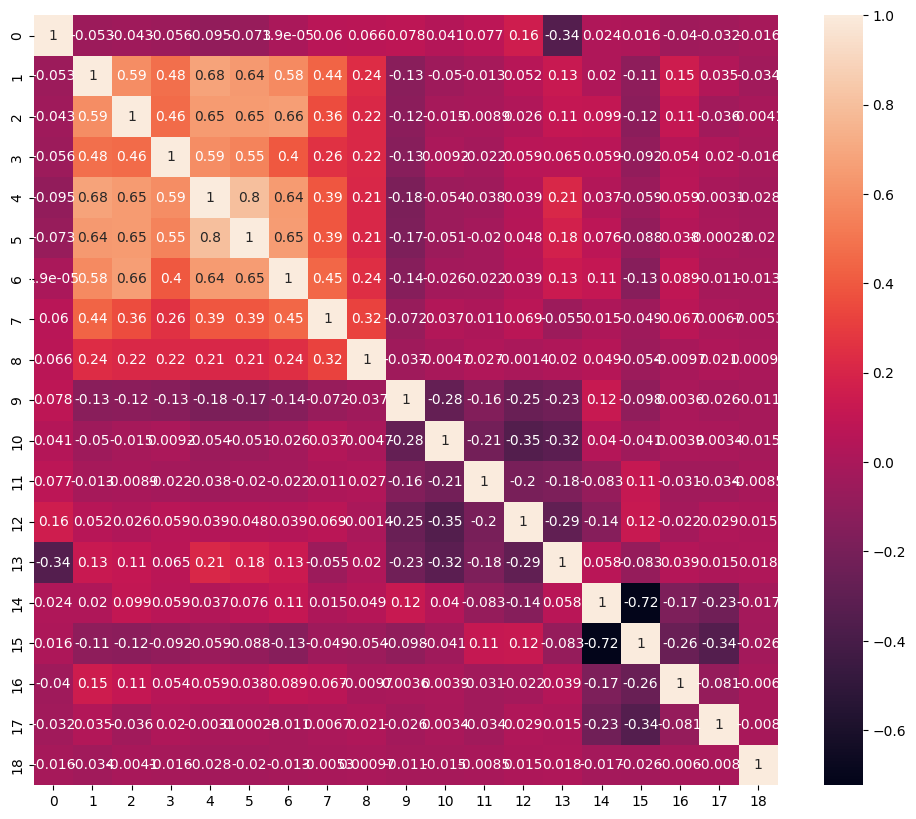

In [ ]:
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

correlation_matrix = pd.DataFrame(x_train).corr()
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True ,ax=ax)
correlation_matrix

In [ ]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = pd.DataFrame(dataset, columns=col).corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:  # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [ ]:
upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
print(to_drop)

x_train = x_train.drop(x_train.columns[to_drop], axis=1)
x_test = x_test.drop(x_test.columns[to_drop], axis=1)

[]


# Developing model

(Best Train Accuracy is on Two Hidden Layer using Experiment 6 which has 0.508108 accuracy, while Best Test Accuracy is on Three Hidden Layer which has 0.434360)

## Default

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


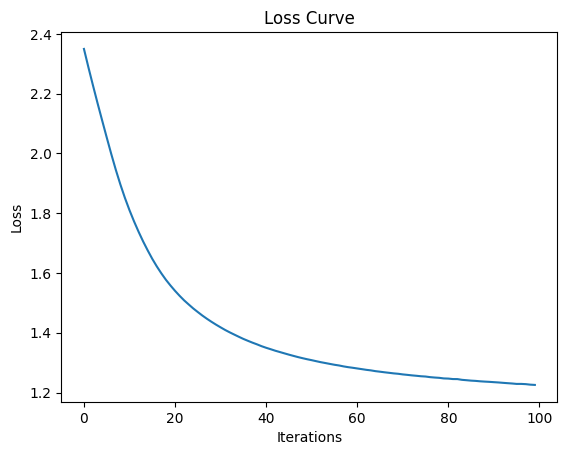

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

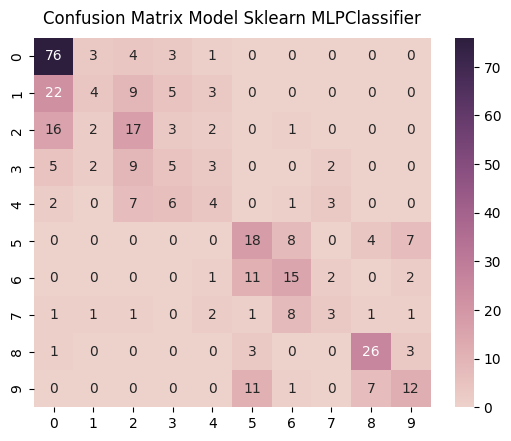

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

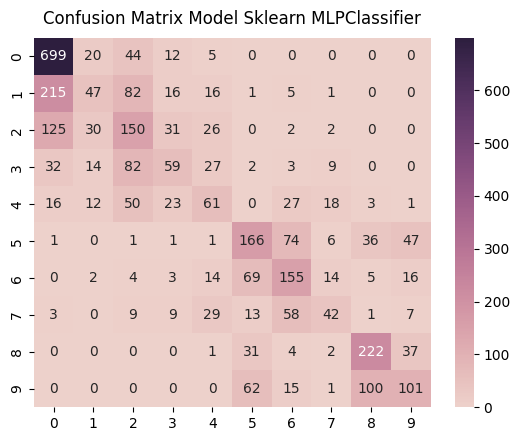

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

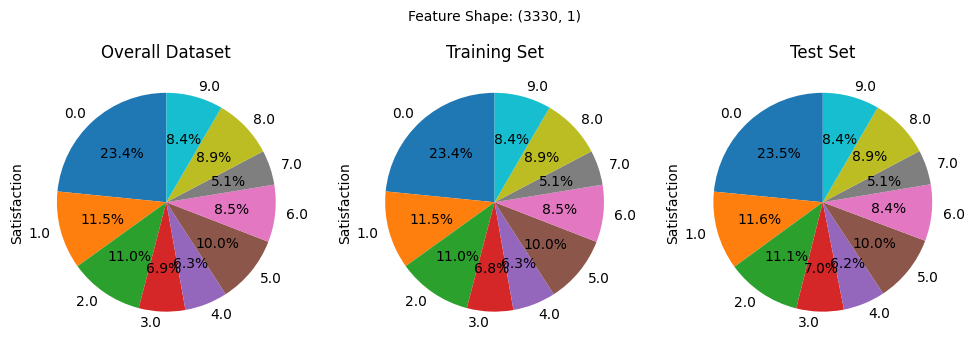

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


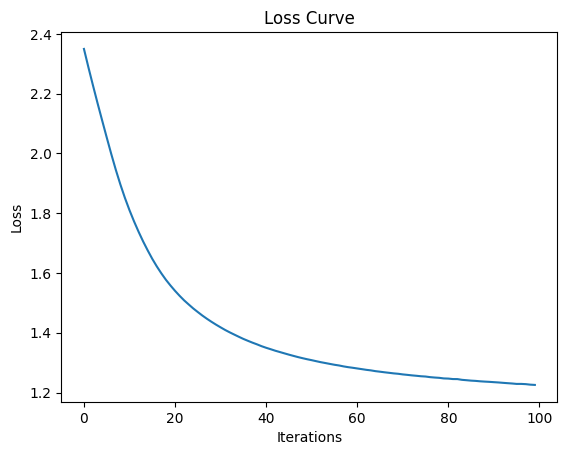

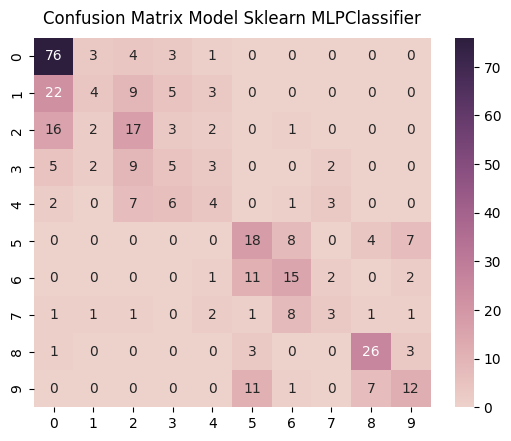

              precision    recall  f1-score     support
0.0            0.617886  0.873563  0.723810   87.000000
1.0            0.333333  0.093023  0.145455   43.000000
2.0            0.361702  0.414634  0.386364   41.000000
3.0            0.227273  0.192308  0.208333   26.000000
4.0            0.250000  0.173913  0.205128   23.000000
5.0            0.409091  0.486486  0.444444   37.000000
6.0            0.441176  0.483871  0.461538   31.000000
7.0            0.300000  0.157895  0.206897   19.000000
8.0            0.684211  0.787879  0.732394   33.000000
9.0            0.480000  0.387097  0.428571   31.000000
accuracy       0.485175  0.485175  0.485175    0.485175
macro avg      0.410467  0.405067  0.394293  371.000000
weighted avg   0.448922  0.485175  0.451050  371.000000
Mean Squared Error:  2.8274932614555257


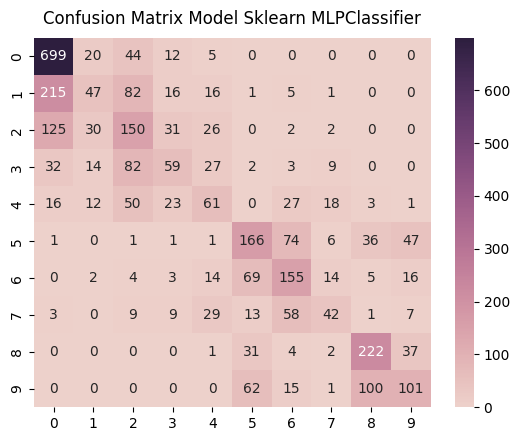

              precision    recall  f1-score      support
0.0            0.640697  0.896154  0.747194   780.000000
1.0            0.376000  0.122715  0.185039   383.000000
2.0            0.355450  0.409836  0.380711   366.000000
3.0            0.383117  0.258772  0.308901   228.000000
4.0            0.338889  0.289100  0.312020   211.000000
5.0            0.482558  0.498498  0.490399   333.000000
6.0            0.451895  0.549645  0.496000   282.000000
7.0            0.442105  0.245614  0.315789   171.000000
8.0            0.604905  0.747475  0.668675   297.000000
9.0            0.483254  0.362007  0.413934   279.000000
accuracy       0.511111  0.511111  0.511111     0.511111
macro avg      0.455887  0.437982  0.431866  3330.000000
weighted avg   0.483758  0.511111  0.480644  3330.000000
Mean Squared Error:  2.260960960960961


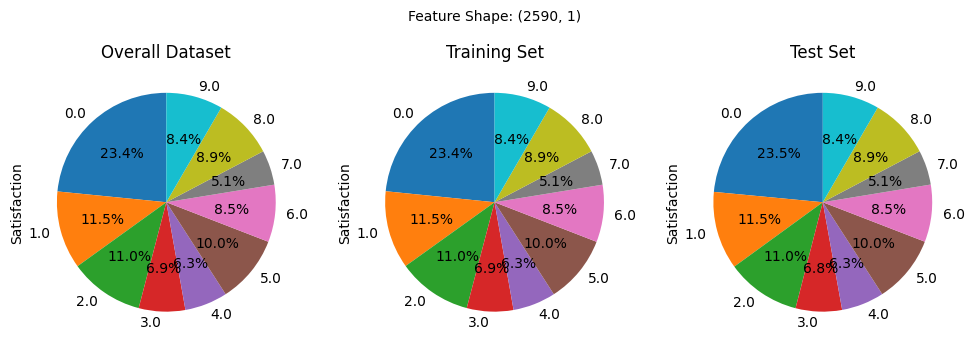

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


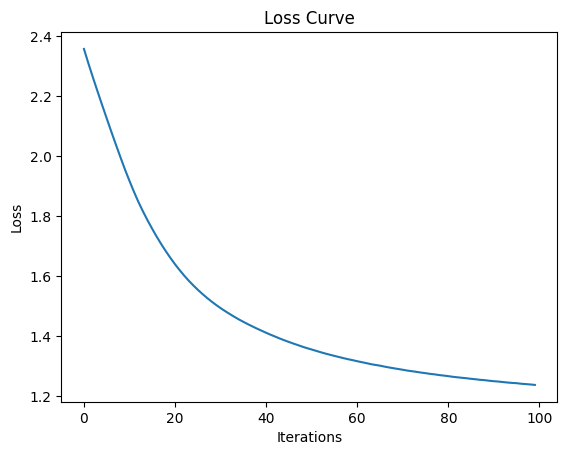

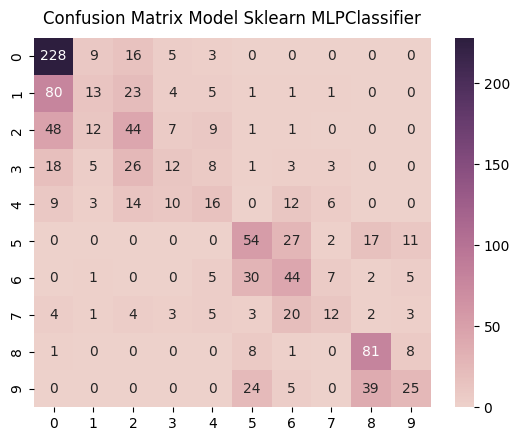

              precision    recall  f1-score      support
0.0            0.587629  0.873563  0.702619   261.000000
1.0            0.295455  0.101562  0.151163   128.000000
2.0            0.346457  0.360656  0.353414   122.000000
3.0            0.292683  0.157895  0.205128    76.000000
4.0            0.313725  0.228571  0.264463    70.000000
5.0            0.442623  0.486486  0.463519   111.000000
6.0            0.385965  0.468085  0.423077    94.000000
7.0            0.387097  0.210526  0.272727    57.000000
8.0            0.574468  0.818182  0.675000    99.000000
9.0            0.480769  0.268817  0.344828    93.000000
accuracy       0.476148  0.476148  0.476148     0.476148
macro avg      0.410687  0.397434  0.385594  1111.000000
weighted avg   0.438094  0.476148  0.437093  1111.000000
Mean Squared Error:  2.6093609360936094


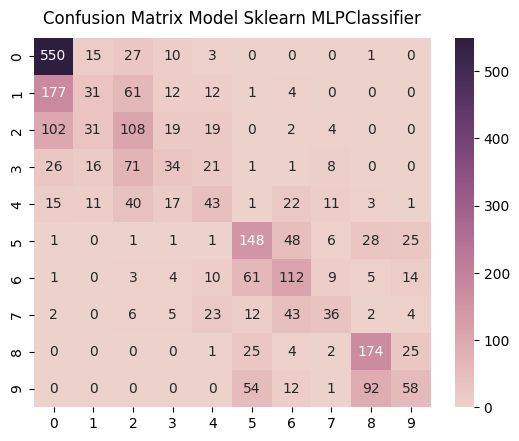

              precision    recall  f1-score      support
0.0            0.629291  0.907591  0.743243   606.000000
1.0            0.298077  0.104027  0.154229   298.000000
2.0            0.340694  0.378947  0.358804   285.000000
3.0            0.333333  0.191011  0.242857   178.000000
4.0            0.323308  0.262195  0.289562   164.000000
5.0            0.488449  0.571429  0.526690   259.000000
6.0            0.451613  0.511416  0.479657   219.000000
7.0            0.467532  0.270677  0.342857   133.000000
8.0            0.570492  0.753247  0.649254   231.000000
9.0            0.456693  0.267281  0.337209   217.000000
accuracy       0.499614  0.499614  0.499614     0.499614
macro avg      0.435948  0.421782  0.412436  2590.000000
weighted avg   0.462591  0.499614  0.463147  2590.000000
Mean Squared Error:  2.294980694980695


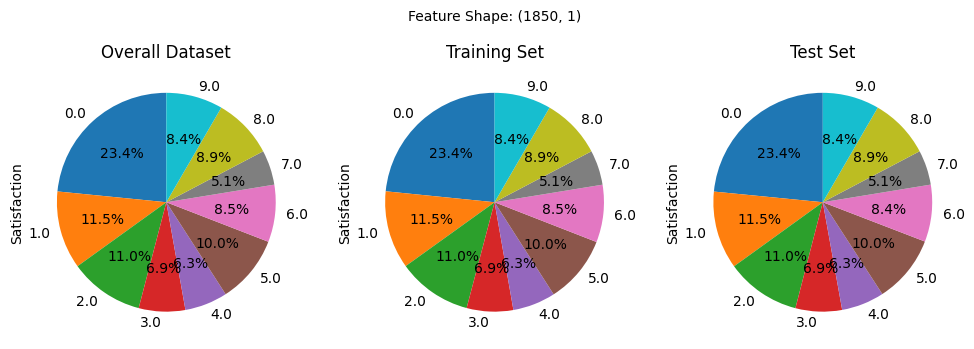

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


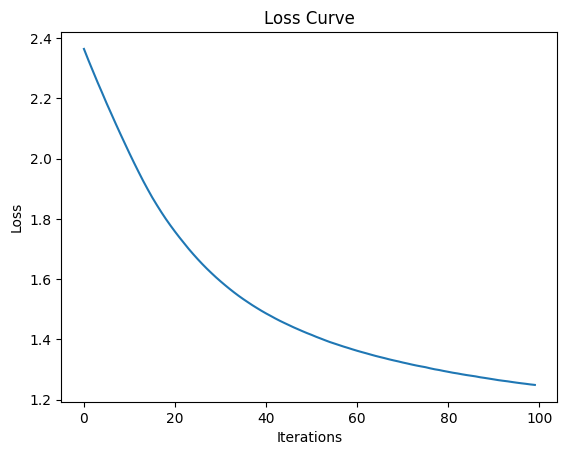

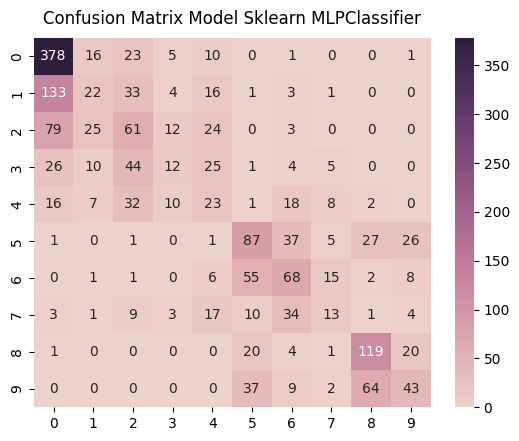

              precision    recall  f1-score      support
0.0            0.593407  0.870968  0.705882   434.000000
1.0            0.268293  0.103286  0.149153   213.000000
2.0            0.299020  0.299020  0.299020   204.000000
3.0            0.260870  0.094488  0.138728   127.000000
4.0            0.188525  0.196581  0.192469   117.000000
5.0            0.410377  0.470270  0.438287   185.000000
6.0            0.375691  0.435897  0.403561   156.000000
7.0            0.260000  0.136842  0.179310    95.000000
8.0            0.553488  0.721212  0.626316   165.000000
9.0            0.421569  0.277419  0.334630   155.000000
accuracy       0.446245  0.446245  0.446245     0.446245
macro avg      0.363124  0.360598  0.346736  1851.000000
weighted avg   0.403441  0.446245  0.408181  1851.000000
Mean Squared Error:  2.792544570502431


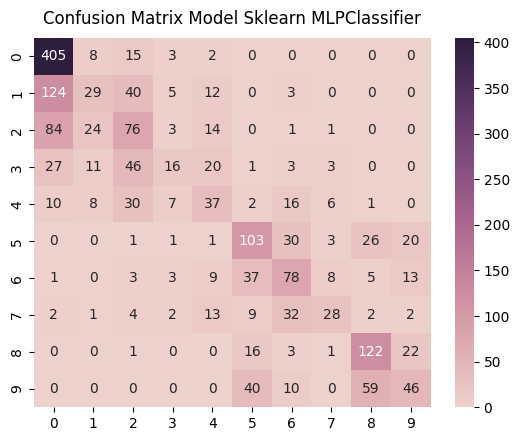

              precision    recall  f1-score      support
0.0            0.620214  0.935335  0.745856   433.000000
1.0            0.358025  0.136150  0.197279   213.000000
2.0            0.351852  0.374384  0.362768   203.000000
3.0            0.400000  0.125984  0.191617   127.000000
4.0            0.342593  0.316239  0.328889   117.000000
5.0            0.495192  0.556757  0.524173   185.000000
6.0            0.443182  0.496815  0.468468   157.000000
7.0            0.560000  0.294737  0.386207    95.000000
8.0            0.567442  0.739394  0.642105   165.000000
9.0            0.446602  0.296774  0.356589   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.458510  0.427257  0.420395  1850.000000
weighted avg   0.478034  0.508108  0.470196  1850.000000
Mean Squared Error:  2.3162162162162163


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,64,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



## One Hidden Layer

(Check Experiment 5 which have best both Train and Test Accuracy)

### Experiment 1 | 8 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


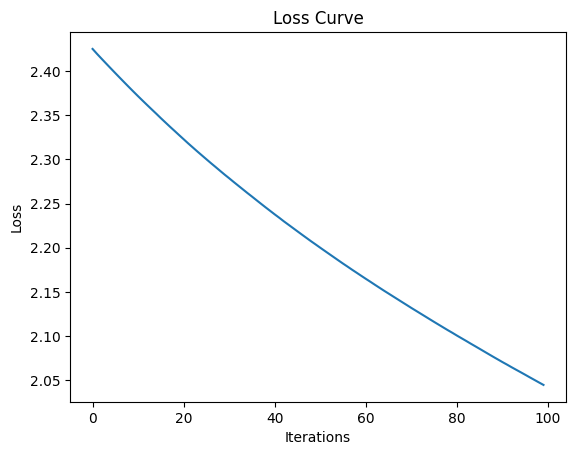

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

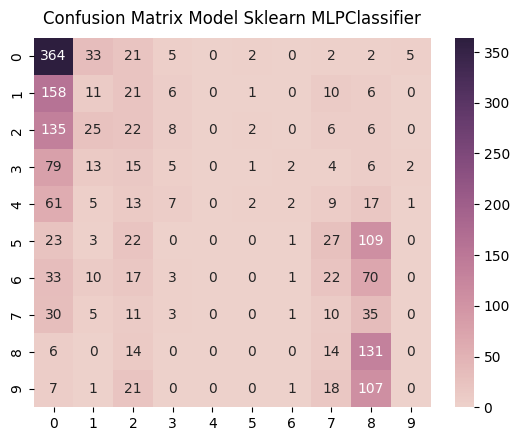

              precision    recall  f1-score      support
0.0            0.406250  0.838710  0.547368   434.000000
1.0            0.103774  0.051643  0.068966   213.000000
2.0            0.124294  0.107843  0.115486   204.000000
3.0            0.135135  0.039370  0.060976   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.000000  0.000000  0.000000   185.000000
6.0            0.125000  0.006410  0.012195   156.000000
7.0            0.081967  0.105263  0.092166    95.000000
8.0            0.267894  0.793939  0.400612   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.293895  0.293895  0.293895     0.293895
macro avg      0.124431  0.194318  0.129777  1851.000000
weighted avg   0.168786  0.293895  0.194657  1851.000000
Mean Squared Error:  7.528903295515938


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

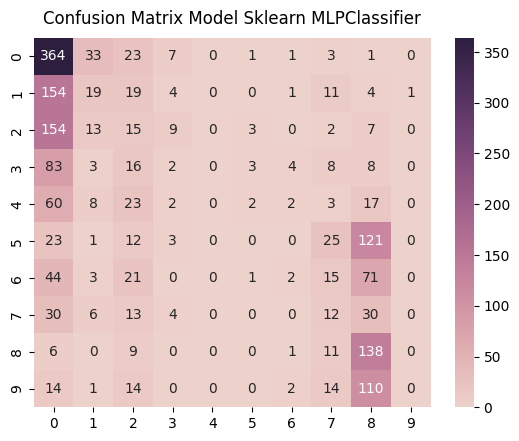

              precision    recall  f1-score      support
0.0            0.390558  0.840647  0.533333   433.000000
1.0            0.218391  0.089202  0.126667   213.000000
2.0            0.090909  0.073892  0.081522   203.000000
3.0            0.064516  0.015748  0.025316   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.000000  0.000000  0.000000   185.000000
6.0            0.153846  0.012739  0.023529   157.000000
7.0            0.115385  0.126316  0.120603    95.000000
8.0            0.272189  0.836364  0.410714   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.298378  0.298378  0.298378     0.298378
macro avg      0.130579  0.199491  0.132168  1850.000000
weighted avg   0.174218  0.298378  0.194917  1850.000000
Mean Squared Error:  7.553513513513513


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

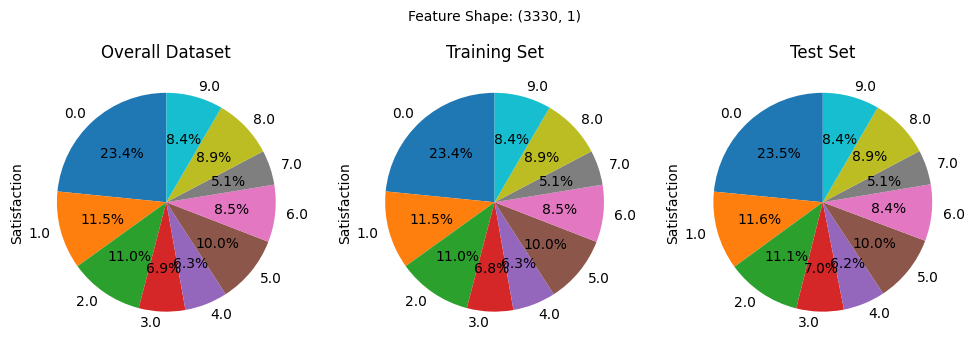

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


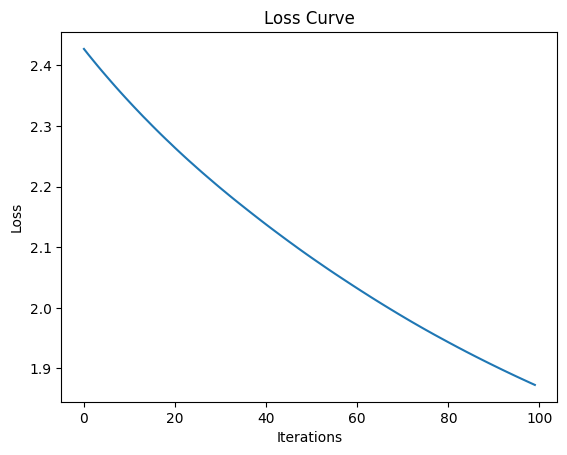

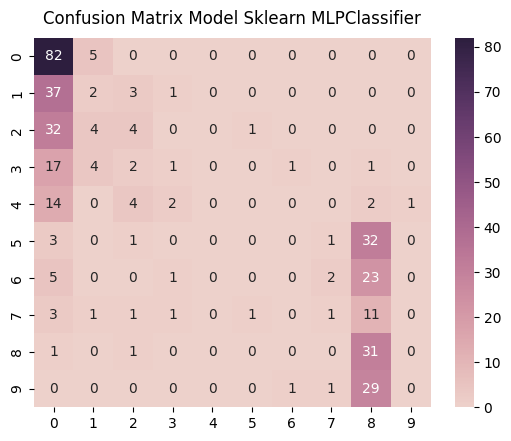

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.422680  0.942529  0.583630   87.000000
1.0            0.125000  0.046512  0.067797   43.000000
2.0            0.250000  0.097561  0.140351   41.000000
3.0            0.166667  0.038462  0.062500   26.000000
4.0            0.000000  0.000000  0.000000   23.000000
5.0            0.000000  0.000000  0.000000   37.000000
6.0            0.000000  0.000000  0.000000   31.000000
7.0            0.200000  0.052632  0.083333   19.000000
8.0            0.240310  0.939394  0.382716   33.000000
9.0            0.000000  0.000000  0.000000   31.000000
accuracy       0.326146  0.326146  0.326146    0.326146
macro avg      0.140466  0.211709  0.132033  371.000000
weighted avg   0.184533  0.326146  0.202920  371.000000
Mean Squared Error:  4.6738544474393535


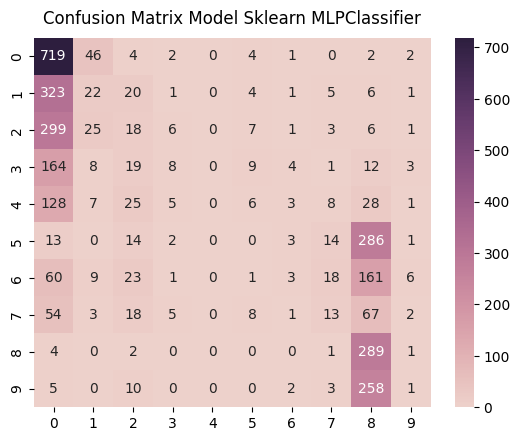

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.406444  0.921795  0.564143   780.000000
1.0            0.183333  0.057441  0.087475   383.000000
2.0            0.117647  0.049180  0.069364   366.000000
3.0            0.266667  0.035088  0.062016   228.000000
4.0            0.000000  0.000000  0.000000   211.000000
5.0            0.000000  0.000000  0.000000   333.000000
6.0            0.157895  0.010638  0.019934   282.000000
7.0            0.196970  0.076023  0.109705   171.000000
8.0            0.259193  0.973064  0.409348   297.000000
9.0            0.052632  0.003584  0.006711   279.000000
accuracy       0.322222  0.322222  0.322222     0.322222
macro avg      0.164078  0.212681  0.132870  3330.000000
weighted avg   0.198491  0.322222  0.198466  3330.000000
Mean Squared Error:  5.831831831831832


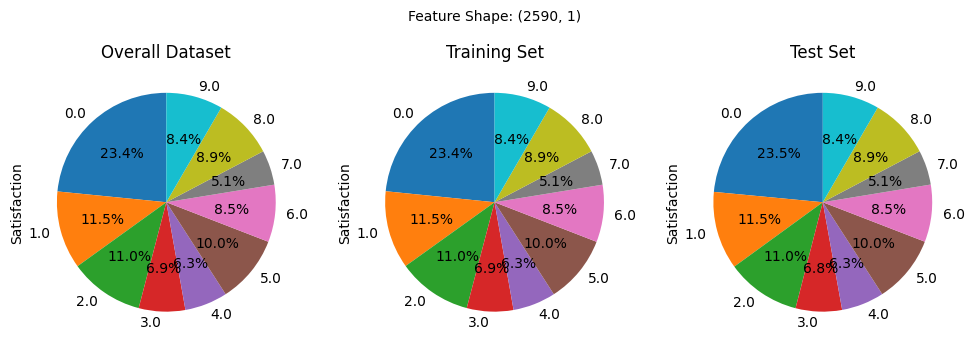

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


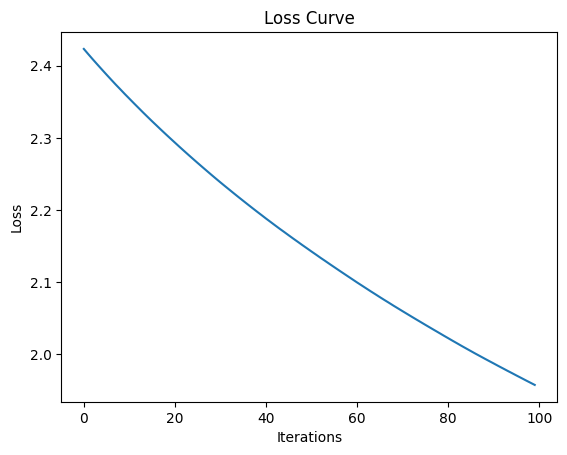

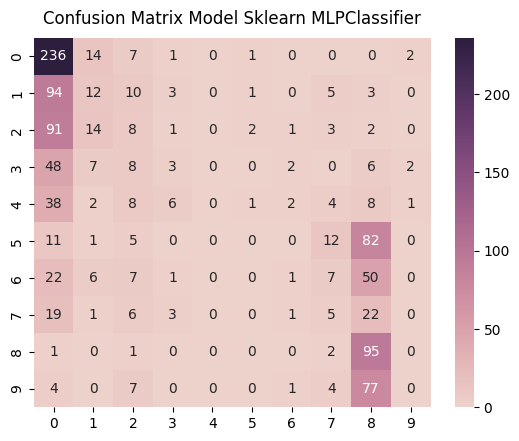

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.418440  0.904215  0.572121   261.000000
1.0            0.210526  0.093750  0.129730   128.000000
2.0            0.119403  0.065574  0.084656   122.000000
3.0            0.166667  0.039474  0.063830    76.000000
4.0            0.000000  0.000000  0.000000    70.000000
5.0            0.000000  0.000000  0.000000   111.000000
6.0            0.125000  0.010638  0.019608    94.000000
7.0            0.119048  0.087719  0.101010    57.000000
8.0            0.275362  0.959596  0.427928    99.000000
9.0            0.000000  0.000000  0.000000    93.000000
accuracy       0.324032  0.324032  0.324032     0.324032
macro avg      0.143445  0.216097  0.139888  1111.000000
weighted avg   0.188290  0.324032  0.207987  1111.000000
Mean Squared Error:  6.550855085508551


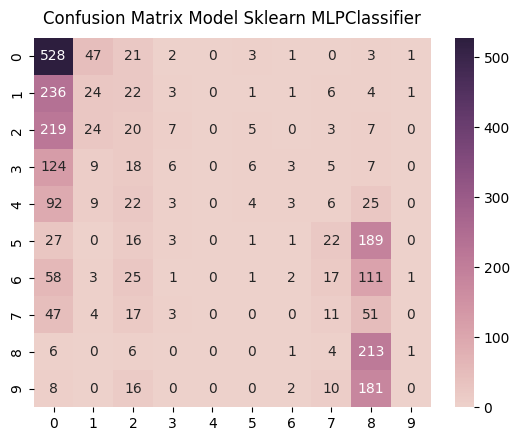

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.392565  0.871287  0.541261   606.000000
1.0            0.200000  0.080537  0.114833   298.000000
2.0            0.109290  0.070175  0.085470   285.000000
3.0            0.214286  0.033708  0.058252   178.000000
4.0            0.000000  0.000000  0.000000   164.000000
5.0            0.047619  0.003861  0.007143   259.000000
6.0            0.142857  0.009132  0.017167   219.000000
7.0            0.130952  0.082707  0.101382   133.000000
8.0            0.269279  0.922078  0.416830   231.000000
9.0            0.000000  0.000000  0.000000   217.000000
accuracy       0.310811  0.310811  0.310811     0.310811
macro avg      0.150685  0.207349  0.134234  2590.000000
weighted avg   0.189198  0.310811  0.197812  2590.000000
Mean Squared Error:  6.603861003861004


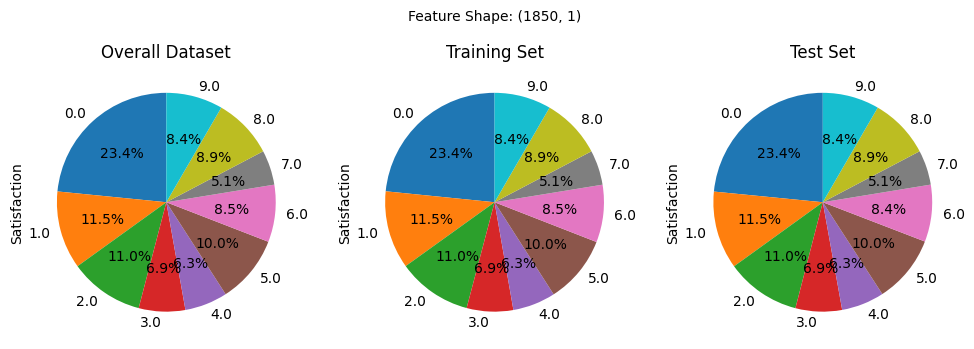

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


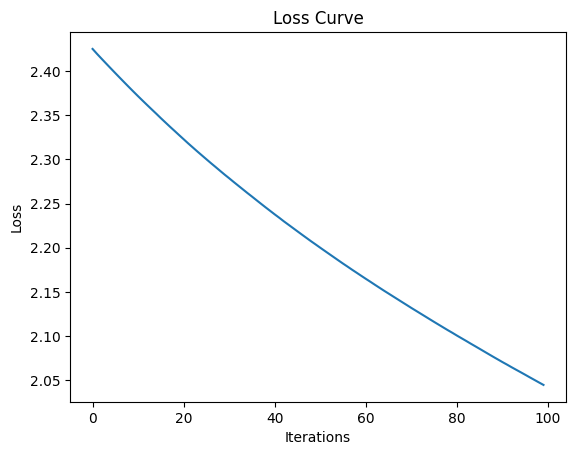

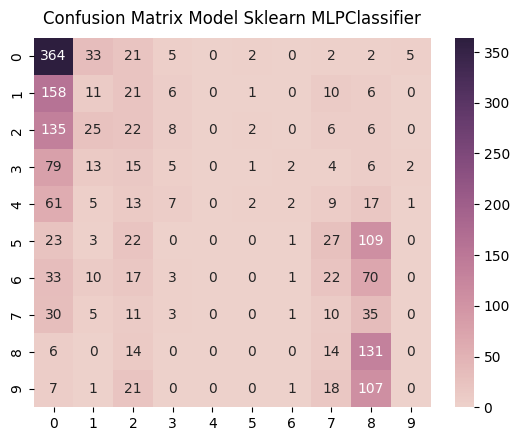

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.406250  0.838710  0.547368   434.000000
1.0            0.103774  0.051643  0.068966   213.000000
2.0            0.124294  0.107843  0.115486   204.000000
3.0            0.135135  0.039370  0.060976   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.000000  0.000000  0.000000   185.000000
6.0            0.125000  0.006410  0.012195   156.000000
7.0            0.081967  0.105263  0.092166    95.000000
8.0            0.267894  0.793939  0.400612   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.293895  0.293895  0.293895     0.293895
macro avg      0.124431  0.194318  0.129777  1851.000000
weighted avg   0.168786  0.293895  0.194657  1851.000000
Mean Squared Error:  7.528903295515938


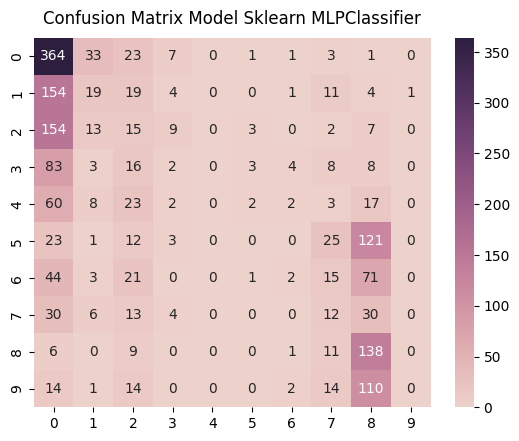

              precision    recall  f1-score      support
0.0            0.390558  0.840647  0.533333   433.000000
1.0            0.218391  0.089202  0.126667   213.000000
2.0            0.090909  0.073892  0.081522   203.000000
3.0            0.064516  0.015748  0.025316   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.000000  0.000000  0.000000   185.000000
6.0            0.153846  0.012739  0.023529   157.000000
7.0            0.115385  0.126316  0.120603    95.000000
8.0            0.272189  0.836364  0.410714   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.298378  0.298378  0.298378     0.298378
macro avg      0.130579  0.199491  0.132168  1850.000000
weighted avg   0.174218  0.298378  0.194917  1850.000000
Mean Squared Error:  7.553513513513513


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 2 | 16 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


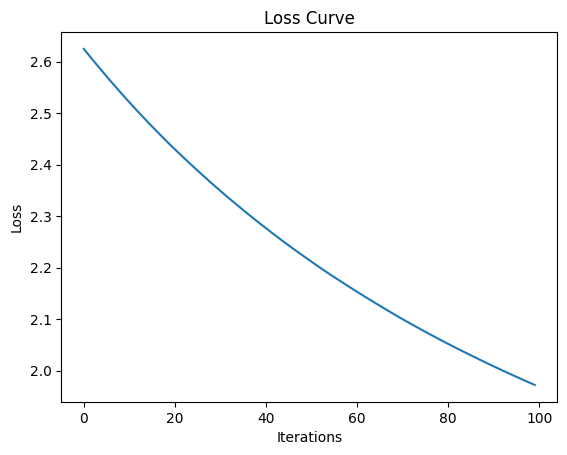

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

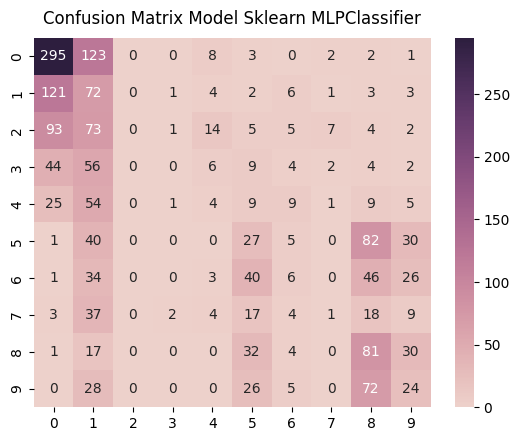

              precision    recall  f1-score      support
0.0            0.505137  0.679724  0.579568   434.000000
1.0            0.134831  0.338028  0.192771   213.000000
2.0            0.000000  0.000000  0.000000   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.093023  0.034188  0.050000   117.000000
5.0            0.158824  0.145946  0.152113   185.000000
6.0            0.125000  0.038462  0.058824   156.000000
7.0            0.071429  0.010526  0.018349    95.000000
8.0            0.252336  0.490909  0.333333   165.000000
9.0            0.181818  0.154839  0.167247   155.000000
accuracy       0.275527  0.275527  0.275527     0.275527
macro avg      0.152240  0.189262  0.155220  1851.000000
weighted avg   0.207627  0.275527  0.226054  1851.000000
Mean Squared Error:  7.0124257158292815


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

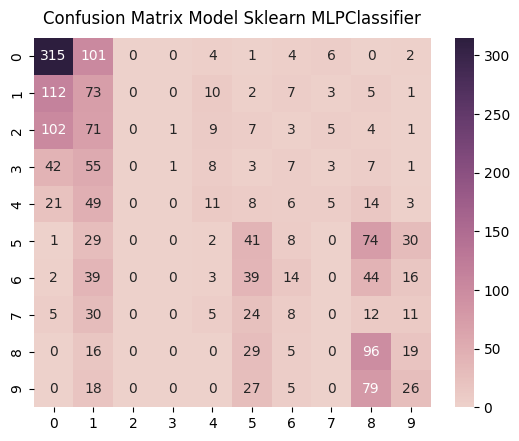

              precision    recall  f1-score      support
0.0            0.525000  0.727483  0.609874   433.000000
1.0            0.151767  0.342723  0.210375   213.000000
2.0            0.000000  0.000000  0.000000   203.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.211538  0.094017  0.130178   117.000000
5.0            0.226519  0.221622  0.224044   185.000000
6.0            0.208955  0.089172  0.125000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.286567  0.581818  0.384000   165.000000
9.0            0.236364  0.167742  0.196226   155.000000
accuracy       0.311892  0.311892  0.311892     0.311892
macro avg      0.234671  0.223245  0.189520  1850.000000
weighted avg   0.273802  0.311892  0.259964  1850.000000
Mean Squared Error:  6.507567567567568


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

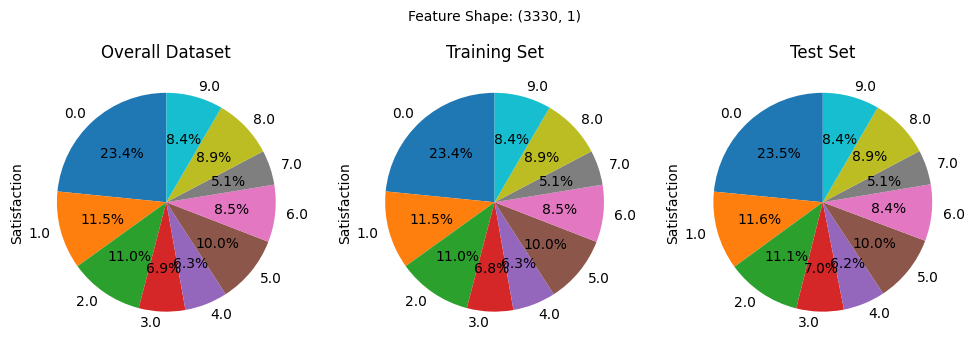

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


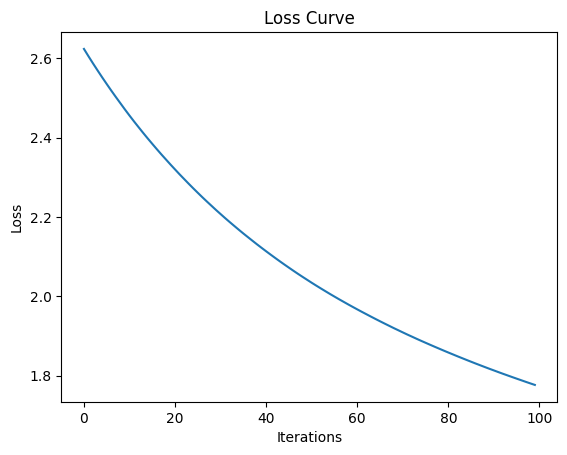

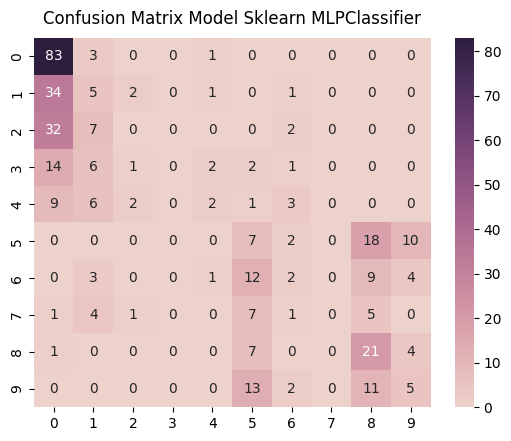

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.477011  0.954023  0.636015   87.000000
1.0            0.147059  0.116279  0.129870   43.000000
2.0            0.000000  0.000000  0.000000   41.000000
3.0            0.000000  0.000000  0.000000   26.000000
4.0            0.285714  0.086957  0.133333   23.000000
5.0            0.142857  0.189189  0.162791   37.000000
6.0            0.142857  0.064516  0.088889   31.000000
7.0            0.000000  0.000000  0.000000   19.000000
8.0            0.328125  0.636364  0.432990   33.000000
9.0            0.217391  0.161290  0.185185   31.000000
accuracy       0.336927  0.336927  0.336927    0.336927
macro avg      0.174102  0.220862  0.176907  371.000000
weighted avg   0.220152  0.336927  0.250115  371.000000
Mean Squared Error:  4.722371967654986


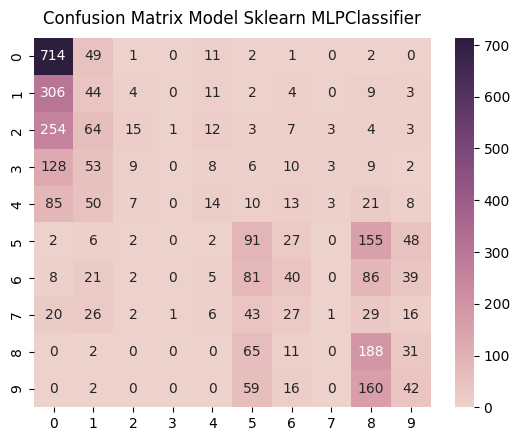

              precision    recall  f1-score      support
0.0            0.470666  0.915385  0.621680   780.000000
1.0            0.138801  0.114883  0.125714   383.000000
2.0            0.357143  0.040984  0.073529   366.000000
3.0            0.000000  0.000000  0.000000   228.000000
4.0            0.202899  0.066351  0.100000   211.000000
5.0            0.251381  0.273273  0.261871   333.000000
6.0            0.256410  0.141844  0.182648   282.000000
7.0            0.100000  0.005848  0.011050   171.000000
8.0            0.283560  0.632997  0.391667   297.000000
9.0            0.218750  0.150538  0.178344   279.000000
accuracy       0.345045  0.345045  0.345045     0.345045
macro avg      0.227961  0.234210  0.194650  3330.000000
weighted avg   0.273926  0.345045  0.266593  3330.000000
Mean Squared Error:  4.808708708708709


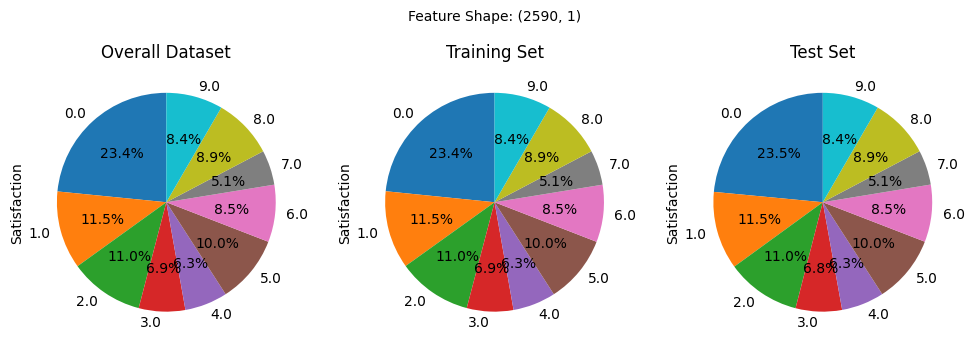

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


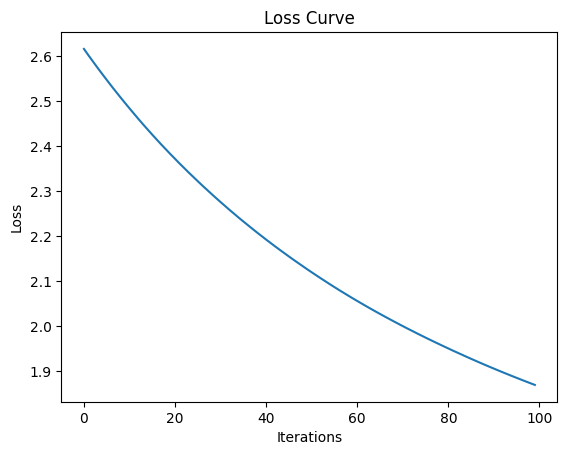

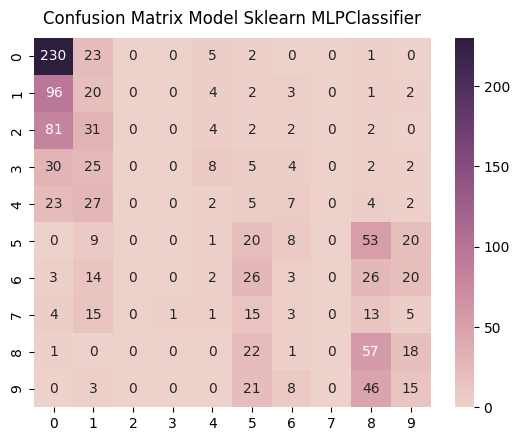

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.491453  0.881226  0.631001   261.000000
1.0            0.119760  0.156250  0.135593   128.000000
2.0            0.000000  0.000000  0.000000   122.000000
3.0            0.000000  0.000000  0.000000    76.000000
4.0            0.074074  0.028571  0.041237    70.000000
5.0            0.166667  0.180180  0.173160   111.000000
6.0            0.076923  0.031915  0.045113    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.278049  0.575758  0.375000    99.000000
9.0            0.178571  0.161290  0.169492    93.000000
accuracy       0.312331  0.312331  0.312331     0.312331
macro avg      0.138550  0.201519  0.157060  1111.000000
weighted avg   0.196803  0.312331  0.235178  1111.000000
Mean Squared Error:  5.358235823582358


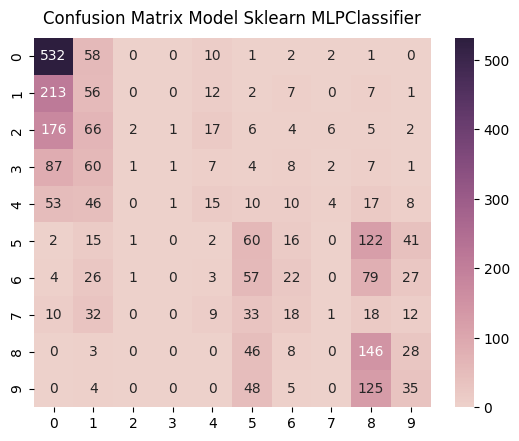

              precision    recall  f1-score      support
0.0            0.493965  0.877888  0.632204   606.000000
1.0            0.153005  0.187919  0.168675   298.000000
2.0            0.400000  0.007018  0.013793   285.000000
3.0            0.333333  0.005618  0.011050   178.000000
4.0            0.200000  0.091463  0.125523   164.000000
5.0            0.224719  0.231660  0.228137   259.000000
6.0            0.220000  0.100457  0.137931   219.000000
7.0            0.066667  0.007519  0.013514   133.000000
8.0            0.277040  0.632035  0.385224   231.000000
9.0            0.225806  0.161290  0.188172   217.000000
accuracy       0.335907  0.335907  0.335907     0.335907
macro avg      0.259454  0.230287  0.190422  2590.000000
weighted avg   0.300894  0.335907  0.262848  2590.000000
Mean Squared Error:  5.113127413127413


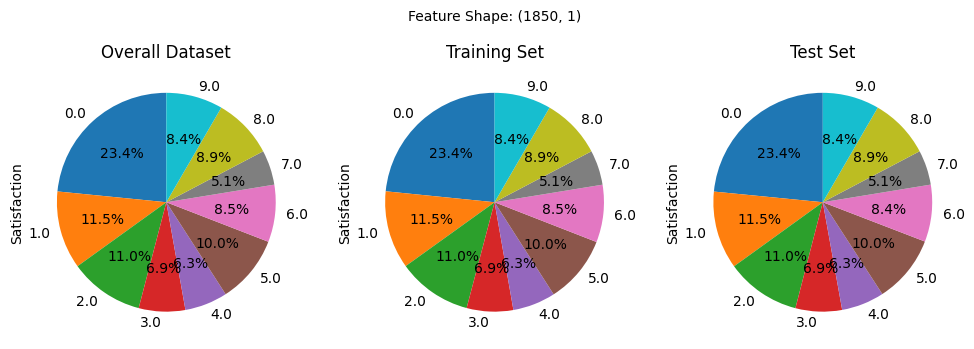

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


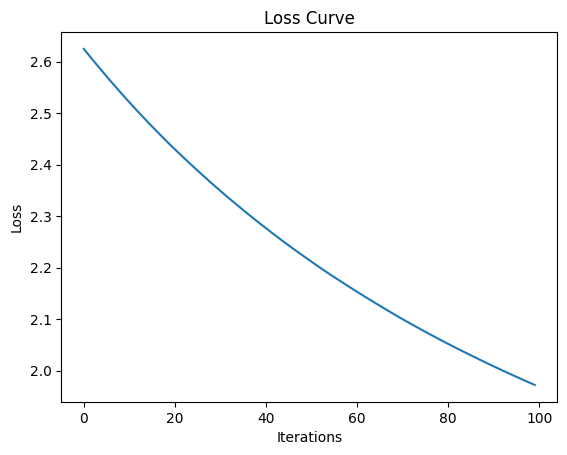

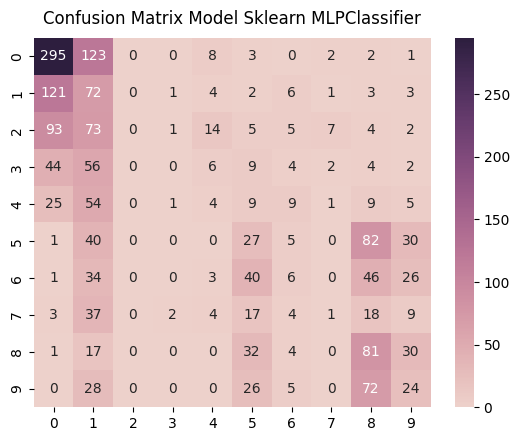

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.505137  0.679724  0.579568   434.000000
1.0            0.134831  0.338028  0.192771   213.000000
2.0            0.000000  0.000000  0.000000   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.093023  0.034188  0.050000   117.000000
5.0            0.158824  0.145946  0.152113   185.000000
6.0            0.125000  0.038462  0.058824   156.000000
7.0            0.071429  0.010526  0.018349    95.000000
8.0            0.252336  0.490909  0.333333   165.000000
9.0            0.181818  0.154839  0.167247   155.000000
accuracy       0.275527  0.275527  0.275527     0.275527
macro avg      0.152240  0.189262  0.155220  1851.000000
weighted avg   0.207627  0.275527  0.226054  1851.000000
Mean Squared Error:  7.0124257158292815


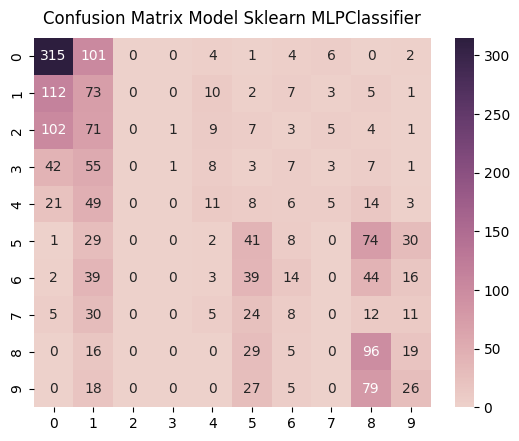

              precision    recall  f1-score      support
0.0            0.525000  0.727483  0.609874   433.000000
1.0            0.151767  0.342723  0.210375   213.000000
2.0            0.000000  0.000000  0.000000   203.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.211538  0.094017  0.130178   117.000000
5.0            0.226519  0.221622  0.224044   185.000000
6.0            0.208955  0.089172  0.125000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.286567  0.581818  0.384000   165.000000
9.0            0.236364  0.167742  0.196226   155.000000
accuracy       0.311892  0.311892  0.311892     0.311892
macro avg      0.234671  0.223245  0.189520  1850.000000
weighted avg   0.273802  0.311892  0.259964  1850.000000
Mean Squared Error:  6.507567567567568


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 3 | 32 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


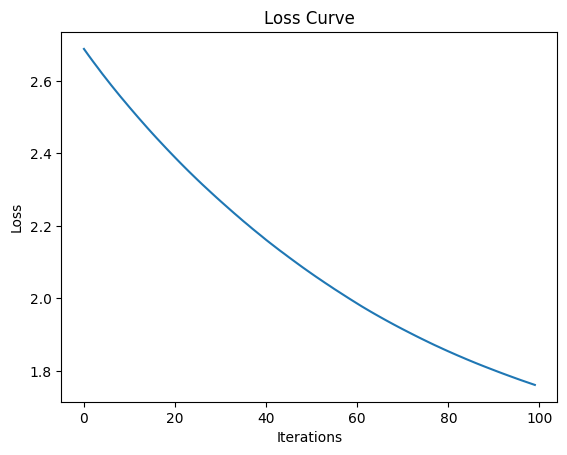

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

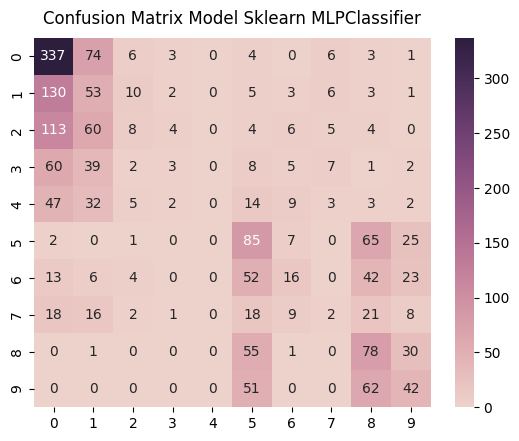

              precision    recall  f1-score      support
0.0            0.468056  0.776498  0.584055   434.000000
1.0            0.188612  0.248826  0.214575   213.000000
2.0            0.210526  0.039216  0.066116   204.000000
3.0            0.200000  0.023622  0.042254   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.287162  0.459459  0.353430   185.000000
6.0            0.285714  0.102564  0.150943   156.000000
7.0            0.068966  0.021053  0.032258    95.000000
8.0            0.276596  0.472727  0.348993   165.000000
9.0            0.313433  0.270968  0.290657   155.000000
accuracy       0.337115  0.337115  0.337115     0.337115
macro avg      0.229906  0.241493  0.208328  1851.000000
weighted avg   0.275595  0.337115  0.276969  1851.000000
Mean Squared Error:  5.366828741220962


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

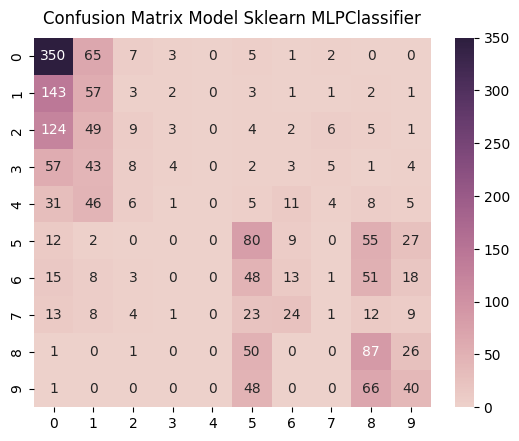

              precision    recall  f1-score      support
0.0            0.468541  0.808314  0.593220   433.000000
1.0            0.205036  0.267606  0.232179   213.000000
2.0            0.219512  0.044335  0.073770   203.000000
3.0            0.285714  0.031496  0.056738   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.298507  0.432432  0.353201   185.000000
6.0            0.203125  0.082803  0.117647   157.000000
7.0            0.050000  0.010526  0.017391    95.000000
8.0            0.303136  0.527273  0.384956   165.000000
9.0            0.305344  0.258065  0.279720   155.000000
accuracy       0.346486  0.346486  0.346486     0.346486
macro avg      0.233892  0.246285  0.210882  1850.000000
weighted avg   0.279247  0.346486  0.281535  1850.000000
Mean Squared Error:  4.981621621621621


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

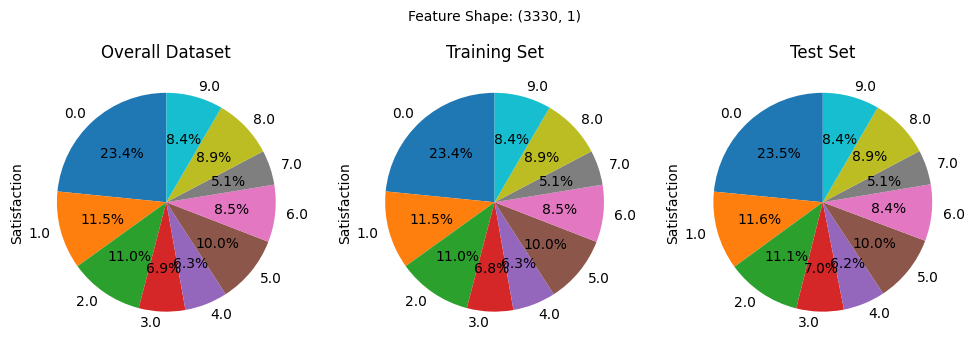

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


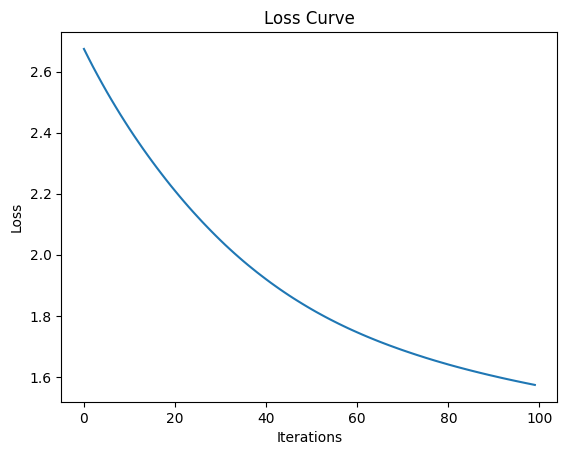

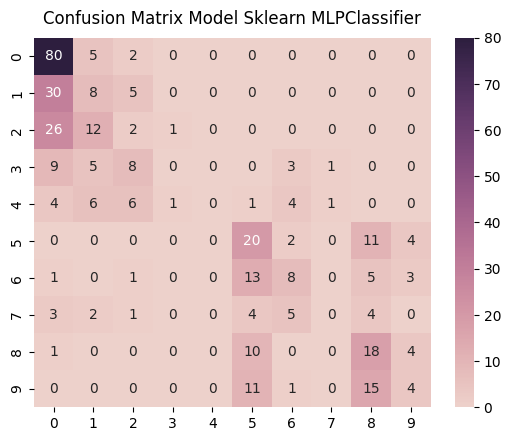

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.519481  0.919540  0.663900   87.000000
1.0            0.210526  0.186047  0.197531   43.000000
2.0            0.080000  0.048780  0.060606   41.000000
3.0            0.000000  0.000000  0.000000   26.000000
4.0            0.000000  0.000000  0.000000   23.000000
5.0            0.338983  0.540541  0.416667   37.000000
6.0            0.347826  0.258065  0.296296   31.000000
7.0            0.000000  0.000000  0.000000   19.000000
8.0            0.339623  0.545455  0.418605   33.000000
9.0            0.266667  0.129032  0.173913   31.000000
accuracy       0.377358  0.377358  0.377358    0.377358
macro avg      0.210311  0.262746  0.222752  371.000000
weighted avg   0.270422  0.377358  0.303356  371.000000
Mean Squared Error:  3.746630727762803


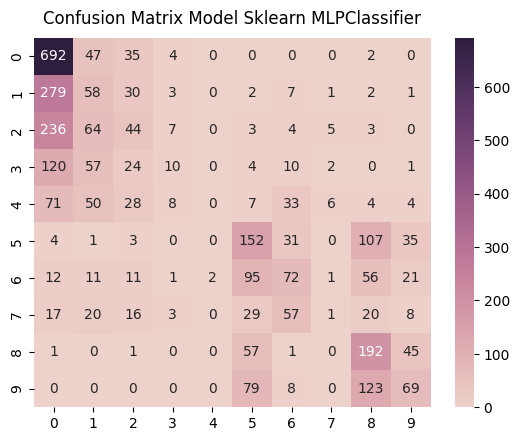

              precision    recall  f1-score      support
0.0            0.483240  0.887179  0.625678   780.000000
1.0            0.188312  0.151436  0.167873   383.000000
2.0            0.229167  0.120219  0.157706   366.000000
3.0            0.277778  0.043860  0.075758   228.000000
4.0            0.000000  0.000000  0.000000   211.000000
5.0            0.355140  0.456456  0.399474   333.000000
6.0            0.322870  0.255319  0.285149   282.000000
7.0            0.062500  0.005848  0.010695   171.000000
8.0            0.377210  0.646465  0.476427   297.000000
9.0            0.375000  0.247312  0.298056   279.000000
accuracy       0.387387  0.387387  0.387387     0.387387
macro avg      0.267122  0.281409  0.249682  3330.000000
weighted avg   0.310184  0.387387  0.320492  3330.000000
Mean Squared Error:  4.035435435435436


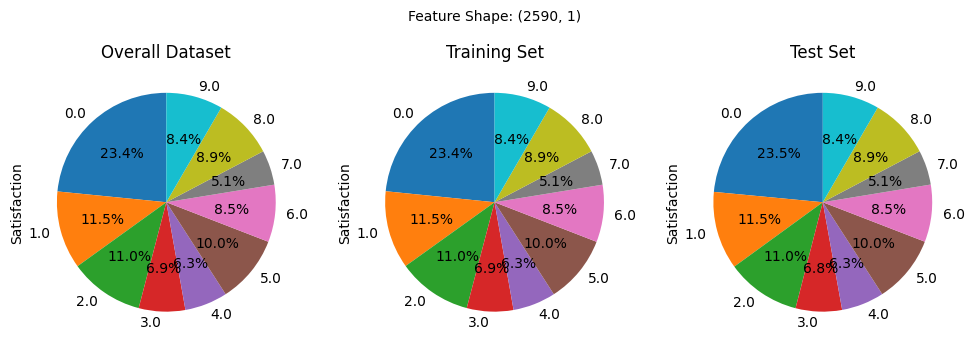

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


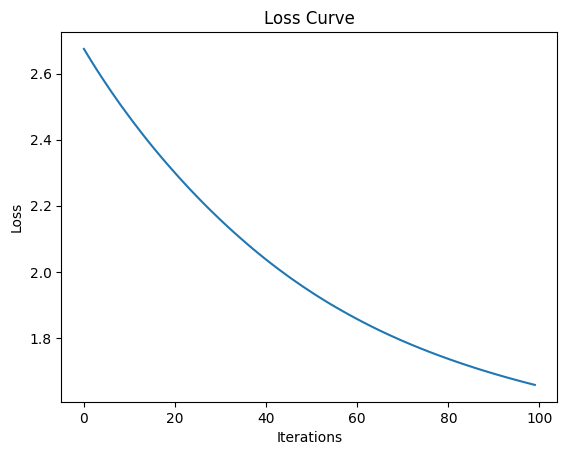

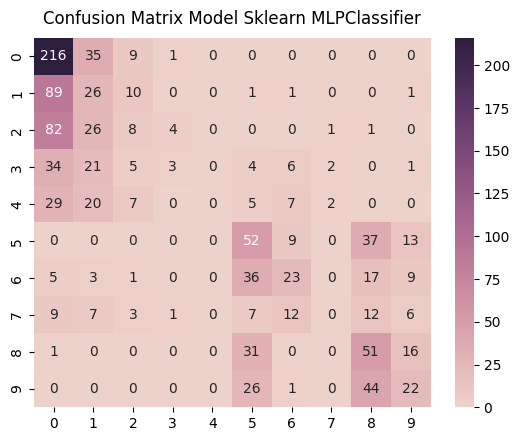

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.464516  0.827586  0.595041   261.000000
1.0            0.188406  0.203125  0.195489   128.000000
2.0            0.186047  0.065574  0.096970   122.000000
3.0            0.333333  0.039474  0.070588    76.000000
4.0            0.000000  0.000000  0.000000    70.000000
5.0            0.320988  0.468468  0.380952   111.000000
6.0            0.389831  0.244681  0.300654    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.314815  0.515152  0.390805    99.000000
9.0            0.323529  0.236559  0.273292    93.000000
accuracy       0.360936  0.360936  0.360936     0.360936
macro avg      0.252146  0.260062  0.230379  1111.000000
weighted avg   0.294252  0.360936  0.298989  1111.000000
Mean Squared Error:  4.188118811881188


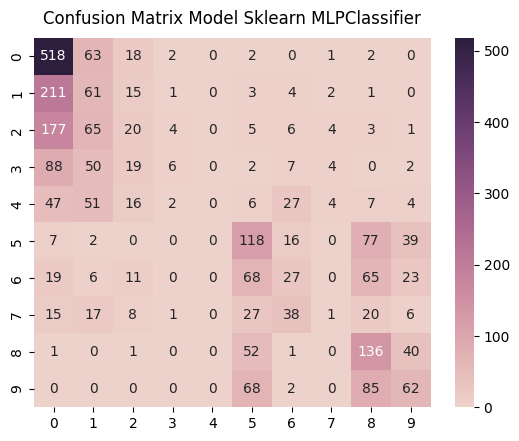

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.478301  0.854785  0.613381   606.000000
1.0            0.193651  0.204698  0.199021   298.000000
2.0            0.185185  0.070175  0.101781   285.000000
3.0            0.375000  0.033708  0.061856   178.000000
4.0            0.000000  0.000000  0.000000   164.000000
5.0            0.336182  0.455598  0.386885   259.000000
6.0            0.210938  0.123288  0.155620   219.000000
7.0            0.062500  0.007519  0.013423   133.000000
8.0            0.343434  0.588745  0.433812   231.000000
9.0            0.350282  0.285714  0.314721   217.000000
accuracy       0.366409  0.366409  0.366409     0.366409
macro avg      0.253547  0.262423  0.228050  2590.000000
weighted avg   0.294984  0.366409  0.299463  2590.000000
Mean Squared Error:  4.46023166023166


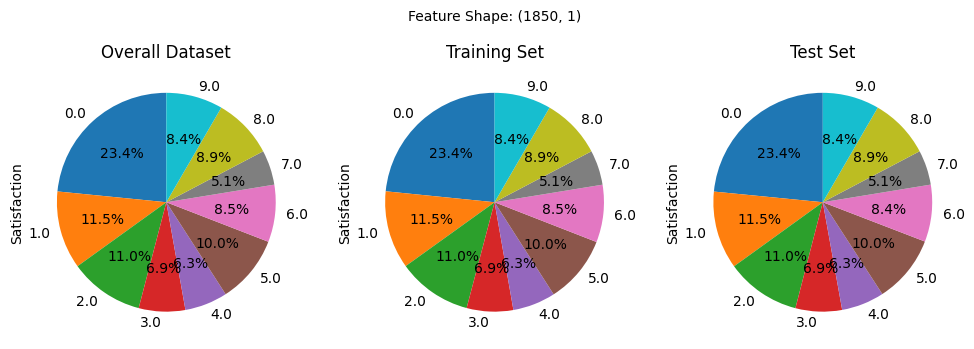

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


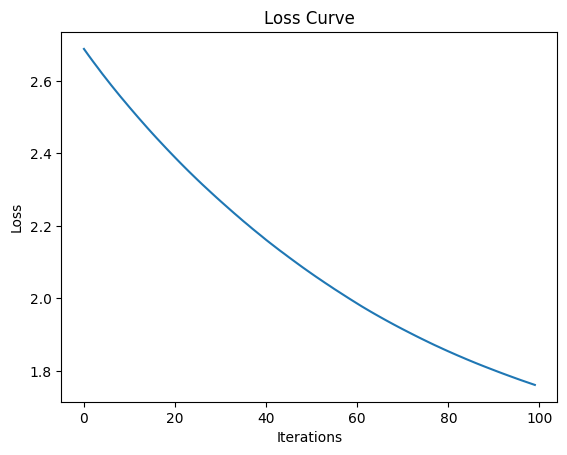

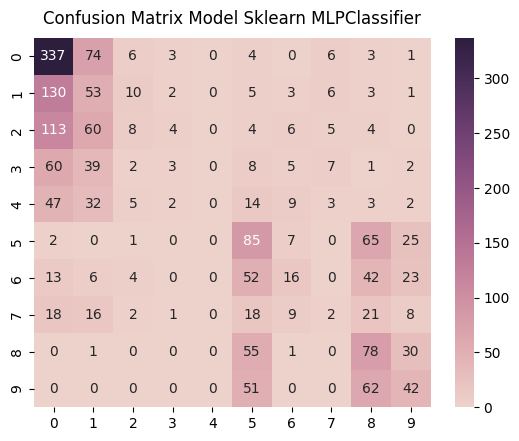

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.468056  0.776498  0.584055   434.000000
1.0            0.188612  0.248826  0.214575   213.000000
2.0            0.210526  0.039216  0.066116   204.000000
3.0            0.200000  0.023622  0.042254   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.287162  0.459459  0.353430   185.000000
6.0            0.285714  0.102564  0.150943   156.000000
7.0            0.068966  0.021053  0.032258    95.000000
8.0            0.276596  0.472727  0.348993   165.000000
9.0            0.313433  0.270968  0.290657   155.000000
accuracy       0.337115  0.337115  0.337115     0.337115
macro avg      0.229906  0.241493  0.208328  1851.000000
weighted avg   0.275595  0.337115  0.276969  1851.000000
Mean Squared Error:  5.366828741220962


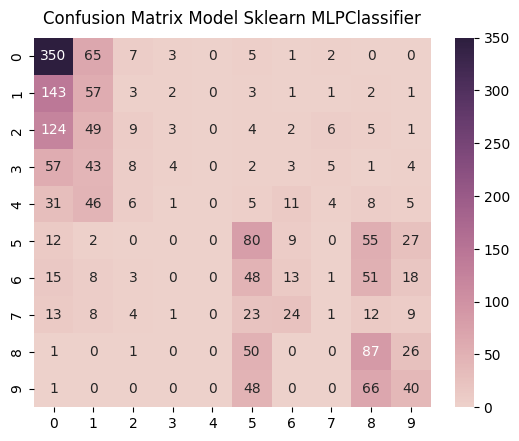

              precision    recall  f1-score      support
0.0            0.468541  0.808314  0.593220   433.000000
1.0            0.205036  0.267606  0.232179   213.000000
2.0            0.219512  0.044335  0.073770   203.000000
3.0            0.285714  0.031496  0.056738   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.298507  0.432432  0.353201   185.000000
6.0            0.203125  0.082803  0.117647   157.000000
7.0            0.050000  0.010526  0.017391    95.000000
8.0            0.303136  0.527273  0.384956   165.000000
9.0            0.305344  0.258065  0.279720   155.000000
accuracy       0.346486  0.346486  0.346486     0.346486
macro avg      0.233892  0.246285  0.210882  1850.000000
weighted avg   0.279247  0.346486  0.281535  1850.000000
Mean Squared Error:  4.981621621621621


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 4 | 64 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


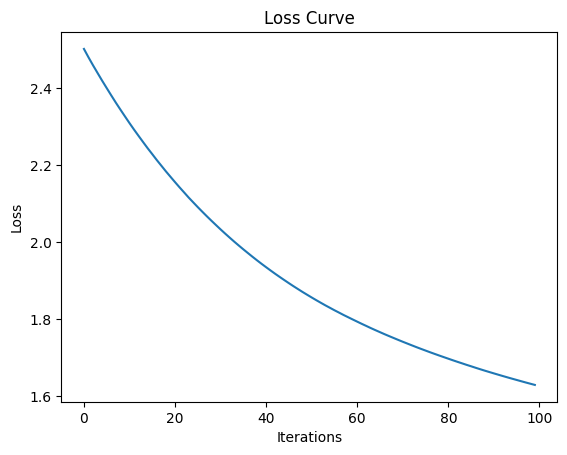

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

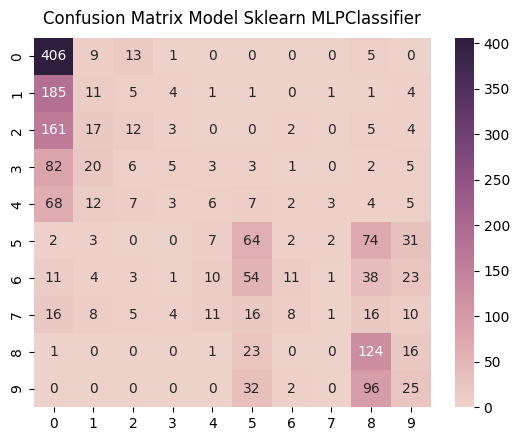

              precision    recall  f1-score      support
0.0            0.435622  0.935484  0.594436   434.000000
1.0            0.130952  0.051643  0.074074   213.000000
2.0            0.235294  0.058824  0.094118   204.000000
3.0            0.238095  0.039370  0.067568   127.000000
4.0            0.153846  0.051282  0.076923   117.000000
5.0            0.320000  0.345946  0.332468   185.000000
6.0            0.392857  0.070513  0.119565   156.000000
7.0            0.125000  0.010526  0.019417    95.000000
8.0            0.339726  0.751515  0.467925   165.000000
9.0            0.203252  0.161290  0.179856   155.000000
accuracy       0.359265  0.359265  0.359265     0.359265
macro avg      0.257465  0.247639  0.202635  1851.000000
weighted avg   0.288012  0.359265  0.268845  1851.000000
Mean Squared Error:  5.008643976229066


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

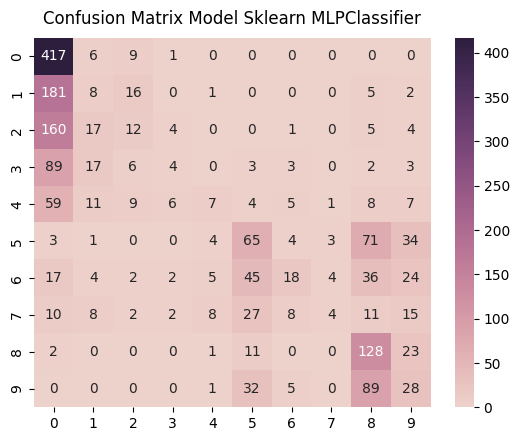

              precision    recall  f1-score      support
0.0            0.444563  0.963048  0.608315   433.000000
1.0            0.111111  0.037559  0.056140   213.000000
2.0            0.214286  0.059113  0.092664   203.000000
3.0            0.210526  0.031496  0.054795   127.000000
4.0            0.259259  0.059829  0.097222   117.000000
5.0            0.347594  0.351351  0.349462   185.000000
6.0            0.409091  0.114650  0.179104   157.000000
7.0            0.333333  0.042105  0.074766    95.000000
8.0            0.360563  0.775758  0.492308   165.000000
9.0            0.200000  0.180645  0.189831   155.000000
accuracy       0.373514  0.373514  0.373514     0.373514
macro avg      0.289033  0.261555  0.219461  1850.000000
weighted avg   0.306716  0.373514  0.282719  1850.000000
Mean Squared Error:  4.7118918918918915


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

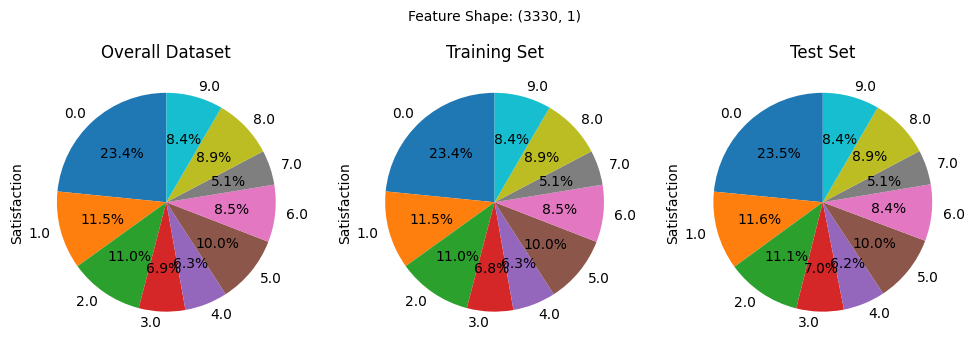

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


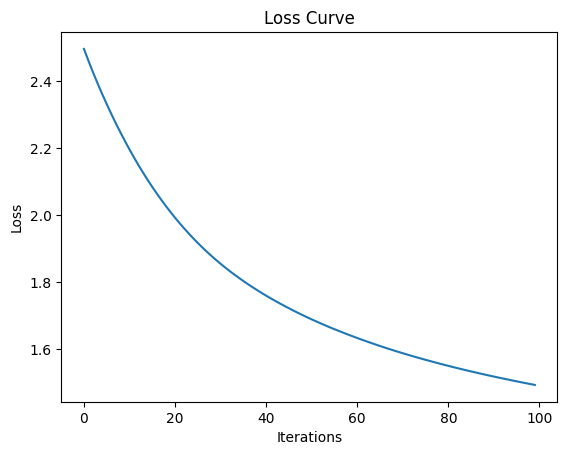

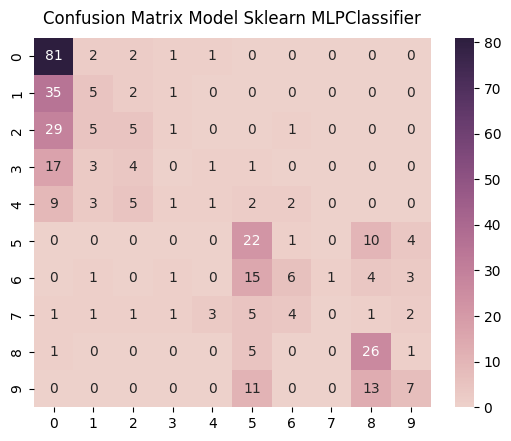

              precision    recall  f1-score     support
0.0            0.468208  0.931034  0.623077   87.000000
1.0            0.250000  0.116279  0.158730   43.000000
2.0            0.263158  0.121951  0.166667   41.000000
3.0            0.000000  0.000000  0.000000   26.000000
4.0            0.166667  0.043478  0.068966   23.000000
5.0            0.360656  0.594595  0.448980   37.000000
6.0            0.428571  0.193548  0.266667   31.000000
7.0            0.000000  0.000000  0.000000   19.000000
8.0            0.481481  0.787879  0.597701   33.000000
9.0            0.411765  0.225806  0.291667   31.000000
accuracy       0.412399  0.412399  0.412399    0.412399
macro avg      0.283051  0.301457  0.262245  371.000000
weighted avg   0.327198  0.412399  0.331799  371.000000
Mean Squared Error:  3.5660377358490565


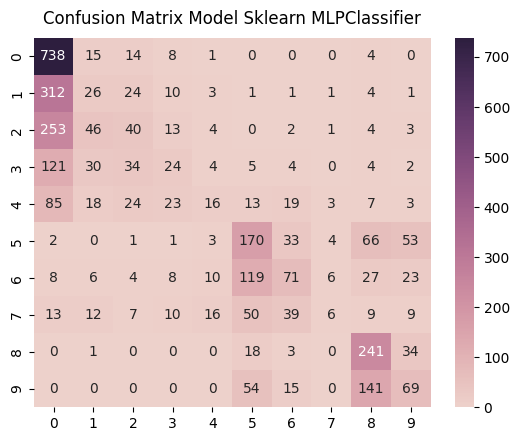

              precision    recall  f1-score      support
0.0            0.481723  0.946154  0.638408   780.000000
1.0            0.168831  0.067885  0.096834   383.000000
2.0            0.270270  0.109290  0.155642   366.000000
3.0            0.247423  0.105263  0.147692   228.000000
4.0            0.280702  0.075829  0.119403   211.000000
5.0            0.395349  0.510511  0.445609   333.000000
6.0            0.379679  0.251773  0.302772   282.000000
7.0            0.285714  0.035088  0.062500   171.000000
8.0            0.475345  0.811448  0.599502   297.000000
9.0            0.350254  0.247312  0.289916   279.000000
accuracy       0.420721  0.420721  0.420721     0.420721
macro avg      0.333529  0.316055  0.285828  3330.000000
weighted avg   0.354787  0.420721  0.346629  3330.000000
Mean Squared Error:  3.5582582582582583


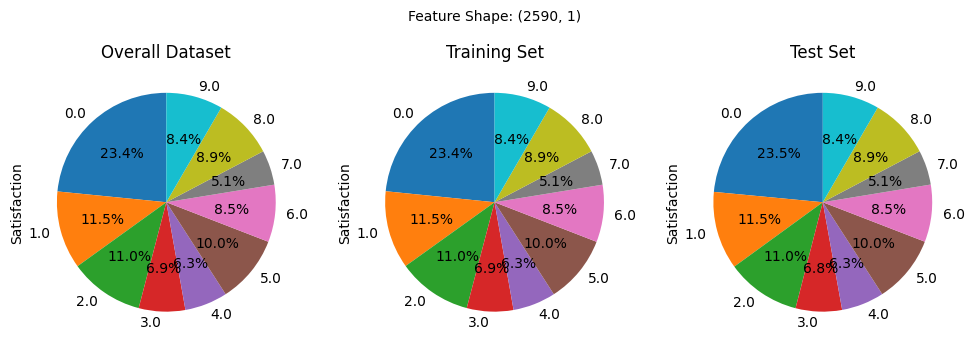

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


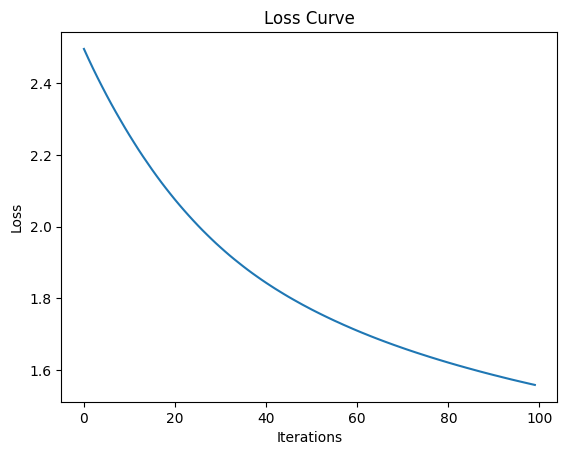

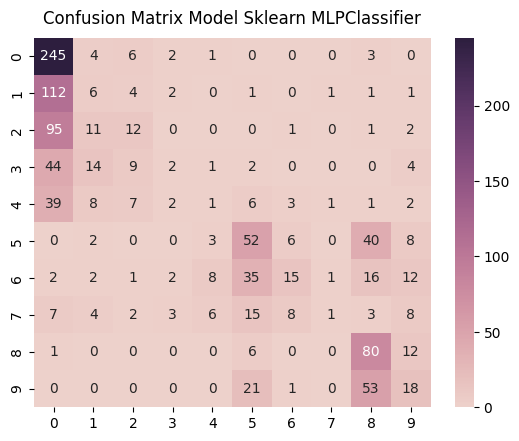

              precision    recall  f1-score      support
0.0            0.449541  0.938697  0.607940   261.000000
1.0            0.117647  0.046875  0.067039   128.000000
2.0            0.292683  0.098361  0.147239   122.000000
3.0            0.153846  0.026316  0.044944    76.000000
4.0            0.050000  0.014286  0.022222    70.000000
5.0            0.376812  0.468468  0.417671   111.000000
6.0            0.441176  0.159574  0.234375    94.000000
7.0            0.250000  0.017544  0.032787    57.000000
8.0            0.404040  0.808081  0.538721    99.000000
9.0            0.268657  0.193548  0.225000    93.000000
accuracy       0.388839  0.388839  0.388839     0.388839
macro avg      0.280440  0.277175  0.233794  1111.000000
weighted avg   0.311270  0.388839  0.301267  1111.000000
Mean Squared Error:  4.241224122412241


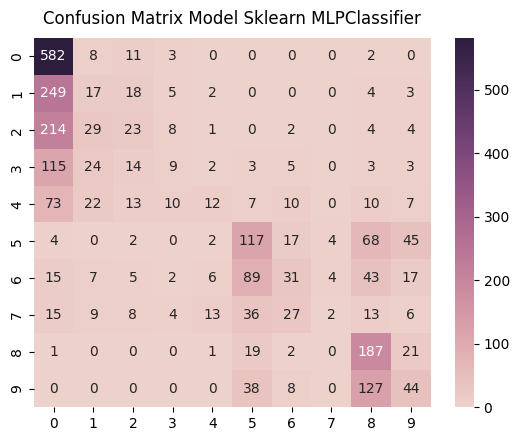

              precision    recall  f1-score      support
0.0            0.458991  0.960396  0.621131   606.000000
1.0            0.146552  0.057047  0.082126   298.000000
2.0            0.244681  0.080702  0.121372   285.000000
3.0            0.219512  0.050562  0.082192   178.000000
4.0            0.307692  0.073171  0.118227   164.000000
5.0            0.378641  0.451737  0.411972   259.000000
6.0            0.303922  0.141553  0.193146   219.000000
7.0            0.200000  0.015038  0.027972   133.000000
8.0            0.405640  0.809524  0.540462   231.000000
9.0            0.293333  0.202765  0.239782   217.000000
accuracy       0.395367  0.395367  0.395367     0.395367
macro avg      0.295896  0.284249  0.243838  2590.000000
weighted avg   0.320337  0.395367  0.308529  2590.000000
Mean Squared Error:  4.185714285714286


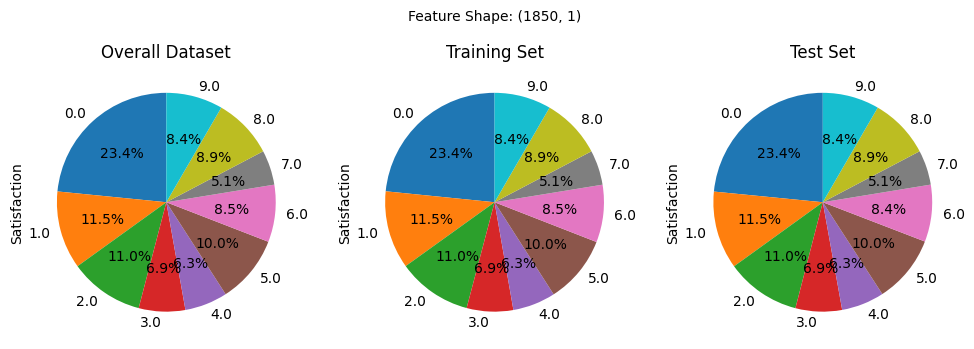

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


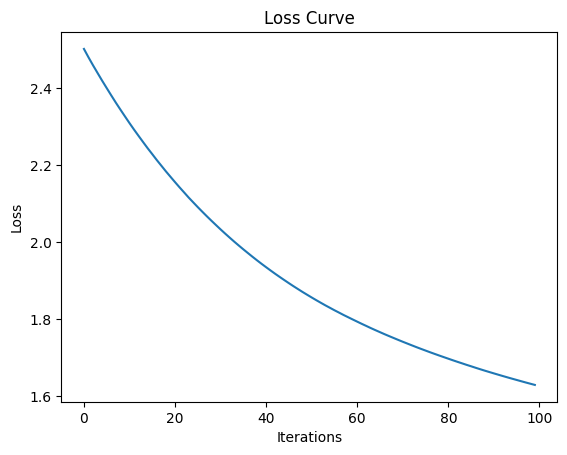

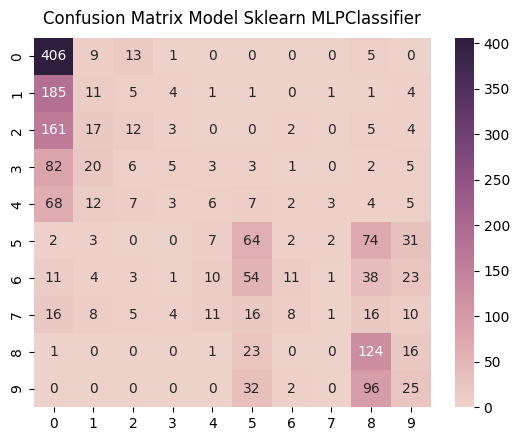

              precision    recall  f1-score      support
0.0            0.435622  0.935484  0.594436   434.000000
1.0            0.130952  0.051643  0.074074   213.000000
2.0            0.235294  0.058824  0.094118   204.000000
3.0            0.238095  0.039370  0.067568   127.000000
4.0            0.153846  0.051282  0.076923   117.000000
5.0            0.320000  0.345946  0.332468   185.000000
6.0            0.392857  0.070513  0.119565   156.000000
7.0            0.125000  0.010526  0.019417    95.000000
8.0            0.339726  0.751515  0.467925   165.000000
9.0            0.203252  0.161290  0.179856   155.000000
accuracy       0.359265  0.359265  0.359265     0.359265
macro avg      0.257465  0.247639  0.202635  1851.000000
weighted avg   0.288012  0.359265  0.268845  1851.000000
Mean Squared Error:  5.008643976229066


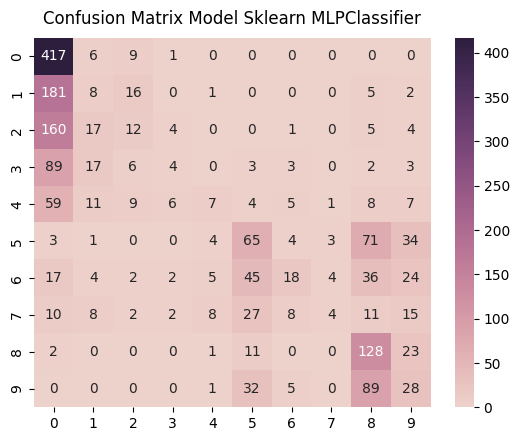

              precision    recall  f1-score      support
0.0            0.444563  0.963048  0.608315   433.000000
1.0            0.111111  0.037559  0.056140   213.000000
2.0            0.214286  0.059113  0.092664   203.000000
3.0            0.210526  0.031496  0.054795   127.000000
4.0            0.259259  0.059829  0.097222   117.000000
5.0            0.347594  0.351351  0.349462   185.000000
6.0            0.409091  0.114650  0.179104   157.000000
7.0            0.333333  0.042105  0.074766    95.000000
8.0            0.360563  0.775758  0.492308   165.000000
9.0            0.200000  0.180645  0.189831   155.000000
accuracy       0.373514  0.373514  0.373514     0.373514
macro avg      0.289033  0.261555  0.219461  1850.000000
weighted avg   0.306716  0.373514  0.282719  1850.000000
Mean Squared Error:  4.7118918918918915


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 5 | 128 Unit (Train Accuracy 0.420000  and Test Accuracy 0.385197)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


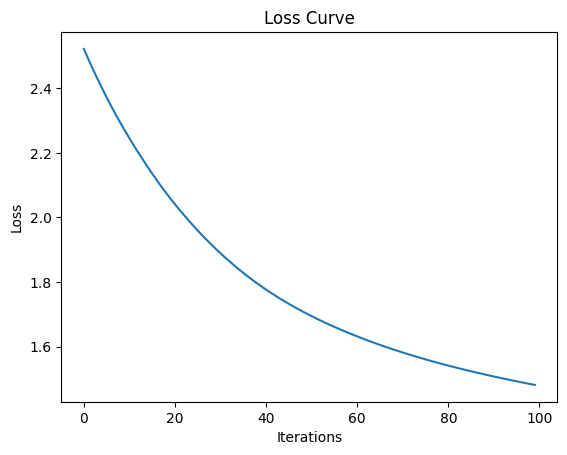

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

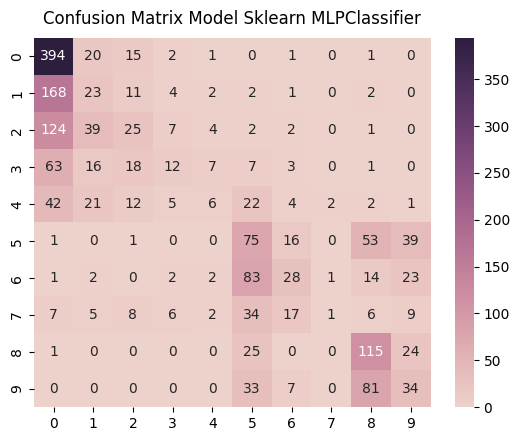

              precision    recall  f1-score      support
0.0            0.491885  0.907834  0.638057   434.000000
1.0            0.182540  0.107981  0.135693   213.000000
2.0            0.277778  0.122549  0.170068   204.000000
3.0            0.315789  0.094488  0.145455   127.000000
4.0            0.250000  0.051282  0.085106   117.000000
5.0            0.265018  0.405405  0.320513   185.000000
6.0            0.354430  0.179487  0.238298   156.000000
7.0            0.250000  0.010526  0.020202    95.000000
8.0            0.416667  0.696970  0.521542   165.000000
9.0            0.261538  0.219355  0.238596   155.000000
accuracy       0.385197  0.385197  0.385197     0.385197
macro avg      0.306565  0.279588  0.251353  1851.000000
weighted avg   0.332652  0.385197  0.318946  1851.000000
Mean Squared Error:  3.5742841707185304


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

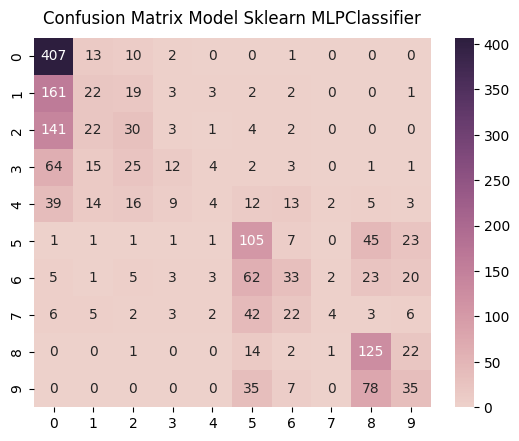

              precision    recall  f1-score  support
0.0            0.493932  0.939954  0.647574   433.00
1.0            0.236559  0.103286  0.143791   213.00
2.0            0.275229  0.147783  0.192308   203.00
3.0            0.333333  0.094488  0.147239   127.00
4.0            0.222222  0.034188  0.059259   117.00
5.0            0.377698  0.567568  0.453564   185.00
6.0            0.358696  0.210191  0.265060   157.00
7.0            0.444444  0.042105  0.076923    95.00
8.0            0.446429  0.757576  0.561798   165.00
9.0            0.315315  0.225806  0.263158   155.00
accuracy       0.420000  0.420000  0.420000     0.42
macro avg      0.350386  0.312295  0.281067  1850.00
weighted avg   0.367249  0.420000  0.347035  1850.00
Mean Squared Error:  3.324324324324324


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

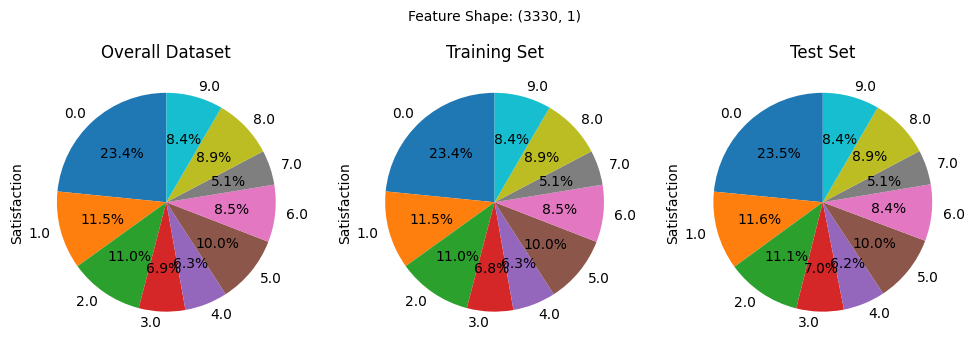

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


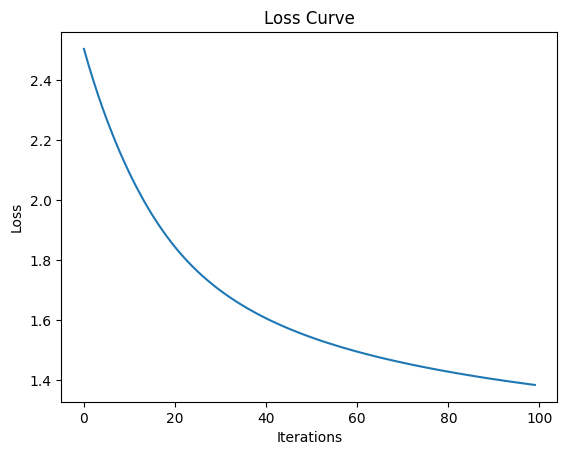

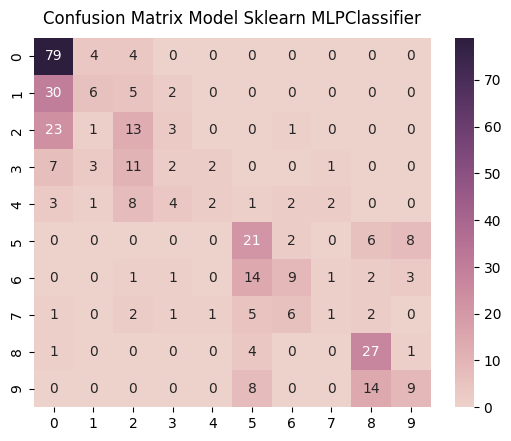

              precision    recall  f1-score     support
0.0            0.548611  0.908046  0.683983   87.000000
1.0            0.400000  0.139535  0.206897   43.000000
2.0            0.295455  0.317073  0.305882   41.000000
3.0            0.153846  0.076923  0.102564   26.000000
4.0            0.400000  0.086957  0.142857   23.000000
5.0            0.396226  0.567568  0.466667   37.000000
6.0            0.450000  0.290323  0.352941   31.000000
7.0            0.200000  0.052632  0.083333   19.000000
8.0            0.529412  0.818182  0.642857   33.000000
9.0            0.428571  0.290323  0.346154   31.000000
accuracy       0.455526  0.455526  0.455526    0.455526
macro avg      0.380212  0.354756  0.333413  371.000000
weighted avg   0.413503  0.455526  0.400628  371.000000
Mean Squared Error:  2.838274932614555


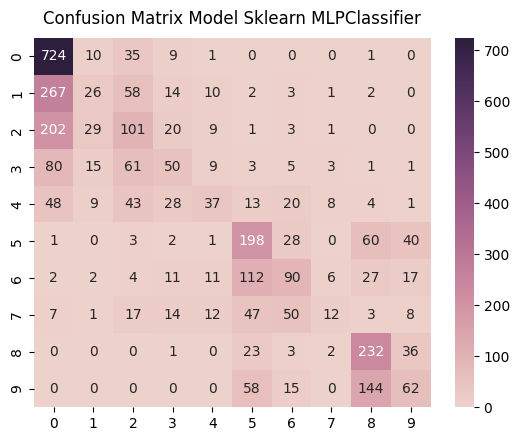

              precision    recall  f1-score     support
0.0            0.543952  0.928205  0.685931   780.00000
1.0            0.282609  0.067885  0.109474   383.00000
2.0            0.313665  0.275956  0.293605   366.00000
3.0            0.335570  0.219298  0.265252   228.00000
4.0            0.411111  0.175355  0.245847   211.00000
5.0            0.433260  0.594595  0.501266   333.00000
6.0            0.414747  0.319149  0.360721   282.00000
7.0            0.363636  0.070175  0.117647   171.00000
8.0            0.489451  0.781145  0.601816   297.00000
9.0            0.375758  0.222222  0.279279   279.00000
accuracy       0.460060  0.460060  0.460060     0.46006
macro avg      0.396376  0.365399  0.346084  3330.00000
weighted avg   0.415675  0.460060  0.403059  3330.00000
Mean Squared Error:  2.76036036036036


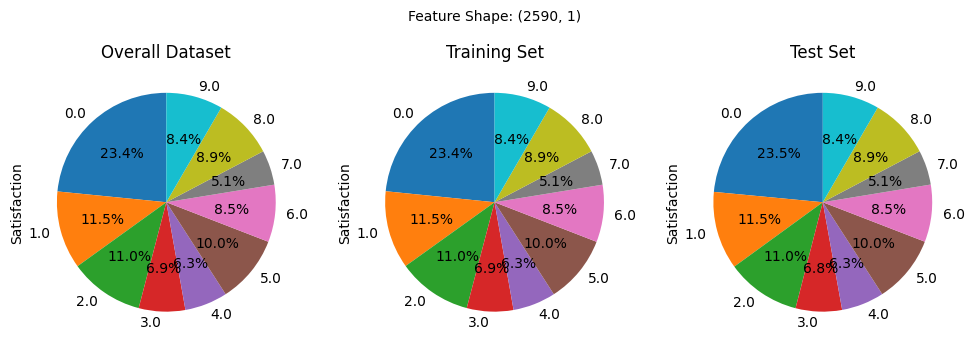

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


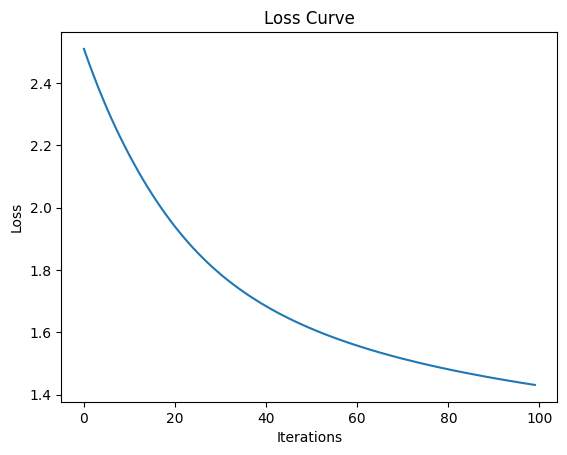

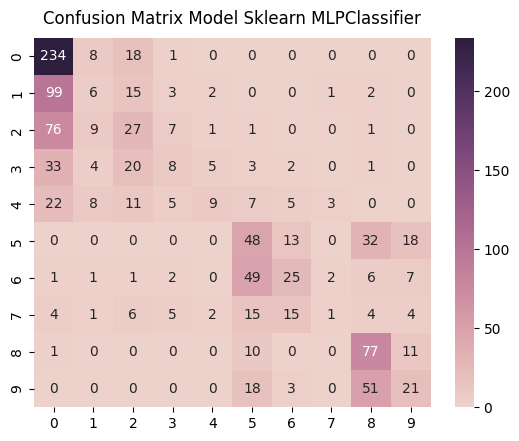

              precision    recall  f1-score      support
0.0            0.497872  0.896552  0.640219   261.000000
1.0            0.162162  0.046875  0.072727   128.000000
2.0            0.275510  0.221311  0.245455   122.000000
3.0            0.258065  0.105263  0.149533    76.000000
4.0            0.473684  0.128571  0.202247    70.000000
5.0            0.317881  0.432432  0.366412   111.000000
6.0            0.396825  0.265957  0.318471    94.000000
7.0            0.142857  0.017544  0.031250    57.000000
8.0            0.442529  0.777778  0.564103    99.000000
9.0            0.344262  0.225806  0.272727    93.000000
accuracy       0.410441  0.410441  0.410441     0.410441
macro avg      0.331165  0.311809  0.286314  1111.000000
weighted avg   0.354312  0.410441  0.346960  1111.000000
Mean Squared Error:  3.225922592259226


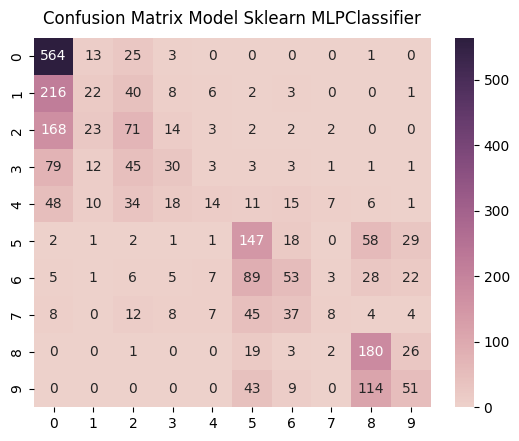

              precision    recall  f1-score      support
0.0            0.517431  0.930693  0.665094   606.000000
1.0            0.268293  0.073826  0.115789   298.000000
2.0            0.300847  0.249123  0.272553   285.000000
3.0            0.344828  0.168539  0.226415   178.000000
4.0            0.341463  0.085366  0.136585   164.000000
5.0            0.407202  0.567568  0.474194   259.000000
6.0            0.370629  0.242009  0.292818   219.000000
7.0            0.347826  0.060150  0.102564   133.000000
8.0            0.459184  0.779221  0.577849   231.000000
9.0            0.377778  0.235023  0.289773   217.000000
accuracy       0.440154  0.440154  0.440154     0.440154
macro avg      0.373548  0.339152  0.315363  2590.000000
weighted avg   0.392888  0.440154  0.376402  2590.000000
Mean Squared Error:  3.0297297297297296


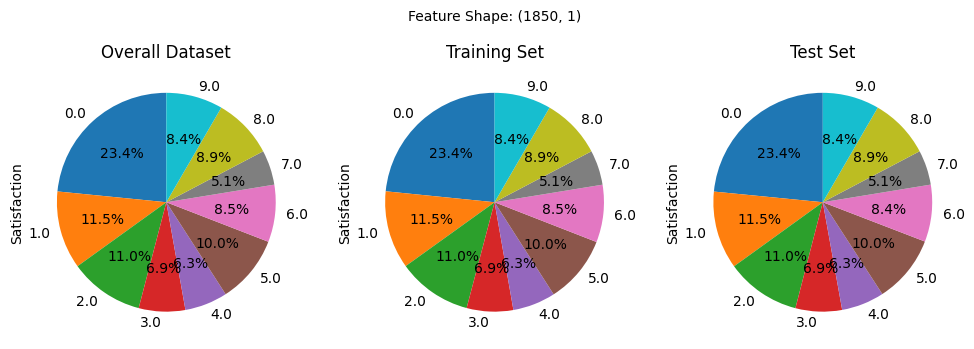

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


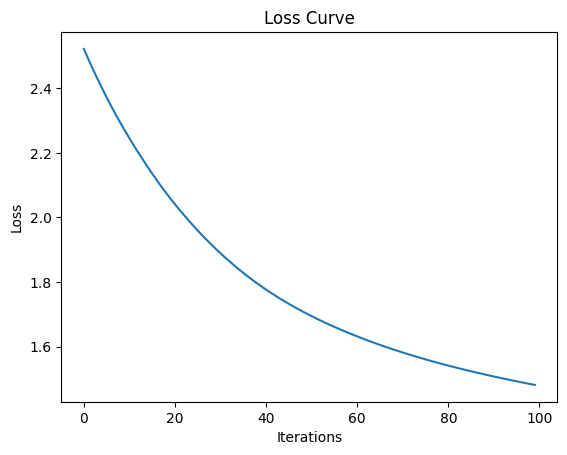

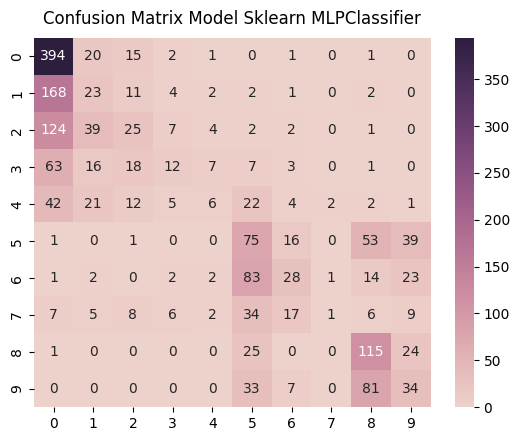

              precision    recall  f1-score      support
0.0            0.491885  0.907834  0.638057   434.000000
1.0            0.182540  0.107981  0.135693   213.000000
2.0            0.277778  0.122549  0.170068   204.000000
3.0            0.315789  0.094488  0.145455   127.000000
4.0            0.250000  0.051282  0.085106   117.000000
5.0            0.265018  0.405405  0.320513   185.000000
6.0            0.354430  0.179487  0.238298   156.000000
7.0            0.250000  0.010526  0.020202    95.000000
8.0            0.416667  0.696970  0.521542   165.000000
9.0            0.261538  0.219355  0.238596   155.000000
accuracy       0.385197  0.385197  0.385197     0.385197
macro avg      0.306565  0.279588  0.251353  1851.000000
weighted avg   0.332652  0.385197  0.318946  1851.000000
Mean Squared Error:  3.5742841707185304


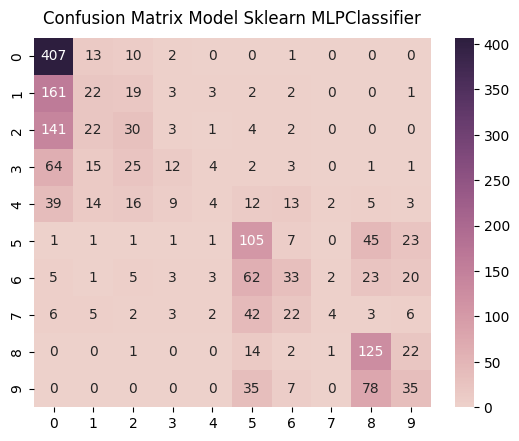

              precision    recall  f1-score  support
0.0            0.493932  0.939954  0.647574   433.00
1.0            0.236559  0.103286  0.143791   213.00
2.0            0.275229  0.147783  0.192308   203.00
3.0            0.333333  0.094488  0.147239   127.00
4.0            0.222222  0.034188  0.059259   117.00
5.0            0.377698  0.567568  0.453564   185.00
6.0            0.358696  0.210191  0.265060   157.00
7.0            0.444444  0.042105  0.076923    95.00
8.0            0.446429  0.757576  0.561798   165.00
9.0            0.315315  0.225806  0.263158   155.00
accuracy       0.420000  0.420000  0.420000     0.42
macro avg      0.350386  0.312295  0.281067  1850.00
weighted avg   0.367249  0.420000  0.347035  1850.00
Mean Squared Error:  3.324324324324324


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



## Two Hidden Layer

(Check Experiment 6 which have best Train and Experiment 4 for Best Test Accuracy)

### Experiment 1 | 32/64 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


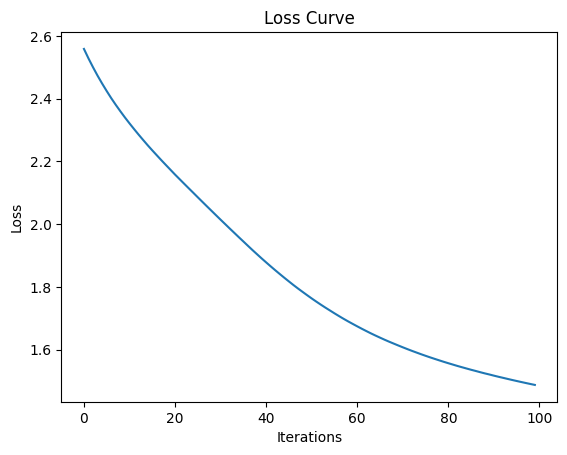

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32,64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

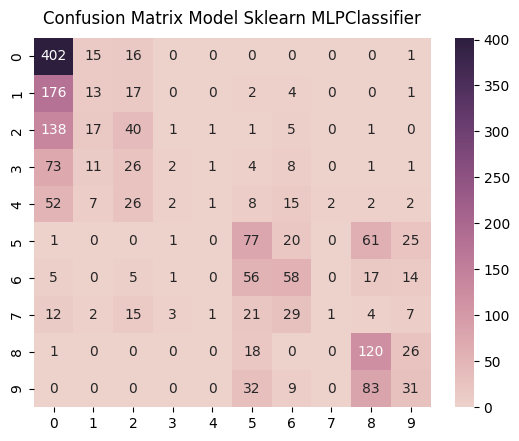

              precision    recall  f1-score      support
0.0            0.467442  0.926267  0.621329   434.000000
1.0            0.200000  0.061033  0.093525   213.000000
2.0            0.275862  0.196078  0.229226   204.000000
3.0            0.200000  0.015748  0.029197   127.000000
4.0            0.250000  0.008547  0.016529   117.000000
5.0            0.351598  0.416216  0.381188   185.000000
6.0            0.391892  0.371795  0.381579   156.000000
7.0            0.333333  0.010526  0.020408    95.000000
8.0            0.415225  0.727273  0.528634   165.000000
9.0            0.287037  0.200000  0.235741   155.000000
accuracy       0.402485  0.402485  0.402485     0.402485
macro avg      0.317239  0.293348  0.253736  1851.000000
weighted avg   0.338869  0.402485  0.322923  1851.000000
Mean Squared Error:  3.7687736358725012


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

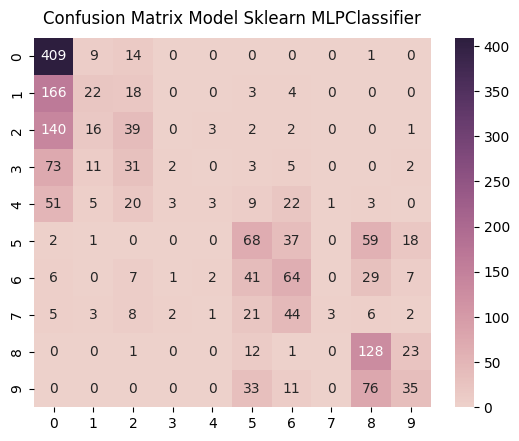

              precision    recall  f1-score      support
0.0            0.480047  0.944573  0.636576   433.000000
1.0            0.328358  0.103286  0.157143   213.000000
2.0            0.282609  0.192118  0.228739   203.000000
3.0            0.250000  0.015748  0.029630   127.000000
4.0            0.333333  0.025641  0.047619   117.000000
5.0            0.354167  0.367568  0.360743   185.000000
6.0            0.336842  0.407643  0.368876   157.000000
7.0            0.750000  0.031579  0.060606    95.000000
8.0            0.423841  0.775758  0.548180   165.000000
9.0            0.397727  0.225806  0.288066   155.000000
accuracy       0.417838  0.417838  0.417838     0.417838
macro avg      0.393692  0.308972  0.272618  1850.000000
weighted avg   0.393058  0.417838  0.340749  1850.000000
Mean Squared Error:  3.3535135135135135


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

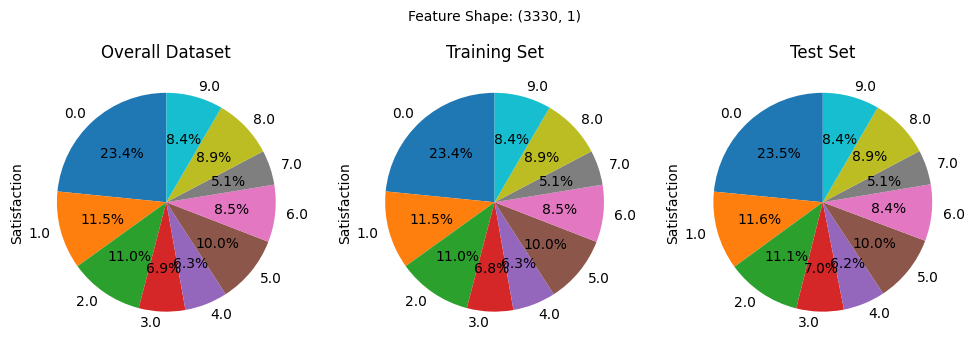

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


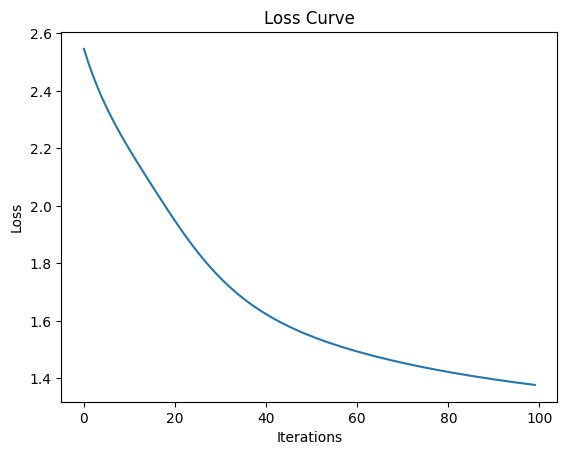

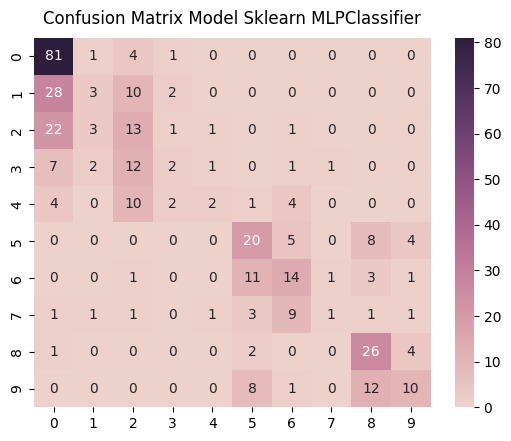

              precision    recall  f1-score     support
0.0            0.562500  0.931034  0.701299   87.000000
1.0            0.300000  0.069767  0.113208   43.000000
2.0            0.254902  0.317073  0.282609   41.000000
3.0            0.250000  0.076923  0.117647   26.000000
4.0            0.400000  0.086957  0.142857   23.000000
5.0            0.444444  0.540541  0.487805   37.000000
6.0            0.400000  0.451613  0.424242   31.000000
7.0            0.333333  0.052632  0.090909   19.000000
8.0            0.520000  0.787879  0.626506   33.000000
9.0            0.500000  0.322581  0.392157   31.000000
accuracy       0.463612  0.463612  0.463612    0.463612
macro avg      0.396518  0.363700  0.337924  371.000000
weighted avg   0.420017  0.463612  0.403158  371.000000
Mean Squared Error:  2.6576819407008085


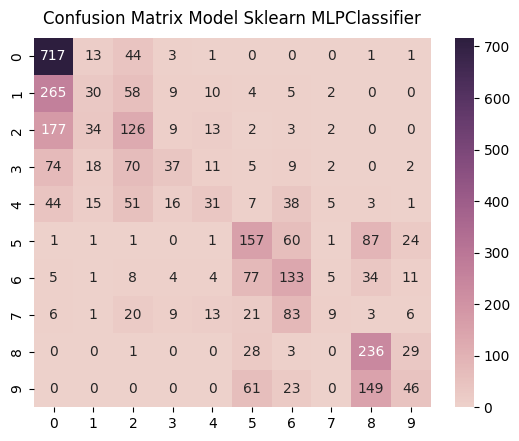

              precision    recall  f1-score      support
0.0            0.556245  0.919231  0.693088   780.000000
1.0            0.265487  0.078329  0.120968   383.000000
2.0            0.332454  0.344262  0.338255   366.000000
3.0            0.425287  0.162281  0.234921   228.000000
4.0            0.369048  0.146919  0.210169   211.000000
5.0            0.433702  0.471471  0.451799   333.000000
6.0            0.372549  0.471631  0.416275   282.000000
7.0            0.346154  0.052632  0.091371   171.000000
8.0            0.460039  0.794613  0.582716   297.000000
9.0            0.383333  0.164875  0.230576   279.000000
accuracy       0.457057  0.457057  0.457057     0.457057
macro avg      0.394430  0.360624  0.337014  3330.000000
weighted avg   0.415712  0.457057  0.399252  3330.000000
Mean Squared Error:  2.7915915915915916


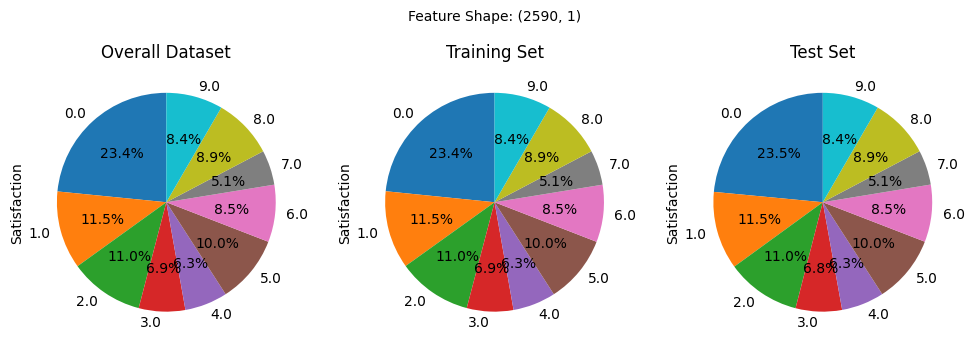

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


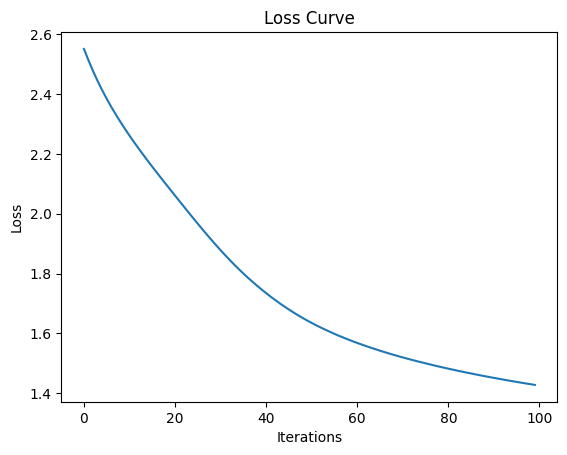

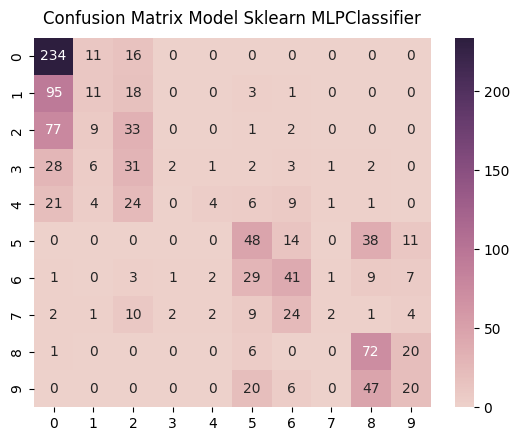

              precision    recall  f1-score      support
0.0            0.509804  0.896552  0.650000   261.000000
1.0            0.261905  0.085938  0.129412   128.000000
2.0            0.244444  0.270492  0.256809   122.000000
3.0            0.400000  0.026316  0.049383    76.000000
4.0            0.444444  0.057143  0.101266    70.000000
5.0            0.387097  0.432432  0.408511   111.000000
6.0            0.410000  0.436170  0.422680    94.000000
7.0            0.400000  0.035088  0.064516    57.000000
8.0            0.423529  0.727273  0.535316    99.000000
9.0            0.322581  0.215054  0.258065    93.000000
accuracy       0.420342  0.420342  0.420342     0.420342
macro avg      0.380380  0.318246  0.287596  1111.000000
weighted avg   0.390777  0.420342  0.354759  1111.000000
Mean Squared Error:  3.0558055805580557


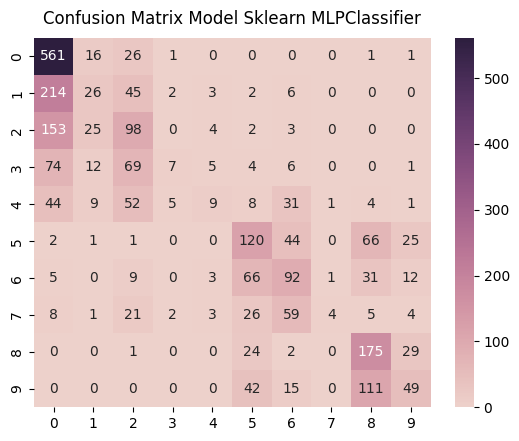

              precision    recall  f1-score      support
0.0            0.528746  0.925743  0.673065   606.000000
1.0            0.288889  0.087248  0.134021   298.000000
2.0            0.304348  0.343860  0.322900   285.000000
3.0            0.411765  0.039326  0.071795   178.000000
4.0            0.333333  0.054878  0.094241   164.000000
5.0            0.408163  0.463320  0.433996   259.000000
6.0            0.356589  0.420091  0.385744   219.000000
7.0            0.666667  0.030075  0.057554   133.000000
8.0            0.445293  0.757576  0.560897   231.000000
9.0            0.401639  0.225806  0.289086   217.000000
accuracy       0.440541  0.440541  0.440541     0.440541
macro avg      0.414543  0.334792  0.302330  2590.000000
weighted avg   0.418418  0.440541  0.372554  2590.000000
Mean Squared Error:  2.9891891891891893


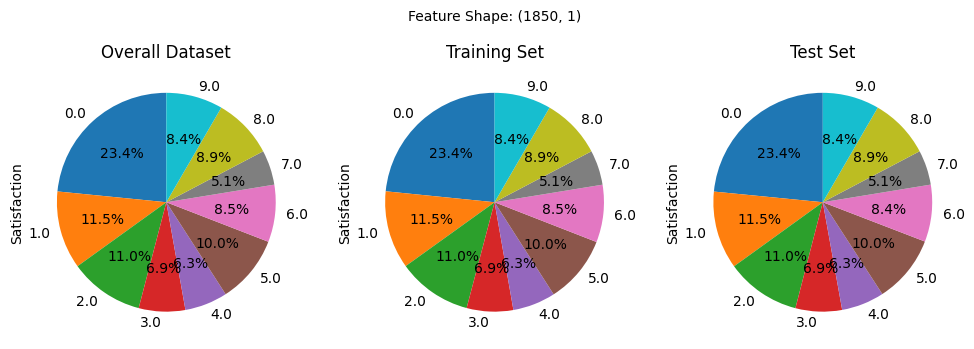

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


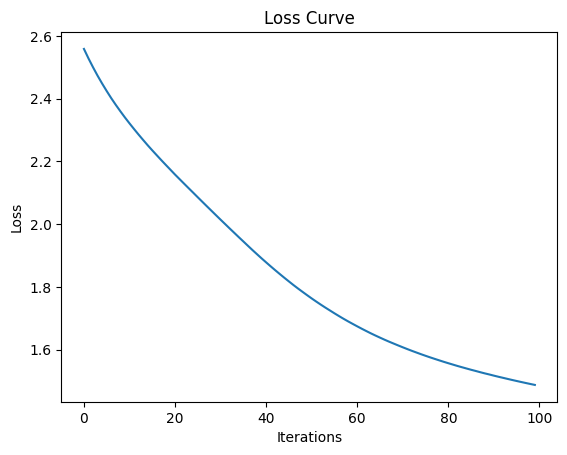

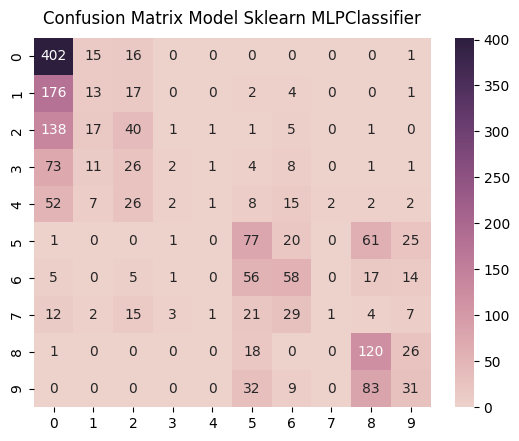

              precision    recall  f1-score      support
0.0            0.467442  0.926267  0.621329   434.000000
1.0            0.200000  0.061033  0.093525   213.000000
2.0            0.275862  0.196078  0.229226   204.000000
3.0            0.200000  0.015748  0.029197   127.000000
4.0            0.250000  0.008547  0.016529   117.000000
5.0            0.351598  0.416216  0.381188   185.000000
6.0            0.391892  0.371795  0.381579   156.000000
7.0            0.333333  0.010526  0.020408    95.000000
8.0            0.415225  0.727273  0.528634   165.000000
9.0            0.287037  0.200000  0.235741   155.000000
accuracy       0.402485  0.402485  0.402485     0.402485
macro avg      0.317239  0.293348  0.253736  1851.000000
weighted avg   0.338869  0.402485  0.322923  1851.000000
Mean Squared Error:  3.7687736358725012


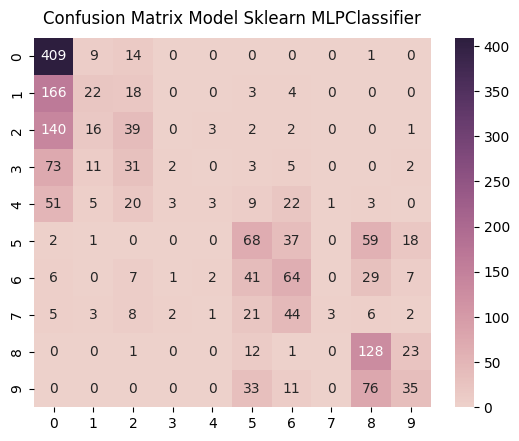

              precision    recall  f1-score      support
0.0            0.480047  0.944573  0.636576   433.000000
1.0            0.328358  0.103286  0.157143   213.000000
2.0            0.282609  0.192118  0.228739   203.000000
3.0            0.250000  0.015748  0.029630   127.000000
4.0            0.333333  0.025641  0.047619   117.000000
5.0            0.354167  0.367568  0.360743   185.000000
6.0            0.336842  0.407643  0.368876   157.000000
7.0            0.750000  0.031579  0.060606    95.000000
8.0            0.423841  0.775758  0.548180   165.000000
9.0            0.397727  0.225806  0.288066   155.000000
accuracy       0.417838  0.417838  0.417838     0.417838
macro avg      0.393692  0.308972  0.272618  1850.000000
weighted avg   0.393058  0.417838  0.340749  1850.000000
Mean Squared Error:  3.3535135135135135


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(32,64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 2 | 32/128 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


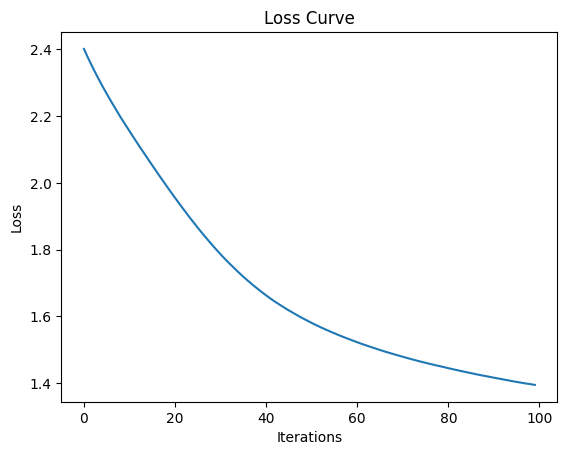

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

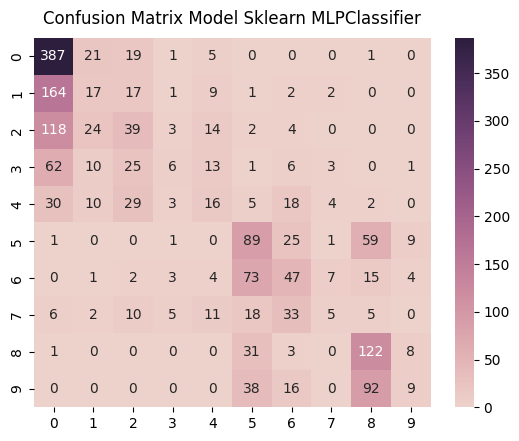

              precision    recall  f1-score      support
0.0            0.503251  0.891705  0.643392   434.000000
1.0            0.200000  0.079812  0.114094   213.000000
2.0            0.276596  0.191176  0.226087   204.000000
3.0            0.260870  0.047244  0.080000   127.000000
4.0            0.222222  0.136752  0.169312   117.000000
5.0            0.344961  0.481081  0.401806   185.000000
6.0            0.305195  0.301282  0.303226   156.000000
7.0            0.227273  0.052632  0.085470    95.000000
8.0            0.412162  0.739394  0.529284   165.000000
9.0            0.290323  0.058065  0.096774   155.000000
accuracy       0.398163  0.398163  0.398163     0.398163
macro avg      0.304285  0.297914  0.264944  1851.000000
weighted avg   0.336355  0.398163  0.330478  1851.000000
Mean Squared Error:  3.254457050243112


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

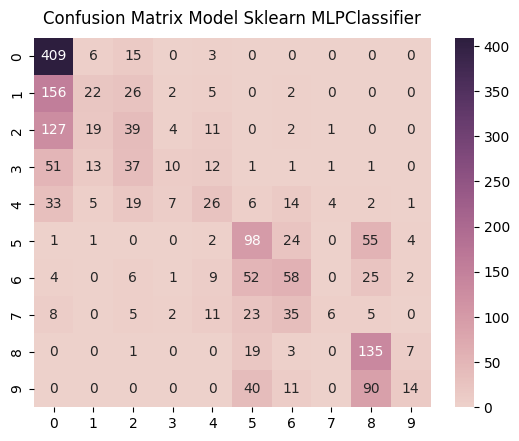

              precision    recall  f1-score      support
0.0            0.518378  0.944573  0.669394   433.000000
1.0            0.333333  0.103286  0.157706   213.000000
2.0            0.263514  0.192118  0.222222   203.000000
3.0            0.384615  0.078740  0.130719   127.000000
4.0            0.329114  0.222222  0.265306   117.000000
5.0            0.410042  0.529730  0.462264   185.000000
6.0            0.386667  0.369427  0.377850   157.000000
7.0            0.500000  0.063158  0.112150    95.000000
8.0            0.431310  0.818182  0.564854   165.000000
9.0            0.500000  0.090323  0.153005   155.000000
accuracy       0.441622  0.441622  0.441622     0.441622
macro avg      0.405697  0.341176  0.311547  1850.000000
weighted avg   0.415694  0.441622  0.372219  1850.000000
Mean Squared Error:  2.903783783783784


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

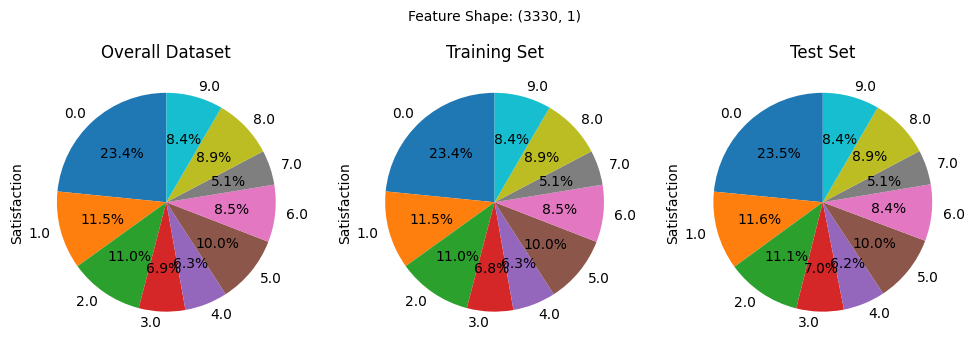

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


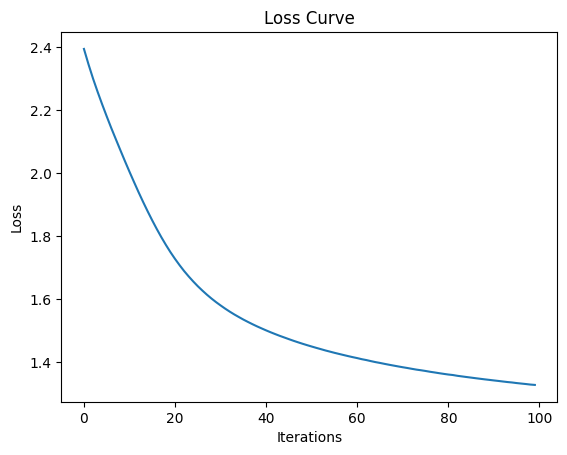

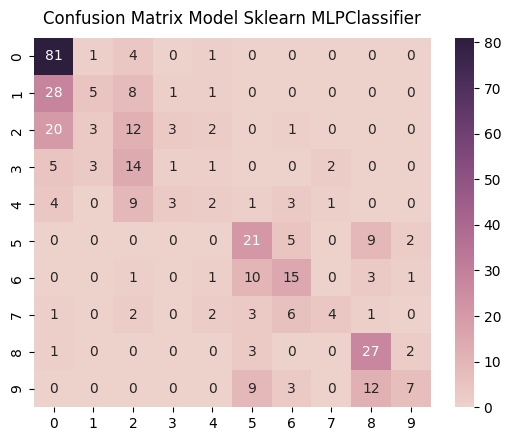

              precision    recall  f1-score     support
0.0            0.578571  0.931034  0.713656   87.000000
1.0            0.416667  0.116279  0.181818   43.000000
2.0            0.240000  0.292683  0.263736   41.000000
3.0            0.125000  0.038462  0.058824   26.000000
4.0            0.200000  0.086957  0.121212   23.000000
5.0            0.446809  0.567568  0.500000   37.000000
6.0            0.454545  0.483871  0.468750   31.000000
7.0            0.571429  0.210526  0.307692   19.000000
8.0            0.519231  0.818182  0.635294   33.000000
9.0            0.583333  0.225806  0.325581   31.000000
accuracy       0.471698  0.471698  0.471698    0.471698
macro avg      0.413558  0.377137  0.357656  371.000000
weighted avg   0.438384  0.471698  0.417714  371.000000
Mean Squared Error:  2.700808625336927


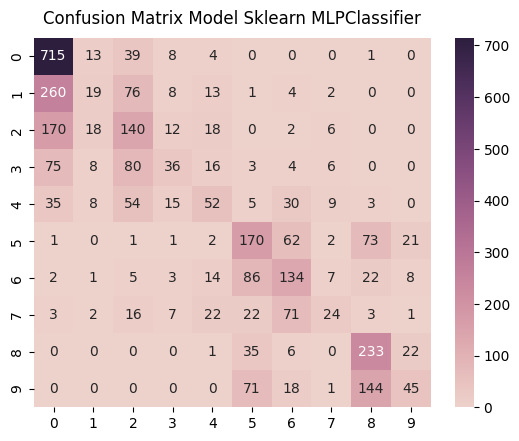

              precision    recall  f1-score      support
0.0            0.567010  0.916667  0.700637   780.000000
1.0            0.275362  0.049608  0.084071   383.000000
2.0            0.340633  0.382514  0.360360   366.000000
3.0            0.400000  0.157895  0.226415   228.000000
4.0            0.366197  0.246445  0.294618   211.000000
5.0            0.432570  0.510511  0.468320   333.000000
6.0            0.404834  0.475177  0.437194   282.000000
7.0            0.421053  0.140351  0.210526   171.000000
8.0            0.486430  0.784512  0.600515   297.000000
9.0            0.463918  0.161290  0.239362   279.000000
accuracy       0.470871  0.470871  0.470871     0.470871
macro avg      0.415801  0.382497  0.362202  3330.000000
weighted avg   0.433929  0.470871  0.415841  3330.000000
Mean Squared Error:  2.5837837837837836


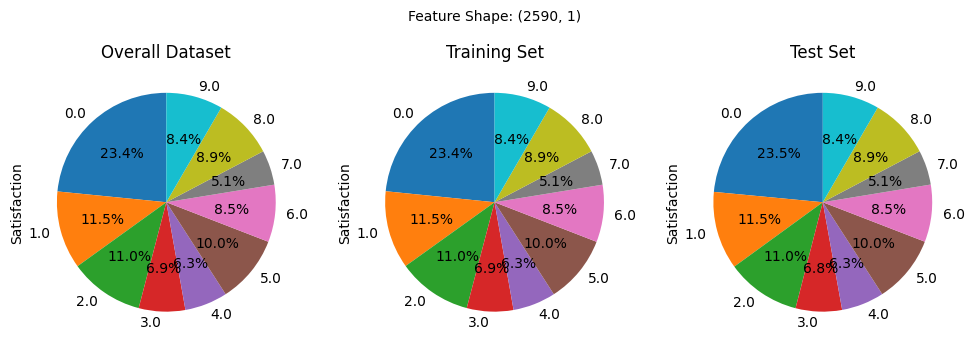

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


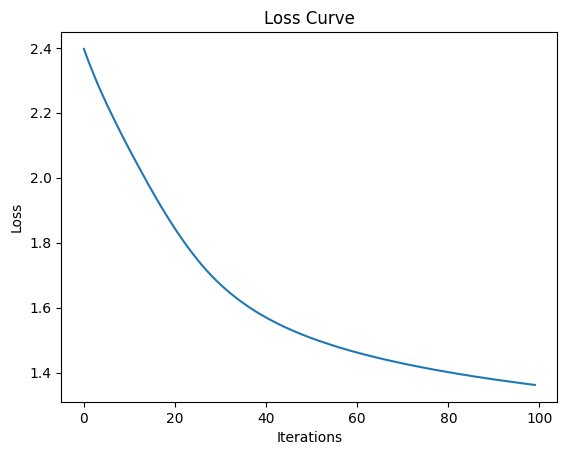

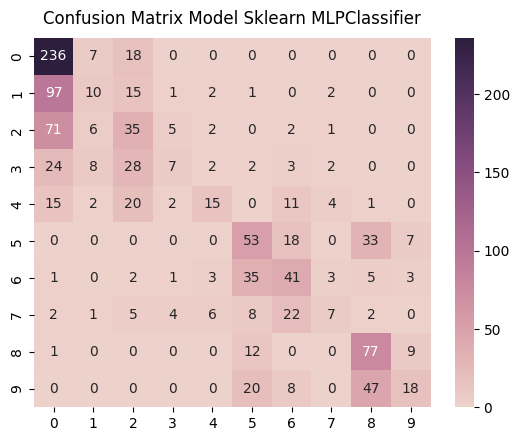

              precision    recall  f1-score      support
0.0            0.527964  0.904215  0.666667   261.000000
1.0            0.294118  0.078125  0.123457   128.000000
2.0            0.284553  0.286885  0.285714   122.000000
3.0            0.350000  0.092105  0.145833    76.000000
4.0            0.500000  0.214286  0.300000    70.000000
5.0            0.404580  0.477477  0.438017   111.000000
6.0            0.390476  0.436170  0.412060    94.000000
7.0            0.368421  0.122807  0.184211    57.000000
8.0            0.466667  0.777778  0.583333    99.000000
9.0            0.486486  0.193548  0.276923    93.000000
accuracy       0.449145  0.449145  0.449145     0.449145
macro avg      0.407327  0.358340  0.341621  1111.000000
weighted avg   0.419278  0.449145  0.394330  1111.000000
Mean Squared Error:  2.7866786678667865


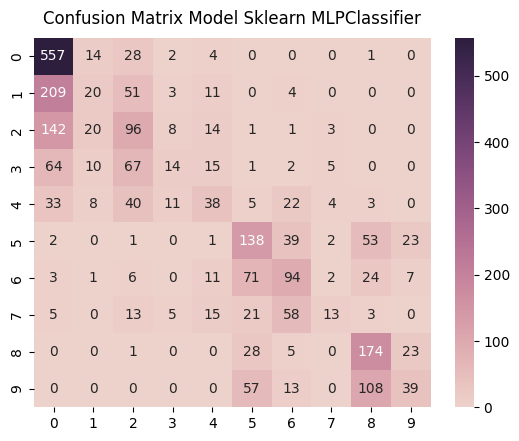

              precision    recall  f1-score      support
0.0            0.548768  0.919142  0.687230   606.000000
1.0            0.273973  0.067114  0.107817   298.000000
2.0            0.316832  0.336842  0.326531   285.000000
3.0            0.325581  0.078652  0.126697   178.000000
4.0            0.348624  0.231707  0.278388   164.000000
5.0            0.428571  0.532819  0.475043   259.000000
6.0            0.394958  0.429224  0.411379   219.000000
7.0            0.448276  0.097744  0.160494   133.000000
8.0            0.475410  0.753247  0.582915   231.000000
9.0            0.423913  0.179724  0.252427   217.000000
accuracy       0.456757  0.456757  0.456757     0.456757
macro avg      0.398491  0.362621  0.340892  2590.000000
weighted avg   0.416428  0.456757  0.399136  2590.000000
Mean Squared Error:  2.7405405405405405


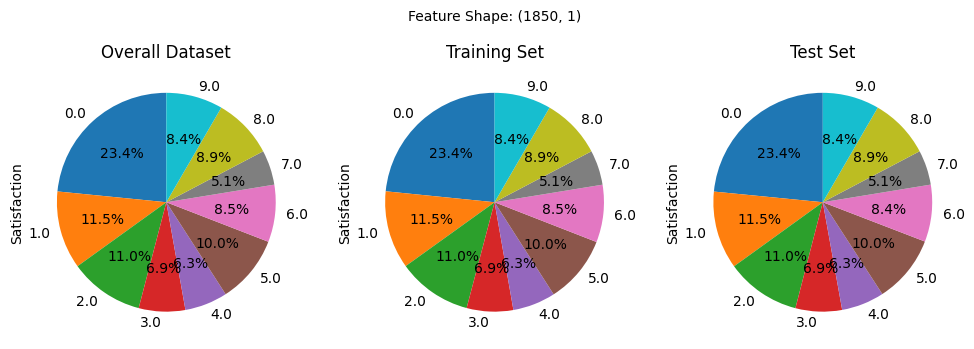

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


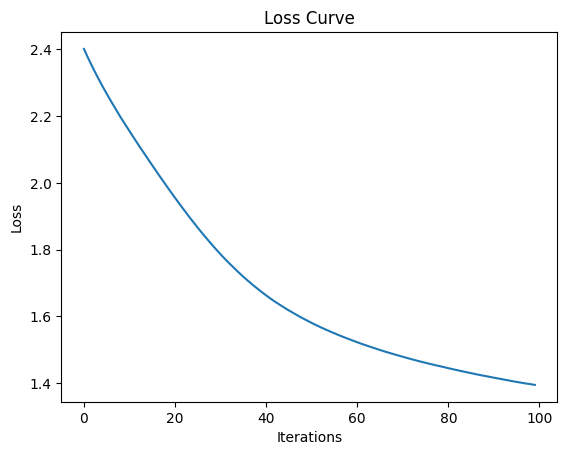

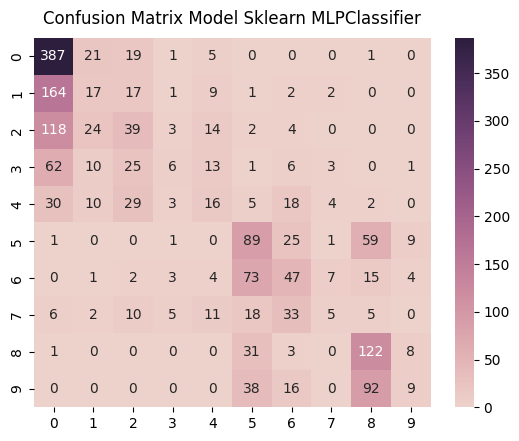

              precision    recall  f1-score      support
0.0            0.503251  0.891705  0.643392   434.000000
1.0            0.200000  0.079812  0.114094   213.000000
2.0            0.276596  0.191176  0.226087   204.000000
3.0            0.260870  0.047244  0.080000   127.000000
4.0            0.222222  0.136752  0.169312   117.000000
5.0            0.344961  0.481081  0.401806   185.000000
6.0            0.305195  0.301282  0.303226   156.000000
7.0            0.227273  0.052632  0.085470    95.000000
8.0            0.412162  0.739394  0.529284   165.000000
9.0            0.290323  0.058065  0.096774   155.000000
accuracy       0.398163  0.398163  0.398163     0.398163
macro avg      0.304285  0.297914  0.264944  1851.000000
weighted avg   0.336355  0.398163  0.330478  1851.000000
Mean Squared Error:  3.254457050243112


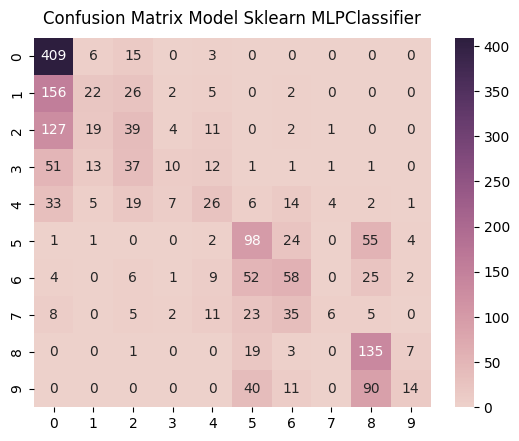

              precision    recall  f1-score      support
0.0            0.518378  0.944573  0.669394   433.000000
1.0            0.333333  0.103286  0.157706   213.000000
2.0            0.263514  0.192118  0.222222   203.000000
3.0            0.384615  0.078740  0.130719   127.000000
4.0            0.329114  0.222222  0.265306   117.000000
5.0            0.410042  0.529730  0.462264   185.000000
6.0            0.386667  0.369427  0.377850   157.000000
7.0            0.500000  0.063158  0.112150    95.000000
8.0            0.431310  0.818182  0.564854   165.000000
9.0            0.500000  0.090323  0.153005   155.000000
accuracy       0.441622  0.441622  0.441622     0.441622
macro avg      0.405697  0.341176  0.311547  1850.000000
weighted avg   0.415694  0.441622  0.372219  1850.000000
Mean Squared Error:  2.903783783783784


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(32, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 3 | 32/32 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


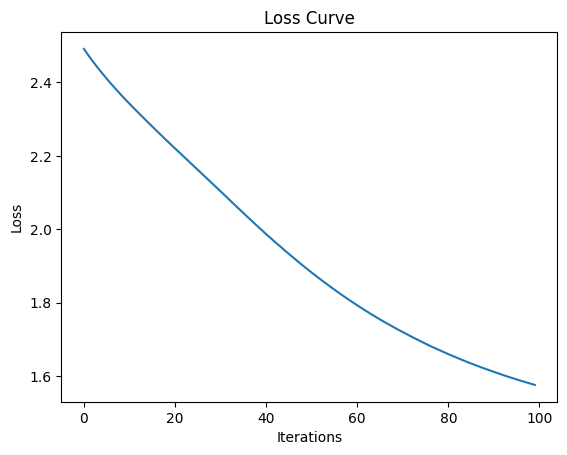

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

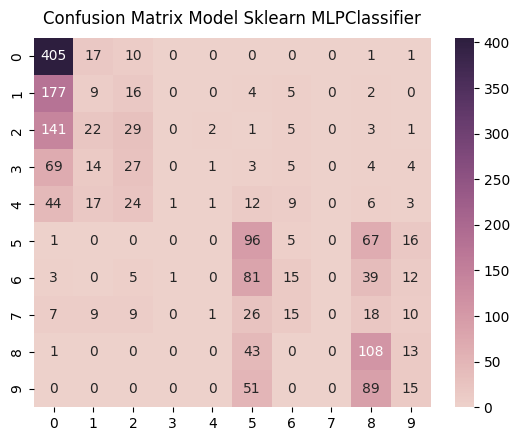

              precision    recall  f1-score      support
0.0            0.477594  0.933180  0.631825   434.000000
1.0            0.102273  0.042254  0.059801   213.000000
2.0            0.241667  0.142157  0.179012   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.200000  0.008547  0.016393   117.000000
5.0            0.302839  0.518919  0.382470   185.000000
6.0            0.254237  0.096154  0.139535   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.320475  0.654545  0.430279   165.000000
9.0            0.200000  0.096774  0.130435   155.000000
accuracy       0.366288  0.366288  0.366288     0.366288
macro avg      0.209908  0.249253  0.196975  1851.000000
weighted avg   0.260035  0.366288  0.275054  1851.000000
Mean Squared Error:  4.094543490005402


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

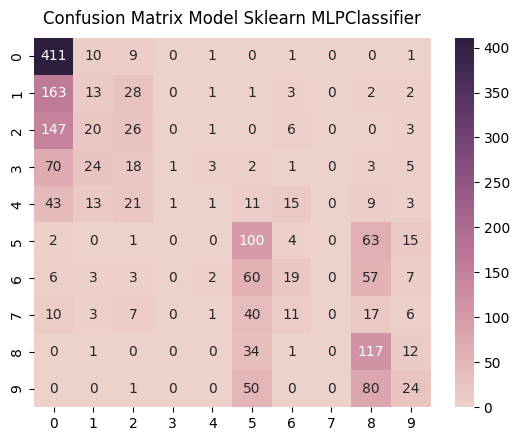

              precision    recall  f1-score      support
0.0            0.482394  0.949192  0.639689   433.000000
1.0            0.149425  0.061033  0.086667   213.000000
2.0            0.228070  0.128079  0.164038   203.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.100000  0.008547  0.015748   117.000000
5.0            0.335570  0.540541  0.414079   185.000000
6.0            0.311475  0.121019  0.174312   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.336207  0.709091  0.456140   165.000000
9.0            0.307692  0.154839  0.206009   155.000000
accuracy       0.384865  0.384865  0.384865     0.384865
macro avg      0.275083  0.268021  0.217218  1850.000000
weighted avg   0.311541  0.384865  0.293904  1850.000000
Mean Squared Error:  4.114594594594594


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

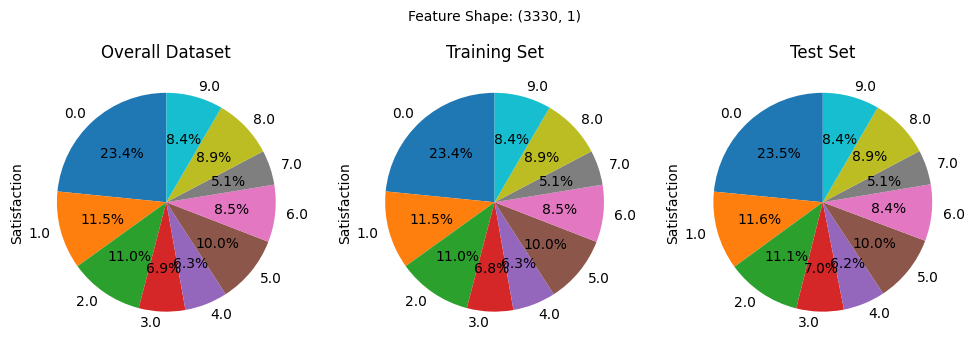

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


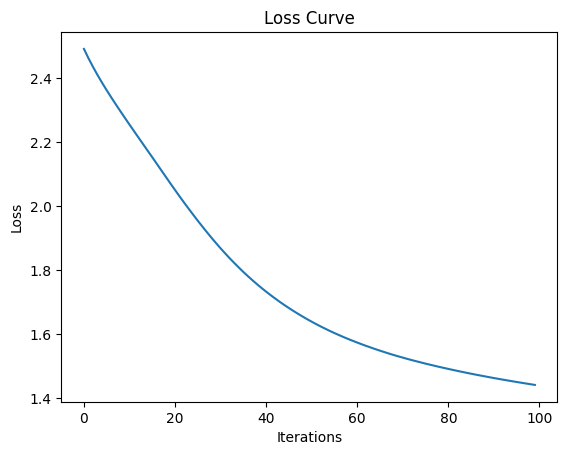

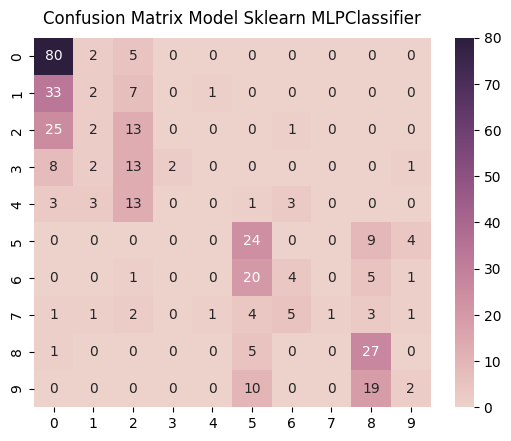

              precision    recall  f1-score    support
0.0            0.529801  0.919540  0.672269   87.00000
1.0            0.166667  0.046512  0.072727   43.00000
2.0            0.240741  0.317073  0.273684   41.00000
3.0            1.000000  0.076923  0.142857   26.00000
4.0            0.000000  0.000000  0.000000   23.00000
5.0            0.375000  0.648649  0.475248   37.00000
6.0            0.307692  0.129032  0.181818   31.00000
7.0            1.000000  0.052632  0.100000   19.00000
8.0            0.428571  0.818182  0.562500   33.00000
9.0            0.222222  0.064516  0.100000   31.00000
accuracy       0.417790  0.417790  0.417790    0.41779
macro avg      0.427069  0.307306  0.258110  371.00000
weighted avg   0.411253  0.417790  0.332434  371.00000
Mean Squared Error:  3.0404312668463613


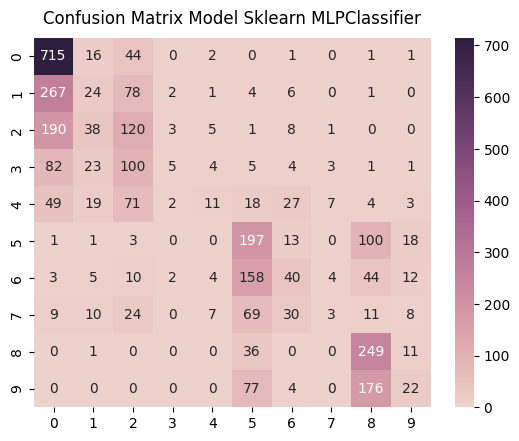

              precision    recall  f1-score      support
0.0            0.543313  0.916667  0.682252   780.000000
1.0            0.175182  0.062663  0.092308   383.000000
2.0            0.266667  0.327869  0.294118   366.000000
3.0            0.357143  0.021930  0.041322   228.000000
4.0            0.323529  0.052133  0.089796   211.000000
5.0            0.348673  0.591592  0.438753   333.000000
6.0            0.300752  0.141844  0.192771   282.000000
7.0            0.166667  0.017544  0.031746   171.000000
8.0            0.424191  0.838384  0.563348   297.000000
9.0            0.289474  0.078853  0.123944   279.000000
accuracy       0.416216  0.416216  0.416216     0.416216
macro avg      0.319559  0.304948  0.255036  3330.000000
weighted avg   0.352655  0.416216  0.333728  3330.000000
Mean Squared Error:  3.142342342342342


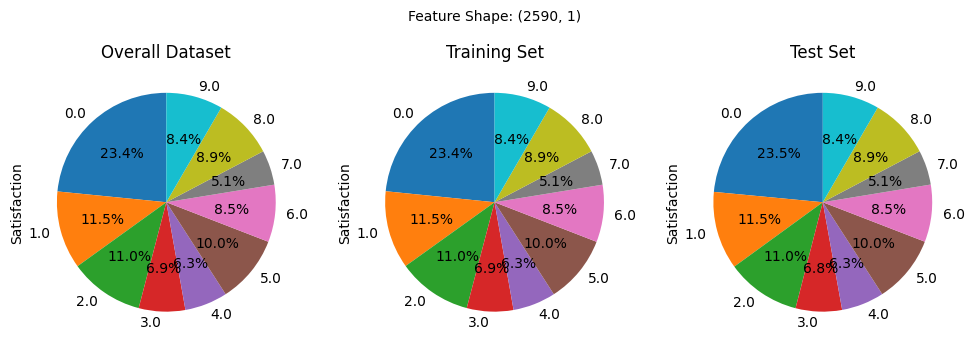

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


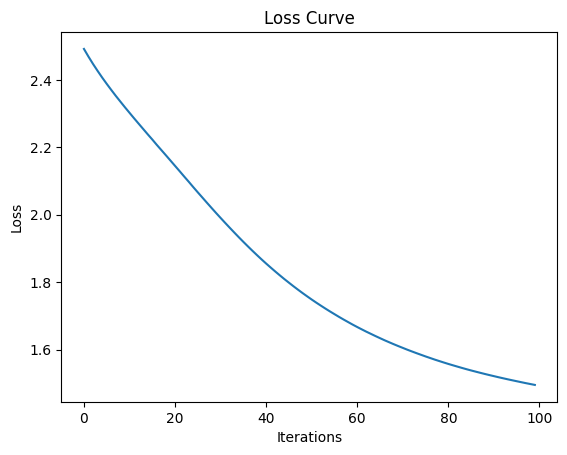

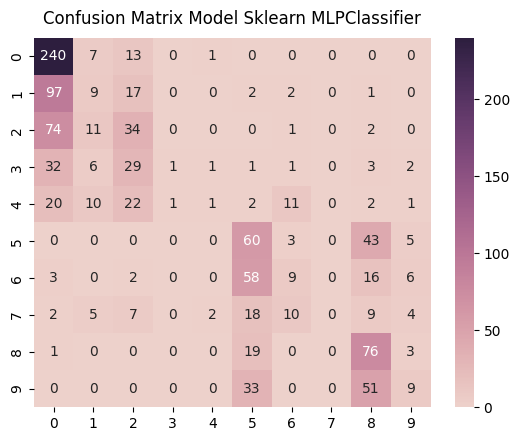

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.511727  0.919540  0.657534   261.00000
1.0            0.187500  0.070312  0.102273   128.00000
2.0            0.274194  0.278689  0.276423   122.00000
3.0            0.500000  0.013158  0.025641    76.00000
4.0            0.200000  0.014286  0.026667    70.00000
5.0            0.310881  0.540541  0.394737   111.00000
6.0            0.243243  0.095745  0.137405    94.00000
7.0            0.000000  0.000000  0.000000    57.00000
8.0            0.374384  0.767677  0.503311    99.00000
9.0            0.300000  0.096774  0.146341    93.00000
accuracy       0.395140  0.395140  0.395140     0.39514
macro avg      0.290193  0.279672  0.227033  1111.00000
weighted avg   0.328847  0.395140  0.308205  1111.00000
Mean Squared Error:  3.6003600360036003


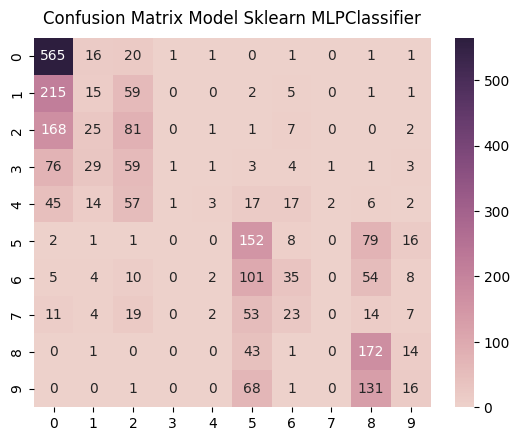

              precision    recall  f1-score      support
0.0            0.519779  0.932343  0.667454   606.000000
1.0            0.137615  0.050336  0.073710   298.000000
2.0            0.263844  0.284211  0.273649   285.000000
3.0            0.333333  0.005618  0.011050   178.000000
4.0            0.300000  0.018293  0.034483   164.000000
5.0            0.345455  0.586873  0.434907   259.000000
6.0            0.343137  0.159817  0.218069   219.000000
7.0            0.000000  0.000000  0.000000   133.000000
8.0            0.374728  0.744589  0.498551   231.000000
9.0            0.228571  0.073733  0.111498   217.000000
accuracy       0.401544  0.401544  0.401544     0.401544
macro avg      0.284646  0.285581  0.232337  2590.000000
weighted avg   0.324520  0.401544  0.313441  2590.000000
Mean Squared Error:  3.559073359073359


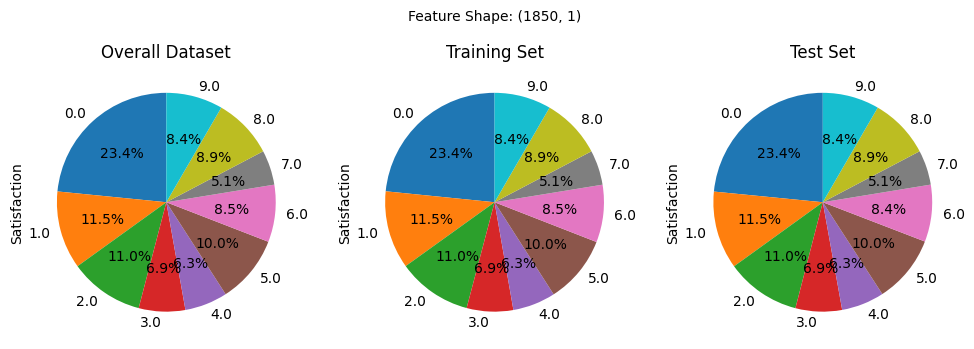

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


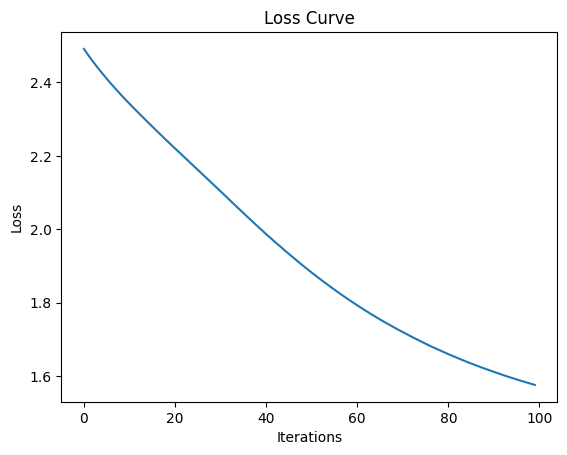

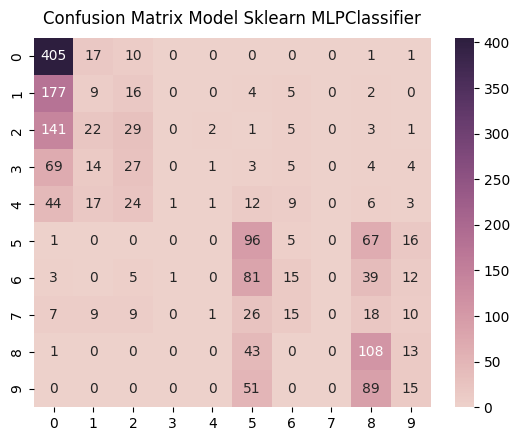

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.477594  0.933180  0.631825   434.000000
1.0            0.102273  0.042254  0.059801   213.000000
2.0            0.241667  0.142157  0.179012   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.200000  0.008547  0.016393   117.000000
5.0            0.302839  0.518919  0.382470   185.000000
6.0            0.254237  0.096154  0.139535   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.320475  0.654545  0.430279   165.000000
9.0            0.200000  0.096774  0.130435   155.000000
accuracy       0.366288  0.366288  0.366288     0.366288
macro avg      0.209908  0.249253  0.196975  1851.000000
weighted avg   0.260035  0.366288  0.275054  1851.000000
Mean Squared Error:  4.094543490005402


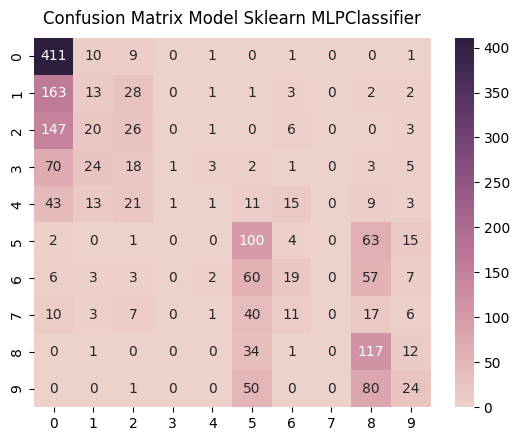

              precision    recall  f1-score      support
0.0            0.482394  0.949192  0.639689   433.000000
1.0            0.149425  0.061033  0.086667   213.000000
2.0            0.228070  0.128079  0.164038   203.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.100000  0.008547  0.015748   117.000000
5.0            0.335570  0.540541  0.414079   185.000000
6.0            0.311475  0.121019  0.174312   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.336207  0.709091  0.456140   165.000000
9.0            0.307692  0.154839  0.206009   155.000000
accuracy       0.384865  0.384865  0.384865     0.384865
macro avg      0.275083  0.268021  0.217218  1850.000000
weighted avg   0.311541  0.384865  0.293904  1850.000000
Mean Squared Error:  4.114594594594594


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(32,32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 4 | 64/128 Unit (Test Accuracy 0.427337)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


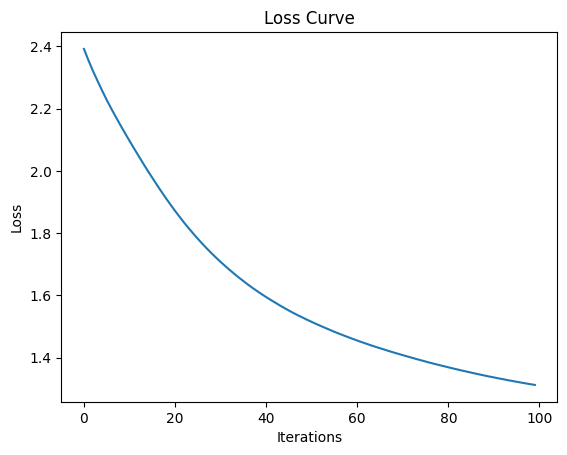

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

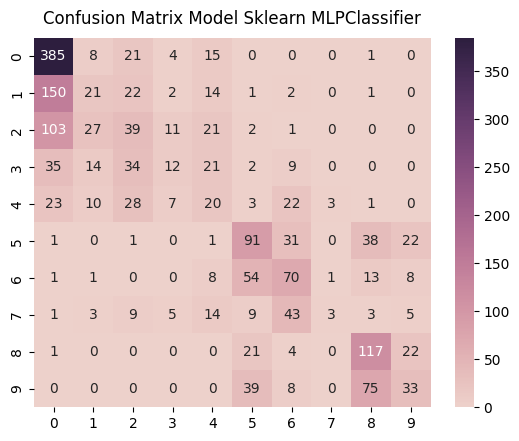

              precision    recall  f1-score      support
0.0            0.550000  0.887097  0.679012   434.000000
1.0            0.250000  0.098592  0.141414   213.000000
2.0            0.253247  0.191176  0.217877   204.000000
3.0            0.292683  0.094488  0.142857   127.000000
4.0            0.175439  0.170940  0.173160   117.000000
5.0            0.409910  0.491892  0.447174   185.000000
6.0            0.368421  0.448718  0.404624   156.000000
7.0            0.428571  0.031579  0.058824    95.000000
8.0            0.469880  0.709091  0.565217   165.000000
9.0            0.366667  0.212903  0.269388   155.000000
accuracy       0.427337  0.427337  0.427337     0.427337
macro avg      0.356482  0.333648  0.309955  1851.000000
weighted avg   0.383411  0.427337  0.374995  1851.000000
Mean Squared Error:  2.9340896812533765


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

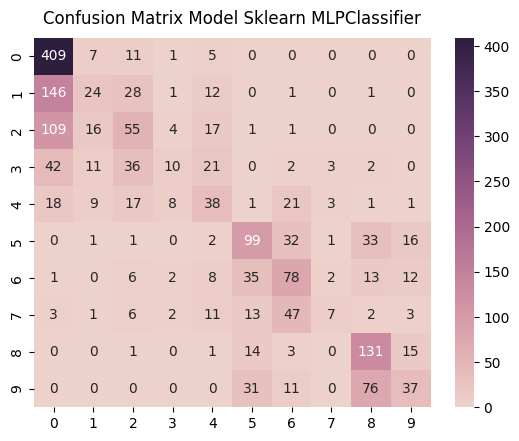

              precision    recall  f1-score  support
0.0            0.561813  0.944573  0.704565   433.00
1.0            0.347826  0.112676  0.170213   213.00
2.0            0.341615  0.270936  0.302198   203.00
3.0            0.357143  0.078740  0.129032   127.00
4.0            0.330435  0.324786  0.327586   117.00
5.0            0.510309  0.535135  0.522427   185.00
6.0            0.397959  0.496815  0.441926   157.00
7.0            0.437500  0.073684  0.126126    95.00
8.0            0.505792  0.793939  0.617925   165.00
9.0            0.440476  0.238710  0.309623   155.00
accuracy       0.480000  0.480000  0.480000     0.48
macro avg      0.423087  0.386999  0.365162  1850.00
weighted avg   0.443728  0.480000  0.424516  1850.00
Mean Squared Error:  2.535135135135135


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

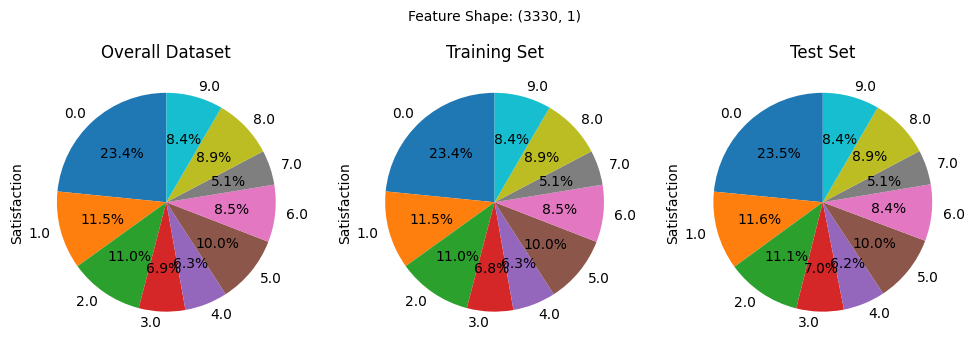

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


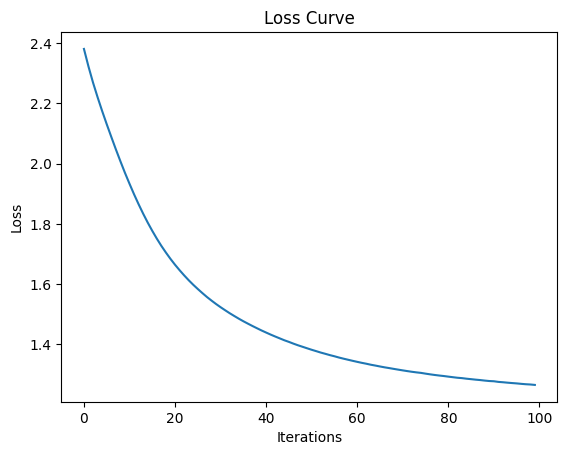

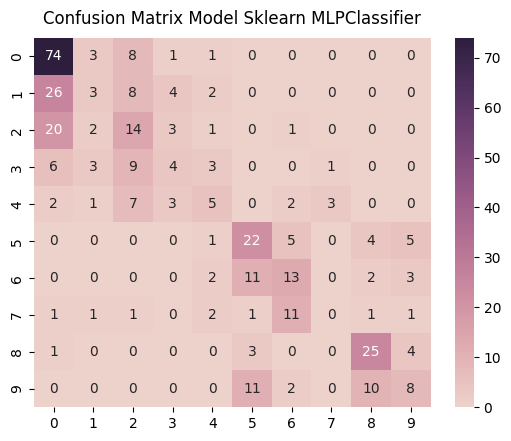

              precision    recall  f1-score    support
0.0            0.569231  0.850575  0.682028   87.00000
1.0            0.230769  0.069767  0.107143   43.00000
2.0            0.297872  0.341463  0.318182   41.00000
3.0            0.266667  0.153846  0.195122   26.00000
4.0            0.294118  0.217391  0.250000   23.00000
5.0            0.458333  0.594595  0.517647   37.00000
6.0            0.382353  0.419355  0.400000   31.00000
7.0            0.000000  0.000000  0.000000   19.00000
8.0            0.595238  0.757576  0.666667   33.00000
9.0            0.380952  0.258065  0.307692   31.00000
accuracy       0.452830  0.452830  0.452830    0.45283
macro avg      0.347553  0.366263  0.344448  371.00000
weighted avg   0.392508  0.452830  0.406748  371.00000
Mean Squared Error:  2.849056603773585


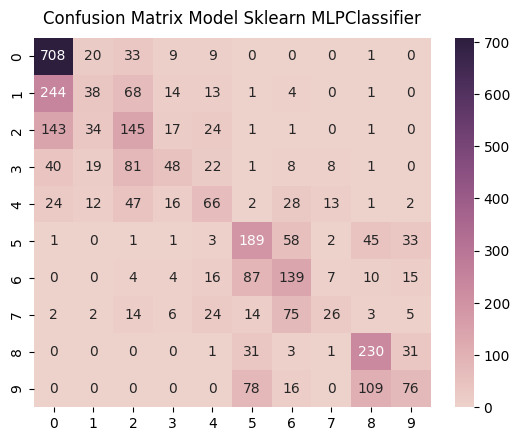

              precision    recall  f1-score  support
0.0            0.609294  0.907692  0.729145    780.0
1.0            0.304000  0.099217  0.149606    383.0
2.0            0.368957  0.396175  0.382082    366.0
3.0            0.417391  0.210526  0.279883    228.0
4.0            0.370787  0.312796  0.339332    211.0
5.0            0.467822  0.567568  0.512890    333.0
6.0            0.418675  0.492908  0.452769    282.0
7.0            0.456140  0.152047  0.228070    171.0
8.0            0.572139  0.774411  0.658083    297.0
9.0            0.469136  0.272401  0.344671    279.0
accuracy       0.500000  0.500000  0.500000      0.5
macro avg      0.445434  0.418574  0.407653   3330.0
weighted avg   0.466302  0.500000  0.459572   3330.0
Mean Squared Error:  2.3816816816816817


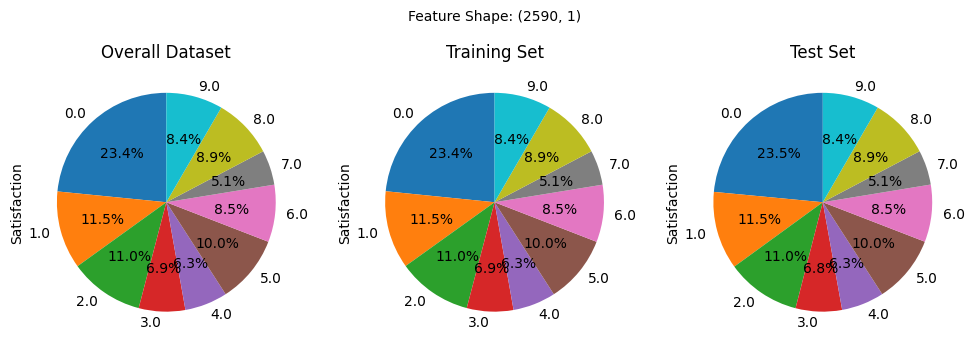

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


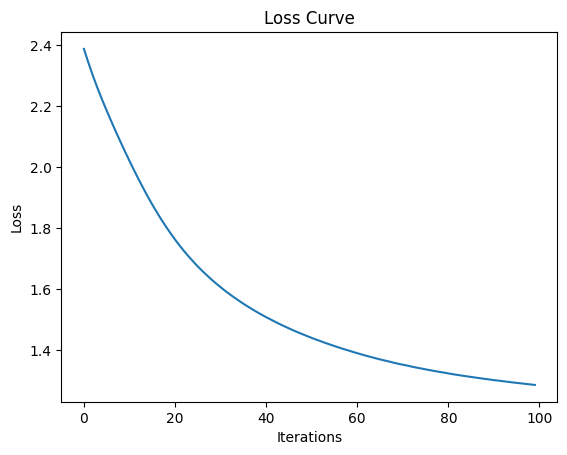

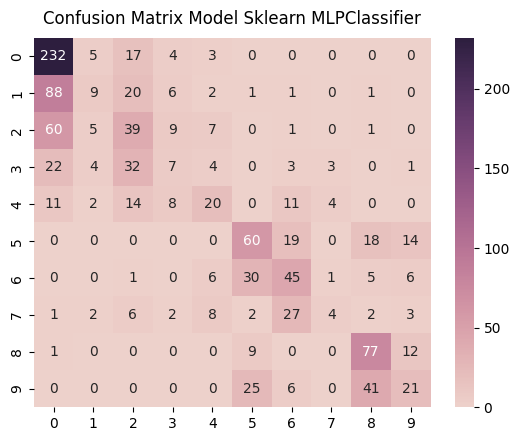

              precision    recall  f1-score      support
0.0            0.559036  0.888889  0.686391   261.000000
1.0            0.333333  0.070312  0.116129   128.000000
2.0            0.302326  0.319672  0.310757   122.000000
3.0            0.194444  0.092105  0.125000    76.000000
4.0            0.400000  0.285714  0.333333    70.000000
5.0            0.472441  0.540541  0.504202   111.000000
6.0            0.398230  0.478723  0.434783    94.000000
7.0            0.333333  0.070175  0.115942    57.000000
8.0            0.531034  0.777778  0.631148    99.000000
9.0            0.368421  0.225806  0.280000    93.000000
accuracy       0.462646  0.462646  0.462646     0.462646
macro avg      0.389260  0.374972  0.353768  1111.000000
weighted avg   0.417594  0.462646  0.411095  1111.000000
Mean Squared Error:  2.7506750675067506


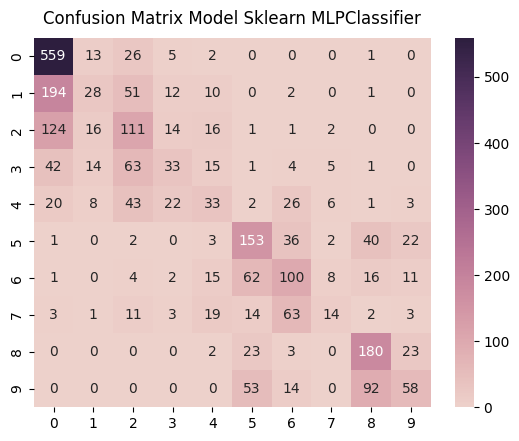

              precision    recall  f1-score      support
0.0            0.592161  0.922442  0.721290   606.000000
1.0            0.350000  0.093960  0.148148   298.000000
2.0            0.356913  0.389474  0.372483   285.000000
3.0            0.362637  0.185393  0.245353   178.000000
4.0            0.286957  0.201220  0.236559   164.000000
5.0            0.495146  0.590734  0.538732   259.000000
6.0            0.401606  0.456621  0.427350   219.000000
7.0            0.378378  0.105263  0.164706   133.000000
8.0            0.538922  0.779221  0.637168   231.000000
9.0            0.483333  0.267281  0.344214   217.000000
accuracy       0.489961  0.489961  0.489961     0.489961
macro avg      0.424605  0.399161  0.383600  2590.000000
weighted avg   0.452654  0.489961  0.442774  2590.000000
Mean Squared Error:  2.4177606177606177


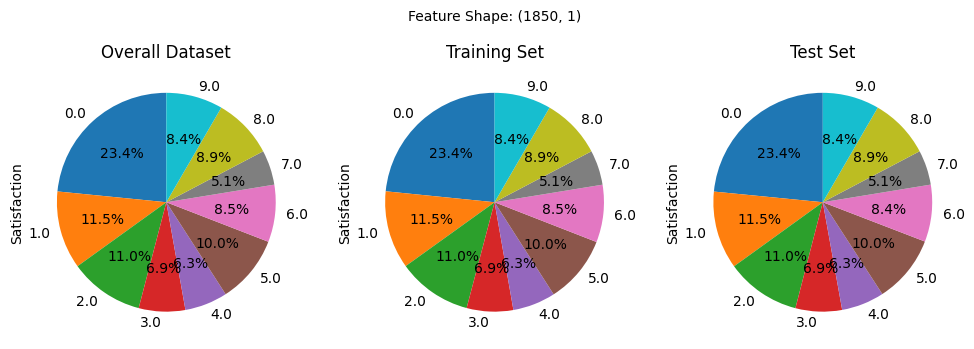

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


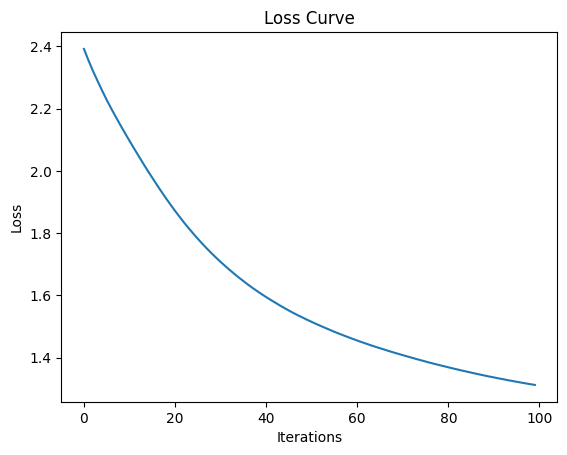

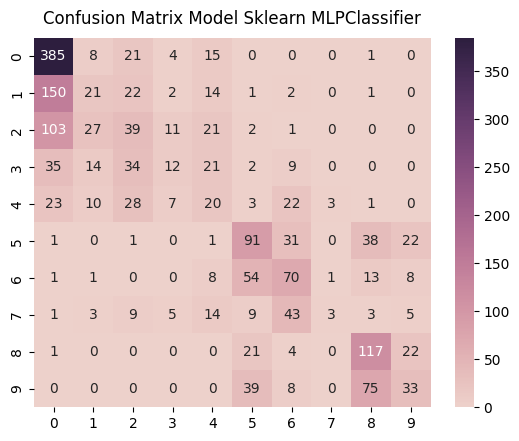

              precision    recall  f1-score      support
0.0            0.550000  0.887097  0.679012   434.000000
1.0            0.250000  0.098592  0.141414   213.000000
2.0            0.253247  0.191176  0.217877   204.000000
3.0            0.292683  0.094488  0.142857   127.000000
4.0            0.175439  0.170940  0.173160   117.000000
5.0            0.409910  0.491892  0.447174   185.000000
6.0            0.368421  0.448718  0.404624   156.000000
7.0            0.428571  0.031579  0.058824    95.000000
8.0            0.469880  0.709091  0.565217   165.000000
9.0            0.366667  0.212903  0.269388   155.000000
accuracy       0.427337  0.427337  0.427337     0.427337
macro avg      0.356482  0.333648  0.309955  1851.000000
weighted avg   0.383411  0.427337  0.374995  1851.000000
Mean Squared Error:  2.9340896812533765


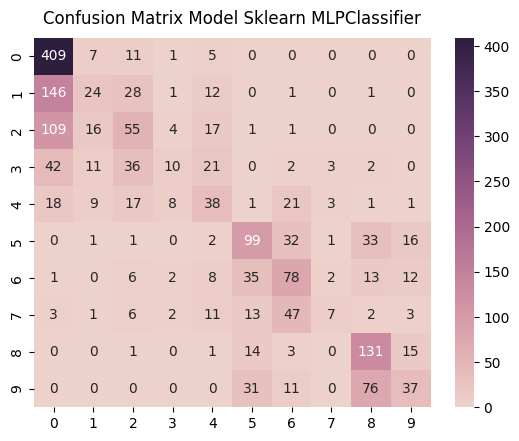

              precision    recall  f1-score  support
0.0            0.561813  0.944573  0.704565   433.00
1.0            0.347826  0.112676  0.170213   213.00
2.0            0.341615  0.270936  0.302198   203.00
3.0            0.357143  0.078740  0.129032   127.00
4.0            0.330435  0.324786  0.327586   117.00
5.0            0.510309  0.535135  0.522427   185.00
6.0            0.397959  0.496815  0.441926   157.00
7.0            0.437500  0.073684  0.126126    95.00
8.0            0.505792  0.793939  0.617925   165.00
9.0            0.440476  0.238710  0.309623   155.00
accuracy       0.480000  0.480000  0.480000     0.48
macro avg      0.423087  0.386999  0.365162  1850.00
weighted avg   0.443728  0.480000  0.424516  1850.00
Mean Squared Error:  2.535135135135135


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(64, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 5 | 64/64 Unit

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


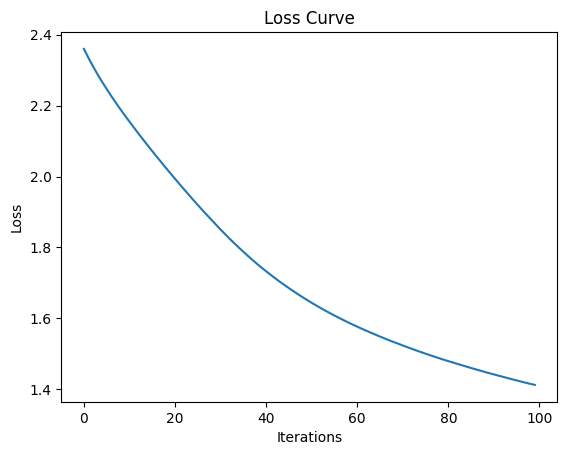

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64,64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

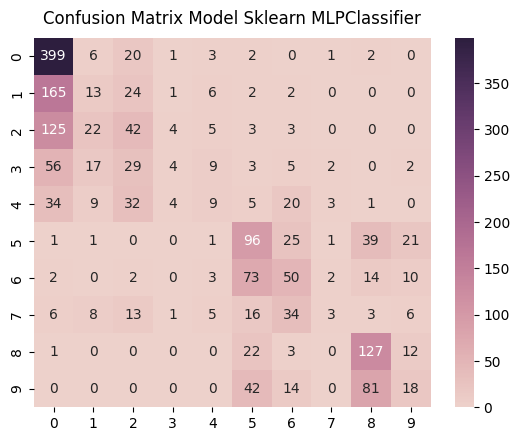

              precision    recall  f1-score      support
0.0            0.505703  0.919355  0.652494   434.000000
1.0            0.171053  0.061033  0.089965   213.000000
2.0            0.259259  0.205882  0.229508   204.000000
3.0            0.266667  0.031496  0.056338   127.000000
4.0            0.219512  0.076923  0.113924   117.000000
5.0            0.363636  0.518919  0.427617   185.000000
6.0            0.320513  0.320513  0.320513   156.000000
7.0            0.250000  0.031579  0.056075    95.000000
8.0            0.475655  0.769697  0.587963   165.000000
9.0            0.260870  0.116129  0.160714   155.000000
accuracy       0.411129  0.411129  0.411129     0.411129
macro avg      0.309287  0.305153  0.269511  1851.000000
weighted avg   0.339432  0.411129  0.338201  1851.000000
Mean Squared Error:  3.4192328471096705


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

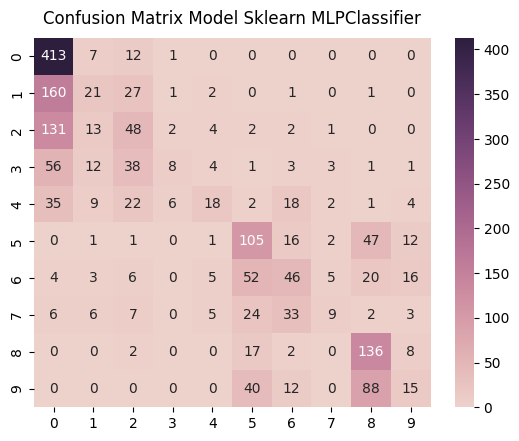

              precision    recall  f1-score      support
0.0            0.513043  0.953811  0.667205   433.000000
1.0            0.291667  0.098592  0.147368   213.000000
2.0            0.294479  0.236453  0.262295   203.000000
3.0            0.444444  0.062992  0.110345   127.000000
4.0            0.461538  0.153846  0.230769   117.000000
5.0            0.432099  0.567568  0.490654   185.000000
6.0            0.345865  0.292994  0.317241   157.000000
7.0            0.409091  0.094737  0.153846    95.000000
8.0            0.459459  0.824242  0.590022   165.000000
9.0            0.254237  0.096774  0.140187   155.000000
accuracy       0.442703  0.442703  0.442703     0.442703
macro avg      0.390592  0.338201  0.310993  1850.000000
weighted avg   0.401523  0.442703  0.372338  1850.000000
Mean Squared Error:  3.1810810810810812


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

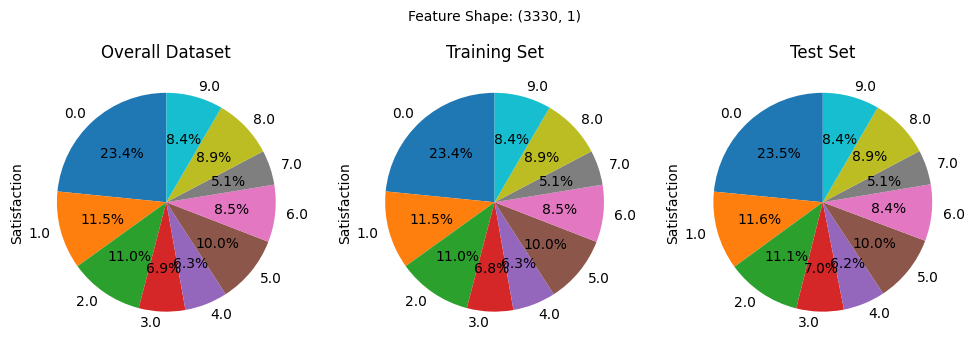

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


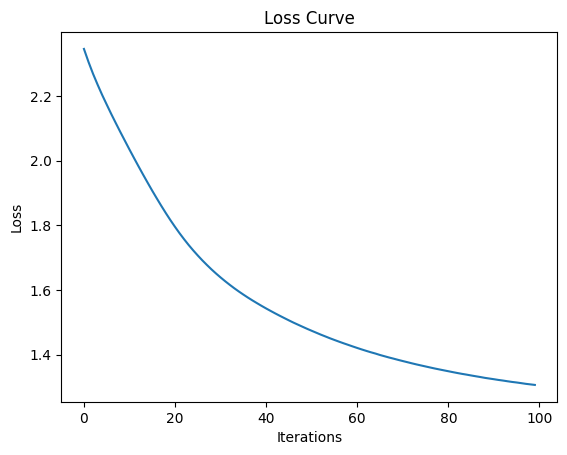

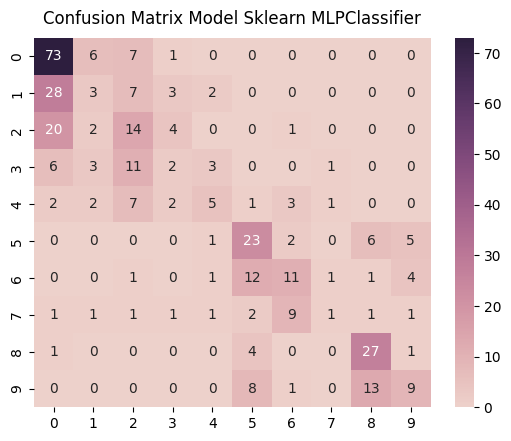

              precision    recall  f1-score    support
0.0            0.557252  0.839080  0.669725   87.00000
1.0            0.176471  0.069767  0.100000   43.00000
2.0            0.291667  0.341463  0.314607   41.00000
3.0            0.153846  0.076923  0.102564   26.00000
4.0            0.384615  0.217391  0.277778   23.00000
5.0            0.460000  0.621622  0.528736   37.00000
6.0            0.407407  0.354839  0.379310   31.00000
7.0            0.250000  0.052632  0.086957   19.00000
8.0            0.562500  0.818182  0.666667   33.00000
9.0            0.450000  0.290323  0.352941   31.00000
accuracy       0.452830  0.452830  0.452830    0.45283
macro avg      0.369376  0.368222  0.347928  371.00000
weighted avg   0.398344  0.452830  0.405487  371.00000
Mean Squared Error:  2.765498652291105


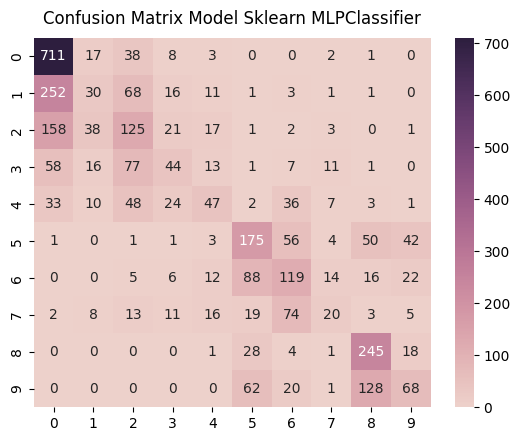

              precision    recall  f1-score      support
0.0            0.585185  0.911538  0.712782   780.000000
1.0            0.252101  0.078329  0.119522   383.000000
2.0            0.333333  0.341530  0.337382   366.000000
3.0            0.335878  0.192982  0.245125   228.000000
4.0            0.382114  0.222749  0.281437   211.000000
5.0            0.464191  0.525526  0.492958   333.000000
6.0            0.370717  0.421986  0.394693   282.000000
7.0            0.312500  0.116959  0.170213   171.000000
8.0            0.546875  0.824916  0.657718   297.000000
9.0            0.433121  0.243728  0.311927   279.000000
accuracy       0.475676  0.475676  0.475676     0.475676
macro avg      0.401601  0.388024  0.372376  3330.000000
weighted avg   0.428836  0.475676  0.428659  3330.000000
Mean Squared Error:  2.6084084084084083


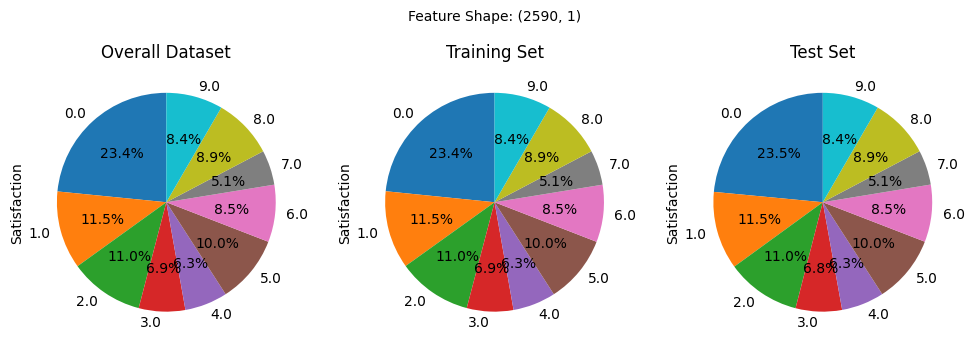

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


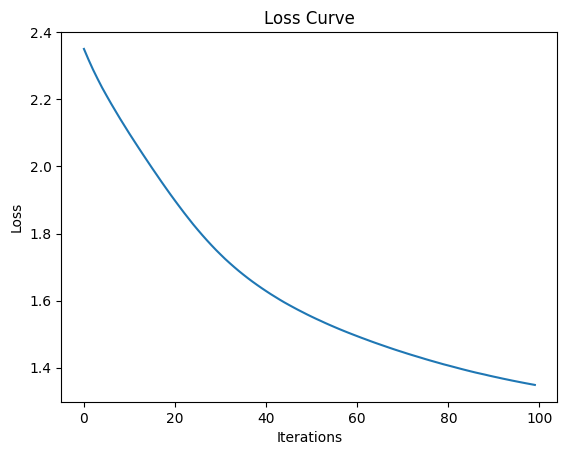

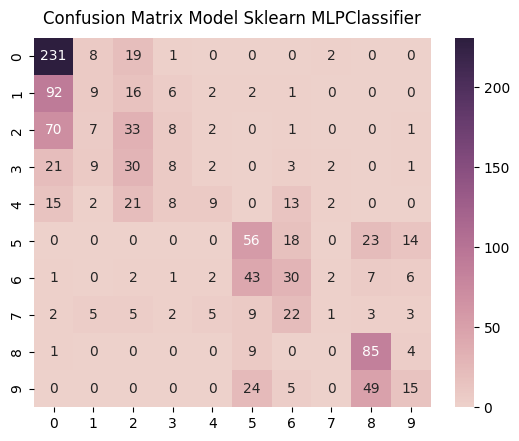

              precision    recall  f1-score      support
0.0            0.533487  0.885057  0.665706   261.000000
1.0            0.225000  0.070312  0.107143   128.000000
2.0            0.261905  0.270492  0.266129   122.000000
3.0            0.235294  0.105263  0.145455    76.000000
4.0            0.409091  0.128571  0.195652    70.000000
5.0            0.391608  0.504505  0.440945   111.000000
6.0            0.322581  0.319149  0.320856    94.000000
7.0            0.111111  0.017544  0.030303    57.000000
8.0            0.508982  0.858586  0.639098    99.000000
9.0            0.340909  0.161290  0.218978    93.000000
accuracy       0.429343  0.429343  0.429343     0.429343
macro avg      0.333997  0.332077  0.303026  1111.000000
weighted avg   0.367893  0.429343  0.368272  1111.000000
Mean Squared Error:  3.0414041404140413


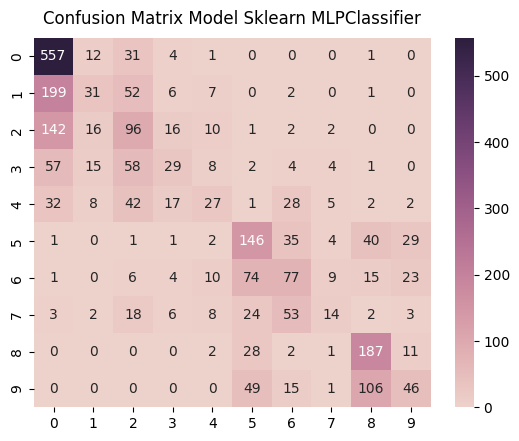

              precision    recall  f1-score      support
0.0            0.561492  0.919142  0.697121   606.000000
1.0            0.369048  0.104027  0.162304   298.000000
2.0            0.315789  0.336842  0.325976   285.000000
3.0            0.349398  0.162921  0.222222   178.000000
4.0            0.360000  0.164634  0.225941   164.000000
5.0            0.449231  0.563707  0.500000   259.000000
6.0            0.353211  0.351598  0.352403   219.000000
7.0            0.350000  0.105263  0.161850   133.000000
8.0            0.526761  0.809524  0.638225   231.000000
9.0            0.403509  0.211982  0.277946   217.000000
accuracy       0.467181  0.467181  0.467181     0.467181
macro avg      0.403844  0.372964  0.356399  2590.000000
weighted avg   0.428946  0.467181  0.415553  2590.000000
Mean Squared Error:  2.7054054054054055


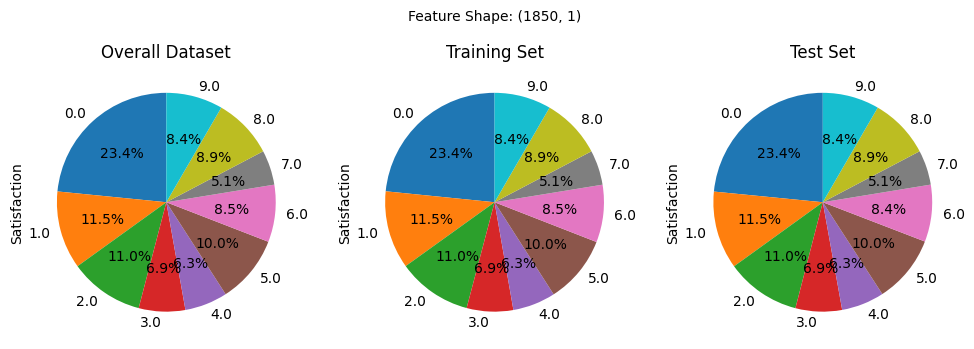

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


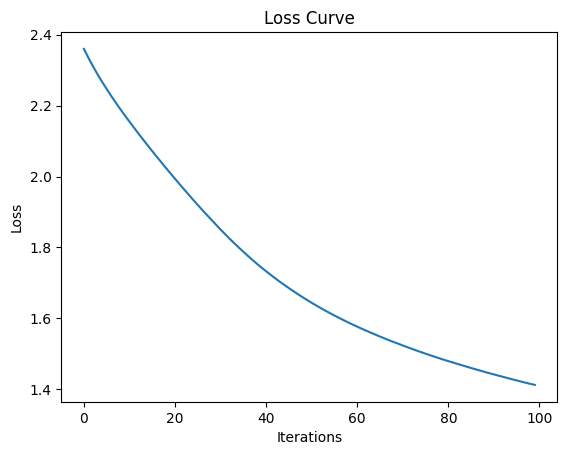

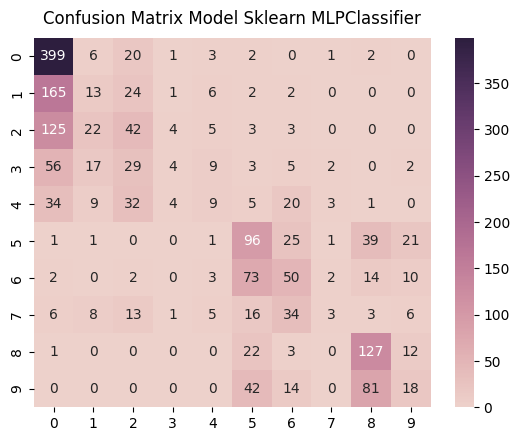

              precision    recall  f1-score      support
0.0            0.505703  0.919355  0.652494   434.000000
1.0            0.171053  0.061033  0.089965   213.000000
2.0            0.259259  0.205882  0.229508   204.000000
3.0            0.266667  0.031496  0.056338   127.000000
4.0            0.219512  0.076923  0.113924   117.000000
5.0            0.363636  0.518919  0.427617   185.000000
6.0            0.320513  0.320513  0.320513   156.000000
7.0            0.250000  0.031579  0.056075    95.000000
8.0            0.475655  0.769697  0.587963   165.000000
9.0            0.260870  0.116129  0.160714   155.000000
accuracy       0.411129  0.411129  0.411129     0.411129
macro avg      0.309287  0.305153  0.269511  1851.000000
weighted avg   0.339432  0.411129  0.338201  1851.000000
Mean Squared Error:  3.4192328471096705


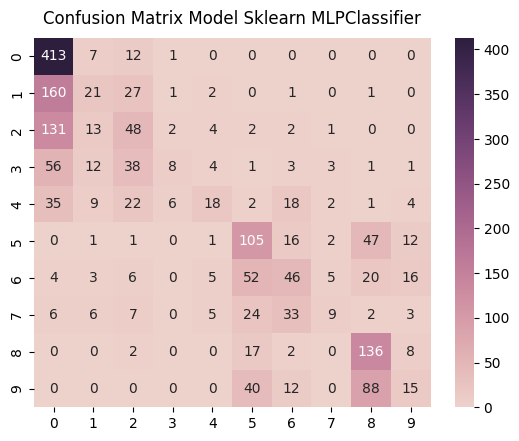

              precision    recall  f1-score      support
0.0            0.513043  0.953811  0.667205   433.000000
1.0            0.291667  0.098592  0.147368   213.000000
2.0            0.294479  0.236453  0.262295   203.000000
3.0            0.444444  0.062992  0.110345   127.000000
4.0            0.461538  0.153846  0.230769   117.000000
5.0            0.432099  0.567568  0.490654   185.000000
6.0            0.345865  0.292994  0.317241   157.000000
7.0            0.409091  0.094737  0.153846    95.000000
8.0            0.459459  0.824242  0.590022   165.000000
9.0            0.254237  0.096774  0.140187   155.000000
accuracy       0.442703  0.442703  0.442703     0.442703
macro avg      0.390592  0.338201  0.310993  1850.000000
weighted avg   0.401523  0.442703  0.372338  1850.000000
Mean Squared Error:  3.1810810810810812


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(64,64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### Experiment 6 | 128/128 Unit (Train Accuracy 0.508108)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


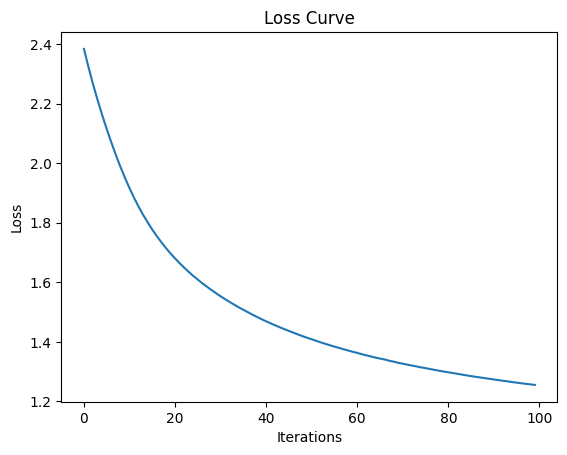

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128,128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

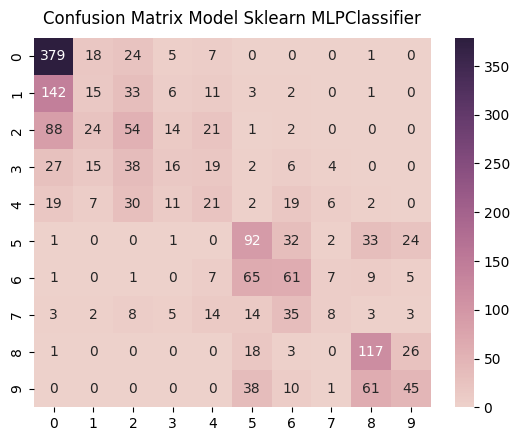

              precision    recall  f1-score      support
0.0            0.573374  0.873272  0.692237   434.000000
1.0            0.185185  0.070423  0.102041   213.000000
2.0            0.287234  0.264706  0.275510   204.000000
3.0            0.275862  0.125984  0.172973   127.000000
4.0            0.210000  0.179487  0.193548   117.000000
5.0            0.391489  0.497297  0.438095   185.000000
6.0            0.358824  0.391026  0.374233   156.000000
7.0            0.285714  0.084211  0.130081    95.000000
8.0            0.515419  0.709091  0.596939   165.000000
9.0            0.436893  0.290323  0.348837   155.000000
accuracy       0.436521  0.436521  0.436521     0.436521
macro avg      0.351999  0.348582  0.332450  1851.000000
weighted avg   0.386168  0.436521  0.392941  1851.000000
Mean Squared Error:  2.80064829821718


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

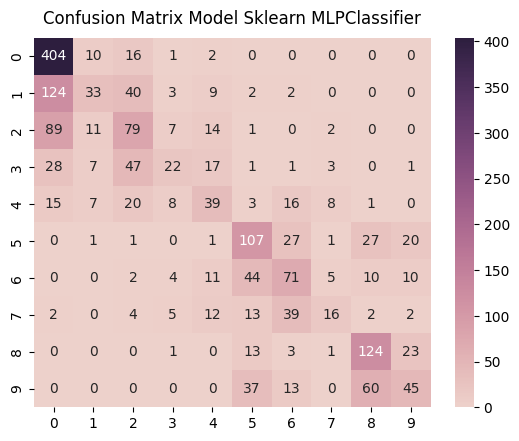

              precision    recall  f1-score      support
0.0            0.610272  0.933025  0.737900   433.000000
1.0            0.478261  0.154930  0.234043   213.000000
2.0            0.377990  0.389163  0.383495   203.000000
3.0            0.431373  0.173228  0.247191   127.000000
4.0            0.371429  0.333333  0.351351   117.000000
5.0            0.484163  0.578378  0.527094   185.000000
6.0            0.412791  0.452229  0.431611   157.000000
7.0            0.444444  0.168421  0.244275    95.000000
8.0            0.553571  0.751515  0.637532   165.000000
9.0            0.445545  0.290323  0.351563   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.460984  0.422455  0.414605  1850.000000
weighted avg   0.485454  0.508108  0.469124  1850.000000
Mean Squared Error:  2.310810810810811


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

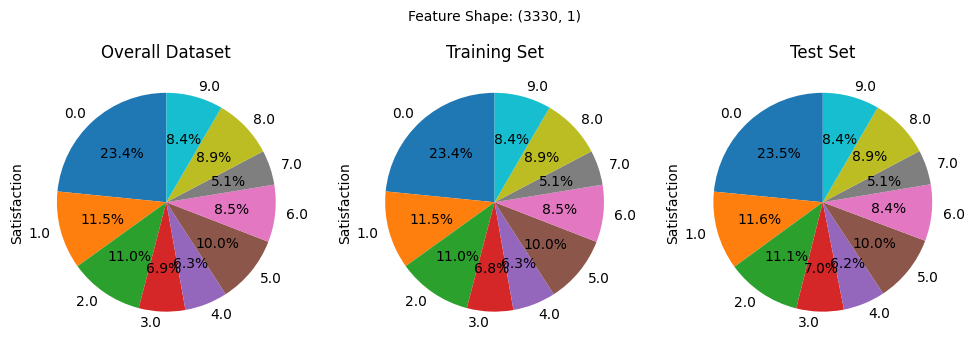

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


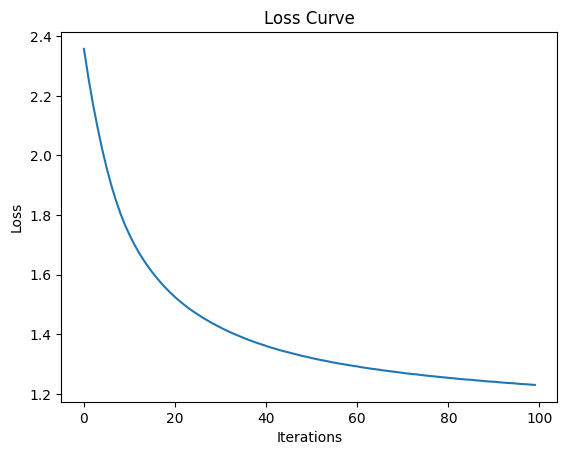

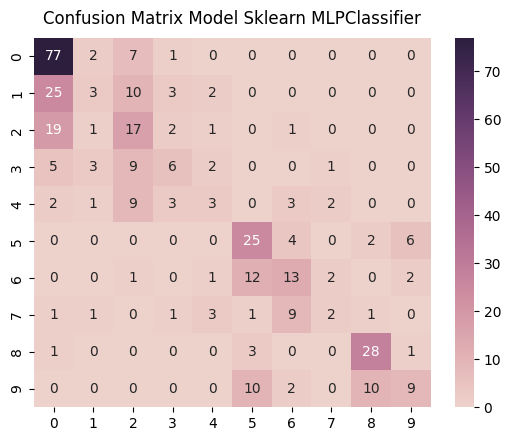

              precision    recall  f1-score     support
0.0            0.592308  0.885057  0.709677   87.000000
1.0            0.272727  0.069767  0.111111   43.000000
2.0            0.320755  0.414634  0.361702   41.000000
3.0            0.375000  0.230769  0.285714   26.000000
4.0            0.250000  0.130435  0.171429   23.000000
5.0            0.490196  0.675676  0.568182   37.000000
6.0            0.406250  0.419355  0.412698   31.000000
7.0            0.285714  0.105263  0.153846   19.000000
8.0            0.682927  0.848485  0.756757   33.000000
9.0            0.500000  0.290323  0.367347   31.000000
accuracy       0.493261  0.493261  0.493261    0.493261
macro avg      0.417588  0.406976  0.389846  371.000000
weighted avg   0.447723  0.493261  0.446957  371.000000
Mean Squared Error:  2.665768194070081


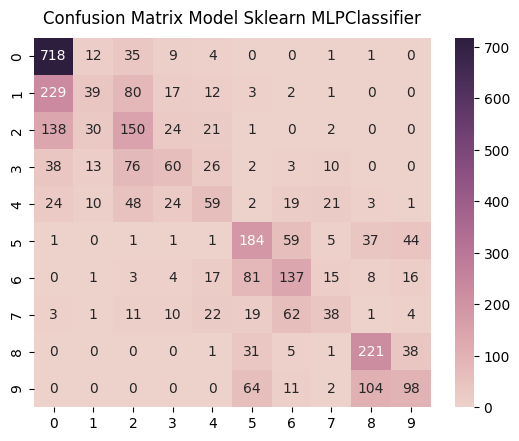

              precision    recall  f1-score      support
0.0            0.623805  0.920513  0.743656   780.000000
1.0            0.367925  0.101828  0.159509   383.000000
2.0            0.371287  0.409836  0.389610   366.000000
3.0            0.402685  0.263158  0.318302   228.000000
4.0            0.361963  0.279621  0.315508   211.000000
5.0            0.475452  0.552553  0.511111   333.000000
6.0            0.459732  0.485816  0.472414   282.000000
7.0            0.395833  0.222222  0.284644   171.000000
8.0            0.589333  0.744108  0.657738   297.000000
9.0            0.487562  0.351254  0.408333   279.000000
accuracy       0.511712  0.511712  0.511712     0.511712
macro avg      0.453558  0.433091  0.426083  3330.000000
weighted avg   0.479964  0.511712  0.475752  3330.000000
Mean Squared Error:  2.3012012012012013


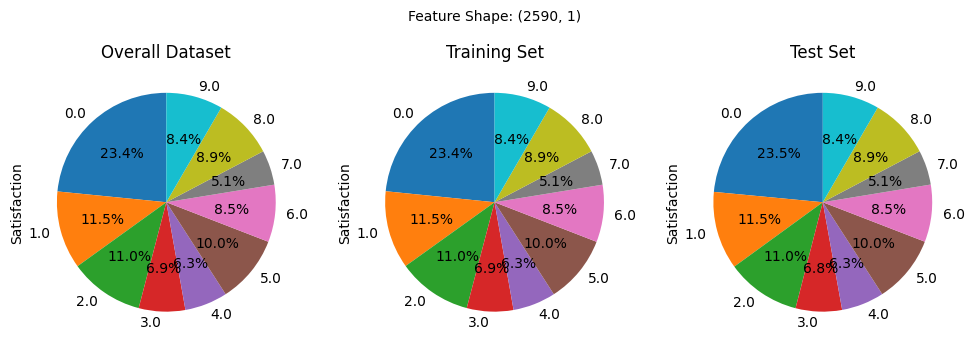

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


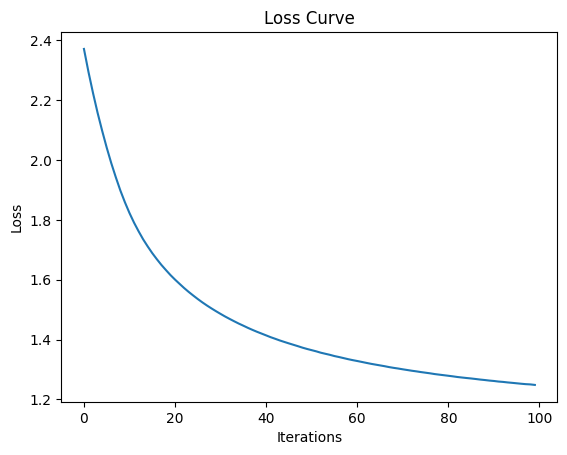

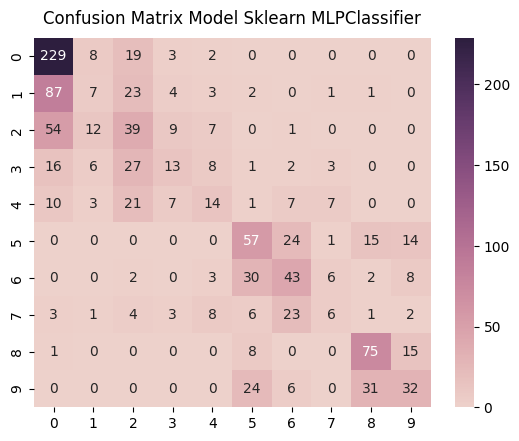

              precision    recall  f1-score      support
0.0            0.572500  0.877395  0.692890   261.000000
1.0            0.189189  0.054688  0.084848   128.000000
2.0            0.288889  0.319672  0.303502   122.000000
3.0            0.333333  0.171053  0.226087    76.000000
4.0            0.311111  0.200000  0.243478    70.000000
5.0            0.441860  0.513514  0.475000   111.000000
6.0            0.405660  0.457447  0.430000    94.000000
7.0            0.250000  0.105263  0.148148    57.000000
8.0            0.600000  0.757576  0.669643    99.000000
9.0            0.450704  0.344086  0.390244    93.000000
accuracy       0.463546  0.463546  0.463546     0.463546
macro avg      0.384325  0.380069  0.366384  1111.000000
weighted avg   0.412906  0.463546  0.420463  1111.000000
Mean Squared Error:  2.666966696669667


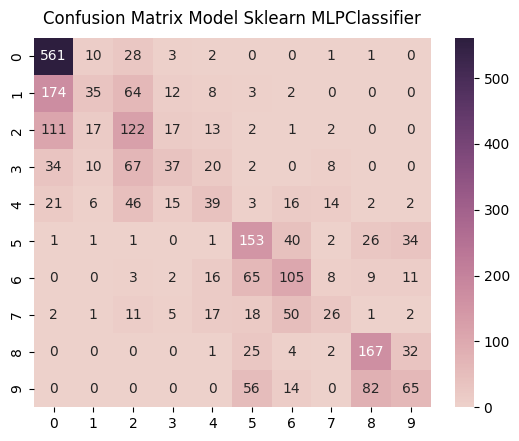

              precision    recall  f1-score      support
0.0            0.620575  0.925743  0.743046   606.000000
1.0            0.437500  0.117450  0.185185   298.000000
2.0            0.356725  0.428070  0.389155   285.000000
3.0            0.406593  0.207865  0.275093   178.000000
4.0            0.333333  0.237805  0.277580   164.000000
5.0            0.467890  0.590734  0.522184   259.000000
6.0            0.452586  0.479452  0.465632   219.000000
7.0            0.412698  0.195489  0.265306   133.000000
8.0            0.579861  0.722944  0.643545   231.000000
9.0            0.445205  0.299539  0.358127   217.000000
accuracy       0.505792  0.505792  0.505792     0.505792
macro avg      0.451297  0.420509  0.412485  2590.000000
weighted avg   0.479111  0.505792  0.467084  2590.000000
Mean Squared Error:  2.386100386100386


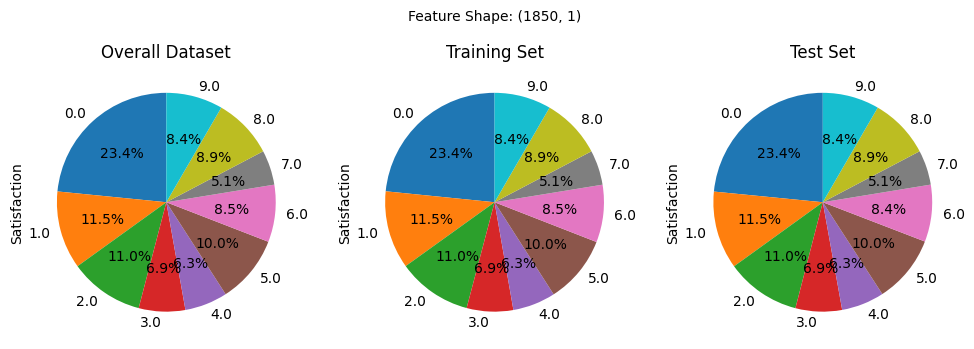

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


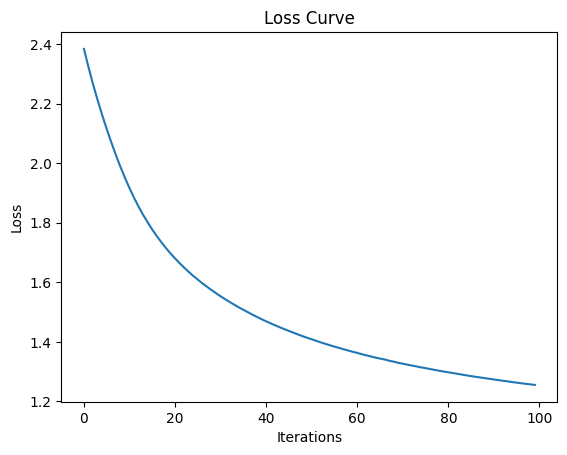

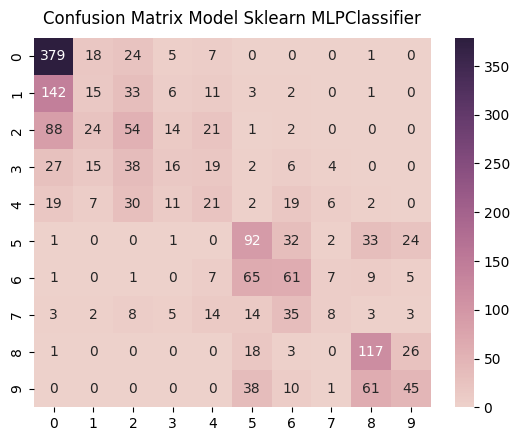

              precision    recall  f1-score      support
0.0            0.573374  0.873272  0.692237   434.000000
1.0            0.185185  0.070423  0.102041   213.000000
2.0            0.287234  0.264706  0.275510   204.000000
3.0            0.275862  0.125984  0.172973   127.000000
4.0            0.210000  0.179487  0.193548   117.000000
5.0            0.391489  0.497297  0.438095   185.000000
6.0            0.358824  0.391026  0.374233   156.000000
7.0            0.285714  0.084211  0.130081    95.000000
8.0            0.515419  0.709091  0.596939   165.000000
9.0            0.436893  0.290323  0.348837   155.000000
accuracy       0.436521  0.436521  0.436521     0.436521
macro avg      0.351999  0.348582  0.332450  1851.000000
weighted avg   0.386168  0.436521  0.392941  1851.000000
Mean Squared Error:  2.80064829821718


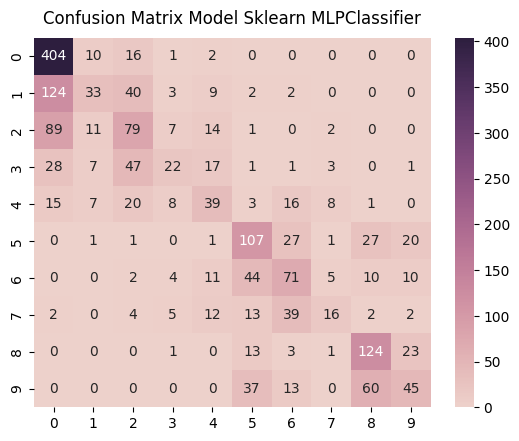

              precision    recall  f1-score      support
0.0            0.610272  0.933025  0.737900   433.000000
1.0            0.478261  0.154930  0.234043   213.000000
2.0            0.377990  0.389163  0.383495   203.000000
3.0            0.431373  0.173228  0.247191   127.000000
4.0            0.371429  0.333333  0.351351   117.000000
5.0            0.484163  0.578378  0.527094   185.000000
6.0            0.412791  0.452229  0.431611   157.000000
7.0            0.444444  0.168421  0.244275    95.000000
8.0            0.553571  0.751515  0.637532   165.000000
9.0            0.445545  0.290323  0.351563   155.000000
accuracy       0.508108  0.508108  0.508108     0.508108
macro avg      0.460984  0.422455  0.414605  1850.000000
weighted avg   0.485454  0.508108  0.469124  1850.000000
Mean Squared Error:  2.310810810810811


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128,128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



## Three Hidden Layer

(Check Experiment 64/32/16 which has the best both Train and Test Accuracy))

we picked 10 combination of random number

### 8/16/32


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


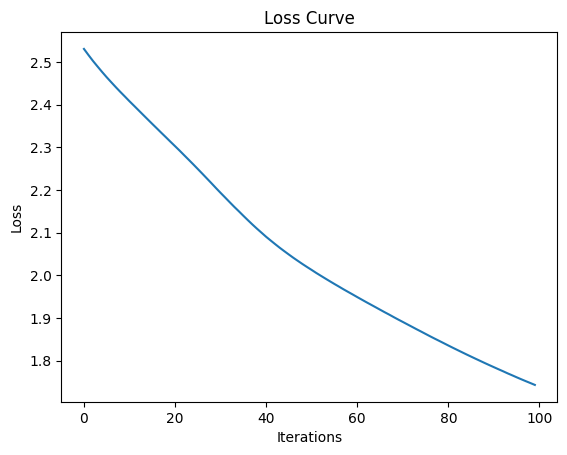

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(8, 16, 32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

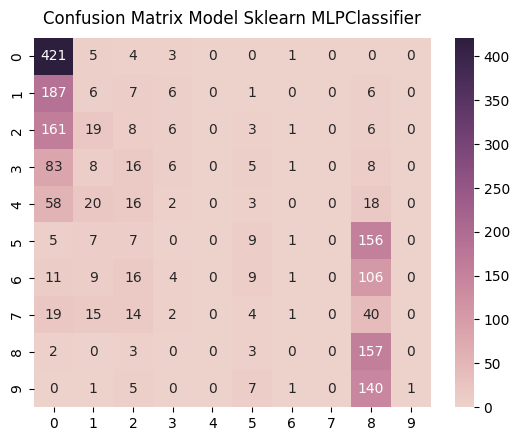

              precision    recall  f1-score      support
0.0            0.444562  0.970046  0.609703   434.000000
1.0            0.066667  0.028169  0.039604   213.000000
2.0            0.083333  0.039216  0.053333   204.000000
3.0            0.206897  0.047244  0.076923   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.204545  0.048649  0.078603   185.000000
6.0            0.142857  0.006410  0.012270   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.246468  0.951515  0.391521   165.000000
9.0            1.000000  0.006452  0.012821   155.000000
accuracy       0.329011  0.329011  0.329011     0.329011
macro avg      0.239533  0.209770  0.127478  1851.000000
weighted avg   0.273479  0.329011  0.203533  1851.000000
Mean Squared Error:  5.306861156131821


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

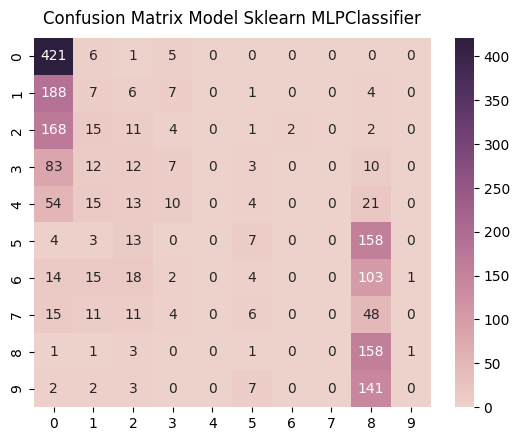

              precision    recall  f1-score     support
0.0            0.443158  0.972286  0.608821   433.00000
1.0            0.080460  0.032864  0.046667   213.00000
2.0            0.120879  0.054187  0.074830   203.00000
3.0            0.179487  0.055118  0.084337   127.00000
4.0            0.000000  0.000000  0.000000   117.00000
5.0            0.205882  0.037838  0.063927   185.00000
6.0            0.000000  0.000000  0.000000   157.00000
7.0            0.000000  0.000000  0.000000    95.00000
8.0            0.244961  0.957576  0.390123   165.00000
9.0            0.000000  0.000000  0.000000   155.00000
accuracy       0.330270  0.330270  0.330270     0.33027
macro avg      0.127483  0.210987  0.126871  1850.00000
weighted avg   0.181008  0.330270  0.203058  1850.00000
Mean Squared Error:  5.147567567567568


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

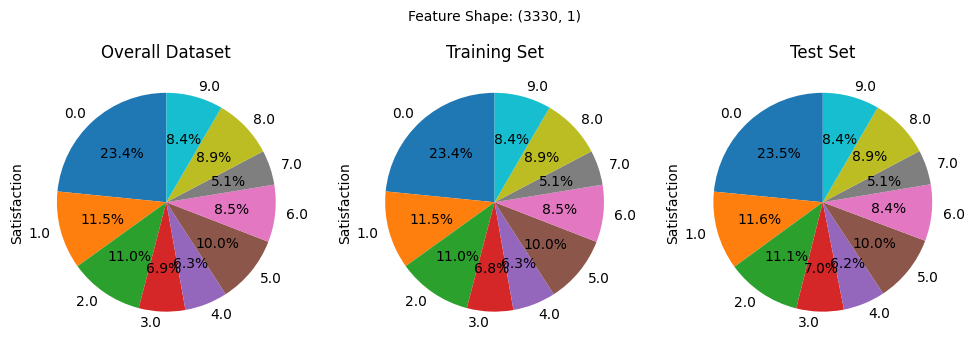

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


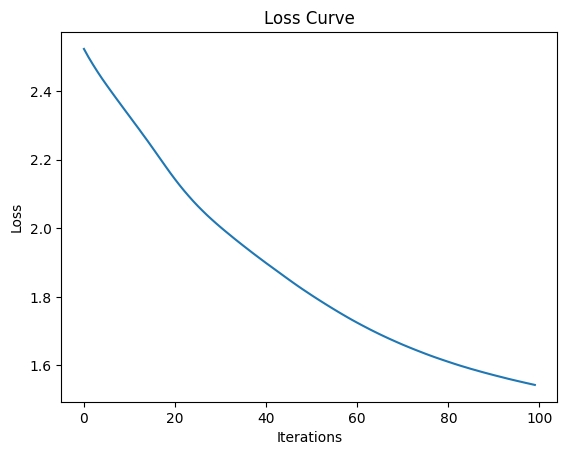

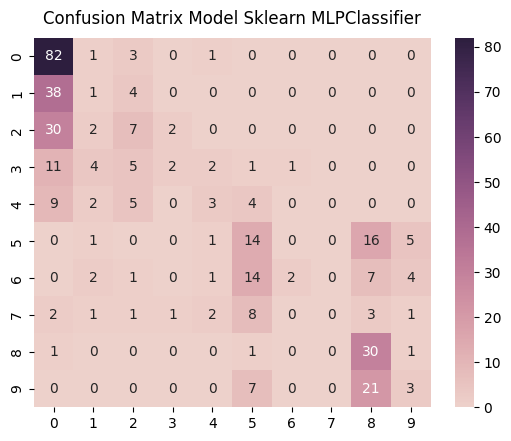

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score    support
0.0            0.473988  0.942529  0.630769   87.00000
1.0            0.071429  0.023256  0.035088   43.00000
2.0            0.269231  0.170732  0.208955   41.00000
3.0            0.400000  0.076923  0.129032   26.00000
4.0            0.300000  0.130435  0.181818   23.00000
5.0            0.285714  0.378378  0.325581   37.00000
6.0            0.666667  0.064516  0.117647   31.00000
7.0            0.000000  0.000000  0.000000   19.00000
8.0            0.389610  0.909091  0.545455   33.00000
9.0            0.214286  0.096774  0.133333   31.00000
accuracy       0.388140  0.388140  0.388140    0.38814
macro avg      0.307092  0.279263  0.230768  371.00000
weighted avg   0.332574  0.388140  0.297349  371.00000
Mean Squared Error:  3.6226415094339623


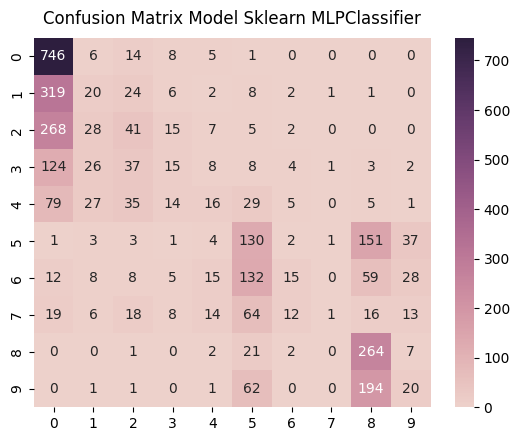

              precision    recall  f1-score      support
0.0            0.475765  0.956410  0.635434   780.000000
1.0            0.160000  0.052219  0.078740   383.000000
2.0            0.225275  0.112022  0.149635   366.000000
3.0            0.208333  0.065789  0.100000   228.000000
4.0            0.216216  0.075829  0.112281   211.000000
5.0            0.282609  0.390390  0.327869   333.000000
6.0            0.340909  0.053191  0.092025   282.000000
7.0            0.250000  0.005848  0.011429   171.000000
8.0            0.380952  0.888889  0.533333   297.000000
9.0            0.185185  0.071685  0.103359   279.000000
accuracy       0.380781  0.380781  0.380781     0.380781
macro avg      0.272524  0.267227  0.214410  3330.000000
weighted avg   0.302028  0.380781  0.285699  3330.000000
Mean Squared Error:  3.829129129129129


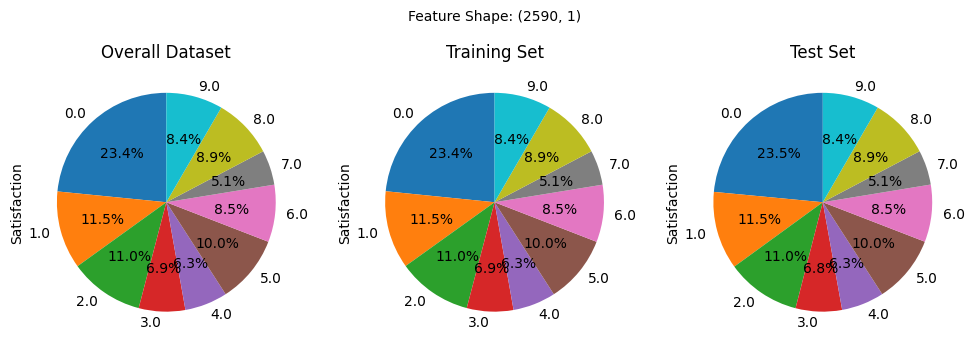

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


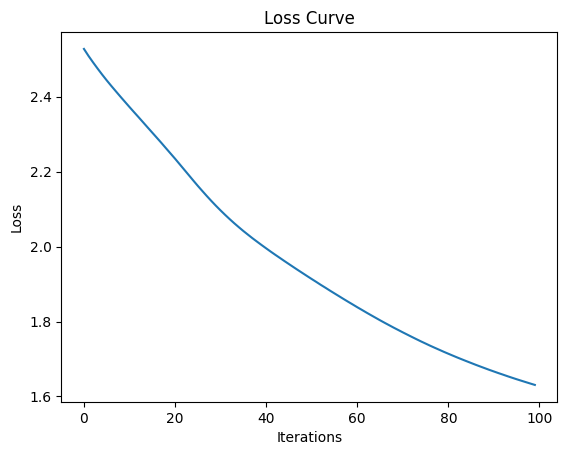

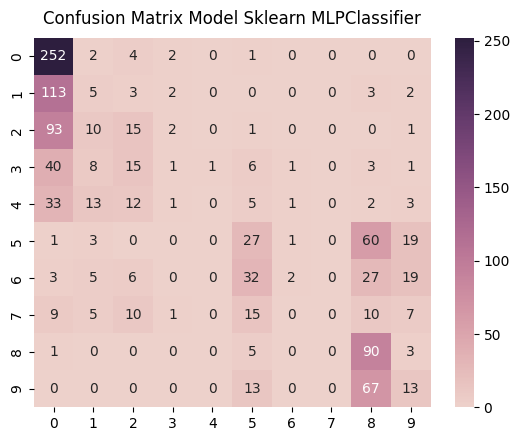

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.462385  0.965517  0.625310   261.000000
1.0            0.098039  0.039062  0.055866   128.000000
2.0            0.230769  0.122951  0.160428   122.000000
3.0            0.111111  0.013158  0.023529    76.000000
4.0            0.000000  0.000000  0.000000    70.000000
5.0            0.257143  0.243243  0.250000   111.000000
6.0            0.400000  0.021277  0.040404    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.343511  0.909091  0.498615    99.000000
9.0            0.191176  0.139785  0.161491    93.000000
accuracy       0.364536  0.364536  0.364536     0.364536
macro avg      0.209414  0.245408  0.181564  1111.000000
weighted avg   0.259010  0.364536  0.258908  1111.000000
Mean Squared Error:  4.6750675067506755


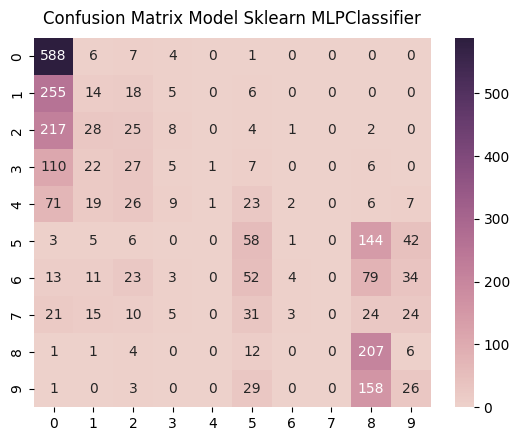

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.459375  0.970297  0.623542   606.000000
1.0            0.115702  0.046980  0.066826   298.000000
2.0            0.167785  0.087719  0.115207   285.000000
3.0            0.128205  0.028090  0.046083   178.000000
4.0            0.500000  0.006098  0.012048   164.000000
5.0            0.260090  0.223938  0.240664   259.000000
6.0            0.363636  0.018265  0.034783   219.000000
7.0            0.000000  0.000000  0.000000   133.000000
8.0            0.330671  0.896104  0.483081   231.000000
9.0            0.187050  0.119816  0.146067   217.000000
accuracy       0.358301  0.358301  0.358301     0.358301
macro avg      0.251252  0.239731  0.176830  2590.000000
weighted avg   0.281650  0.358301  0.252522  2590.000000
Mean Squared Error:  4.584942084942085


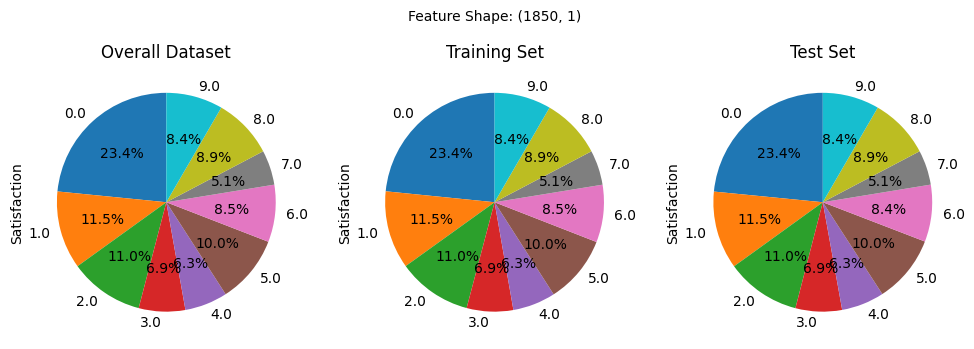

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


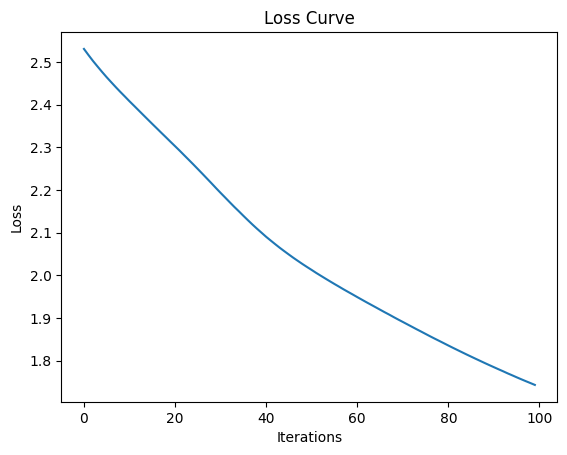

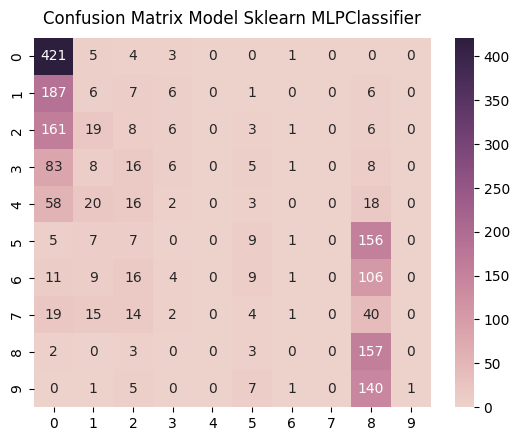

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.444562  0.970046  0.609703   434.000000
1.0            0.066667  0.028169  0.039604   213.000000
2.0            0.083333  0.039216  0.053333   204.000000
3.0            0.206897  0.047244  0.076923   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.204545  0.048649  0.078603   185.000000
6.0            0.142857  0.006410  0.012270   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.246468  0.951515  0.391521   165.000000
9.0            1.000000  0.006452  0.012821   155.000000
accuracy       0.329011  0.329011  0.329011     0.329011
macro avg      0.239533  0.209770  0.127478  1851.000000
weighted avg   0.273479  0.329011  0.203533  1851.000000
Mean Squared Error:  5.306861156131821


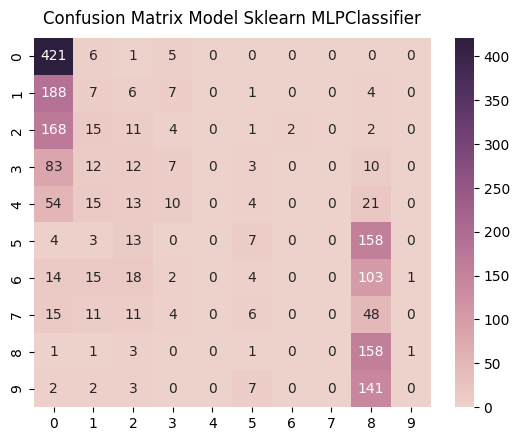

              precision    recall  f1-score     support
0.0            0.443158  0.972286  0.608821   433.00000
1.0            0.080460  0.032864  0.046667   213.00000
2.0            0.120879  0.054187  0.074830   203.00000
3.0            0.179487  0.055118  0.084337   127.00000
4.0            0.000000  0.000000  0.000000   117.00000
5.0            0.205882  0.037838  0.063927   185.00000
6.0            0.000000  0.000000  0.000000   157.00000
7.0            0.000000  0.000000  0.000000    95.00000
8.0            0.244961  0.957576  0.390123   165.00000
9.0            0.000000  0.000000  0.000000   155.00000
accuracy       0.330270  0.330270  0.330270     0.33027
macro avg      0.127483  0.210987  0.126871  1850.00000
weighted avg   0.181008  0.330270  0.203058  1850.00000
Mean Squared Error:  5.147567567567568


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(8, 16, 32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 32/16/8


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


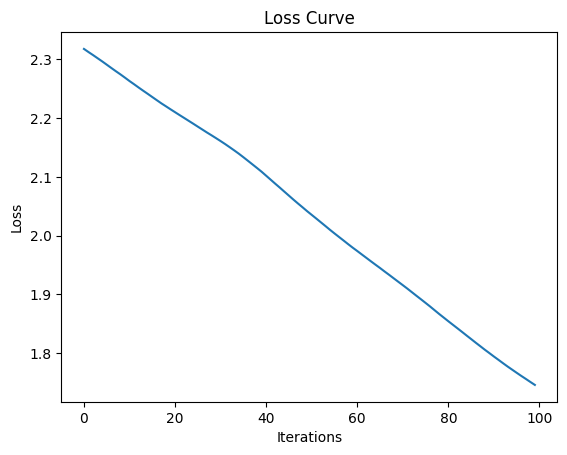

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

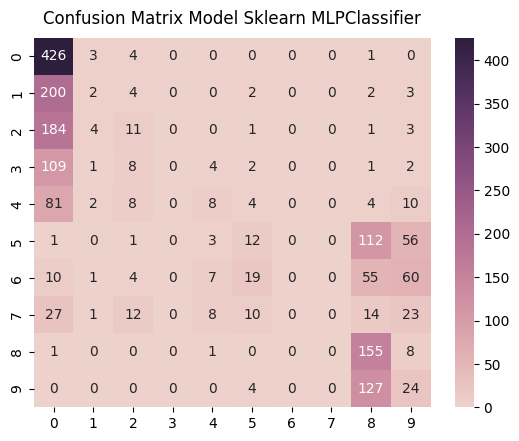

              precision    recall  f1-score      support
0.0            0.410010  0.981567  0.578411   434.000000
1.0            0.142857  0.009390  0.017621   213.000000
2.0            0.211538  0.053922  0.085938   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.258065  0.068376  0.108108   117.000000
5.0            0.222222  0.064865  0.100418   185.000000
6.0            0.000000  0.000000  0.000000   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.328390  0.939394  0.486656   165.000000
9.0            0.126984  0.154839  0.139535   155.000000
accuracy       0.344679  0.344679  0.344679     0.344679
macro avg      0.170007  0.227235  0.151669  1851.000000
weighted avg   0.214316  0.344679  0.219053  1851.000000
Mean Squared Error:  5.218800648298217


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

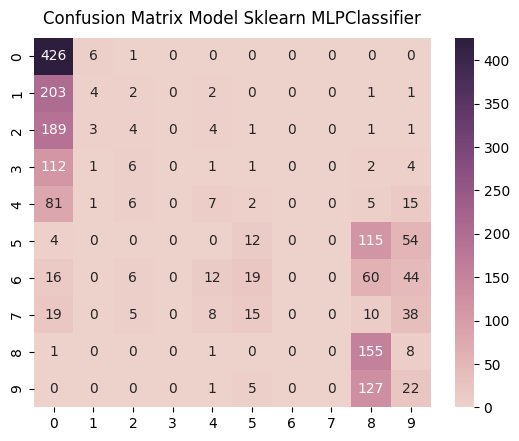

              precision    recall  f1-score      support
0.0            0.405328  0.983834  0.574124   433.000000
1.0            0.266667  0.018779  0.035088   213.000000
2.0            0.133333  0.019704  0.034335   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.194444  0.059829  0.091503   117.000000
5.0            0.218182  0.064865  0.100000   185.000000
6.0            0.000000  0.000000  0.000000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.325630  0.939394  0.483619   165.000000
9.0            0.117647  0.141935  0.128655   155.000000
accuracy       0.340541  0.340541  0.340541     0.340541
macro avg      0.166123  0.222834  0.144732  1850.000000
weighted avg   0.213217  0.340541  0.211883  1850.000000
Mean Squared Error:  5.006486486486486


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

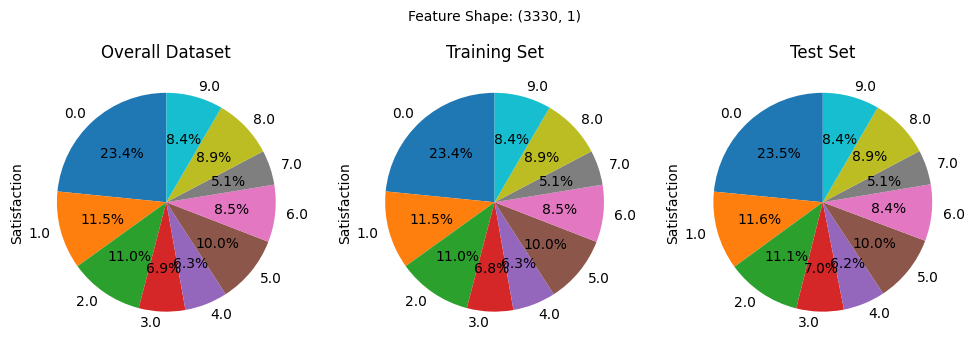

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


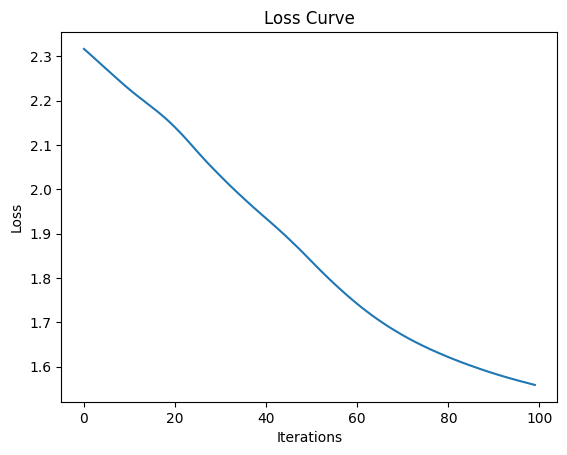

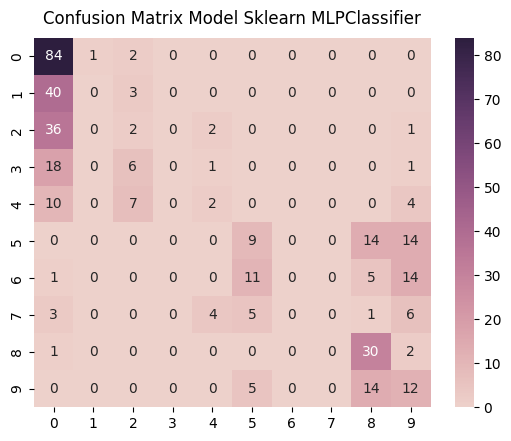

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.435233  0.965517  0.600000   87.000000
1.0            0.000000  0.000000  0.000000   43.000000
2.0            0.100000  0.048780  0.065574   41.000000
3.0            0.000000  0.000000  0.000000   26.000000
4.0            0.222222  0.086957  0.125000   23.000000
5.0            0.300000  0.243243  0.268657   37.000000
6.0            0.000000  0.000000  0.000000   31.000000
7.0            0.000000  0.000000  0.000000   19.000000
8.0            0.468750  0.909091  0.618557   33.000000
9.0            0.222222  0.387097  0.282353   31.000000
accuracy       0.374663  0.374663  0.374663    0.374663
macro avg      0.174843  0.264069  0.196014  371.000000
weighted avg   0.217073  0.374663  0.261103  371.000000
Mean Squared Error:  4.520215633423181


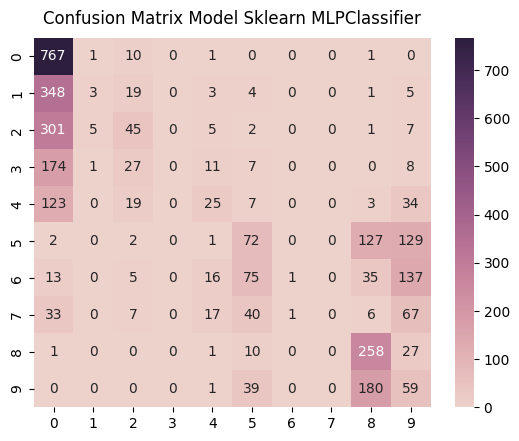

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.435301  0.983333  0.603462   780.000000
1.0            0.300000  0.007833  0.015267   383.000000
2.0            0.335821  0.122951  0.180000   366.000000
3.0            0.000000  0.000000  0.000000   228.000000
4.0            0.308642  0.118483  0.171233   211.000000
5.0            0.281250  0.216216  0.244482   333.000000
6.0            0.500000  0.003546  0.007042   282.000000
7.0            0.000000  0.000000  0.000000   171.000000
8.0            0.421569  0.868687  0.567657   297.000000
9.0            0.124736  0.211470  0.156915   279.000000
accuracy       0.369369  0.369369  0.369369     0.369369
macro avg      0.270732  0.253252  0.194606  3330.000000
weighted avg   0.311451  0.369369  0.262561  3330.000000
Mean Squared Error:  4.861561561561562


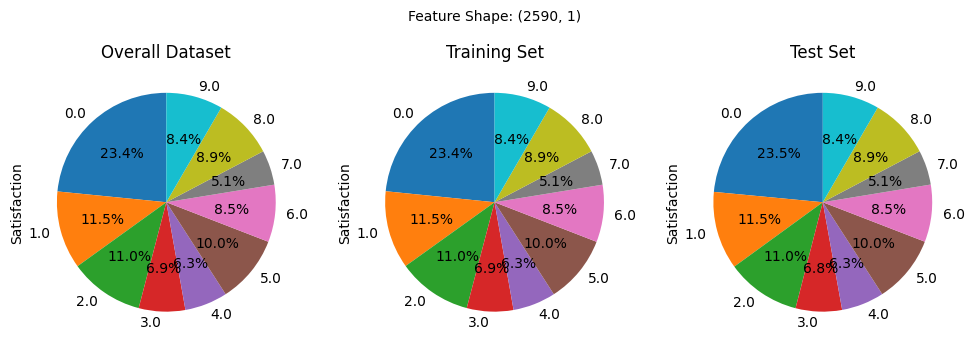

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


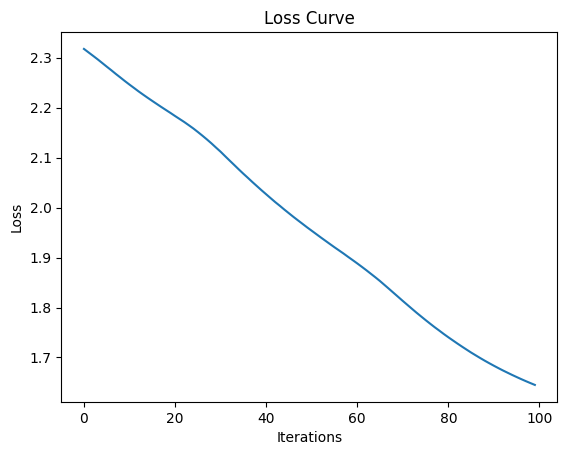

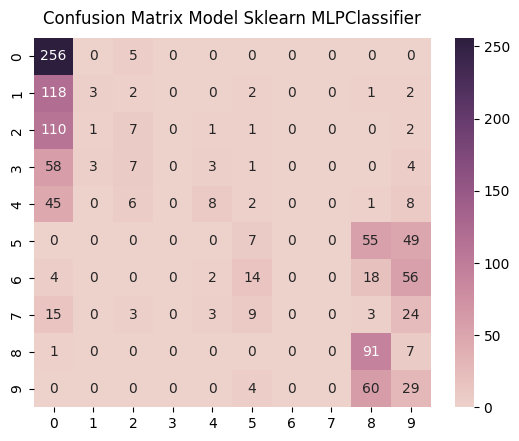

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.421746  0.980843  0.589862   261.000000
1.0            0.428571  0.023438  0.044444   128.000000
2.0            0.233333  0.057377  0.092105   122.000000
3.0            0.000000  0.000000  0.000000    76.000000
4.0            0.470588  0.114286  0.183908    70.000000
5.0            0.175000  0.063063  0.092715   111.000000
6.0            0.000000  0.000000  0.000000    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.397380  0.919192  0.554878    99.000000
9.0            0.160221  0.311828  0.211679    93.000000
accuracy       0.360936  0.360936  0.360936     0.360936
macro avg      0.228684  0.247003  0.176959  1111.000000
weighted avg   0.270033  0.360936  0.241821  1111.000000
Mean Squared Error:  5.169216921692169


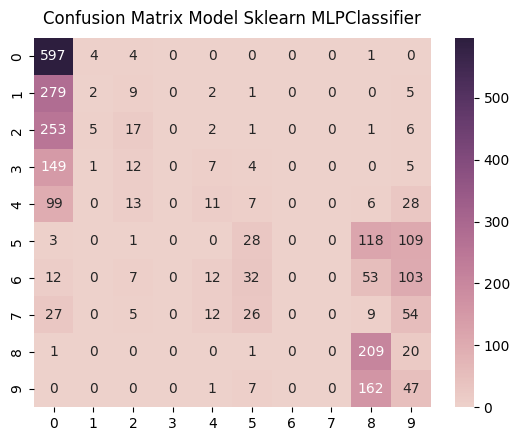

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.420423  0.985149  0.589339   606.000000
1.0            0.166667  0.006711  0.012903   298.000000
2.0            0.250000  0.059649  0.096317   285.000000
3.0            0.000000  0.000000  0.000000   178.000000
4.0            0.234043  0.067073  0.104265   164.000000
5.0            0.261682  0.108108  0.153005   259.000000
6.0            0.000000  0.000000  0.000000   219.000000
7.0            0.000000  0.000000  0.000000   133.000000
8.0            0.373882  0.904762  0.529114   231.000000
9.0            0.124668  0.216590  0.158249   217.000000
accuracy       0.351737  0.351737  0.351737     0.351737
macro avg      0.183136  0.234804  0.164319  2590.000000
weighted avg   0.229834  0.351737  0.232327  2590.000000
Mean Squared Error:  5.026640926640926


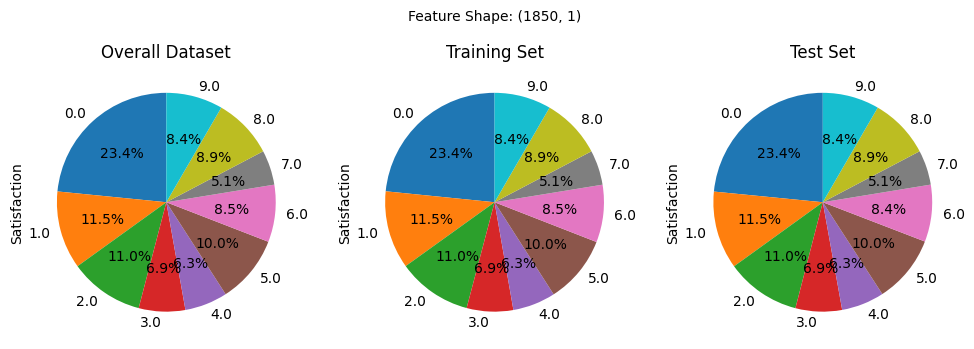

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


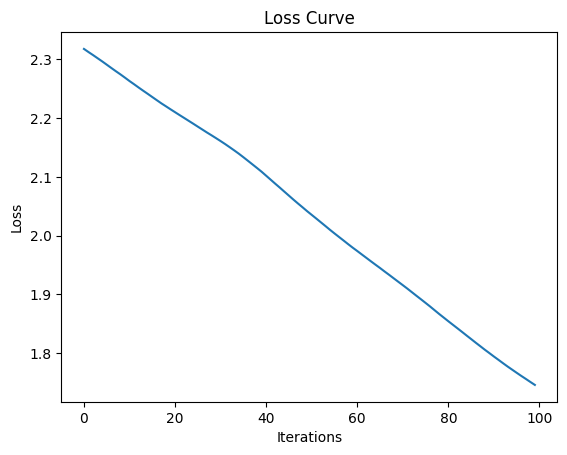

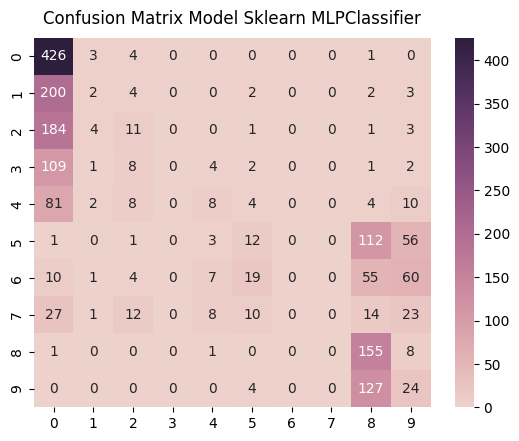

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.410010  0.981567  0.578411   434.000000
1.0            0.142857  0.009390  0.017621   213.000000
2.0            0.211538  0.053922  0.085938   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.258065  0.068376  0.108108   117.000000
5.0            0.222222  0.064865  0.100418   185.000000
6.0            0.000000  0.000000  0.000000   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.328390  0.939394  0.486656   165.000000
9.0            0.126984  0.154839  0.139535   155.000000
accuracy       0.344679  0.344679  0.344679     0.344679
macro avg      0.170007  0.227235  0.151669  1851.000000
weighted avg   0.214316  0.344679  0.219053  1851.000000
Mean Squared Error:  5.218800648298217


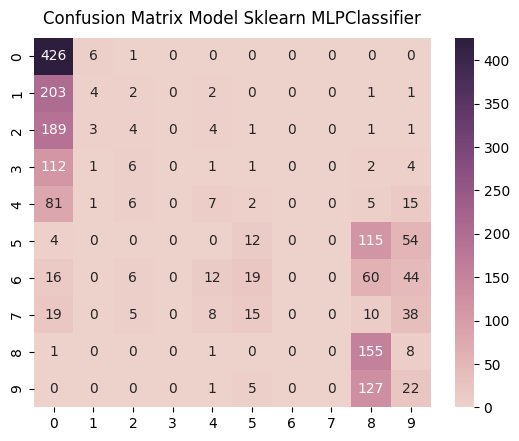

              precision    recall  f1-score      support
0.0            0.405328  0.983834  0.574124   433.000000
1.0            0.266667  0.018779  0.035088   213.000000
2.0            0.133333  0.019704  0.034335   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.194444  0.059829  0.091503   117.000000
5.0            0.218182  0.064865  0.100000   185.000000
6.0            0.000000  0.000000  0.000000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.325630  0.939394  0.483619   165.000000
9.0            0.117647  0.141935  0.128655   155.000000
accuracy       0.340541  0.340541  0.340541     0.340541
macro avg      0.166123  0.222834  0.144732  1850.000000
weighted avg   0.213217  0.340541  0.211883  1850.000000
Mean Squared Error:  5.006486486486486


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 16/32/64


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


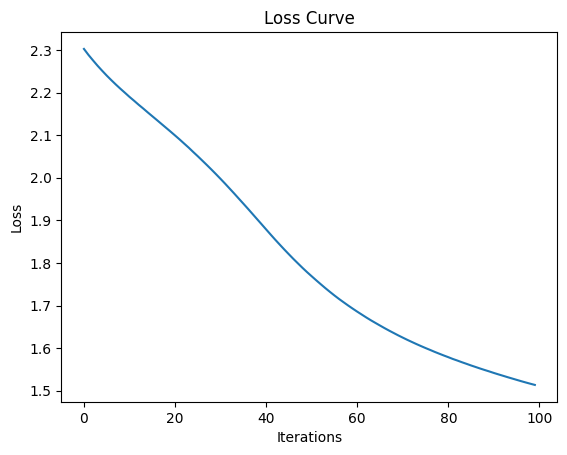

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(16, 32, 64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

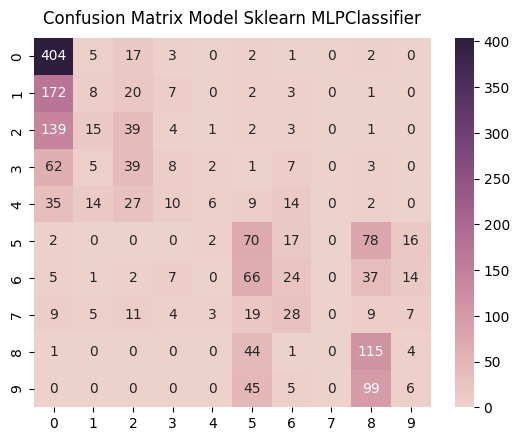

              precision    recall  f1-score      support
0.0            0.487334  0.930876  0.639747   434.000000
1.0            0.150943  0.037559  0.060150   213.000000
2.0            0.251613  0.191176  0.217270   204.000000
3.0            0.186047  0.062992  0.094118   127.000000
4.0            0.428571  0.051282  0.091603   117.000000
5.0            0.269231  0.378378  0.314607   185.000000
6.0            0.233010  0.153846  0.185328   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.331412  0.696970  0.449219   165.000000
9.0            0.127660  0.038710  0.059406   155.000000
accuracy       0.367369  0.367369  0.367369     0.367369
macro avg      0.246582  0.254179  0.211145  1851.000000
weighted avg   0.285997  0.367369  0.285196  1851.000000
Mean Squared Error:  3.868179362506753


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

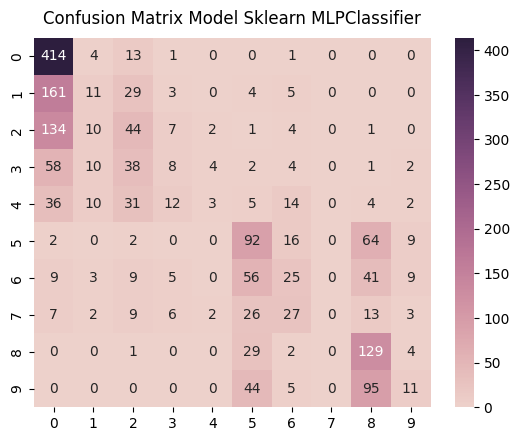

              precision    recall  f1-score      support
0.0            0.504263  0.956120  0.660287   433.000000
1.0            0.220000  0.051643  0.083650   213.000000
2.0            0.250000  0.216749  0.232190   203.000000
3.0            0.190476  0.062992  0.094675   127.000000
4.0            0.272727  0.025641  0.046875   117.000000
5.0            0.355212  0.497297  0.414414   185.000000
6.0            0.242718  0.159236  0.192308   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.370690  0.781818  0.502924   165.000000
9.0            0.275000  0.070968  0.112821   155.000000
accuracy       0.398378  0.398378  0.398378     0.398378
macro avg      0.268109  0.282246  0.234014  1850.000000
weighted avg   0.313333  0.398378  0.311185  1850.000000
Mean Squared Error:  3.5891891891891894


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

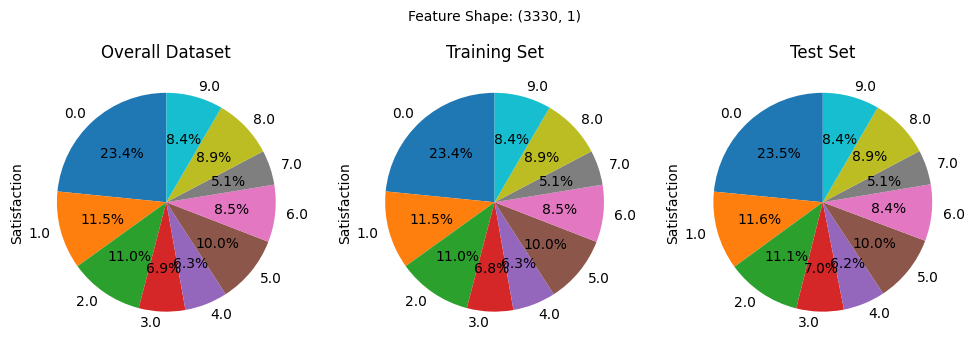

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


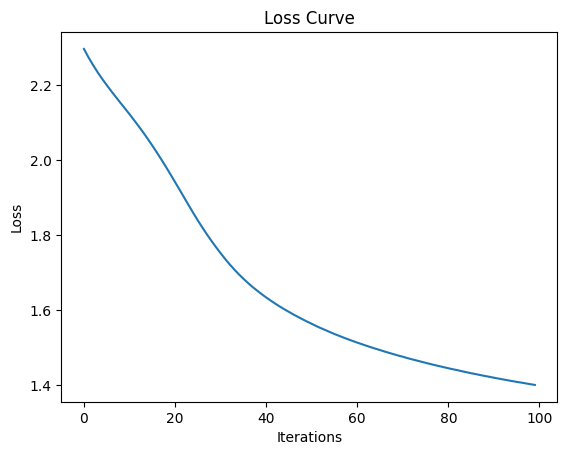

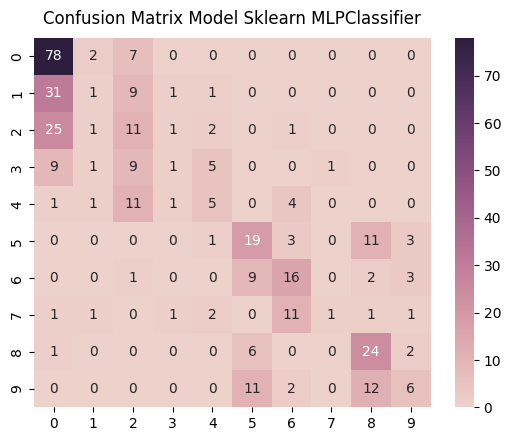

              precision    recall  f1-score     support
0.0            0.534247  0.896552  0.669528   87.000000
1.0            0.142857  0.023256  0.040000   43.000000
2.0            0.229167  0.268293  0.247191   41.000000
3.0            0.200000  0.038462  0.064516   26.000000
4.0            0.312500  0.217391  0.256410   23.000000
5.0            0.422222  0.513514  0.463415   37.000000
6.0            0.432432  0.516129  0.470588   31.000000
7.0            0.500000  0.052632  0.095238   19.000000
8.0            0.480000  0.727273  0.578313   33.000000
9.0            0.400000  0.193548  0.260870   31.000000
accuracy       0.436658  0.436658  0.436658    0.436658
macro avg      0.365343  0.344705  0.314607  371.000000
weighted avg   0.380521  0.436658  0.373030  371.000000
Mean Squared Error:  2.91644204851752


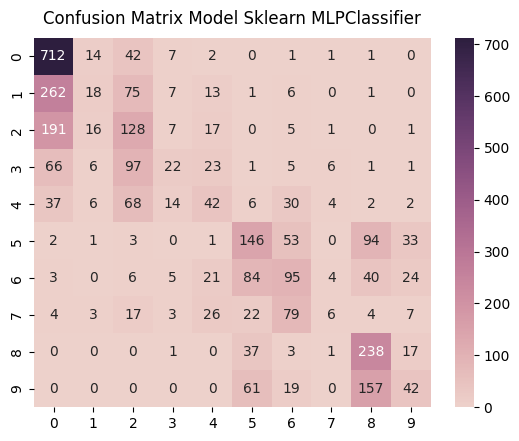

              precision    recall  f1-score      support
0.0            0.557557  0.912821  0.692270   780.000000
1.0            0.281250  0.046997  0.080537   383.000000
2.0            0.293578  0.349727  0.319202   366.000000
3.0            0.333333  0.096491  0.149660   228.000000
4.0            0.289655  0.199052  0.235955   211.000000
5.0            0.407821  0.438438  0.422576   333.000000
6.0            0.320946  0.336879  0.328720   282.000000
7.0            0.260870  0.035088  0.061856   171.000000
8.0            0.442379  0.801347  0.570060   297.000000
9.0            0.330709  0.150538  0.206897   279.000000
accuracy       0.435135  0.435135  0.435135     0.435135
macro avg      0.351810  0.336738  0.306773  3330.000000
weighted avg   0.384911  0.435135  0.373147  3330.000000
Mean Squared Error:  2.8444444444444446


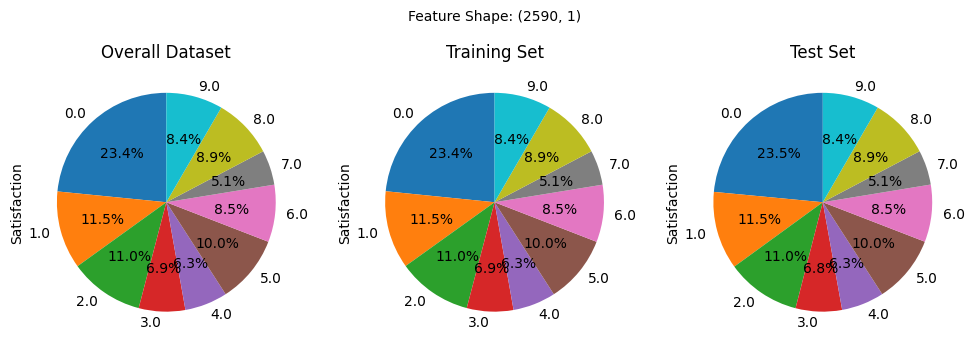

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


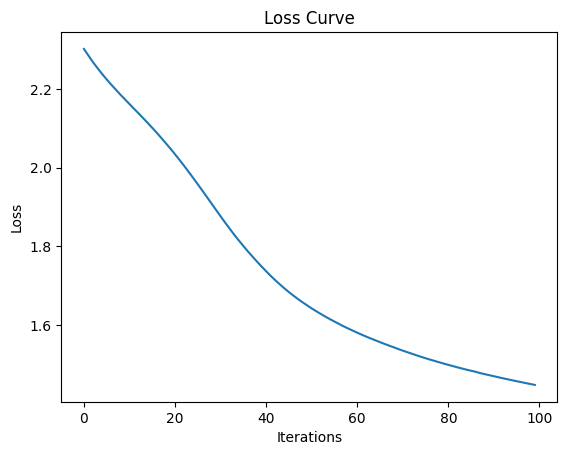

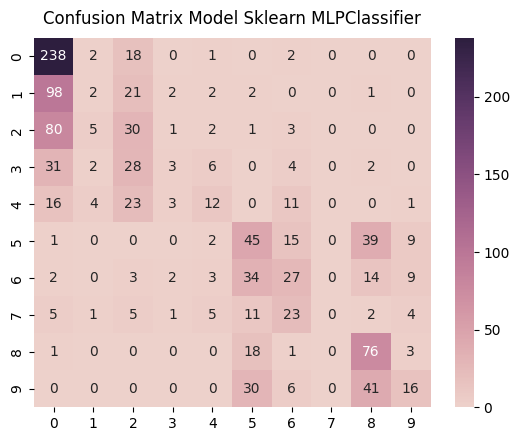

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.504237  0.911877  0.649386   261.00000
1.0            0.125000  0.015625  0.027778   128.00000
2.0            0.234375  0.245902  0.240000   122.00000
3.0            0.250000  0.039474  0.068182    76.00000
4.0            0.363636  0.171429  0.233010    70.00000
5.0            0.319149  0.405405  0.357143   111.00000
6.0            0.293478  0.287234  0.290323    94.00000
7.0            0.000000  0.000000  0.000000    57.00000
8.0            0.434286  0.767677  0.554745    99.00000
9.0            0.380952  0.172043  0.237037    93.00000
accuracy       0.404140  0.404140  0.404140     0.40414
macro avg      0.290511  0.301667  0.265760  1111.00000
weighted avg   0.325913  0.404140  0.330977  1111.00000
Mean Squared Error:  3.4743474347434744


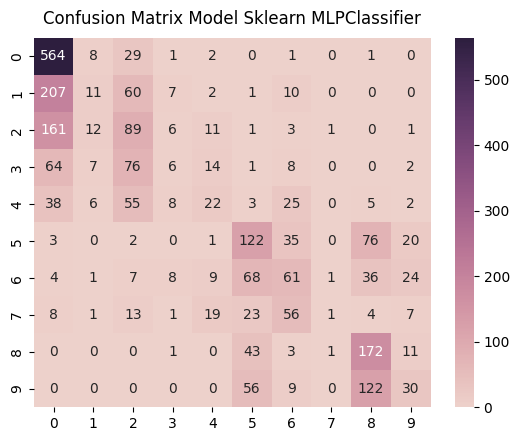

              precision    recall  f1-score      support
0.0            0.537655  0.930693  0.681571   606.000000
1.0            0.239130  0.036913  0.063953   298.000000
2.0            0.268882  0.312281  0.288961   285.000000
3.0            0.157895  0.033708  0.055556   178.000000
4.0            0.275000  0.134146  0.180328   164.000000
5.0            0.383648  0.471042  0.422877   259.000000
6.0            0.289100  0.278539  0.283721   219.000000
7.0            0.250000  0.007519  0.014599   133.000000
8.0            0.413462  0.744589  0.531685   231.000000
9.0            0.309278  0.138249  0.191083   217.000000
accuracy       0.416216  0.416216  0.416216     0.416216
macro avg      0.312405  0.308768  0.271433  2590.000000
weighted avg   0.349601  0.416216  0.344321  2590.000000
Mean Squared Error:  3.186100386100386


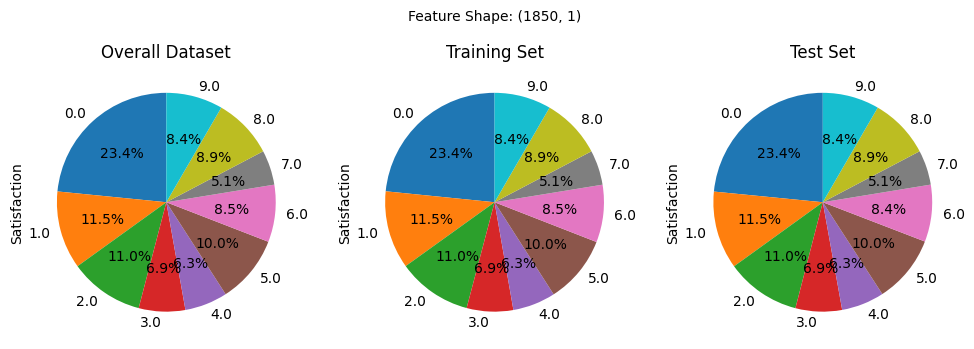

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


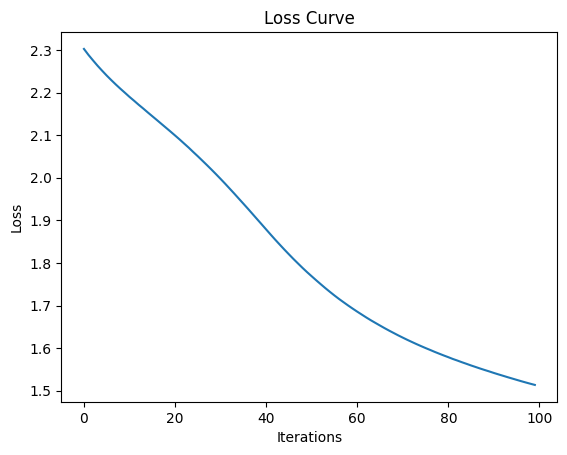

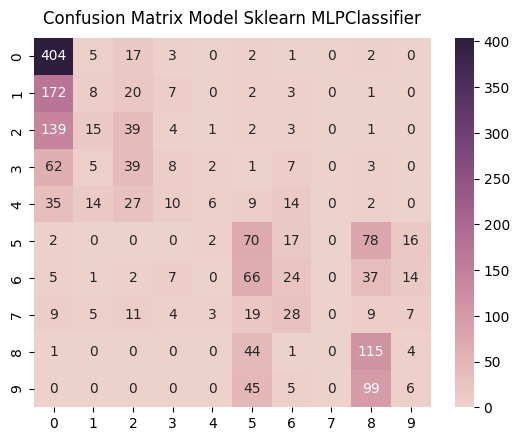

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.487334  0.930876  0.639747   434.000000
1.0            0.150943  0.037559  0.060150   213.000000
2.0            0.251613  0.191176  0.217270   204.000000
3.0            0.186047  0.062992  0.094118   127.000000
4.0            0.428571  0.051282  0.091603   117.000000
5.0            0.269231  0.378378  0.314607   185.000000
6.0            0.233010  0.153846  0.185328   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.331412  0.696970  0.449219   165.000000
9.0            0.127660  0.038710  0.059406   155.000000
accuracy       0.367369  0.367369  0.367369     0.367369
macro avg      0.246582  0.254179  0.211145  1851.000000
weighted avg   0.285997  0.367369  0.285196  1851.000000
Mean Squared Error:  3.868179362506753


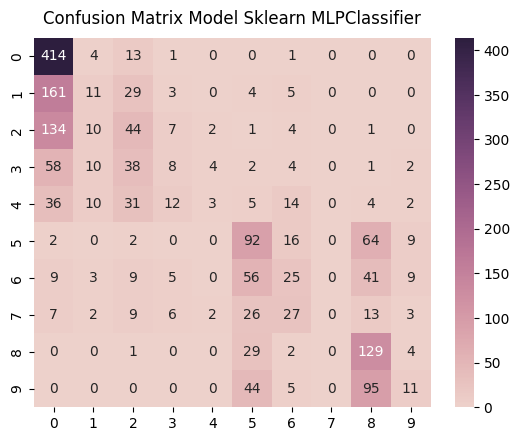

              precision    recall  f1-score      support
0.0            0.504263  0.956120  0.660287   433.000000
1.0            0.220000  0.051643  0.083650   213.000000
2.0            0.250000  0.216749  0.232190   203.000000
3.0            0.190476  0.062992  0.094675   127.000000
4.0            0.272727  0.025641  0.046875   117.000000
5.0            0.355212  0.497297  0.414414   185.000000
6.0            0.242718  0.159236  0.192308   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.370690  0.781818  0.502924   165.000000
9.0            0.275000  0.070968  0.112821   155.000000
accuracy       0.398378  0.398378  0.398378     0.398378
macro avg      0.268109  0.282246  0.234014  1850.000000
weighted avg   0.313333  0.398378  0.311185  1850.000000
Mean Squared Error:  3.5891891891891894


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(16, 32, 64), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 64/32/16 (Train Accuracy 0.450270 and Test Accuracy 0.434360)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


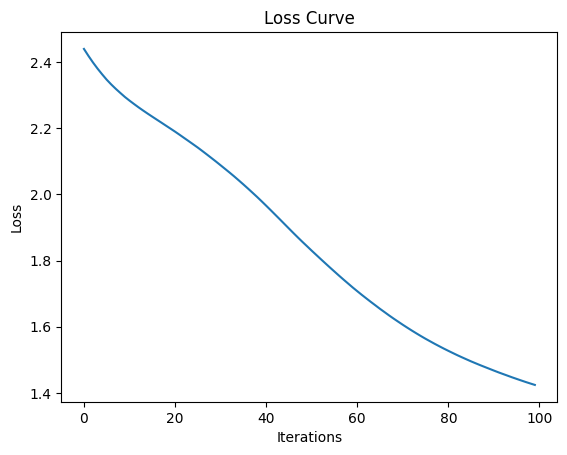

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64, 32, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

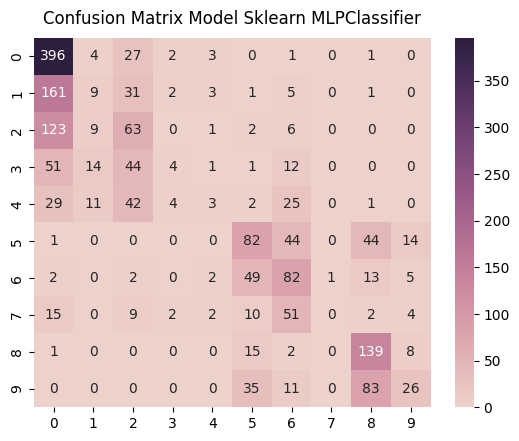

              precision    recall  f1-score     support
0.0            0.508344  0.912442  0.652927   434.00000
1.0            0.191489  0.042254  0.069231   213.00000
2.0            0.288991  0.308824  0.298578   204.00000
3.0            0.285714  0.031496  0.056738   127.00000
4.0            0.200000  0.025641  0.045455   117.00000
5.0            0.416244  0.443243  0.429319   185.00000
6.0            0.343096  0.525641  0.415190   156.00000
7.0            0.000000  0.000000  0.000000    95.00000
8.0            0.489437  0.842424  0.619154   165.00000
9.0            0.456140  0.167742  0.245283   155.00000
accuracy       0.434360  0.434360  0.434360     0.43436
macro avg      0.317946  0.329971  0.283187  1851.00000
weighted avg   0.357664  0.434360  0.354361  1851.00000
Mean Squared Error:  3.1674770394381415


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

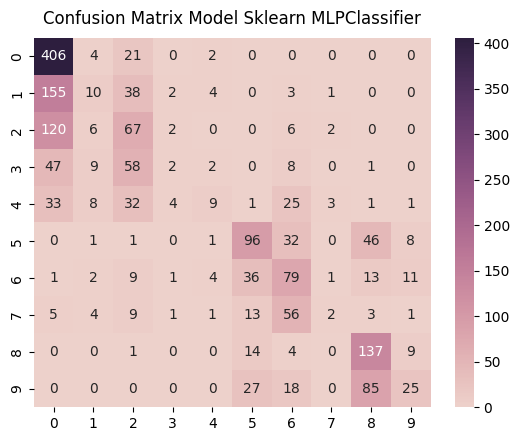

              precision    recall  f1-score     support
0.0            0.529335  0.937644  0.676667   433.00000
1.0            0.227273  0.046948  0.077821   213.00000
2.0            0.283898  0.330049  0.305239   203.00000
3.0            0.166667  0.015748  0.028777   127.00000
4.0            0.391304  0.076923  0.128571   117.00000
5.0            0.513369  0.518919  0.516129   185.00000
6.0            0.341991  0.503185  0.407216   157.00000
7.0            0.222222  0.021053  0.038462    95.00000
8.0            0.479021  0.830303  0.607539   165.00000
9.0            0.454545  0.161290  0.238095   155.00000
accuracy       0.450270  0.450270  0.450270     0.45027
macro avg      0.360963  0.344206  0.302452  1850.00000
weighted avg   0.389979  0.450270  0.373218  1850.00000
Mean Squared Error:  2.8551351351351353


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

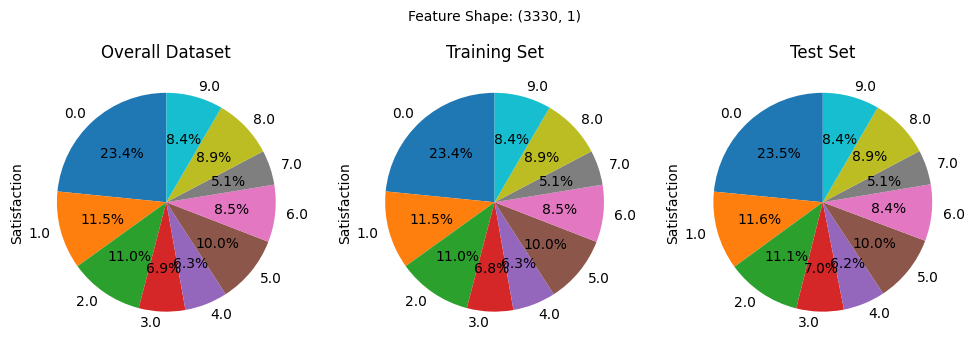

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


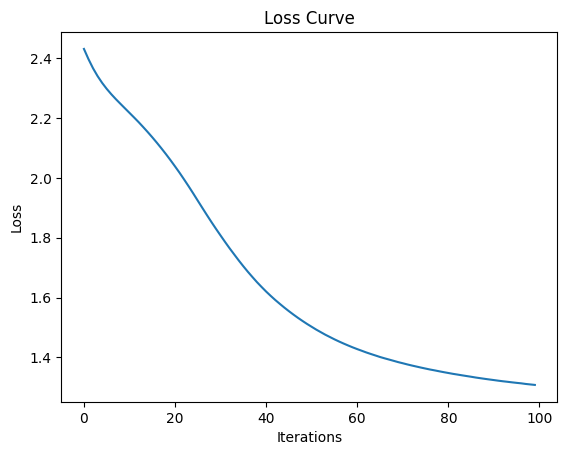

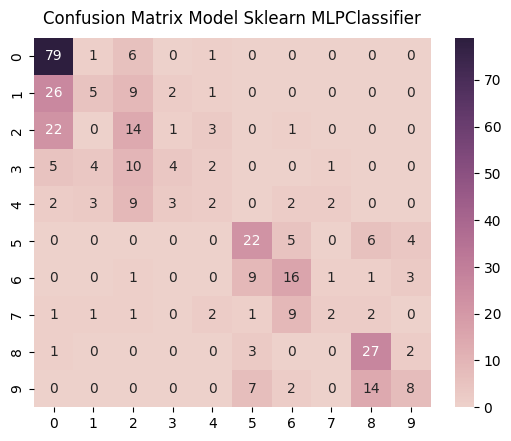

              precision    recall  f1-score    support
0.0            0.580882  0.908046  0.708520   87.00000
1.0            0.357143  0.116279  0.175439   43.00000
2.0            0.280000  0.341463  0.307692   41.00000
3.0            0.400000  0.153846  0.222222   26.00000
4.0            0.181818  0.086957  0.117647   23.00000
5.0            0.523810  0.594595  0.556962   37.00000
6.0            0.457143  0.516129  0.484848   31.00000
7.0            0.333333  0.105263  0.160000   19.00000
8.0            0.540000  0.818182  0.650602   33.00000
9.0            0.470588  0.258065  0.333333   31.00000
accuracy       0.482480  0.482480  0.482480    0.48248
macro avg      0.412472  0.389882  0.371727  371.00000
weighted avg   0.442721  0.482480  0.433330  371.00000
Mean Squared Error:  2.6495956873315363


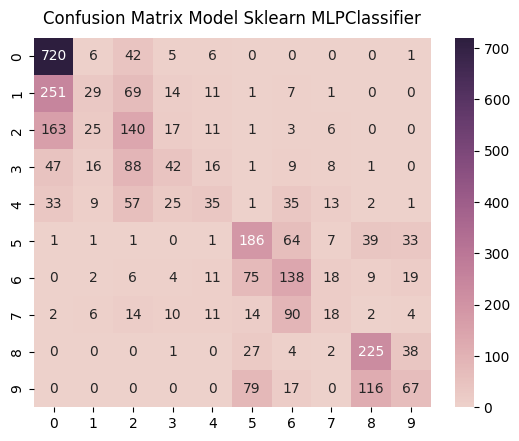

              precision    recall  f1-score     support
0.0            0.591619  0.923077  0.721082   780.00000
1.0            0.308511  0.075718  0.121593   383.00000
2.0            0.335731  0.382514  0.357599   366.00000
3.0            0.355932  0.184211  0.242775   228.00000
4.0            0.343137  0.165877  0.223642   211.00000
5.0            0.483117  0.558559  0.518106   333.00000
6.0            0.376022  0.489362  0.425270   282.00000
7.0            0.246575  0.105263  0.147541   171.00000
8.0            0.571066  0.757576  0.651230   297.00000
9.0            0.411043  0.240143  0.303167   279.00000
accuracy       0.480480  0.480480  0.480480     0.48048
macro avg      0.402275  0.388230  0.371200  3330.00000
weighted avg   0.435262  0.480480  0.431868  3330.00000
Mean Squared Error:  2.5648648648648646


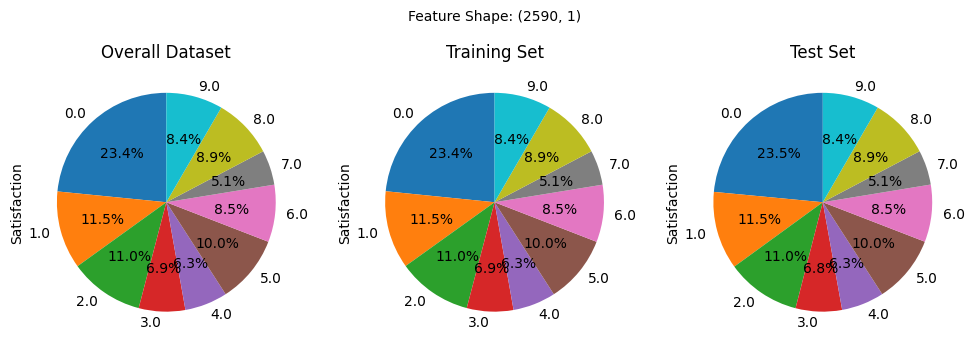

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


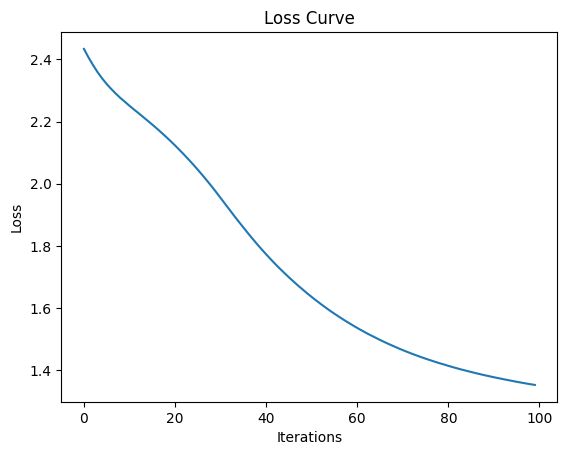

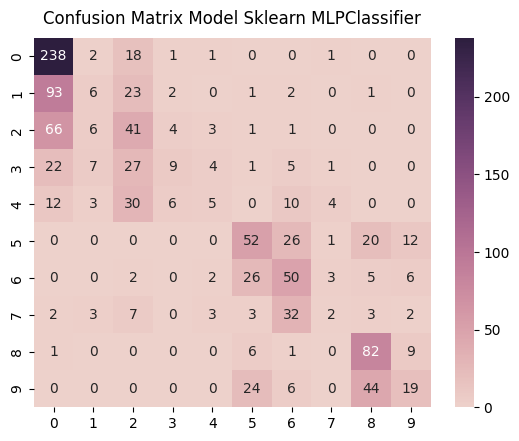

              precision    recall  f1-score      support
0.0            0.548387  0.911877  0.684892   261.000000
1.0            0.222222  0.046875  0.077419   128.000000
2.0            0.277027  0.336066  0.303704   122.000000
3.0            0.409091  0.118421  0.183673    76.000000
4.0            0.277778  0.071429  0.113636    70.000000
5.0            0.456140  0.468468  0.462222   111.000000
6.0            0.375940  0.531915  0.440529    94.000000
7.0            0.166667  0.035088  0.057971    57.000000
8.0            0.529032  0.828283  0.645669    99.000000
9.0            0.395833  0.204301  0.269504    93.000000
accuracy       0.453645  0.453645  0.453645     0.453645
macro avg      0.365812  0.355272  0.323922  1111.000000
weighted avg   0.396546  0.453645  0.389413  1111.000000
Mean Squared Error:  2.756075607560756


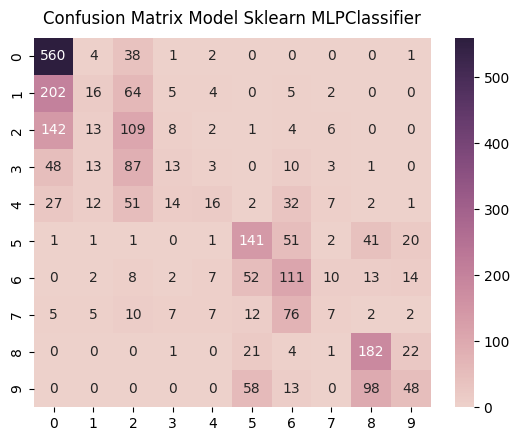

              precision    recall  f1-score      support
0.0            0.568528  0.924092  0.703960   606.000000
1.0            0.242424  0.053691  0.087912   298.000000
2.0            0.296196  0.382456  0.333844   285.000000
3.0            0.254902  0.073034  0.113537   178.000000
4.0            0.380952  0.097561  0.155340   164.000000
5.0            0.491289  0.544402  0.516484   259.000000
6.0            0.362745  0.506849  0.422857   219.000000
7.0            0.184211  0.052632  0.081871   133.000000
8.0            0.536873  0.787879  0.638596   231.000000
9.0            0.444444  0.221198  0.295385   217.000000
accuracy       0.464479  0.464479  0.464479     0.464479
macro avg      0.376256  0.364379  0.334979  2590.000000
weighted avg   0.409530  0.464479  0.402512  2590.000000
Mean Squared Error:  2.7046332046332044


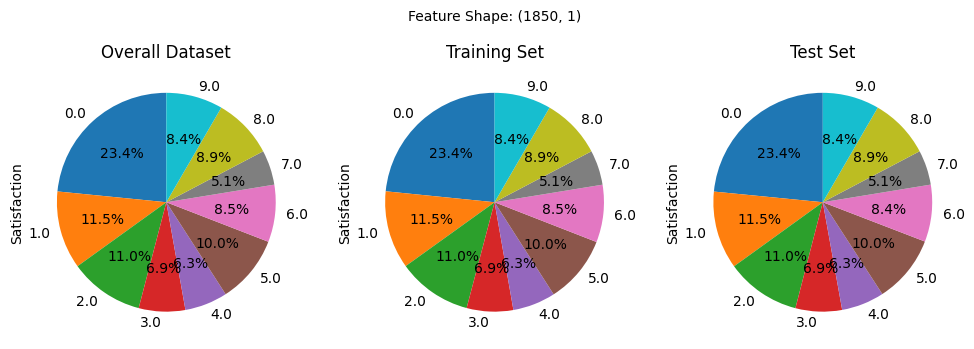

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


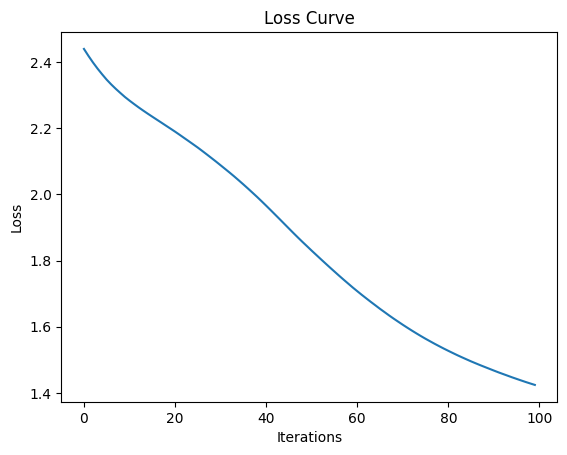

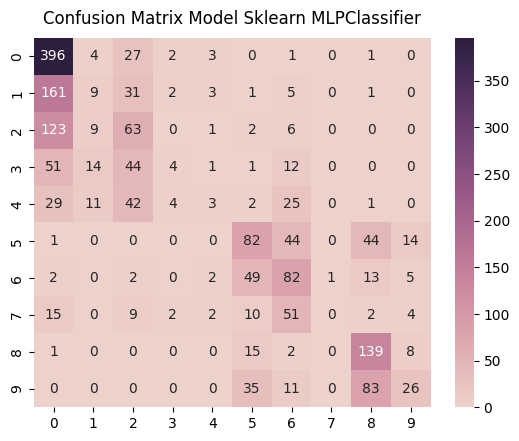

              precision    recall  f1-score     support
0.0            0.508344  0.912442  0.652927   434.00000
1.0            0.191489  0.042254  0.069231   213.00000
2.0            0.288991  0.308824  0.298578   204.00000
3.0            0.285714  0.031496  0.056738   127.00000
4.0            0.200000  0.025641  0.045455   117.00000
5.0            0.416244  0.443243  0.429319   185.00000
6.0            0.343096  0.525641  0.415190   156.00000
7.0            0.000000  0.000000  0.000000    95.00000
8.0            0.489437  0.842424  0.619154   165.00000
9.0            0.456140  0.167742  0.245283   155.00000
accuracy       0.434360  0.434360  0.434360     0.43436
macro avg      0.317946  0.329971  0.283187  1851.00000
weighted avg   0.357664  0.434360  0.354361  1851.00000
Mean Squared Error:  3.1674770394381415


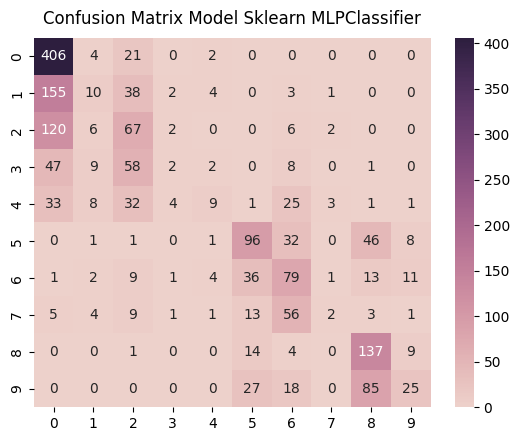

              precision    recall  f1-score     support
0.0            0.529335  0.937644  0.676667   433.00000
1.0            0.227273  0.046948  0.077821   213.00000
2.0            0.283898  0.330049  0.305239   203.00000
3.0            0.166667  0.015748  0.028777   127.00000
4.0            0.391304  0.076923  0.128571   117.00000
5.0            0.513369  0.518919  0.516129   185.00000
6.0            0.341991  0.503185  0.407216   157.00000
7.0            0.222222  0.021053  0.038462    95.00000
8.0            0.479021  0.830303  0.607539   165.00000
9.0            0.454545  0.161290  0.238095   155.00000
accuracy       0.450270  0.450270  0.450270     0.45027
macro avg      0.360963  0.344206  0.302452  1850.00000
weighted avg   0.389979  0.450270  0.373218  1850.00000
Mean Squared Error:  2.8551351351351353


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(64, 32, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 8/64/128


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


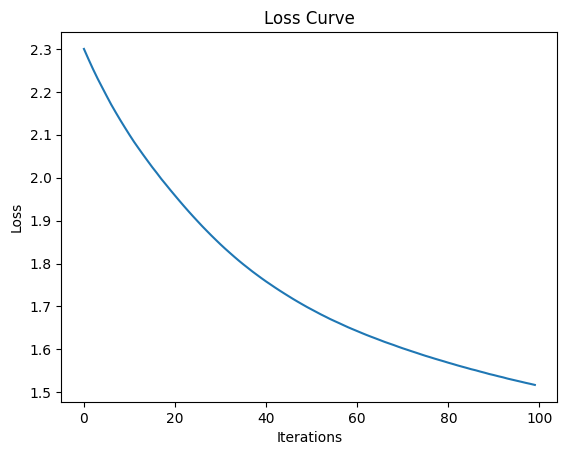

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(8, 64, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

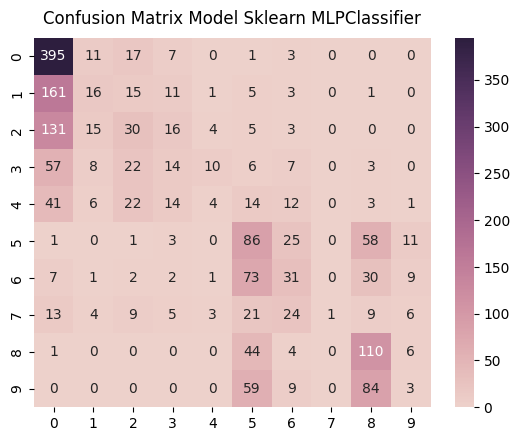

              precision    recall  f1-score      support
0.0            0.489467  0.910138  0.636583   434.000000
1.0            0.262295  0.075117  0.116788   213.000000
2.0            0.254237  0.147059  0.186335   204.000000
3.0            0.194444  0.110236  0.140704   127.000000
4.0            0.173913  0.034188  0.057143   117.000000
5.0            0.273885  0.464865  0.344689   185.000000
6.0            0.256198  0.198718  0.223827   156.000000
7.0            1.000000  0.010526  0.020833    95.000000
8.0            0.369128  0.666667  0.475162   165.000000
9.0            0.083333  0.019355  0.031414   155.000000
accuracy       0.372771  0.372771  0.372771     0.372771
macro avg      0.335690  0.263687  0.223348  1851.000000
weighted avg   0.337473  0.372771  0.295870  1851.000000
Mean Squared Error:  3.9313884386817937


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

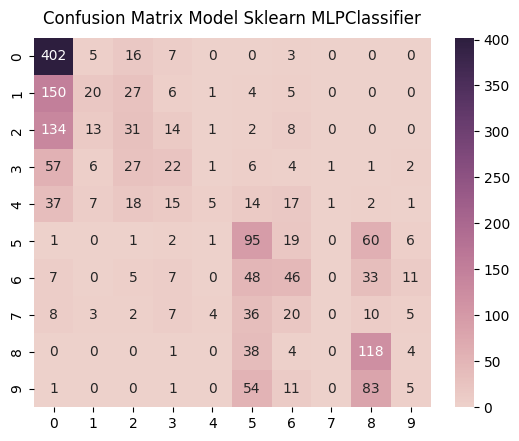

              precision    recall  f1-score      support
0.0            0.504391  0.928406  0.653659   433.000000
1.0            0.370370  0.093897  0.149813   213.000000
2.0            0.244094  0.152709  0.187879   203.000000
3.0            0.268293  0.173228  0.210526   127.000000
4.0            0.384615  0.042735  0.076923   117.000000
5.0            0.319865  0.513514  0.394191   185.000000
6.0            0.335766  0.292994  0.312925   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.384365  0.715152  0.500000   165.000000
9.0            0.147059  0.032258  0.052910   155.000000
accuracy       0.402162  0.402162  0.402162     0.402162
macro avg      0.295882  0.294489  0.253883  1850.000000
weighted avg   0.337308  0.402162  0.325176  1850.000000
Mean Squared Error:  3.6724324324324322


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

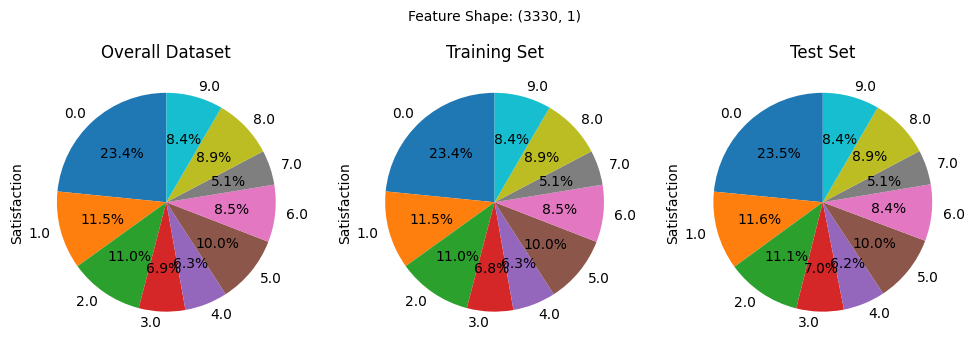

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


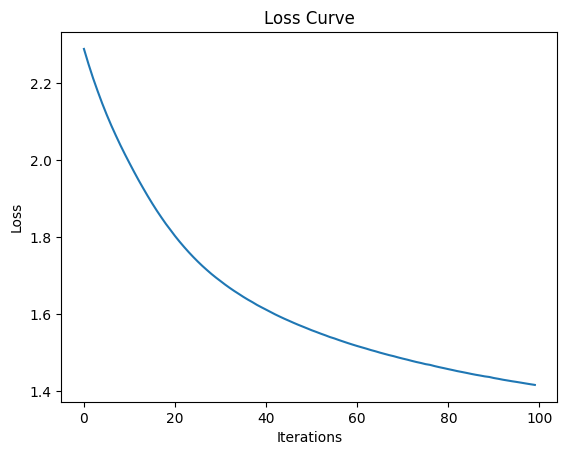

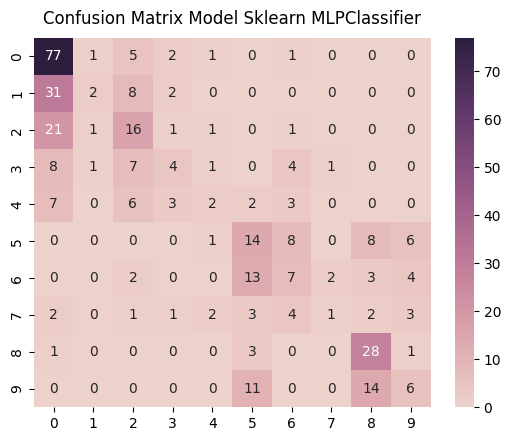

              precision    recall  f1-score     support
0.0            0.523810  0.885057  0.658120   87.000000
1.0            0.400000  0.046512  0.083333   43.000000
2.0            0.355556  0.390244  0.372093   41.000000
3.0            0.307692  0.153846  0.205128   26.000000
4.0            0.250000  0.086957  0.129032   23.000000
5.0            0.304348  0.378378  0.337349   37.000000
6.0            0.250000  0.225806  0.237288   31.000000
7.0            0.250000  0.052632  0.086957   19.000000
8.0            0.509091  0.848485  0.636364   33.000000
9.0            0.300000  0.193548  0.235294   31.000000
accuracy       0.423181  0.423181  0.423181    0.423181
macro avg      0.345050  0.326147  0.298096  371.000000
weighted avg   0.379946  0.423181  0.361673  371.000000
Mean Squared Error:  3.4339622641509435


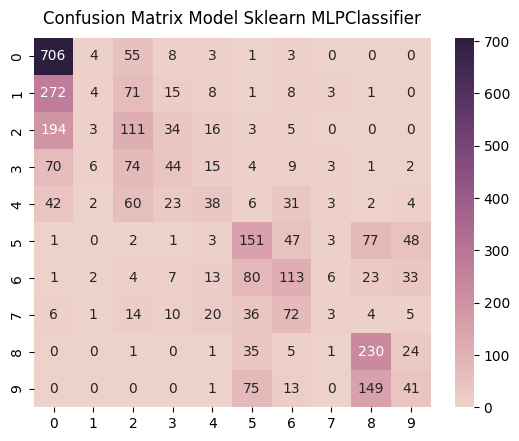

              precision    recall  f1-score      support
0.0            0.546440  0.905128  0.681467   780.000000
1.0            0.181818  0.010444  0.019753   383.000000
2.0            0.283163  0.303279  0.292876   366.000000
3.0            0.309859  0.192982  0.237838   228.000000
4.0            0.322034  0.180095  0.231003   211.000000
5.0            0.385204  0.453453  0.416552   333.000000
6.0            0.369281  0.400709  0.384354   282.000000
7.0            0.136364  0.017544  0.031088   171.000000
8.0            0.472279  0.774411  0.586735   297.000000
9.0            0.261146  0.146953  0.188073   279.000000
accuracy       0.432733  0.432733  0.432733     0.432733
macro avg      0.326759  0.338500  0.306974  3330.000000
weighted avg   0.362447  0.432733  0.368895  3330.000000
Mean Squared Error:  3.0057057057057057


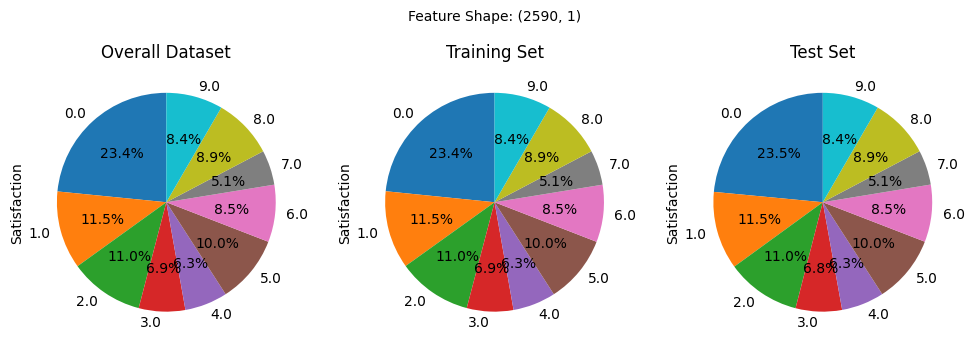

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


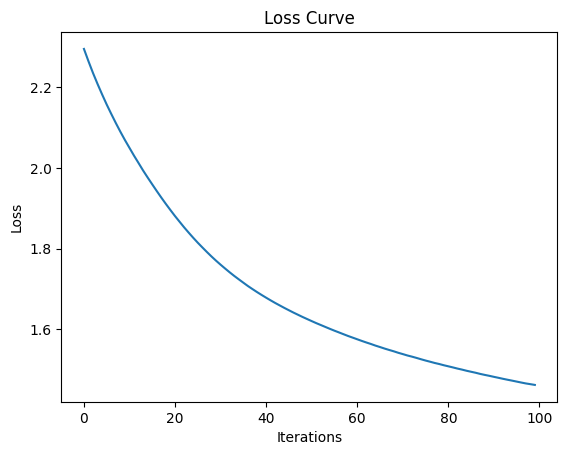

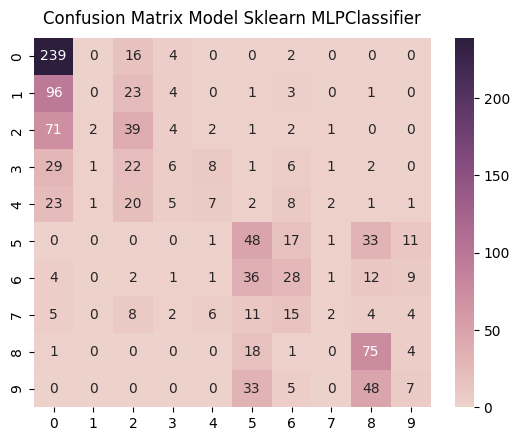

              precision    recall  f1-score      support
0.0            0.510684  0.915709  0.655693   261.000000
1.0            0.000000  0.000000  0.000000   128.000000
2.0            0.300000  0.319672  0.309524   122.000000
3.0            0.230769  0.078947  0.117647    76.000000
4.0            0.280000  0.100000  0.147368    70.000000
5.0            0.317881  0.432432  0.366412   111.000000
6.0            0.321839  0.297872  0.309392    94.000000
7.0            0.250000  0.035088  0.061538    57.000000
8.0            0.426136  0.757576  0.545455    99.000000
9.0            0.194444  0.075269  0.108527    93.000000
accuracy       0.405941  0.405941  0.405941     0.405941
macro avg      0.283175  0.301257  0.262156  1111.000000
weighted avg   0.312408  0.405941  0.328992  1111.000000
Mean Squared Error:  3.6903690369036903


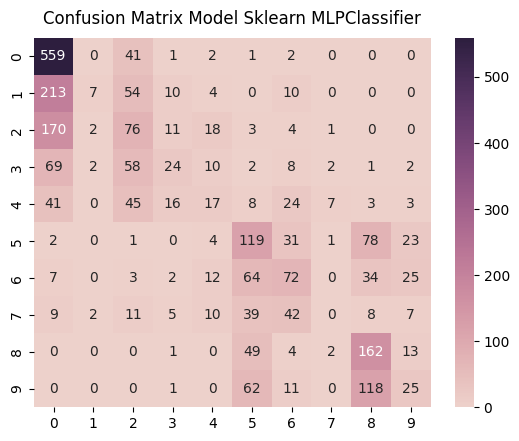

              precision    recall  f1-score      support
0.0            0.522430  0.922442  0.667064   606.000000
1.0            0.538462  0.023490  0.045016   298.000000
2.0            0.262976  0.266667  0.264808   285.000000
3.0            0.338028  0.134831  0.192771   178.000000
4.0            0.220779  0.103659  0.141079   164.000000
5.0            0.342939  0.459459  0.392739   259.000000
6.0            0.346154  0.328767  0.337237   219.000000
7.0            0.000000  0.000000  0.000000   133.000000
8.0            0.400990  0.701299  0.510236   231.000000
9.0            0.255102  0.115207  0.158730   217.000000
accuracy       0.409653  0.409653  0.409653     0.409653
macro avg      0.322786  0.305582  0.270968  2590.000000
weighted avg   0.371040  0.409653  0.339174  2590.000000
Mean Squared Error:  3.3656370656370656


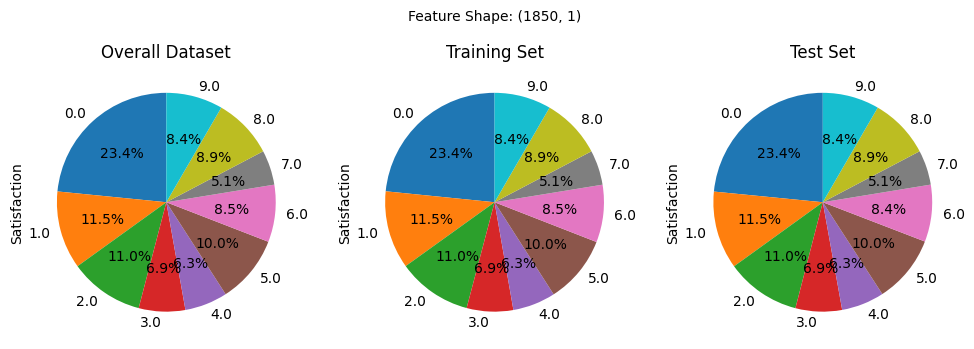

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


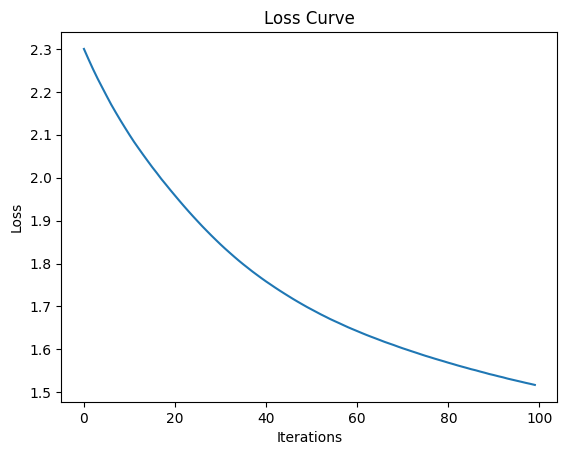

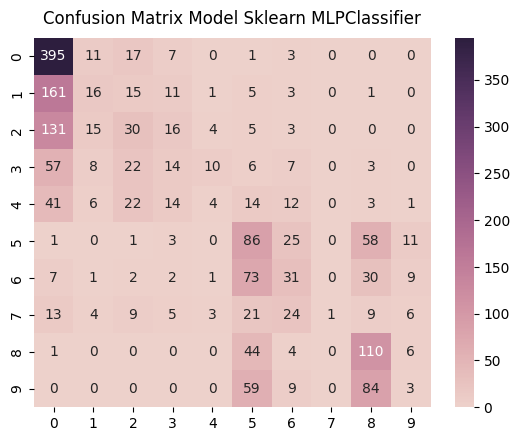

              precision    recall  f1-score      support
0.0            0.489467  0.910138  0.636583   434.000000
1.0            0.262295  0.075117  0.116788   213.000000
2.0            0.254237  0.147059  0.186335   204.000000
3.0            0.194444  0.110236  0.140704   127.000000
4.0            0.173913  0.034188  0.057143   117.000000
5.0            0.273885  0.464865  0.344689   185.000000
6.0            0.256198  0.198718  0.223827   156.000000
7.0            1.000000  0.010526  0.020833    95.000000
8.0            0.369128  0.666667  0.475162   165.000000
9.0            0.083333  0.019355  0.031414   155.000000
accuracy       0.372771  0.372771  0.372771     0.372771
macro avg      0.335690  0.263687  0.223348  1851.000000
weighted avg   0.337473  0.372771  0.295870  1851.000000
Mean Squared Error:  3.9313884386817937


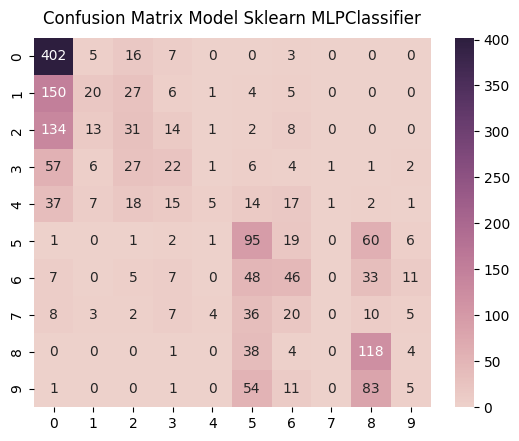

              precision    recall  f1-score      support
0.0            0.504391  0.928406  0.653659   433.000000
1.0            0.370370  0.093897  0.149813   213.000000
2.0            0.244094  0.152709  0.187879   203.000000
3.0            0.268293  0.173228  0.210526   127.000000
4.0            0.384615  0.042735  0.076923   117.000000
5.0            0.319865  0.513514  0.394191   185.000000
6.0            0.335766  0.292994  0.312925   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.384365  0.715152  0.500000   165.000000
9.0            0.147059  0.032258  0.052910   155.000000
accuracy       0.402162  0.402162  0.402162     0.402162
macro avg      0.295882  0.294489  0.253883  1850.000000
weighted avg   0.337308  0.402162  0.325176  1850.000000
Mean Squared Error:  3.6724324324324322


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(8, 64, 128), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 128/64/8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


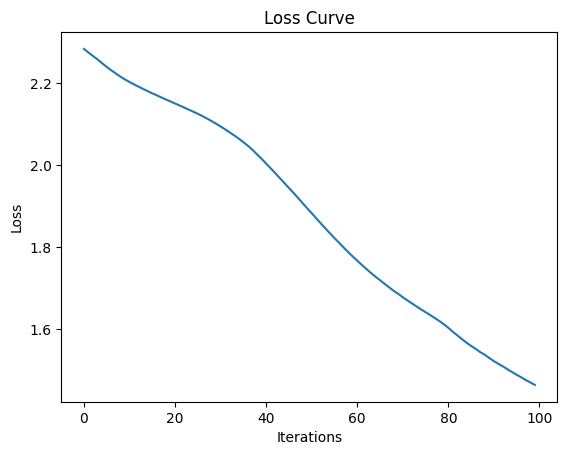

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 64, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

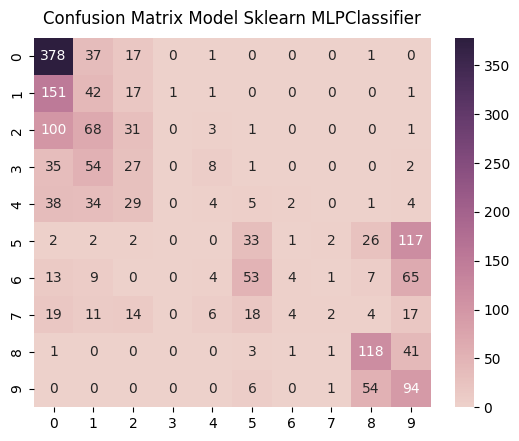

              precision    recall  f1-score      support
0.0            0.512890  0.870968  0.645602   434.000000
1.0            0.163424  0.197183  0.178723   213.000000
2.0            0.226277  0.151961  0.181818   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.148148  0.034188  0.055556   117.000000
5.0            0.275000  0.178378  0.216393   185.000000
6.0            0.333333  0.025641  0.047619   156.000000
7.0            0.285714  0.021053  0.039216    95.000000
8.0            0.559242  0.715152  0.627660   165.000000
9.0            0.274854  0.606452  0.378270   155.000000
accuracy       0.381415  0.381415  0.381415     0.381415
macro avg      0.277888  0.280097  0.237086  1851.000000
weighted avg   0.316474  0.381415  0.310769  1851.000000
Mean Squared Error:  4.608319827120475


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

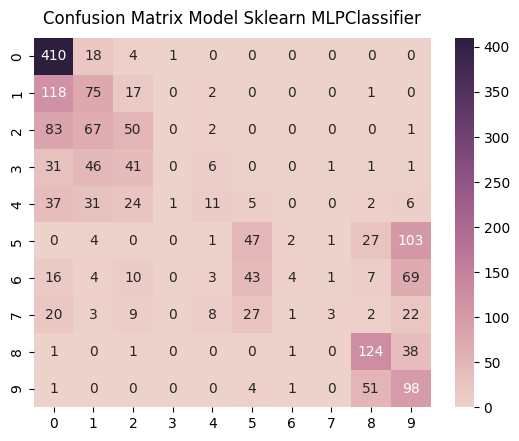

              precision    recall  f1-score      support
0.0            0.571827  0.946882  0.713043   433.000000
1.0            0.302419  0.352113  0.325380   213.000000
2.0            0.320513  0.246305  0.278552   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.333333  0.094017  0.146667   117.000000
5.0            0.373016  0.254054  0.302251   185.000000
6.0            0.444444  0.025478  0.048193   157.000000
7.0            0.500000  0.031579  0.059406    95.000000
8.0            0.576744  0.751515  0.652632   165.000000
9.0            0.289941  0.632258  0.397566   155.000000
accuracy       0.444324  0.444324  0.444324     0.444324
macro avg      0.371224  0.333420  0.292369  1850.000000
weighted avg   0.401335  0.444324  0.373077  1850.000000
Mean Squared Error:  4.257837837837838


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

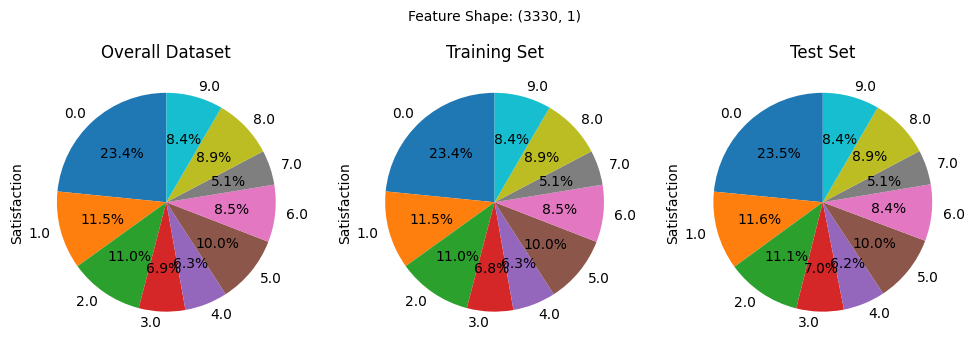

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


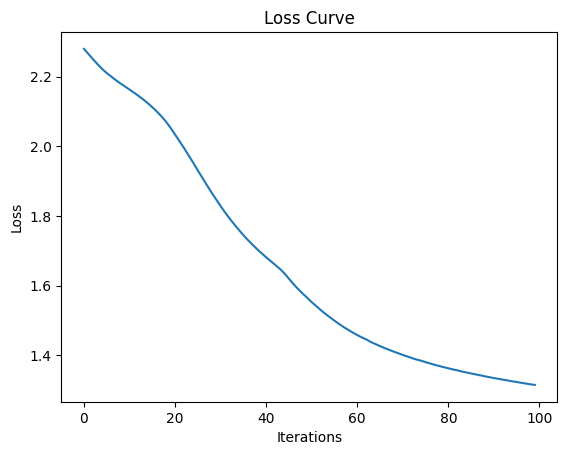

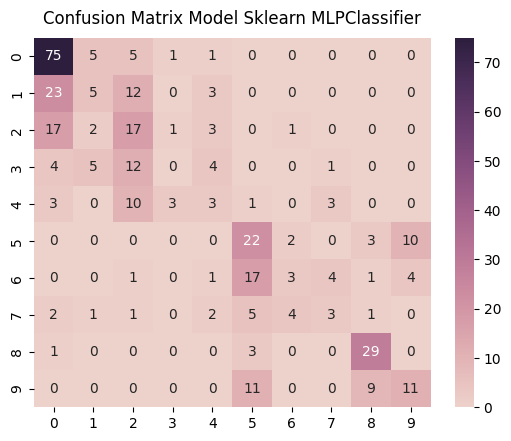

              precision    recall  f1-score    support
0.0            0.600000  0.862069  0.707547   87.00000
1.0            0.277778  0.116279  0.163934   43.00000
2.0            0.293103  0.414634  0.343434   41.00000
3.0            0.000000  0.000000  0.000000   26.00000
4.0            0.176471  0.130435  0.150000   23.00000
5.0            0.372881  0.594595  0.458333   37.00000
6.0            0.300000  0.096774  0.146341   31.00000
7.0            0.272727  0.157895  0.200000   19.00000
8.0            0.674419  0.878788  0.763158   33.00000
9.0            0.440000  0.354839  0.392857   31.00000
accuracy       0.452830  0.452830  0.452830    0.45283
macro avg      0.340738  0.360631  0.332561  371.00000
weighted avg   0.389204  0.452830  0.401063  371.00000
Mean Squared Error:  3.142857142857143


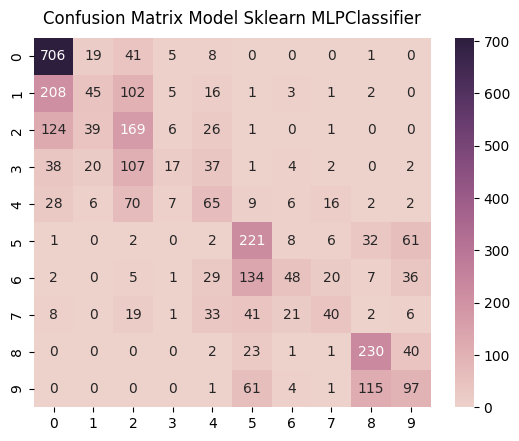

              precision    recall  f1-score      support
0.0            0.633184  0.905128  0.745119   780.000000
1.0            0.348837  0.117493  0.175781   383.000000
2.0            0.328155  0.461749  0.383655   366.000000
3.0            0.404762  0.074561  0.125926   228.000000
4.0            0.296804  0.308057  0.302326   211.000000
5.0            0.449187  0.663664  0.535758   333.000000
6.0            0.505263  0.170213  0.254642   282.000000
7.0            0.454545  0.233918  0.308880   171.000000
8.0            0.588235  0.774411  0.668605   297.000000
9.0            0.397541  0.347670  0.370937   279.000000
accuracy       0.491892  0.491892  0.491892     0.491892
macro avg      0.440651  0.405686  0.387163  3330.000000
weighted avg   0.467842  0.491892  0.446408  3330.000000
Mean Squared Error:  2.5558558558558557


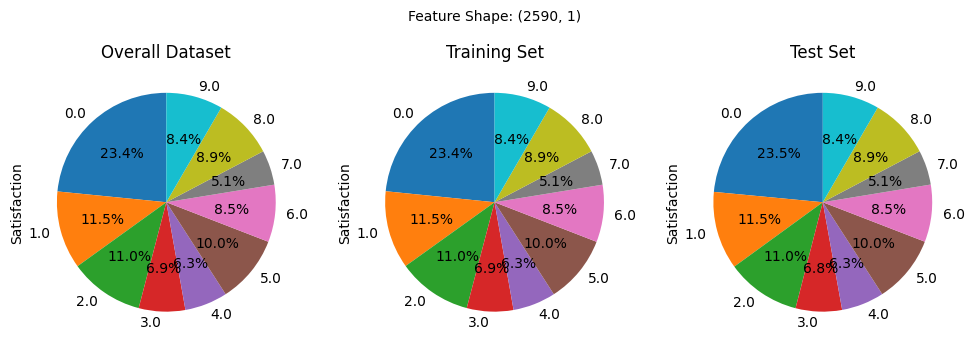

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


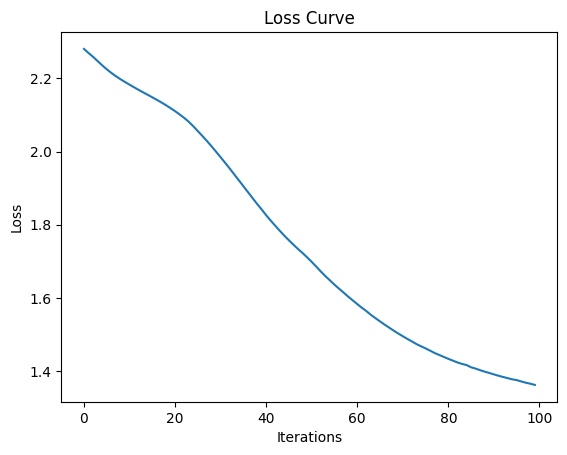

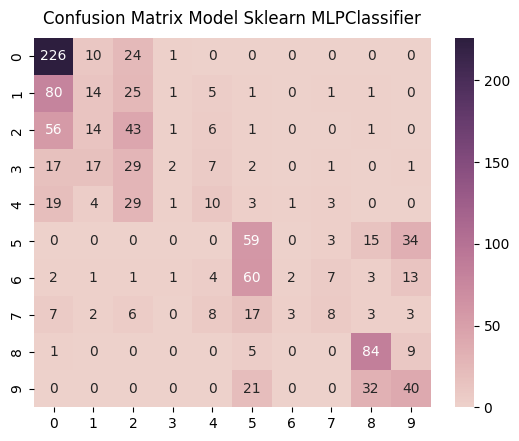

              precision    recall  f1-score      support
0.0            0.553922  0.865900  0.675635   261.000000
1.0            0.225806  0.109375  0.147368   128.000000
2.0            0.273885  0.352459  0.308244   122.000000
3.0            0.285714  0.026316  0.048193    76.000000
4.0            0.250000  0.142857  0.181818    70.000000
5.0            0.349112  0.531532  0.421429   111.000000
6.0            0.333333  0.021277  0.040000    94.000000
7.0            0.347826  0.140351  0.200000    57.000000
8.0            0.604317  0.848485  0.705882    99.000000
9.0            0.400000  0.430108  0.414508    93.000000
accuracy       0.439244  0.439244  0.439244     0.439244
macro avg      0.362392  0.346866  0.314308  1111.000000
weighted avg   0.389778  0.439244  0.377651  1111.000000
Mean Squared Error:  3.3483348334833485


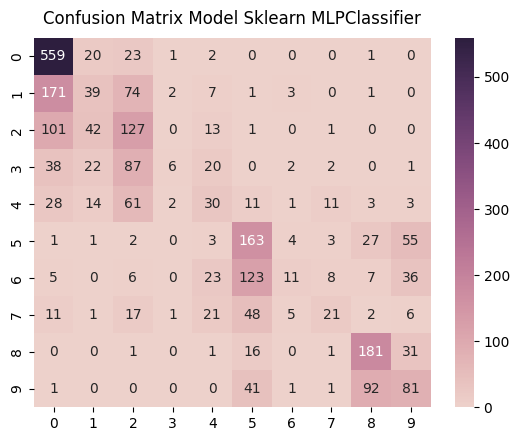

              precision    recall  f1-score     support
0.0            0.610929  0.922442  0.735043   606.00000
1.0            0.280576  0.130872  0.178490   298.00000
2.0            0.319095  0.445614  0.371889   285.00000
3.0            0.500000  0.033708  0.063158   178.00000
4.0            0.250000  0.182927  0.211268   164.00000
5.0            0.403465  0.629344  0.491704   259.00000
6.0            0.407407  0.050228  0.089431   219.00000
7.0            0.437500  0.157895  0.232044   133.00000
8.0            0.576433  0.783550  0.664220   231.00000
9.0            0.380282  0.373272  0.376744   217.00000
accuracy       0.470270  0.470270  0.470270     0.47027
macro avg      0.416569  0.370985  0.341399  2590.00000
weighted avg   0.441066  0.470270  0.410614  2590.00000
Mean Squared Error:  2.870656370656371


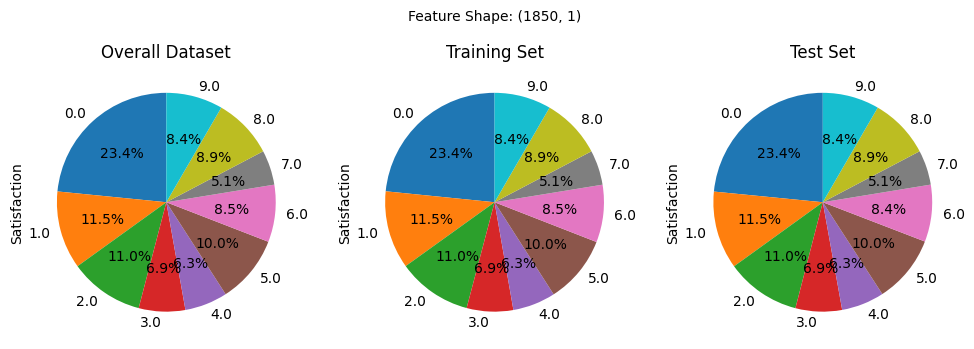

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


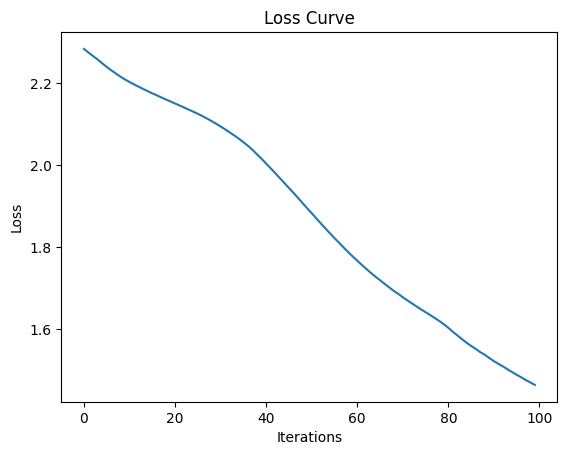

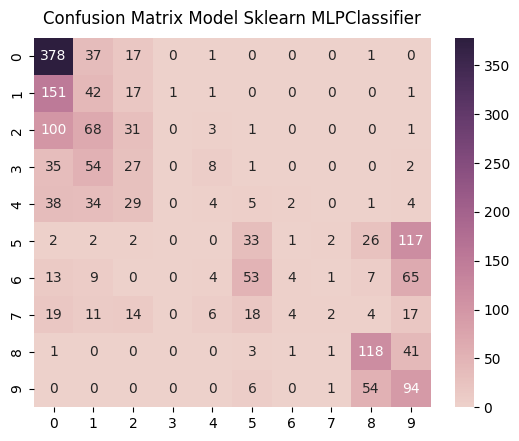

              precision    recall  f1-score      support
0.0            0.512890  0.870968  0.645602   434.000000
1.0            0.163424  0.197183  0.178723   213.000000
2.0            0.226277  0.151961  0.181818   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.148148  0.034188  0.055556   117.000000
5.0            0.275000  0.178378  0.216393   185.000000
6.0            0.333333  0.025641  0.047619   156.000000
7.0            0.285714  0.021053  0.039216    95.000000
8.0            0.559242  0.715152  0.627660   165.000000
9.0            0.274854  0.606452  0.378270   155.000000
accuracy       0.381415  0.381415  0.381415     0.381415
macro avg      0.277888  0.280097  0.237086  1851.000000
weighted avg   0.316474  0.381415  0.310769  1851.000000
Mean Squared Error:  4.608319827120475


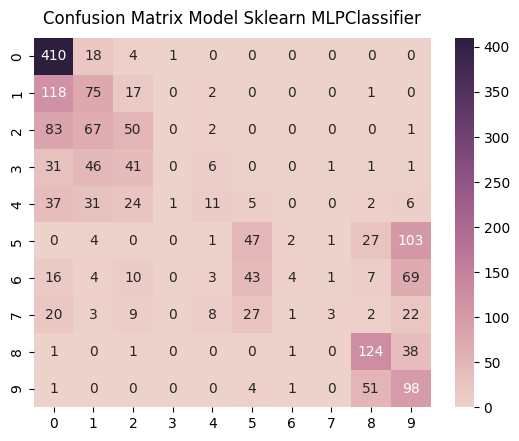

              precision    recall  f1-score      support
0.0            0.571827  0.946882  0.713043   433.000000
1.0            0.302419  0.352113  0.325380   213.000000
2.0            0.320513  0.246305  0.278552   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.333333  0.094017  0.146667   117.000000
5.0            0.373016  0.254054  0.302251   185.000000
6.0            0.444444  0.025478  0.048193   157.000000
7.0            0.500000  0.031579  0.059406    95.000000
8.0            0.576744  0.751515  0.652632   165.000000
9.0            0.289941  0.632258  0.397566   155.000000
accuracy       0.444324  0.444324  0.444324     0.444324
macro avg      0.371224  0.333420  0.292369  1850.000000
weighted avg   0.401335  0.444324  0.373077  1850.000000
Mean Squared Error:  4.257837837837838


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128, 64, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 16/8/32


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


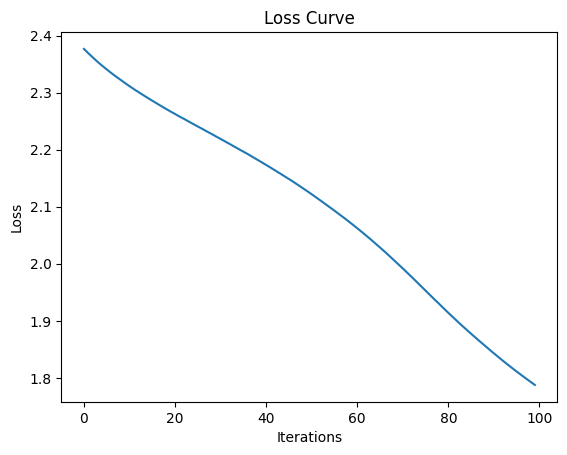

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(16, 8, 32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

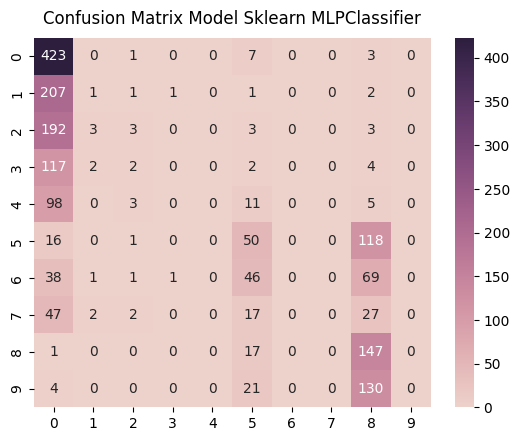

              precision    recall  f1-score      support
0.0            0.370079  0.974654  0.536462   434.000000
1.0            0.111111  0.004695  0.009009   213.000000
2.0            0.214286  0.014706  0.027523   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.285714  0.270270  0.277778   185.000000
6.0            0.000000  0.000000  0.000000   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.289370  0.890909  0.436850   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.337115  0.337115  0.337115     0.337115
macro avg      0.127056  0.215523  0.128762  1851.000000
weighted avg   0.177525  0.337115  0.196557  1851.000000
Mean Squared Error:  6.041599135602377


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

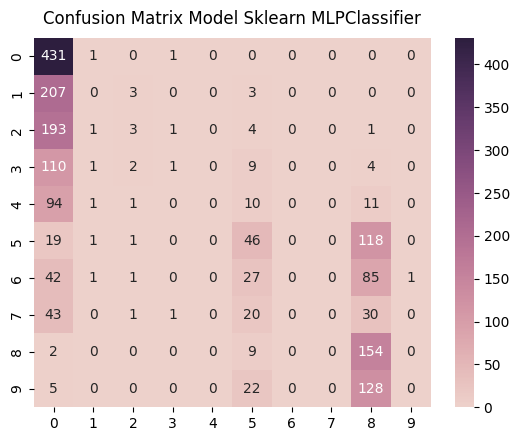

              precision    recall  f1-score      support
0.0            0.376091  0.995381  0.545915   433.000000
1.0            0.000000  0.000000  0.000000   213.000000
2.0            0.250000  0.014778  0.027907   203.000000
3.0            0.250000  0.007874  0.015267   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.306667  0.248649  0.274627   185.000000
6.0            0.000000  0.000000  0.000000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.290019  0.933333  0.442529   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.343243  0.343243  0.343243     0.343243
macro avg      0.147278  0.220002  0.130624  1850.000000
weighted avg   0.189153  0.343243  0.198815  1850.000000
Mean Squared Error:  5.833513513513513


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

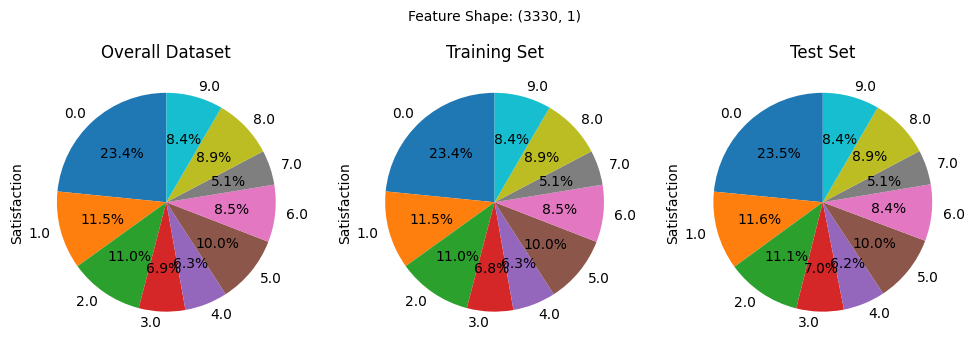

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


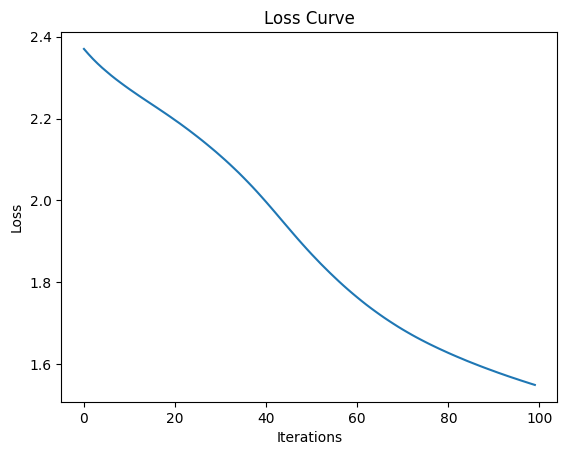

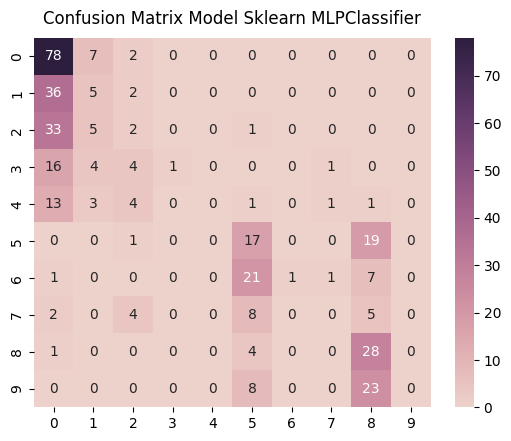

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.433333  0.896552  0.584270   87.000000
1.0            0.208333  0.116279  0.149254   43.000000
2.0            0.105263  0.048780  0.066667   41.000000
3.0            1.000000  0.038462  0.074074   26.000000
4.0            0.000000  0.000000  0.000000   23.000000
5.0            0.283333  0.459459  0.350515   37.000000
6.0            1.000000  0.032258  0.062500   31.000000
7.0            0.000000  0.000000  0.000000   19.000000
8.0            0.337349  0.848485  0.482759   33.000000
9.0            0.000000  0.000000  0.000000   31.000000
accuracy       0.355795  0.355795  0.355795    0.355795
macro avg      0.336761  0.244028  0.177004  371.000000
weighted avg   0.349299  0.355795  0.249990  371.000000
Mean Squared Error:  3.7951482479784366


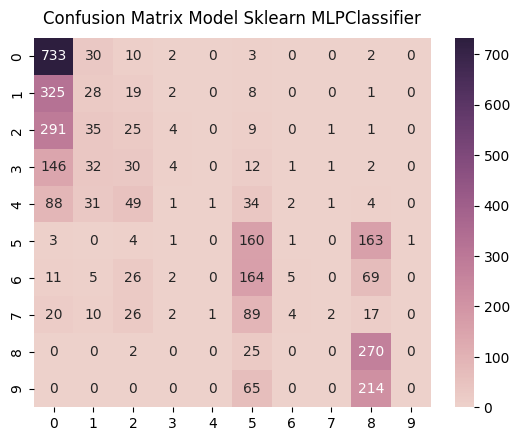

              precision    recall  f1-score      support
0.0            0.453309  0.939744  0.611598   780.000000
1.0            0.163743  0.073107  0.101083   383.000000
2.0            0.130890  0.068306  0.089767   366.000000
3.0            0.222222  0.017544  0.032520   228.000000
4.0            0.500000  0.004739  0.009390   211.000000
5.0            0.281195  0.480480  0.354767   333.000000
6.0            0.384615  0.017730  0.033898   282.000000
7.0            0.400000  0.011696  0.022727   171.000000
8.0            0.363392  0.909091  0.519231   297.000000
9.0            0.000000  0.000000  0.000000   279.000000
accuracy       0.368769  0.368769  0.368769     0.368769
macro avg      0.289937  0.252244  0.177498  3330.000000
weighted avg   0.299938  0.368769  0.253395  3330.000000
Mean Squared Error:  3.8174174174174174


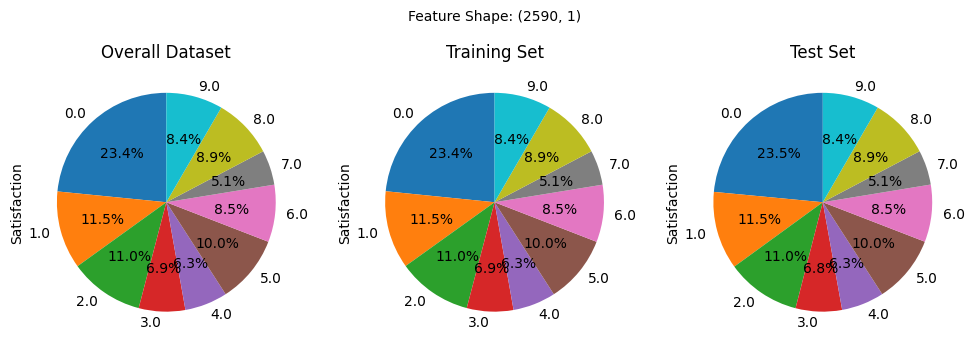

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


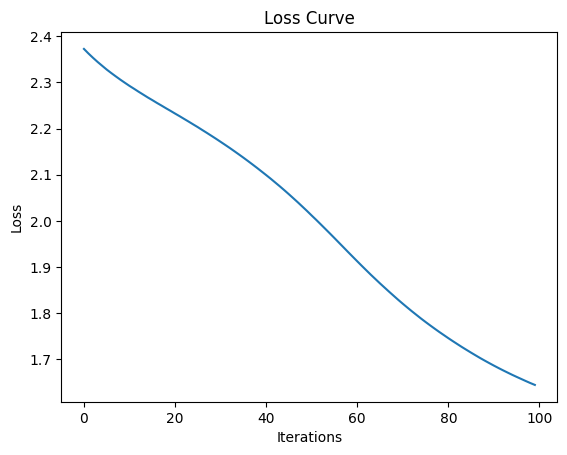

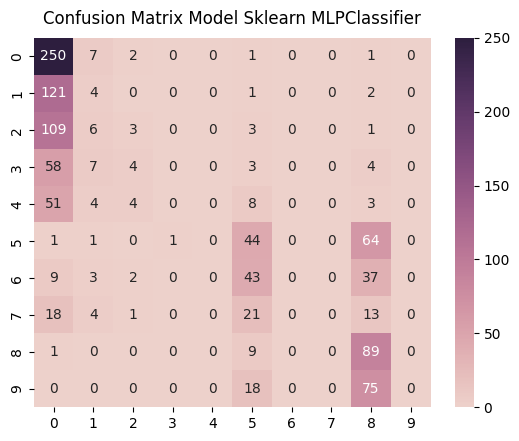

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.404531  0.957854  0.568828   261.000000
1.0            0.111111  0.031250  0.048780   128.000000
2.0            0.187500  0.024590  0.043478   122.000000
3.0            0.000000  0.000000  0.000000    76.000000
4.0            0.000000  0.000000  0.000000    70.000000
5.0            0.291391  0.396396  0.335878   111.000000
6.0            0.000000  0.000000  0.000000    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.307958  0.898990  0.458763    99.000000
9.0            0.000000  0.000000  0.000000    93.000000
accuracy       0.351035  0.351035  0.351035     0.351035
macro avg      0.130249  0.230908  0.145573  1111.000000
weighted avg   0.184979  0.351035  0.218463  1111.000000
Mean Squared Error:  4.8001800180018


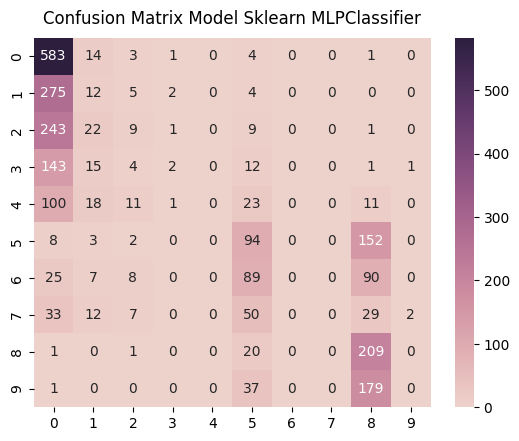

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.412890  0.962046  0.577800   606.000000
1.0            0.116505  0.040268  0.059850   298.000000
2.0            0.180000  0.031579  0.053731   285.000000
3.0            0.285714  0.011236  0.021622   178.000000
4.0            0.000000  0.000000  0.000000   164.000000
5.0            0.274854  0.362934  0.312812   259.000000
6.0            0.000000  0.000000  0.000000   219.000000
7.0            0.000000  0.000000  0.000000   133.000000
8.0            0.310550  0.904762  0.462389   231.000000
9.0            0.000000  0.000000  0.000000   217.000000
accuracy       0.350965  0.350965  0.350965     0.350965
macro avg      0.158051  0.231283  0.148820  2590.000000
weighted avg   0.204637  0.350965  0.221998  2590.000000
Mean Squared Error:  4.636293436293436


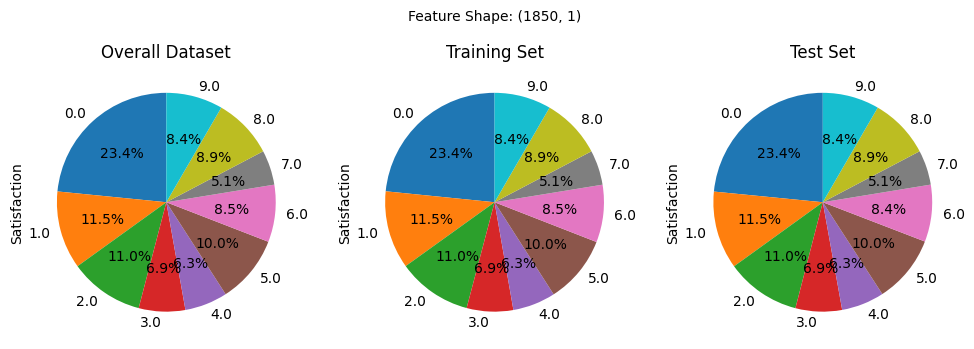

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


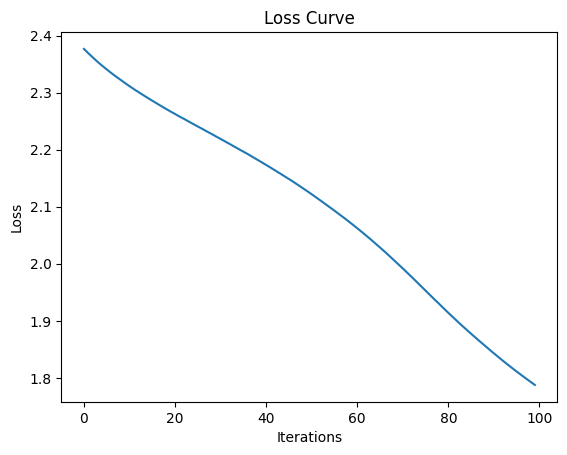

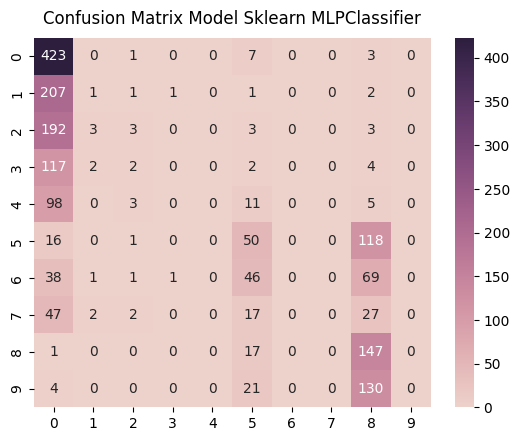

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.370079  0.974654  0.536462   434.000000
1.0            0.111111  0.004695  0.009009   213.000000
2.0            0.214286  0.014706  0.027523   204.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.285714  0.270270  0.277778   185.000000
6.0            0.000000  0.000000  0.000000   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.289370  0.890909  0.436850   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.337115  0.337115  0.337115     0.337115
macro avg      0.127056  0.215523  0.128762  1851.000000
weighted avg   0.177525  0.337115  0.196557  1851.000000
Mean Squared Error:  6.041599135602377


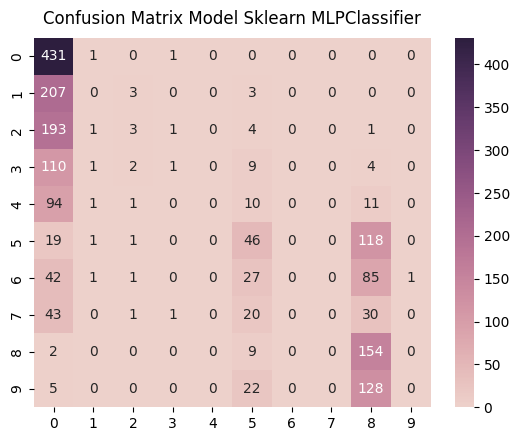

              precision    recall  f1-score      support
0.0            0.376091  0.995381  0.545915   433.000000
1.0            0.000000  0.000000  0.000000   213.000000
2.0            0.250000  0.014778  0.027907   203.000000
3.0            0.250000  0.007874  0.015267   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.306667  0.248649  0.274627   185.000000
6.0            0.000000  0.000000  0.000000   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.290019  0.933333  0.442529   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.343243  0.343243  0.343243     0.343243
macro avg      0.147278  0.220002  0.130624  1850.000000
weighted avg   0.189153  0.343243  0.198815  1850.000000
Mean Squared Error:  5.833513513513513


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(16, 8, 32), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 32/8/16


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


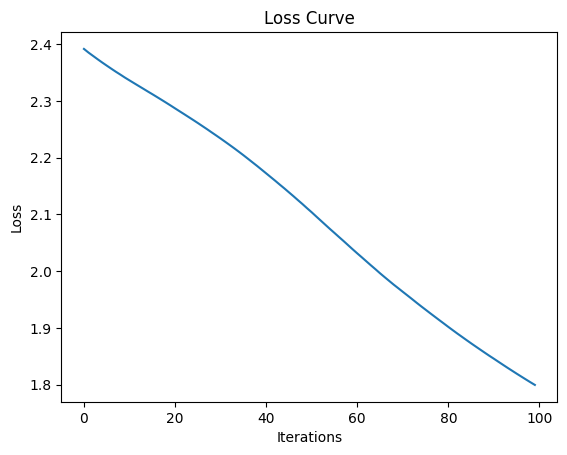

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(32, 8, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

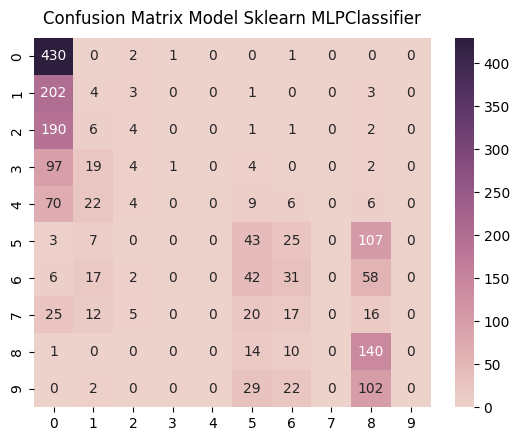

              precision    recall  f1-score      support
0.0            0.419922  0.990783  0.589849   434.000000
1.0            0.044944  0.018779  0.026490   213.000000
2.0            0.166667  0.019608  0.035088   204.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.263804  0.232432  0.247126   185.000000
6.0            0.274336  0.198718  0.230483   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.321101  0.848485  0.465890   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.352782  0.352782  0.352782     0.352782
macro avg      0.199077  0.231668  0.161043  1851.000000
weighted avg   0.234414  0.352782  0.231934  1851.000000
Mean Squared Error:  4.810913019989195


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

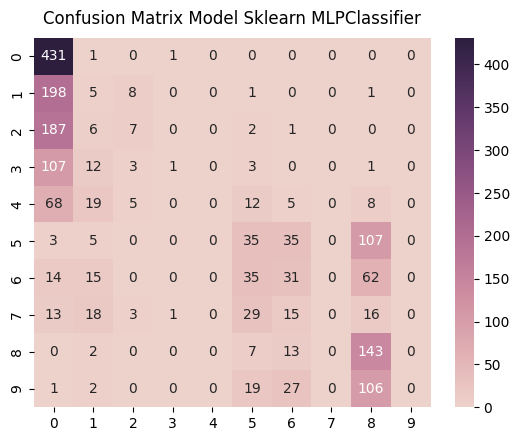

              precision    recall  f1-score      support
0.0            0.421722  0.995381  0.592440   433.000000
1.0            0.058824  0.023474  0.033557   213.000000
2.0            0.269231  0.034483  0.061135   203.000000
3.0            0.333333  0.007874  0.015385   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.244755  0.189189  0.213415   185.000000
6.0            0.244094  0.197452  0.218310   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.322072  0.866667  0.469622   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.352973  0.352973  0.352973     0.352973
macro avg      0.189403  0.231452  0.160386  1850.000000
weighted avg   0.231820  0.352973  0.232045  1850.000000
Mean Squared Error:  4.57945945945946


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

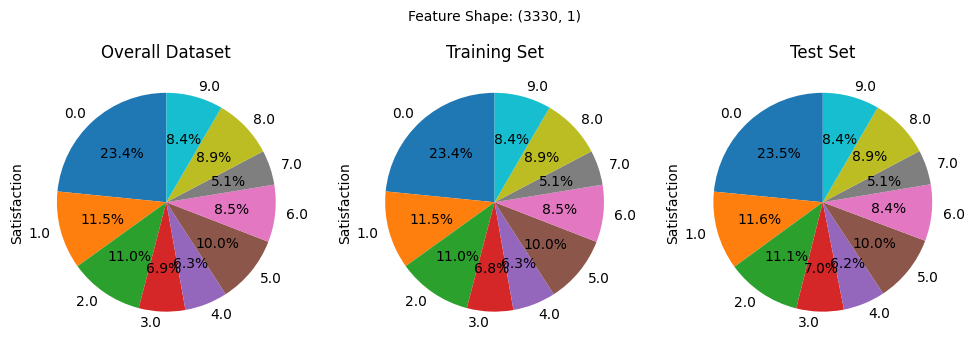

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


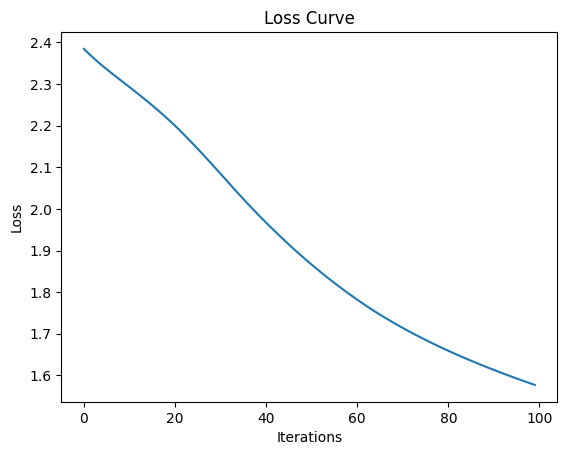

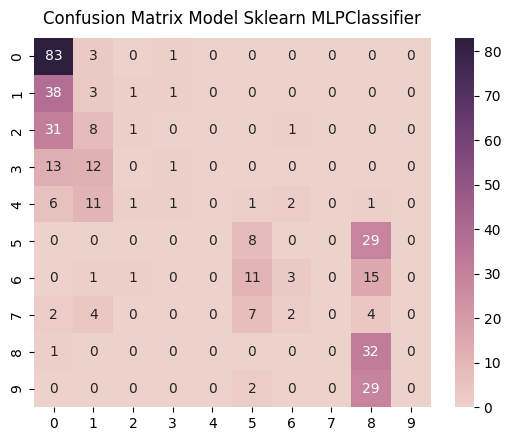

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support
0.0            0.477011  0.954023  0.636015   87.0000
1.0            0.071429  0.069767  0.070588   43.0000
2.0            0.250000  0.024390  0.044444   41.0000
3.0            0.250000  0.038462  0.066667   26.0000
4.0            0.000000  0.000000  0.000000   23.0000
5.0            0.275862  0.216216  0.242424   37.0000
6.0            0.375000  0.096774  0.153846   31.0000
7.0            0.000000  0.000000  0.000000   19.0000
8.0            0.290909  0.969697  0.447552   33.0000
9.0            0.000000  0.000000  0.000000   31.0000
accuracy       0.353100  0.353100  0.353100    0.3531
macro avg      0.199021  0.236933  0.166154  371.0000
weighted avg   0.250009  0.353100  0.243753  371.0000
Mean Squared Error:  3.684636118598383


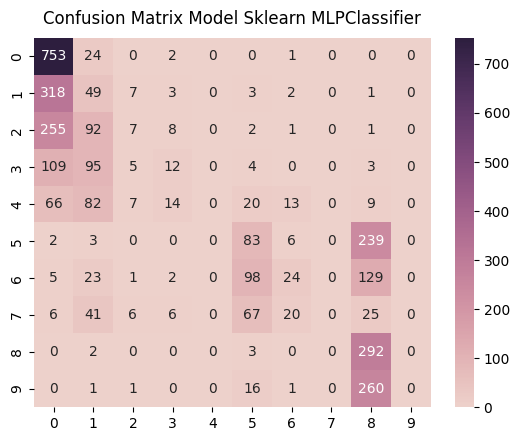

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.497358  0.965385  0.656495   780.000000
1.0            0.118932  0.127937  0.123270   383.000000
2.0            0.205882  0.019126  0.035000   366.000000
3.0            0.255319  0.052632  0.087273   228.000000
4.0            0.000000  0.000000  0.000000   211.000000
5.0            0.280405  0.249249  0.263911   333.000000
6.0            0.352941  0.085106  0.137143   282.000000
7.0            0.000000  0.000000  0.000000   171.000000
8.0            0.304484  0.983165  0.464968   297.000000
9.0            0.000000  0.000000  0.000000   279.000000
accuracy       0.366366  0.366366  0.366366     0.366366
macro avg      0.201532  0.248260  0.176806  3330.000000
weighted avg   0.255373  0.366366  0.257249  3330.000000
Mean Squared Error:  3.606906906906907


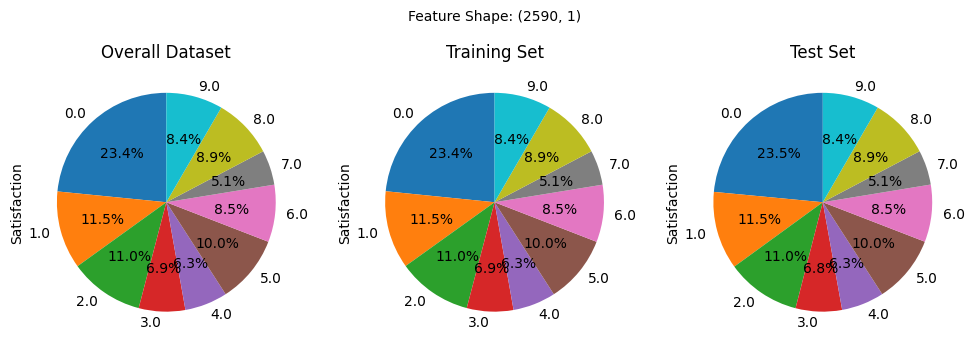

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


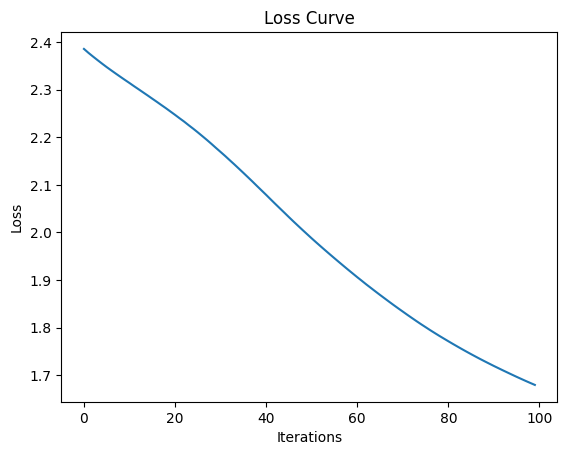

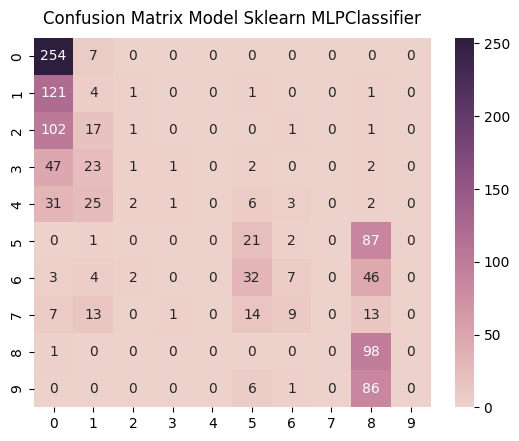

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.448763  0.973180  0.614268   261.000000
1.0            0.042553  0.031250  0.036036   128.000000
2.0            0.142857  0.008197  0.015504   122.000000
3.0            0.333333  0.013158  0.025316    76.000000
4.0            0.000000  0.000000  0.000000    70.000000
5.0            0.256098  0.189189  0.217617   111.000000
6.0            0.304348  0.074468  0.119658    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.291667  0.989899  0.450575    99.000000
9.0            0.000000  0.000000  0.000000    93.000000
accuracy       0.347435  0.347435  0.347435     0.347435
macro avg      0.181962  0.227934  0.147897  1111.000000
weighted avg   0.226144  0.347435  0.223909  1111.000000
Mean Squared Error:  3.9981998199819984


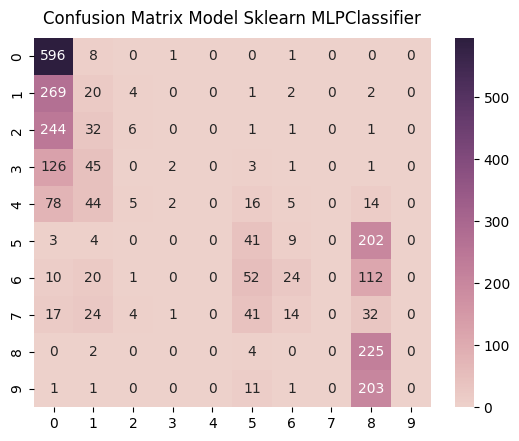

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.443452  0.983498  0.611282   606.000000
1.0            0.100000  0.067114  0.080321   298.000000
2.0            0.300000  0.021053  0.039344   285.000000
3.0            0.333333  0.011236  0.021739   178.000000
4.0            0.000000  0.000000  0.000000   164.000000
5.0            0.241176  0.158301  0.191142   259.000000
6.0            0.413793  0.109589  0.173285   219.000000
7.0            0.000000  0.000000  0.000000   133.000000
8.0            0.284091  0.974026  0.439883   231.000000
9.0            0.000000  0.000000  0.000000   217.000000
accuracy       0.352896  0.352896  0.352896     0.352896
macro avg      0.211585  0.232482  0.155700  2590.000000
weighted avg   0.255628  0.352896  0.231090  2590.000000
Mean Squared Error:  4.199613899613899


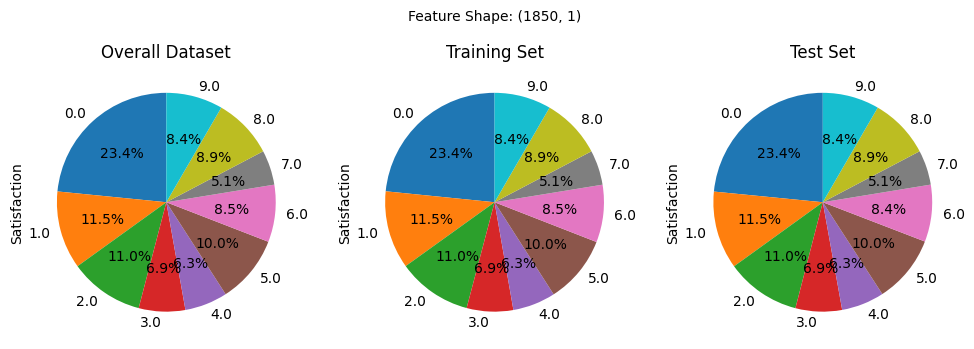

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


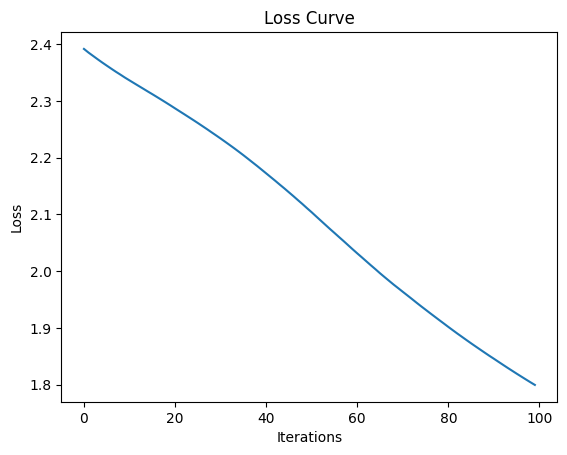

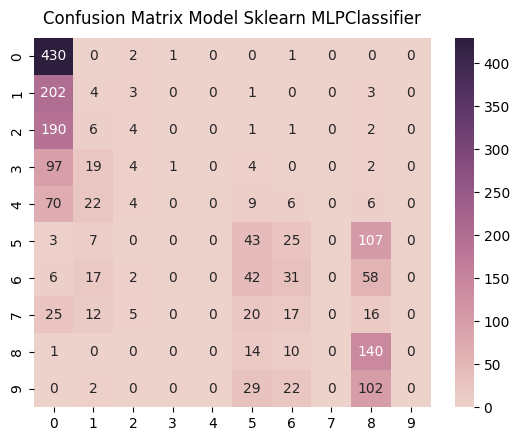

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.419922  0.990783  0.589849   434.000000
1.0            0.044944  0.018779  0.026490   213.000000
2.0            0.166667  0.019608  0.035088   204.000000
3.0            0.500000  0.007874  0.015504   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.263804  0.232432  0.247126   185.000000
6.0            0.274336  0.198718  0.230483   156.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.321101  0.848485  0.465890   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.352782  0.352782  0.352782     0.352782
macro avg      0.199077  0.231668  0.161043  1851.000000
weighted avg   0.234414  0.352782  0.231934  1851.000000
Mean Squared Error:  4.810913019989195


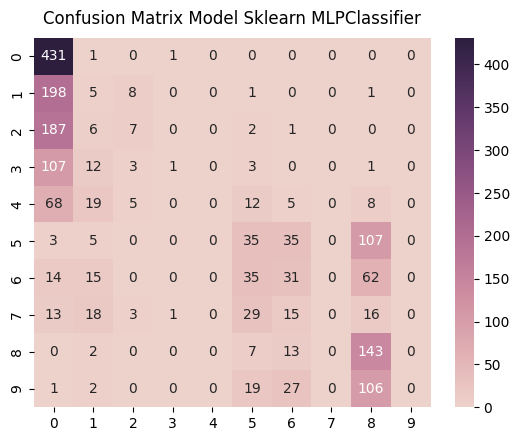

              precision    recall  f1-score      support
0.0            0.421722  0.995381  0.592440   433.000000
1.0            0.058824  0.023474  0.033557   213.000000
2.0            0.269231  0.034483  0.061135   203.000000
3.0            0.333333  0.007874  0.015385   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.244755  0.189189  0.213415   185.000000
6.0            0.244094  0.197452  0.218310   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.322072  0.866667  0.469622   165.000000
9.0            0.000000  0.000000  0.000000   155.000000
accuracy       0.352973  0.352973  0.352973     0.352973
macro avg      0.189403  0.231452  0.160386  1850.000000
weighted avg   0.231820  0.352973  0.232045  1850.000000
Mean Squared Error:  4.57945945945946


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(32, 8, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 64/16/8


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


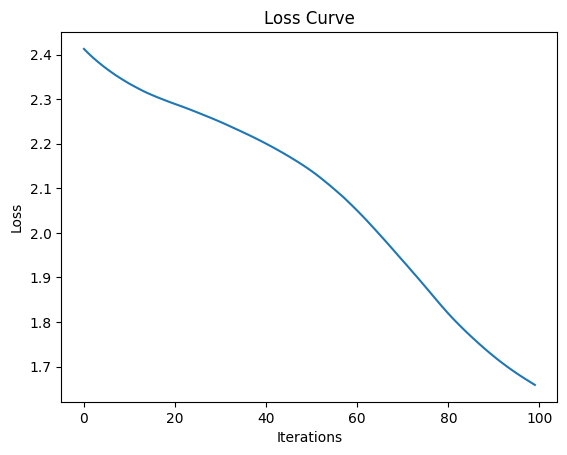

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(64, 16, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

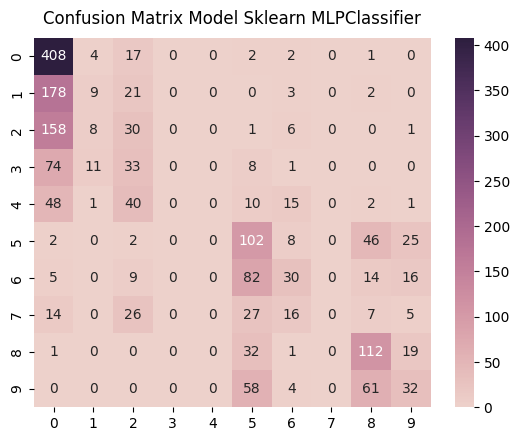

              precision    recall  f1-score    support
0.0            0.459459  0.940092  0.617247   434.0000
1.0            0.272727  0.042254  0.073171   213.0000
2.0            0.168539  0.147059  0.157068   204.0000
3.0            0.000000  0.000000  0.000000   127.0000
4.0            0.000000  0.000000  0.000000   117.0000
5.0            0.316770  0.551351  0.402367   185.0000
6.0            0.348837  0.192308  0.247934   156.0000
7.0            0.000000  0.000000  0.000000    95.0000
8.0            0.457143  0.678788  0.546341   165.0000
9.0            0.323232  0.206452  0.251969   155.0000
accuracy       0.390600  0.390600  0.390600     0.3906
macro avg      0.234671  0.275830  0.229610  1851.0000
weighted avg   0.286563  0.390600  0.301366  1851.0000
Mean Squared Error:  4.135602377093463


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

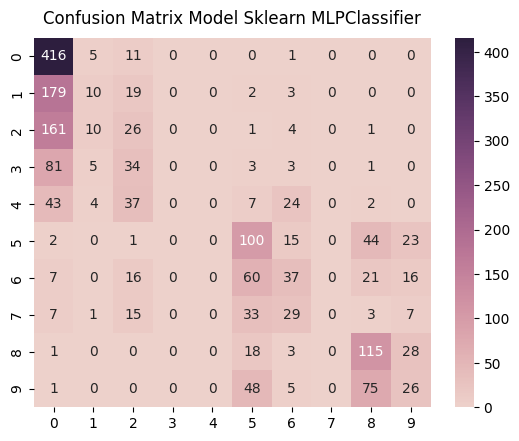

              precision    recall  f1-score      support
0.0            0.463252  0.960739  0.625094   433.000000
1.0            0.285714  0.046948  0.080645   213.000000
2.0            0.163522  0.128079  0.143646   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.367647  0.540541  0.437637   185.000000
6.0            0.298387  0.235669  0.263345   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.438931  0.696970  0.538642   165.000000
9.0            0.260000  0.167742  0.203922   155.000000
accuracy       0.394595  0.394595  0.394595     0.394595
macro avg      0.227745  0.277669  0.229293  1850.000000
weighted avg   0.282284  0.394595  0.302592  1850.000000
Mean Squared Error:  3.6875675675675677


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

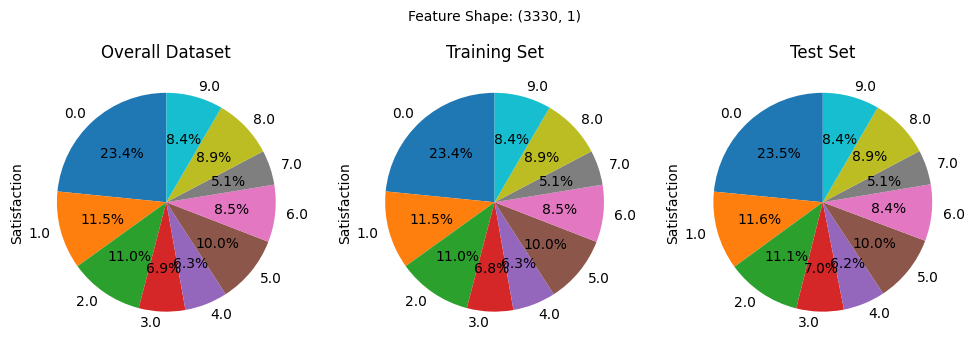

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


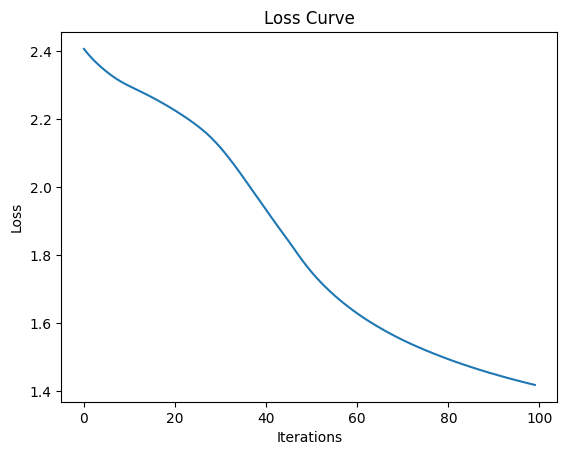

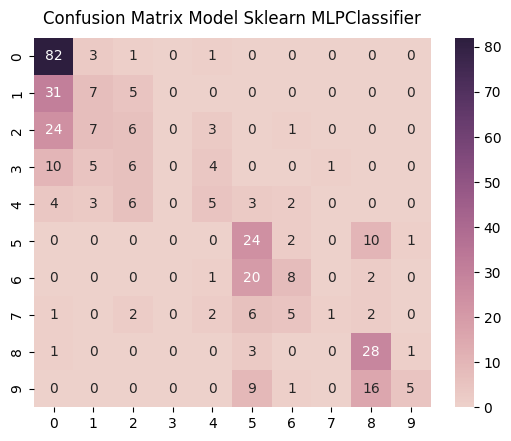

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score     support
0.0            0.535948  0.942529  0.683333   87.000000
1.0            0.280000  0.162791  0.205882   43.000000
2.0            0.230769  0.146341  0.179104   41.000000
3.0            0.000000  0.000000  0.000000   26.000000
4.0            0.312500  0.217391  0.256410   23.000000
5.0            0.369231  0.648649  0.470588   37.000000
6.0            0.421053  0.258065  0.320000   31.000000
7.0            0.500000  0.052632  0.095238   19.000000
8.0            0.482759  0.848485  0.615385   33.000000
9.0            0.714286  0.161290  0.263158   31.000000
accuracy       0.447439  0.447439  0.447439    0.447439
macro avg      0.384654  0.343817  0.308910  371.000000
weighted avg   0.403247  0.447439  0.375069  371.000000
Mean Squared Error:  2.69811320754717


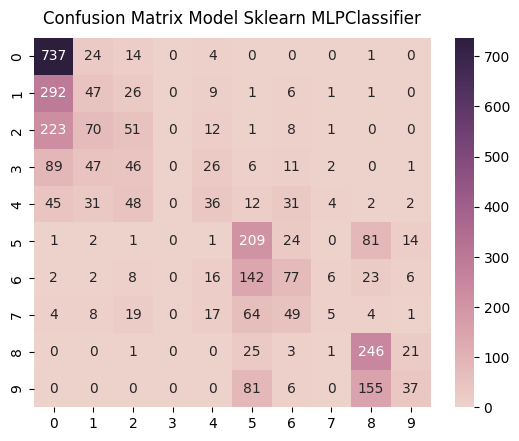

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.529074  0.944872  0.678325   780.000000
1.0            0.203463  0.122715  0.153094   383.000000
2.0            0.238318  0.139344  0.175862   366.000000
3.0            0.000000  0.000000  0.000000   228.000000
4.0            0.297521  0.170616  0.216867   211.000000
5.0            0.386322  0.627628  0.478261   333.000000
6.0            0.358140  0.273050  0.309859   282.000000
7.0            0.250000  0.029240  0.052356   171.000000
8.0            0.479532  0.828283  0.607407   297.000000
9.0            0.451220  0.132616  0.204986   279.000000
accuracy       0.433934  0.433934  0.433934     0.433934
macro avg      0.319359  0.326836  0.287702  3330.000000
weighted avg   0.354747  0.433934  0.357669  3330.000000
Mean Squared Error:  2.8840840840840842


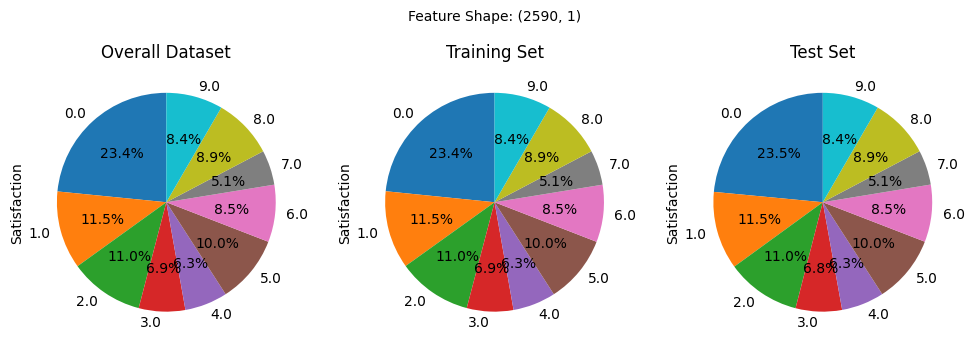

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


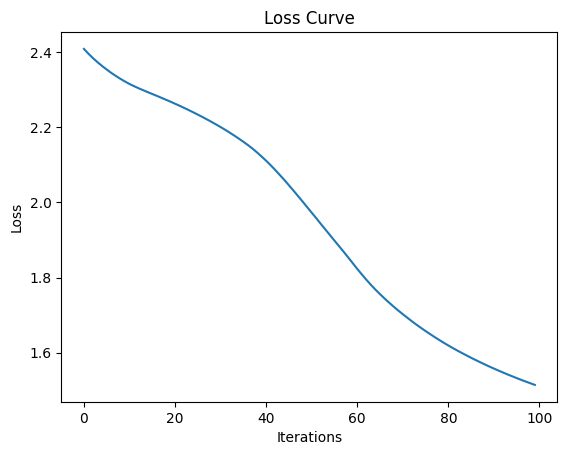

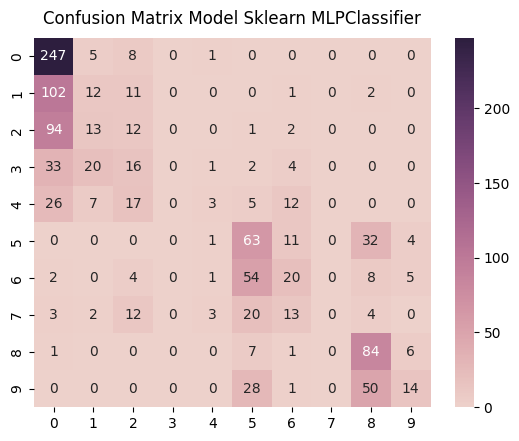

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.486220  0.946360  0.642393   261.000000
1.0            0.203390  0.093750  0.128342   128.000000
2.0            0.150000  0.098361  0.118812   122.000000
3.0            0.000000  0.000000  0.000000    76.000000
4.0            0.300000  0.042857  0.075000    70.000000
5.0            0.350000  0.567568  0.432990   111.000000
6.0            0.307692  0.212766  0.251572    94.000000
7.0            0.000000  0.000000  0.000000    57.000000
8.0            0.466667  0.848485  0.602151    99.000000
9.0            0.482759  0.150538  0.229508    93.000000
accuracy       0.409541  0.409541  0.409541     0.409541
macro avg      0.274673  0.296068  0.248077  1111.000000
weighted avg   0.316028  0.409541  0.320886  1111.000000
Mean Squared Error:  3.3114311431143113


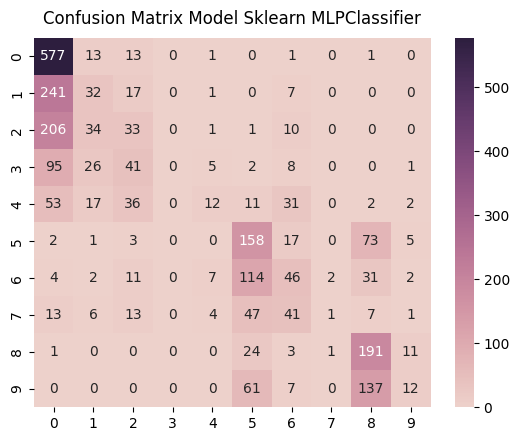

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score      support
0.0            0.484060  0.952145  0.641824   606.000000
1.0            0.244275  0.107383  0.149184   298.000000
2.0            0.197605  0.115789  0.146018   285.000000
3.0            0.000000  0.000000  0.000000   178.000000
4.0            0.387097  0.073171  0.123077   164.000000
5.0            0.377990  0.610039  0.466765   259.000000
6.0            0.269006  0.210046  0.235897   219.000000
7.0            0.250000  0.007519  0.014599   133.000000
8.0            0.432127  0.826840  0.567608   231.000000
9.0            0.352941  0.055300  0.095618   217.000000
accuracy       0.410039  0.410039  0.410039     0.410039
macro avg      0.299510  0.295823  0.244059  2590.000000
weighted avg   0.329115  0.410039  0.317206  2590.000000
Mean Squared Error:  3.3104247104247104


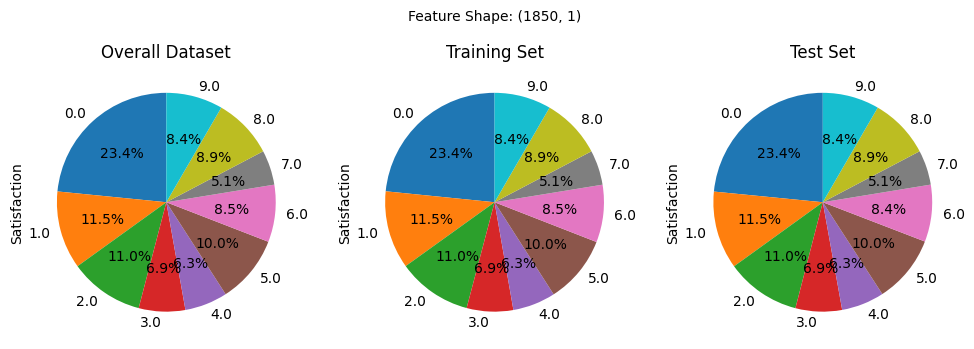

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


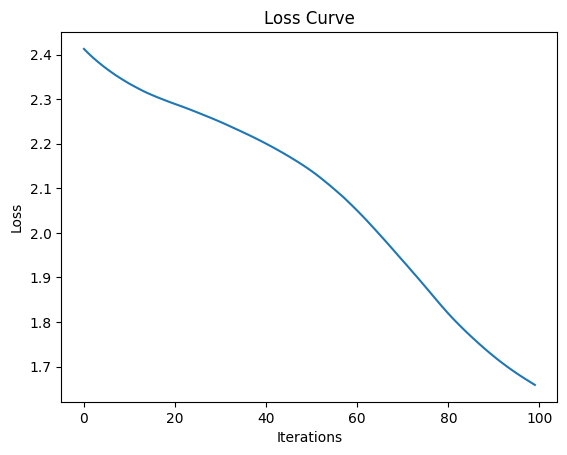

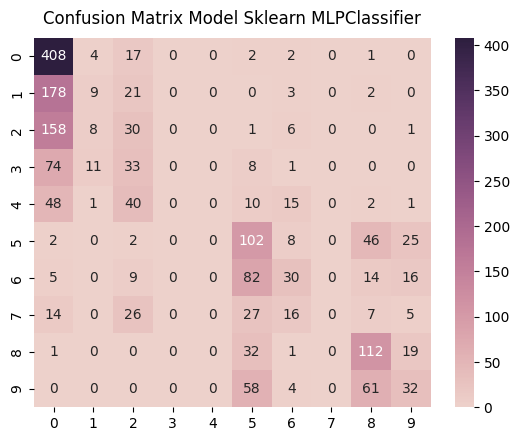

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score    support
0.0            0.459459  0.940092  0.617247   434.0000
1.0            0.272727  0.042254  0.073171   213.0000
2.0            0.168539  0.147059  0.157068   204.0000
3.0            0.000000  0.000000  0.000000   127.0000
4.0            0.000000  0.000000  0.000000   117.0000
5.0            0.316770  0.551351  0.402367   185.0000
6.0            0.348837  0.192308  0.247934   156.0000
7.0            0.000000  0.000000  0.000000    95.0000
8.0            0.457143  0.678788  0.546341   165.0000
9.0            0.323232  0.206452  0.251969   155.0000
accuracy       0.390600  0.390600  0.390600     0.3906
macro avg      0.234671  0.275830  0.229610  1851.0000
weighted avg   0.286563  0.390600  0.301366  1851.0000
Mean Squared Error:  4.135602377093463


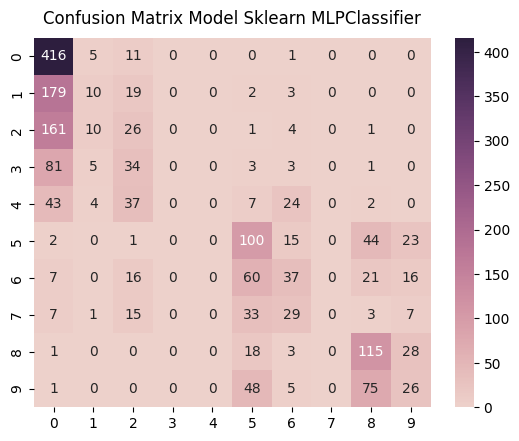

              precision    recall  f1-score      support
0.0            0.463252  0.960739  0.625094   433.000000
1.0            0.285714  0.046948  0.080645   213.000000
2.0            0.163522  0.128079  0.143646   203.000000
3.0            0.000000  0.000000  0.000000   127.000000
4.0            0.000000  0.000000  0.000000   117.000000
5.0            0.367647  0.540541  0.437637   185.000000
6.0            0.298387  0.235669  0.263345   157.000000
7.0            0.000000  0.000000  0.000000    95.000000
8.0            0.438931  0.696970  0.538642   165.000000
9.0            0.260000  0.167742  0.203922   155.000000
accuracy       0.394595  0.394595  0.394595     0.394595
macro avg      0.227745  0.277669  0.229293  1850.000000
weighted avg   0.282284  0.394595  0.302592  1850.000000
Mean Squared Error:  3.6875675675675677


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(64, 16, 8), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))



### 128/32/16

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


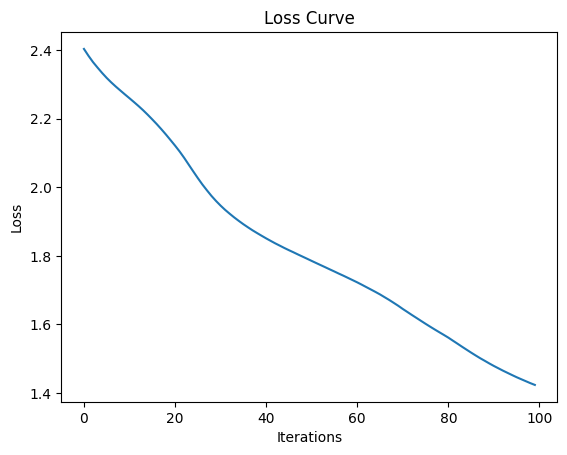

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 32, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
mlp.fit(x_train, y_train)
predict = mlp.predict(x_test)

plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [ ]:
def plot_cm(matrix, title):
    ax = plt.subplot()
    sns.heatmap(matrix, annot=True, fmt='g', ax=ax, cmap=sns.cubehelix_palette(as_cmap=True))

    ax.set_title(f'Confusion Matrix {title}', pad=10);
    plt.show()

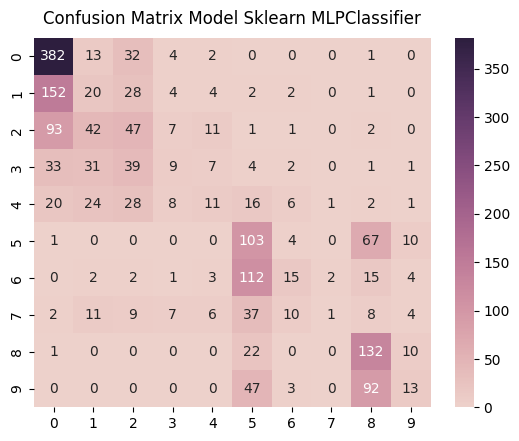

              precision    recall  f1-score      support
0.0            0.558480  0.880184  0.683363   434.000000
1.0            0.139860  0.093897  0.112360   213.000000
2.0            0.254054  0.230392  0.241645   204.000000
3.0            0.225000  0.070866  0.107784   127.000000
4.0            0.250000  0.094017  0.136646   117.000000
5.0            0.299419  0.556757  0.389414   185.000000
6.0            0.348837  0.096154  0.150754   156.000000
7.0            0.250000  0.010526  0.020202    95.000000
8.0            0.411215  0.800000  0.543210   165.000000
9.0            0.302326  0.083871  0.131313   155.000000
accuracy       0.396002  0.396002  0.396002     0.396002
macro avg      0.303919  0.291666  0.251669  1851.000000
weighted avg   0.340408  0.396002  0.327901  1851.000000
Mean Squared Error:  3.1534305780659104


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error

confussion_matrix = confusion_matrix(y_test, predict)
plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

model1_report = classification_report(y_test, predict, output_dict=True)
print(pd.DataFrame(model1_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_test, predict))

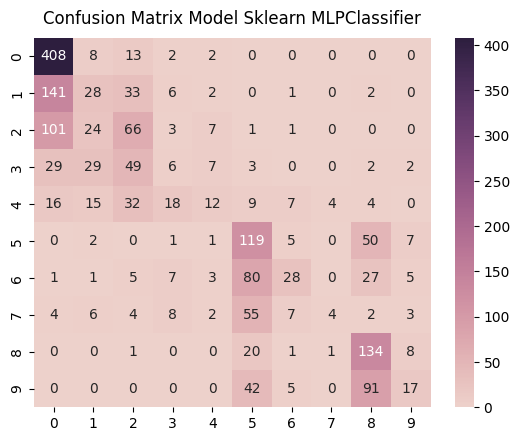

              precision    recall  f1-score      support
0.0            0.582857  0.942263  0.720212   433.000000
1.0            0.247788  0.131455  0.171779   213.000000
2.0            0.325123  0.325123  0.325123   203.000000
3.0            0.117647  0.047244  0.067416   127.000000
4.0            0.333333  0.102564  0.156863   117.000000
5.0            0.361702  0.643243  0.463035   185.000000
6.0            0.509091  0.178344  0.264151   157.000000
7.0            0.444444  0.042105  0.076923    95.000000
8.0            0.429487  0.812121  0.561845   165.000000
9.0            0.404762  0.109677  0.172589   155.000000
accuracy       0.444324  0.444324  0.444324     0.444324
macro avg      0.375623  0.333414  0.297994  1850.000000
weighted avg   0.404197  0.444324  0.375812  1850.000000
Mean Squared Error:  2.790810810810811


In [ ]:
predict = mlp.predict(x_train)

confusion_matrix_result = confusion_matrix(y_train, predict)
plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

model_report = classification_report(y_train, predict, output_dict=True)
print(pd.DataFrame(model_report).transpose())

print("Mean Squared Error: ", mean_squared_error(y_train, predict))

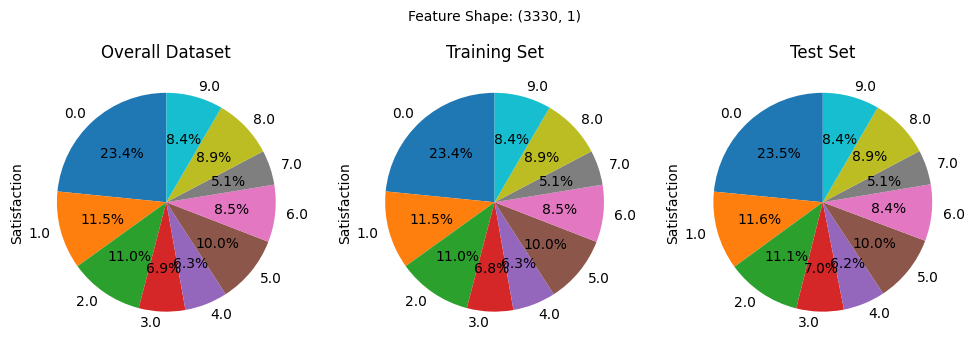

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


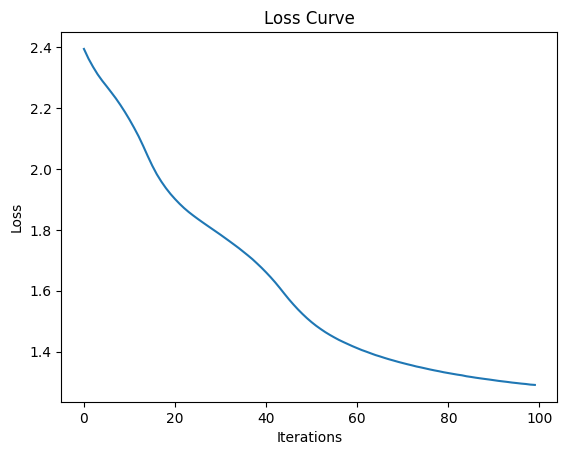

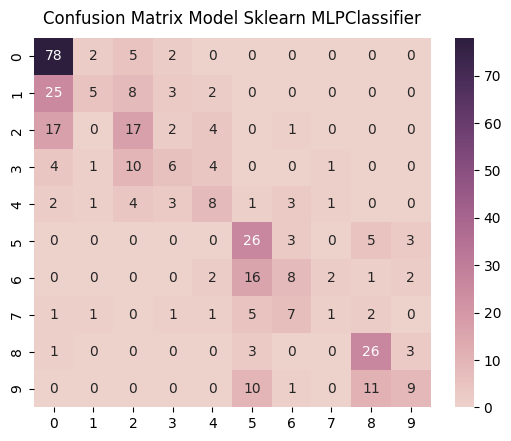

              precision    recall  f1-score     support
0.0            0.609375  0.896552  0.725581   87.000000
1.0            0.500000  0.116279  0.188679   43.000000
2.0            0.386364  0.414634  0.400000   41.000000
3.0            0.352941  0.230769  0.279070   26.000000
4.0            0.380952  0.347826  0.363636   23.000000
5.0            0.426230  0.702703  0.530612   37.000000
6.0            0.347826  0.258065  0.296296   31.000000
7.0            0.200000  0.052632  0.083333   19.000000
8.0            0.577778  0.787879  0.666667   33.000000
9.0            0.529412  0.290323  0.375000   31.000000
accuracy       0.495957  0.495957  0.495957    0.495957
macro avg      0.431088  0.409766  0.390888  371.000000
weighted avg   0.469344  0.495957  0.450901  371.000000
Mean Squared Error:  2.463611859838275


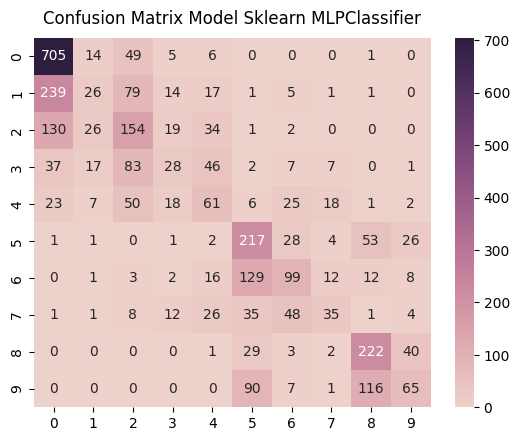

              precision    recall  f1-score      support
0.0            0.620599  0.903846  0.735908   780.000000
1.0            0.279570  0.067885  0.109244   383.000000
2.0            0.361502  0.420765  0.388889   366.000000
3.0            0.282828  0.122807  0.171254   228.000000
4.0            0.291866  0.289100  0.290476   211.000000
5.0            0.425490  0.651652  0.514828   333.000000
6.0            0.441964  0.351064  0.391304   282.000000
7.0            0.437500  0.204678  0.278884   171.000000
8.0            0.545455  0.747475  0.630682   297.000000
9.0            0.445205  0.232975  0.305882   279.000000
accuracy       0.484084  0.484084  0.484084     0.484084
macro avg      0.413198  0.399225  0.381735  3330.000000
weighted avg   0.443504  0.484084  0.438633  3330.000000
Mean Squared Error:  2.375975975975976


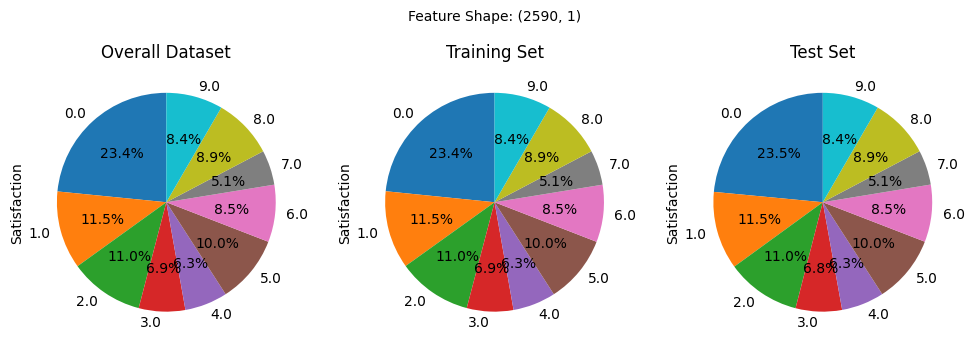

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


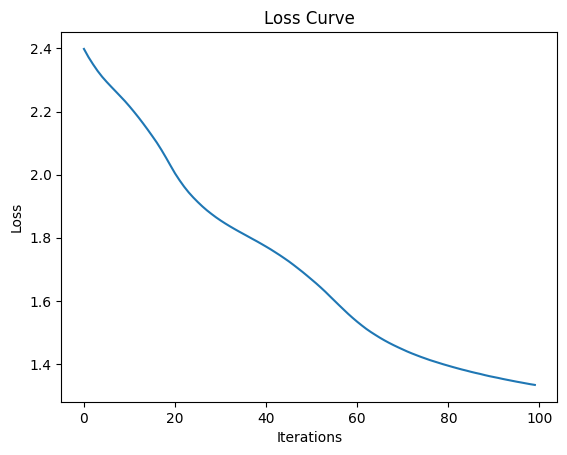

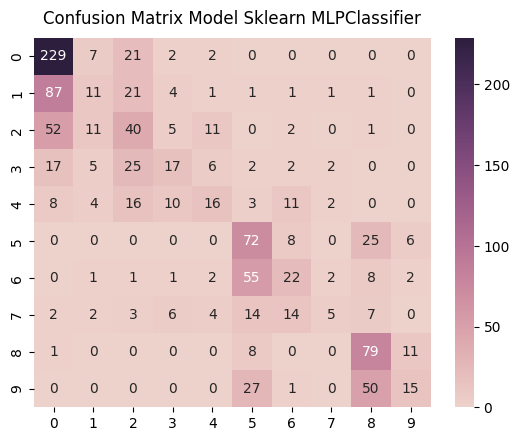

              precision    recall  f1-score      support
0.0            0.578283  0.877395  0.697108   261.000000
1.0            0.268293  0.085938  0.130178   128.000000
2.0            0.314961  0.327869  0.321285   122.000000
3.0            0.377778  0.223684  0.280992    76.000000
4.0            0.380952  0.228571  0.285714    70.000000
5.0            0.395604  0.648649  0.491468   111.000000
6.0            0.360656  0.234043  0.283871    94.000000
7.0            0.416667  0.087719  0.144928    57.000000
8.0            0.461988  0.797980  0.585185    99.000000
9.0            0.441176  0.161290  0.236220    93.000000
accuracy       0.455446  0.455446  0.455446     0.455446
macro avg      0.399636  0.367314  0.345695  1111.000000
weighted avg   0.420708  0.455446  0.403744  1111.000000
Mean Squared Error:  2.5985598559855987


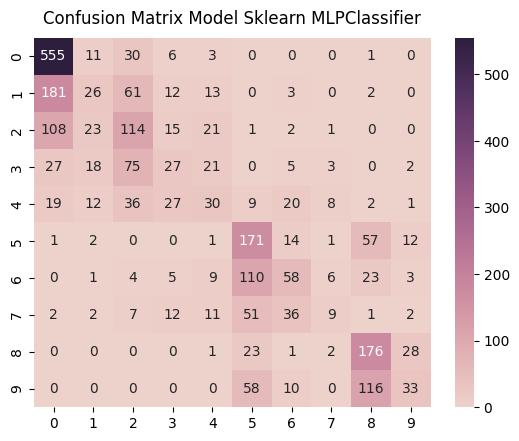

              precision    recall  f1-score      support
0.0            0.621501  0.915842  0.740494   606.000000
1.0            0.273684  0.087248  0.132316   298.000000
2.0            0.348624  0.400000  0.372549   285.000000
3.0            0.259615  0.151685  0.191489   178.000000
4.0            0.272727  0.182927  0.218978   164.000000
5.0            0.404255  0.660232  0.501466   259.000000
6.0            0.389262  0.264840  0.315217   219.000000
7.0            0.300000  0.067669  0.110429   133.000000
8.0            0.465608  0.761905  0.577997   231.000000
9.0            0.407407  0.152074  0.221477   217.000000
accuracy       0.462934  0.462934  0.462934     0.462934
macro avg      0.374268  0.364442  0.338241  2590.000000
weighted avg   0.414787  0.462934  0.409081  2590.000000
Mean Squared Error:  2.446332046332046


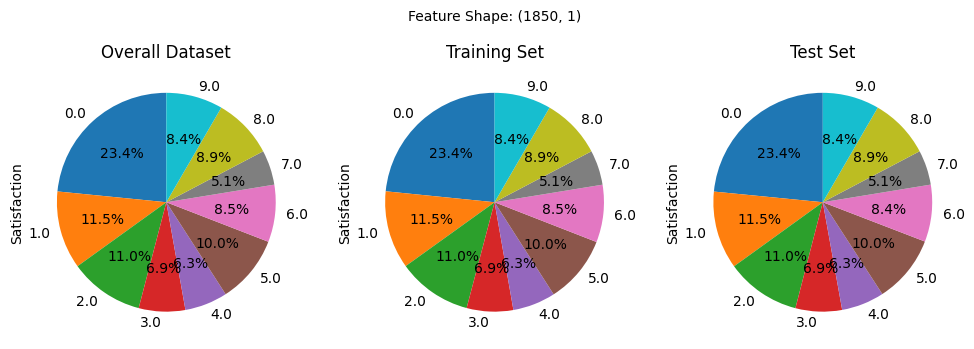

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


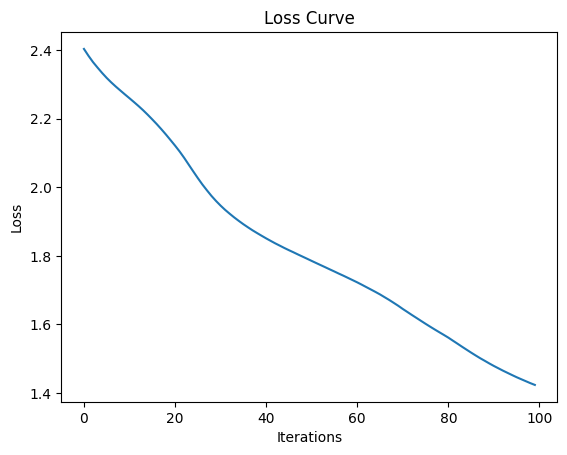

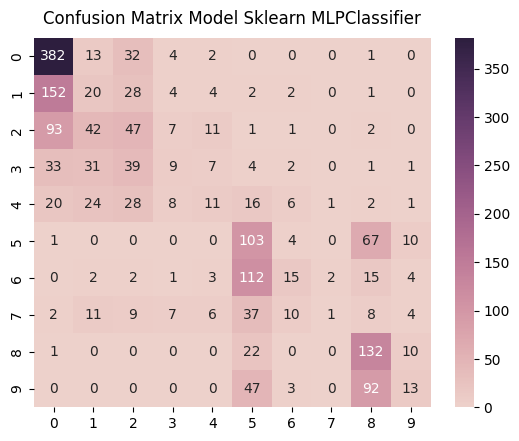

              precision    recall  f1-score      support
0.0            0.558480  0.880184  0.683363   434.000000
1.0            0.139860  0.093897  0.112360   213.000000
2.0            0.254054  0.230392  0.241645   204.000000
3.0            0.225000  0.070866  0.107784   127.000000
4.0            0.250000  0.094017  0.136646   117.000000
5.0            0.299419  0.556757  0.389414   185.000000
6.0            0.348837  0.096154  0.150754   156.000000
7.0            0.250000  0.010526  0.020202    95.000000
8.0            0.411215  0.800000  0.543210   165.000000
9.0            0.302326  0.083871  0.131313   155.000000
accuracy       0.396002  0.396002  0.396002     0.396002
macro avg      0.303919  0.291666  0.251669  1851.000000
weighted avg   0.340408  0.396002  0.327901  1851.000000
Mean Squared Error:  3.1534305780659104


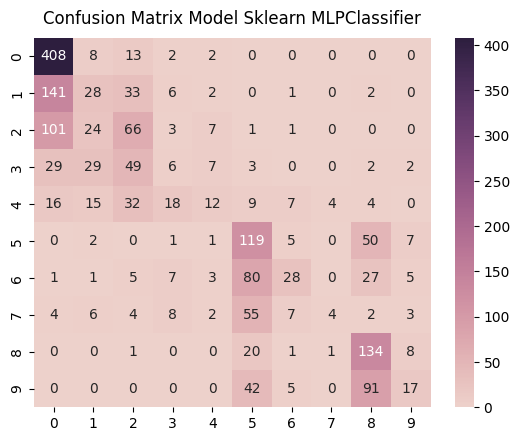

              precision    recall  f1-score      support
0.0            0.582857  0.942263  0.720212   433.000000
1.0            0.247788  0.131455  0.171779   213.000000
2.0            0.325123  0.325123  0.325123   203.000000
3.0            0.117647  0.047244  0.067416   127.000000
4.0            0.333333  0.102564  0.156863   117.000000
5.0            0.361702  0.643243  0.463035   185.000000
6.0            0.509091  0.178344  0.264151   157.000000
7.0            0.444444  0.042105  0.076923    95.000000
8.0            0.429487  0.812121  0.561845   165.000000
9.0            0.404762  0.109677  0.172589   155.000000
accuracy       0.444324  0.444324  0.444324     0.444324
macro avg      0.375623  0.333414  0.297994  1850.000000
weighted avg   0.404197  0.444324  0.375812  1850.000000
Mean Squared Error:  2.790810810810811


In [ ]:
config = [0.1, 0.3, 0.5]

for i in config:
    x_train, x_test, y_train, y_test = train_test_split(features, label, test_size=i, random_state=42, stratify=label)
    s_train = pd.DataFrame(y_train, columns=['Satisfaction'])
    s_test = pd.DataFrame(y_test, columns=['Satisfaction'])

    sorted_train = s_train['Satisfaction'].value_counts().sort_index()
    sorted_test = s_test['Satisfaction'].value_counts().sort_index()
    sorted_data = data['Satisfaction'].value_counts().sort_index()

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 2)
    plt.title('Training Set')
    plt.text(0, 1.7, f'Feature Shape: {s_train.shape}', horizontalalignment='center', verticalalignment='center')
    sorted_train.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 3)
    plt.title('Test Set')
    sorted_test.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.subplot(1, 3, 1)
    plt.title('Overall Dataset')
    sorted_data.plot.pie(autopct='%1.1f%%', startangle=90)

    plt.show()

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.transform(x_test)

    x_train = pd.DataFrame(x_train)
    x_test = pd.DataFrame(x_test)

    correlation_matrix = pd.DataFrame(x_train).corr()

    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]

    x_train = x_train.drop(x_train.columns[to_drop], axis=1)
    x_test = x_test.drop(x_test.columns[to_drop], axis=1)

    #! edit mulai disini
    mlp = MLPClassifier(hidden_layer_sizes=(128, 32, 16), max_iter=100, activation='relu', solver='adam', random_state=42, learning_rate_init=0.0001, learning_rate='constant')
    mlp.fit(x_train, y_train)
    #! sampe sini

    plt.plot(mlp.loss_curve_)
    plt.title('Loss Curve')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.show()

    predict = mlp.predict(x_test)
    confussion_matrix = confusion_matrix(y_test, predict)
    plot_cm(confussion_matrix, 'Model Sklearn MLPClassifier')

    model1_report = classification_report(y_test, predict, output_dict=True)
    print(pd.DataFrame(model1_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_test, predict))

    predict = mlp.predict(x_train)
    confusion_matrix_result = confusion_matrix(y_train, predict)
    plot_cm(confusion_matrix_result, 'Model Sklearn MLPClassifier')

    model_report = classification_report(y_train, predict, output_dict=True)
    print(pd.DataFrame(model_report).transpose())

    print("Mean Squared Error: ", mean_squared_error(y_train, predict))

